## CLustering pipeline

- Run on the 3hvc protein



In [1]:
# Define data path
data_path = "/Users/nicha/dev/Protein-preparation-pipeline/data/toy_examples_clustering"

# System and OS utilities
import os
import sys

# Numerical and Data Processing
import numpy as np
import pandas as pd

# Scientific and Bioinformatics Tools
from math import e
from pymol import cmd, stored
import numpy as np
from Bio import PDB
from scipy.spatial import distance_matrix, KDTree
from scipy.stats import shapiro
from joblib import Parallel, delayed
from tqdm import tqdm
from itertools import combinations, product


# Machine Learning & Clustering
from sklearn.cluster import KMeans, SpectralClustering
from sklearn.preprocessing import MinMaxScaler, StandardScaler
from sklearn.metrics import silhouette_score
from sklearn.metrics.pairwise import euclidean_distances

# Visualization
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import py3Dmol

# Color Mapping for Visualization
import matplotlib.cm as cm
import matplotlib.colors as mcolors
from matplotlib.colors import Normalize
from mpl_toolkits.mplot3d import Axes3D

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans, SpectralClustering
from sklearn.metrics import silhouette_score
from sklearn.mixture import GaussianMixture
from sklearn.preprocessing import StandardScaler, MinMaxScaler
from scipy.linalg import eigh
from scipy.sparse.csgraph import laplacian
from sklearn.neighbors import kneighbors_graph


# Add project-specific source path
sys.path.append('/Users/nicha/dev/Protein-preparation-pipeline/src/')

# Custom Modules from Your Project
from pdb_retrival.data_retriever import PDBDataRetriever

In [2]:
# Function for the data preparation

# 1️⃣ Extract residue coordinates from PDB
def extract_residue_coordinates(pdb_file, residue_number, chain_id="A"):
    """
    Extracts atomic coordinates for a given residue from a PDB file.

    Args:
        pdb_file (str): Path to the PDB file.
        residue_number (int): Residue number to extract.
        chain_id (str): Chain ID of the residue.

    Returns:
        list: List of tuples (atom_type, x, y, z).
    """
    coordinates = []
    try:
        with open(pdb_file, "r") as file:
            for line in file:
                if line.startswith(("ATOM", "HETATM")) and line[21] == chain_id:
                    resi = int(line[22:26].strip())
                    if resi == residue_number:
                        atom_type = line[76:78].strip()
                        x = float(line[30:38].strip())
                        y = float(line[38:46].strip())
                        z = float(line[46:54].strip())
                        coordinates.append((atom_type, x, y, z))
    except FileNotFoundError:
        print(f"Error: File {pdb_file} not found.")
    except Exception as e:
        print(f"Unexpected error: {e}")
    return coordinates


# 2️⃣ Compute Weighted Center of Mass
def calculate_weighted_center_of_mass(coordinates):
    """
    Calculates the weighted center of mass for a given set of atomic coordinates.

    Args:
        coordinates (list): List of tuples (atom_type, x, y, z).

    Returns:
        list: [x, y, z] coordinates of the weighted center of mass.
    """
    total_weight = 0
    weighted_coords = np.zeros(3)
    atomic_weights = {"H": 1.008, "C": 12.011, "N": 14.007, "O": 15.999, "S": 32.06}

    for atom_type, x, y, z in coordinates:
        weight = atomic_weights.get(atom_type.upper(), 1.0)
        weighted_coords += np.array([x, y, z]) * weight
        total_weight += weight

    return np.round(weighted_coords / total_weight, 3).tolist()


# 3️⃣ Process a Single PDB File and Update the DataFrame
def process_pdb_file(data_path, pdb_code, df):
    """
    Reads a PDB file and updates a DataFrame with residue center of mass.

    Args:
        data_path (str): Path to the directory containing the PDB and CSV files.
        pdb_code (str): PDB code of the protein.
        df (pd.DataFrame): DataFrame containing residue data.

    Returns:
        pd.DataFrame: Updated DataFrame with center of mass information.
    """
    pdb_file = os.path.join(data_path, f"{pdb_code}.pdb")

    try:
        for index, row in df.iterrows():
            residue_number = row["resi"]
            chain_id = row["chain"]
            coordinates = extract_residue_coordinates(pdb_file, residue_number, chain_id)
            if coordinates:
                center_of_mass = calculate_weighted_center_of_mass(coordinates)
                df.loc[index, "resn_coordinates"] = str(coordinates)
                df.loc[index, ["center_of_mass_x", "center_of_mass_y", "center_of_mass_z"]] = center_of_mass
            else:
                print(f"Residue {residue_number} in chain {chain_id} not found in {pdb_file}.")
    except FileNotFoundError:
        print(f"Error: {pdb_file} not found.")
    except Exception as e:
        print(f"Unexpected error: {e}")

    return df


# 4️⃣ Process and Update Data for a Single PDB Structure
def process_and_update_pdb_data(data_path, pdb_code):
    """
    Reads and processes a PDB file and corresponding CSV file to update residue information.

    Args:
        data_path (str): Path to the directory containing the PDB and CSV files.
        pdb_code (str): PDB code of the protein.

    Returns:
        pd.DataFrame: Updated DataFrame with residue information.
    """
    csv_file_path = f"{data_path}/results_{pdb_code}.csv"

    try:
        df = pd.read_csv(csv_file_path)
        df_updated = process_pdb_file(data_path, pdb_code, df)
        df_updated.to_csv(f"{data_path}/results_{pdb_code}_updated.csv", index=False)
        return df_updated
    except Exception as e:
        print(f"Error processing {pdb_code}: {e}")
        return None


# 5️⃣ Process All PDB Files in a Directory
def process_all_pdb_files(data_path):
    """
    Process all PDB-related files in the given directory and combine results.

    Args:
        data_path (str): Path to the directory containing the PDB and CSV files.

    Returns:
        pd.DataFrame: Combined DataFrame with all processed data.
    """
    combined_df = pd.DataFrame()

    for file in os.listdir(data_path):
        if file.startswith("results_") and file.endswith(".csv"):
            pdb_code = file.split("_")[1].split(".")[0]
            updated_df = process_and_update_pdb_data(data_path, pdb_code)
            if updated_df is not None:
                updated_df["PDBcode"] = pdb_code
                combined_df = pd.concat([combined_df, updated_df], ignore_index=True)

    combined_df.drop_duplicates(inplace=True)
    combined_df.to_csv(f"{data_path}/combined_results.csv", index=False)
    return combined_df


# 6️⃣ Compute Center of Protein Using PyMOL
def calculate_center_of_mass_pymol(pdb_file):
    """
    Calculates the center of mass of a protein using PyMOL.

    Args:
        pdb_file (str): Path to the PDB file.

    Returns:
        tuple: (x, y, z) coordinates of the protein's center of mass.
    """
    cmd.load(pdb_file, "protein")
    center_of_mass = cmd.centerofmass("protein")
    cmd.delete("all")
    return round(center_of_mass[0], 3), round(center_of_mass[1], 3), round(center_of_mass[2], 3)


# 7️⃣ Compute Protein Diameter
def calculate_protein_diameter(df):
    """
    Computes the diameter of a protein, defined as the maximum distance between residues.

    Args:
        df (pd.DataFrame): DataFrame containing residue data with center of mass coordinates.

    Returns:
        float: Maximum distance between residues.
    """
    coordinates = df[['center_of_mass_x', 'center_of_mass_y', 'center_of_mass_z']].values
    distances = np.linalg.norm(coordinates[:, np.newaxis] - coordinates, axis=2)
    return round(np.max(distances), 3)


# 8️⃣ Process Protein Data for a Single PDB
def process_protein_data(pdb_code, dfs, data_path):
    """
    Processes protein data by computing center of mass and diameter.

    Args:
        pdb_code (str): The PDB code of the protein.
        dfs (dict): Dictionary containing DataFrames indexed by PDB code.
        data_path (str): Path to the directory containing the PDB files.

    Returns:
        pd.DataFrame: Updated DataFrame with center of protein and diameter.
    """
    pdb_file_path = f"{data_path}/{pdb_code}.pdb"
    df = dfs[pdb_code]
    center_of_mass = calculate_center_of_mass_pymol(pdb_file_path)
    protein_diameter = calculate_protein_diameter(df)

    df["protein_x"], df["protein_y"], df["protein_z"] = center_of_mass
    df["protein_diameter"] = protein_diameter

    return df



def normalize_features(df, feature_columns):
    """
    Normalize or standardize features based on their distribution.

    - **Standardizes (Z-score) if normally distributed**.
    - **Normalizes (Min-Max) if not normally distributed**.
    - **Adds new columns instead of replacing existing ones**.
    - **Stores scalers for consistent transformation in clustering**.

    Args:
        df (pd.DataFrame): DataFrame containing features.
        feature_columns (list): List of feature column names (e.g., 3D coordinates).

    Returns:
        pd.DataFrame: DataFrame with added transformed feature columns.
        dict: Dictionary of fitted scalers (for later reuse).
    """
    processed_df = df.copy()
    scalers = {}

    for col in feature_columns:
        scaler = MinMaxScaler()  # Normalization
        new_col_name = f"{col}_normalized"

        processed_df[new_col_name] = scaler.fit_transform(df[[col]])  # Apply transformation
        scalers[col] = scaler  # Store scaler for reuse

    return processed_df, scalers


def weighted_pbind(df, pbind_column='p(bind)', weights=[1.0]):
    """
    Normalize and apply multiple weight factors to p(bind).

    - **Scales p(bind) between 0 and 1**.
    - **Applies multiple weight factors** to create additional columns.
    - **Adds new columns instead of replacing p(bind)**.
    - **Stores scaler** for reuse in clustering.

    Args:
        df (pd.DataFrame): DataFrame containing p(bind).
        pbind_column (str): Column name for p(bind).
        weights (list): List of weight multipliers (e.g., [1.0, 5.0, 10.0, 100.0]).

    Returns:
        pd.DataFrame: DataFrame with weighted p(bind) columns.
        dict: Dictionary of fitted scalers.
    """
    processed_df = df.copy()
    scalers = {}

    if pbind_column in df.columns:
        scaler = MinMaxScaler()
        normalized_pbind = scaler.fit_transform(df[[pbind_column]])  # Scale to 0-1
        scalers[pbind_column] = scaler  # Store scaler

        for weight in weights:
            weighted_col_name = f"{pbind_column}_weight_{weight}"
            processed_df[weighted_col_name] = normalized_pbind * weight  # Apply weight

    return processed_df, scalers
    """
    Normalize and apply multiple weight factors to p(bind).

    - **Scales p(bind) between 0 and 1**.
    - **Applies multiple weight factors** to create additional columns.
    - **Stores scaler** for reuse in clustering.

    Args:
        df (pd.DataFrame): DataFrame containing p(bind).
        pbind_column (str): Column name for p(bind).
        weights (list): List of weight multipliers (e.g., [1.0, 1.5, 2.0]).

    Returns:
        pd.DataFrame: DataFrame with weighted p(bind) columns.
        dict: Dictionary of fitted scalers.
    """
    processed_df = df.copy()
    scalers = {}

    if pbind_column in df.columns:
        scaler = MinMaxScaler()
        normalized_pbind = scaler.fit_transform(df[[pbind_column]])  # Scale to 0-1
        scalers[pbind_column] = scaler  # Store scaler

        for weight in weights:
            weighted_col_name = f"{pbind_column}_weight_{weight}"
            processed_df[weighted_col_name] = normalized_pbind * weight  # Apply weight

    return processed_df, scalers


In [3]:
# Function to evaluate the clustering performance
def calculate_protein_center_of_mass(pdb_file):
    """
    Calculate the center of mass of the entire protein using PyMOL.

    Args:
        pdb_file (str): Path to the PDB file.

    Returns:
        tuple: Center of mass coordinates (x, y, z).
    """
    cmd.load(pdb_file, "protein")
    center_of_mass = cmd.centerofmass("protein")
    cmd.delete("all")  # Clear the loaded structure
    return tuple(round(coord, 3) for coord in center_of_mass)

def calculate_cluster_centers(df, cluster_column, pdb_file):
    """
    Calculate the center of mass for each cluster using PyMOL.

    Args:
        df (pd.DataFrame): DataFrame containing residue and cluster information.
        cluster_column (str): Column name containing cluster IDs.
        pdb_file (str): Path to the PDB file.

    Returns:
        dict: Cluster IDs as keys and their center of mass coordinates as values.
    """
    cmd.load(pdb_file, "protein")
    cluster_centers = {}
    clusters = df[cluster_column].unique()

    for cluster_id in clusters:
        cluster_data = df[df[cluster_column] == cluster_id]
        resi_selection = "+".join(map(str, cluster_data['resi']))
        cmd.select(f"cluster_{cluster_id}", f"resi {resi_selection}")
        center_of_mass = cmd.centerofmass(f"cluster_{cluster_id}")
        cluster_centers[cluster_id] = tuple(round(coord, 3) for coord in center_of_mass)
        cmd.delete(f"cluster_{cluster_id}")

    cmd.delete("all")  # Clear the loaded structure
    return cluster_centers

def calculate_ligand_centers_slow(pdb_file):
    """
    Calculate the center of mass for each ligand in the structure using PyMOL.

    Args:
        pdb_file (str): Path to the PDB file.

    Returns:
        dict: Ligand identifiers as keys and their center of mass coordinates as values.
    """
    cmd.load(pdb_file, "protein")
    cmd.select("ligands", "organic")
    ligand_centers = {}

    for atom in cmd.get_model("ligands").atom:
        ligand_id = f"{atom.chain}_{atom.resn}_{atom.resi}"
        cmd.select("ligand", f"chain {atom.chain} and resn {atom.resn} and resi {atom.resi}")
        center_of_mass = cmd.centerofmass("ligand")
        ligand_centers[ligand_id] = tuple(round(coord, 3) for coord in center_of_mass)
        cmd.delete("ligand")  # Clear the selection

    cmd.delete("all")  # Clear the loaded structure
    return ligand_centers


def calculate_ligand_centers(pdb_file):
    """
    Calculate the center of mass for each ligand in the structure using PyMOL.

    Args:
        pdb_file (str): Path to the PDB file.

    Returns:
        dict: Ligand identifiers as keys and their center of mass coordinates as values.
    """
    cmd.load(pdb_file, "protein")
    cmd.select("ligands", "organic")
    
    ligand_centers = {}
    stored.stored_atoms = []  # Corrected: Define `stored_atoms` in the PyMOL namespace

    # Iterate through ligands and collect unique identifiers
    cmd.iterate("ligands", "stored.stored_atoms.append((chain, resn, resi))")

    unique_ligands = set(stored.stored_atoms)  # Get unique ligand identifiers

    for chain, resn, resi in unique_ligands:
        ligand_id = f"{chain}_{resn}_{resi}"
        cmd.select("ligand", f"chain {chain} and resn {resn} and resi {resi}")
        center_of_mass = cmd.centerofmass("ligand")
        ligand_centers[ligand_id] = tuple(round(coord, 3) for coord in center_of_mass)
        cmd.delete("ligand")  # Clear selection

    cmd.delete("all")  # Clear everything from PyMOL session
    return ligand_centers

def calculate_ligand_diameter(pdb_file):
    """
    Calculate the diameter of each ligand (maximum pairwise distance between its atoms).

    Args:
        pdb_file (str): Path to the PDB file.

    Returns:
        dict: Ligand identifiers as keys and their diameters as values.
    """
    cmd.load(pdb_file, "protein")
    cmd.select("ligands", "organic")

    ligand_diameters = {}

    # Store ligand atom coordinates
    stored.ligand_atoms = []
    cmd.iterate_state(1, "ligands", "stored.ligand_atoms.append((chain, resn, resi, x, y, z))")

    unique_ligands = {}
    for chain, resn, resi, x, y, z in stored.ligand_atoms:
        ligand_id = f"{chain}_{resn}_{resi}"
        if ligand_id not in unique_ligands:
            unique_ligands[ligand_id] = []
        unique_ligands[ligand_id].append((x, y, z))

    # Compute ligand diameters
    for ligand_id, coordinates in unique_ligands.items():
        if len(coordinates) > 1:
            max_distance = max(
                np.linalg.norm(np.array(p1) - np.array(p2))
                for p1, p2 in combinations(coordinates, 2)
            )
            ligand_diameters[ligand_id] = round(max_distance, 3)
        else:
            ligand_diameters[ligand_id] = 0.0  # Single atom ligand, diameter is zero

    cmd.delete("all")  # Clear the loaded structure
    return ligand_diameters


def calculate_grid_size_ligand(ligand_diameter):
    """
    Compute the grid size based on the ligand diameter.

    Args:
        ligand_diameter (float): Diameter of the ligand.

    Returns:
        float: Computed grid size.
    """
    return round(16 + (0.8 * ligand_diameter), 3)


def define_bounding_box_ligand(ligand_centers, ligand_diameters):
    """
    Define a bounding box around the ligands based on their diameters.

    Args:
        ligand_centers (dict): Ligand identifiers and their center of mass coordinates.
        ligand_diameters (dict): Ligand identifiers and their diameters.

    Returns:
        dict: Bounding box coordinates for each ligand.
    """
    bounding_boxes = {}

    for ligand_id, center in ligand_centers.items():
        if ligand_id not in ligand_diameters:
            print(f"Warning: Missing diameter for ligand {ligand_id}")
            continue

        grid_size = calculate_grid_size_ligand(ligand_diameters[ligand_id])

        min_coords = [center[i] - grid_size / 2 for i in range(3)]
        max_coords = [center[i] + grid_size / 2 for i in range(3)]

        bounding_boxes[ligand_id] = {"min": min_coords, "max": max_coords}

        # Add pseudoatoms in PyMOL for visualization
        cmd.pseudoatom(f"box_{ligand_id}_min", pos=min_coords, color="blue")
        cmd.pseudoatom(f"box_{ligand_id}_max", pos=max_coords, color="red")

        print(f"Bounding box for {ligand_id}: Min={min_coords}, Max={max_coords}")

    return bounding_boxes

def select_cluster_define_bounding_box(df, cluster_id, cluster_column, selection_name="cluster_selection"):
    """
    Select residues based on the clustering method and create a bounding box in PyMOL.

    Args:
        df (pd.DataFrame): DataFrame containing residue data.
        cluster_id (int): The cluster ID to select residues for.
        cluster_column (str): Column name that stores cluster assignments.
        selection_name (str): Name of the selection in PyMOL.

    Returns:
        dict: Bounding box coordinates { "min": np.array, "max": np.array } for the selected cluster.
    """
    # Ensure required columns exist
    required_columns = {"chain", "resi", "center_of_mass_x", "center_of_mass_y", "center_of_mass_z"}
    missing_columns = required_columns - set(df.columns)
    if missing_columns:
        raise ValueError(f"Missing columns in DataFrame: {missing_columns}")

    # Filter residues based on the selected cluster
    selected_residues = df[df[cluster_column] == cluster_id]
    
    if selected_residues.empty:
        print(f"⚠️ No residues found for cluster {cluster_id} in column '{cluster_column}'")
        return None

    # Construct a PyMOL selection string
    selection_string = " or ".join(
        [f"(chain {row['chain']} and resi {row['resi']})" for _, row in selected_residues.iterrows()]
    )

    # Check if PyMOL is available
    try:
        cmd.select(selection_name, selection_string)
    except Exception as e:
        print(f"⚠️ PyMOL selection failed: {e}")
        return None

    # Compute the bounding box
    min_coords = selected_residues[['center_of_mass_x', 'center_of_mass_y', 'center_of_mass_z']].min().to_numpy()
    max_coords = selected_residues[['center_of_mass_x', 'center_of_mass_y', 'center_of_mass_z']].max().to_numpy()

    # Convert coordinates to float for compatibility
    min_coords = np.array([float(coord) for coord in min_coords])
    max_coords = np.array([float(coord) for coord in max_coords])

    # Add pseudoatoms for visualization
    try:
        cmd.pseudoatom(f"{selection_name}_box_min", pos=min_coords.tolist(), color="blue")
        cmd.pseudoatom(f"{selection_name}_box_max", pos=max_coords.tolist(), color="red")
    except Exception as e:
        print(f"⚠️ Failed to create pseudoatoms in PyMOL: {e}")

    print(f"✅ Selection '{selection_name}' created for cluster {cluster_id}")
    print(f"📦 Bounding box: Min={min_coords.tolist()}, Max={max_coords.tolist()}")

    return {"min": min_coords, "max": max_coords}


def calculate_dice_score(cluster_selection, ligand_selection):
    """
    Compute the Dice similarity coefficient between a cluster and a ligand.

    Args:
        cluster_selection (str): PyMOL selection name for the cluster.
        ligand_selection (str): PyMOL selection name for the ligand.

    Returns:
        float: Dice score indicating spatial overlap (higher means better overlap).
    """
    # Get atoms in selections
    cluster_atoms = set(cmd.index(cluster_selection))
    ligand_atoms = set(cmd.index(ligand_selection))

    if not cluster_atoms or not ligand_atoms:
        print(f"Error: One or both selections are empty: {cluster_selection}, {ligand_selection}")
        return 0.0

    # Compute Dice coefficient
    intersection = len(cluster_atoms & ligand_atoms)
    dice_score = (2 * intersection) / (len(cluster_atoms) + len(ligand_atoms))

    print(f"Dice Score between {cluster_selection} and {ligand_selection}: {round(dice_score, 3)}")
    
    return round(dice_score, 3)

def calculate_distances_between_clusters_and_ligands(cluster_centers, ligand_centers):
    """
    Calculate the minimum distance between each cluster and the ligands.

    Args:
        cluster_centers (dict): Cluster IDs and their center of mass coordinates.
        ligand_centers (dict): Ligand identifiers and their center of mass coordinates.

    Returns:
        dict: Cluster IDs as keys and tuples of (closest ligand ID, distance) as values.
    """
    distances = {}

    for cluster_id, cluster_center in cluster_centers.items():
        min_distance = float('inf')
        closest_ligand = None

        for ligand_id, ligand_center in ligand_centers.items():
            distance = np.linalg.norm(np.array(cluster_center) - np.array(ligand_center))
            if distance < min_distance:
                min_distance = round(distance, 3)
                closest_ligand = ligand_id

        distances[cluster_id] = (closest_ligand, min_distance)

    return distances

def evaluate_clustering(pdb_file, df, cluster_column):
    """
    Evaluate the clustering by calculating distances between cluster centers and ligand centers.

    Args:
        pdb_file (str): Path to the PDB file.
        df (pd.DataFrame): DataFrame containing residue and cluster information.
        cluster_column (str): Column name containing cluster IDs.

    Returns:
        dict: Distances between each cluster and the closest ligand.
    """
    print("Calculating cluster centers...")
    cluster_centers = calculate_cluster_centers(df, cluster_column, pdb_file)

    print("Calculating ligand centers...")
    ligand_centers = calculate_ligand_centers(pdb_file)

    print("Calculating distances between clusters and ligands...")
    distances = calculate_distances_between_clusters_and_ligands(cluster_centers, ligand_centers)

    for cluster_id, (ligand_id, distance) in distances.items():
        print(f"Cluster {cluster_id} -> Closest Ligand: {ligand_id}, Distance: {distance} Å")

    return distances

# Pipeline Function
def run_pipeline(data_path, pdb_file, clustering_method, cluster_params, pbind_column='p(bind)', cutoff_method='median_std', std_factor=0.5):
    """
    Run the clustering pipeline, including clustering, normalization, filtering, and evaluation.

    Args:
        data_path (str): Path to the data directory.
        pdb_file (str): Path to the PDB file.
        clustering_method (str): Clustering method to use ('kmeans' or 'spectral').
        cluster_params (dict): Parameters for the clustering method.
        pbind_column (str): Column name for binding probabilities.
        cutoff_method (str): Method for calculating cutoff ('median_std' or 'percentile').
        std_factor (float): Factor for standard deviation when calculating cutoff.

    Returns:
        dict: Evaluation results including distances between clusters and ligands.
    """
    print("Loading data...")
    combined_df = process_all_pdb_files(data_path)

    print("Applying clustering...")
    if clustering_method == 'kmeans':
        n_clusters = cluster_params.get('n_clusters', 3)
        combined_df, _ = kmeans_clustering(combined_df, feature_columns=cluster_params['feature_columns'], n_clusters=n_clusters)
    elif clustering_method == 'spectral':
        n_clusters = cluster_params.get('n_clusters', 3)
        affinity = cluster_params.get('affinity', 'nearest_neighbors')
        combined_df, _ = spectral_clustering(combined_df, feature_columns=cluster_params['feature_columns'], n_clusters=n_clusters, affinity=affinity)
    else:
        raise ValueError("Invalid clustering method. Choose 'kmeans' or 'spectral'.")

    print("Normalizing p(bind) within clusters...")
    combined_df = normalize_within_clusters(combined_df, cluster_column=clustering_method+'_cluster', pbind_column=pbind_column)

    print("Filtering residues based on p(bind) cutoff...")
    filtered_df = filter_by_pbind_cutoff(combined_df, pbind_column=pbind_column, cluster_column=clustering_method+'_cluster', cutoff_method=cutoff_method, std_factor=std_factor)

    print("Evaluating clustering...")
    evaluation_results = evaluate_clustering(pdb_file, filtered_df, cluster_column=clustering_method+'_cluster')

    return {
        'clustered_df': combined_df,
        'filtered_df': filtered_df,
        'evaluation_results': evaluation_results
    }


In [4]:
# Execute the data processing pipeline

# Process all files and get the combined DataFrame
combined_df = process_all_pdb_files(data_path)

# Ensure 'PDBcode' is present in combined_df
if 'PDBcode' not in combined_df.columns:
    raise ValueError("Error: 'PDBcode' column is missing in combined_df. Check preprocessing.")

# Create a dictionary of dataframes grouped by PDBcode
dfs = {pdb: df for pdb, df in combined_df.groupby('PDBcode')}

# Check if extracted dataframes match the original CSV files
for pdb in combined_df['PDBcode'].unique():
    original_csv_path = os.path.join(data_path, f"results_{pdb}.csv")
    
    if not os.path.exists(original_csv_path):
        print(f"Warning: Original CSV file missing for {pdb}. Skipping...")
        continue
    
    original_df = pd.read_csv(original_csv_path)
    
    if pdb in dfs:
        extracted_df = dfs[pdb]
    else:
        print(f"Warning: {pdb} missing in processed data. Reprocessing...")
        extracted_df = process_and_update_pdb_data(data_path, pdb)

    # Check if the number of entries match
    if len(original_df) == len(extracted_df):
        print(f"{pdb}: ✅ Match - {len(original_df)} entries")
    else:
        print(f"{pdb}: ❌ Mismatch - Original: {len(original_df)} entries, Extracted: {len(extracted_df)} entries")
        
        # Attempt to fix by loading updated version
        updated_csv_path = os.path.join(data_path, f"results_{pdb}_updated.csv")
        
        if os.path.exists(updated_csv_path):
            print(f"Fixing process by using updated data for {pdb}...")
            extracted_df = pd.read_csv(updated_csv_path)
            dfs[pdb] = extracted_df  # Update dictionary
            
            if len(original_df) == len(extracted_df):
                print(f"{pdb}: ✅ Fixed - Match after update: {len(original_df)} entries")
            else:
                print(f"{pdb}: ❌ Still Mismatch after update: {len(original_df)} vs {len(extracted_df)} entries")
        else:
            print(f"Error: No updated file found for {pdb}. Manual check required.")

# Define feature and p(bind) column
feature_columns = ['center_of_mass_x', 'center_of_mass_y', 'center_of_mass_z']
pbind_column = 'p(bind)'

# Process features for each PDB entry
for pdb_code in dfs.keys():
    # Normalize spatial features
    dfs[pdb_code], feature_scalers = normalize_features(dfs[pdb_code], feature_columns)
    
    # Apply multiple p(bind) weight factors
    dfs[pdb_code], pbind_scalers = weighted_pbind(dfs[pdb_code], pbind_column, weights=[1, 2, 5, 10, 20, 50, 100])

    # Process protein metadata (diameter, center of mass)
    dfs[pdb_code] = process_protein_data(pdb_code, dfs, data_path)

    # Rename and clean up dataframe
    dfs[pdb_code].rename(columns=lambda x: x.strip(), inplace=True)
    dfs[pdb_code].drop(columns="Unnamed: 0", inplace=True, errors="ignore")  # Avoid errors if column missing

# Print an example output for verification
print("\n✅ Processed Data Example:")
print(dfs[list(dfs.keys())[0]].head())  # Print first PDB's processed dataframe


1qcf: ✅ Match - 450 entries
1ubq: ✅ Match - 76 entries
3g5d: ✅ Match - 513 entries
3zln: ✅ Match - 144 entries
4f9w: ✅ Match - 336 entries
1lyz: ✅ Match - 129 entries
1hvy: ✅ Match - 1152 entries
3hvc: ✅ Match - 327 entries
3cpa: ✅ Match - 307 entries
1pw6: ✅ Match - 250 entries
1ema: ✅ Match - 225 entries
1kv1: ✅ Match - 331 entries
1be9: ✅ Match - 120 entries
3ptb: ✅ Match - 220 entries
6o0k: ✅ Match - 141 entries
2bal: ✅ Match - 338 entries
4pti: ✅ Match - 58 entries
1yer: ✅ Match - 207 entries
1cz2: ✅ Match - 90 entries
3qkd: ✅ Match - 282 entries
1ao6: ✅ Match - 1156 entries
1h61: ✅ Match - 364 entries
1ny3: ✅ Match - 277 entries

✅ Processed Data Example:
     chain  resi resn   p(bind)  \
8133     A     5    S  0.008225   
8134     A     6    E  0.013932   
8135     A     7    V  0.044013   
8136     A     8    A  0.005330   
8137     A     9    H  0.007117   

                                       resn_coordinates  center_of_mass_x  \
8133  [('N', 56.653, 51.017, 34.141), ('C'

In [5]:
df = dfs["3hvc"]
pdb_file = data_path + "/3hvc.pdb"
# Compute ligand centers and diameters
ligand_centers = calculate_ligand_centers(pdb_file)
ligand_diameters = calculate_ligand_diameter(pdb_file)

# Compute grid sizes
grid_sizes = {lig_id: calculate_grid_size_ligand(diameter) for lig_id, diameter in ligand_diameters.items()}

# Print results
print("Ligand Centers:", ligand_centers)
print("Ligand Diameters:", ligand_diameters)
print("Computed Grid Sizes:", grid_sizes)

Ligand Centers: {'A_GG5_362': (24.619, 22.289, 26.946), 'A_GG5_361': (-3.732, 37.54, 19.149)}
Ligand Diameters: {'A_GG5_361': 8.652, 'A_GG5_362': 8.632}
Computed Grid Sizes: {'A_GG5_361': 22.922, 'A_GG5_362': 22.906}


In [ ]:
# Function for preprocessing (Normalized the features and weighted pbind)
def preprocess_features(df, feature_columns, pbind_column='p(bind)', pbind_weights=[1.0]):
    """
    Normalize features based on their distribution and apply weighting to p(bind).

    - Standardizes normally distributed features (Z-score)
    - Normalizes non-normally distributed features (MinMax scaling)
    - Applies multiple weightings to `p(bind)`

    Args:
        df (pd.DataFrame): Input DataFrame.
        feature_columns (list): Feature columns (3D coordinates).
        pbind_column (str, optional): Column containing `p(bind)`. Defaults to 'p(bind)'.
        pbind_weights (list, optional): List of weights for `p(bind)`. Defaults to [1.0].

    Returns:
        pd.DataFrame: DataFrame with transformed features and weighted `p(bind)`.
        dict: Dictionary of scalers for later transformation consistency.
    """

    processed_df = df.copy()
    scalers = {}

    # # Normalize or standardize feature columns
    # for col in feature_columns:
    #     stat, p_value = shapiro(df[col].dropna())  # Shapiro-Wilk test for normality
    #     if p_value > 0.05:
    #         # Normally distributed → Standardization
    #         scaler = StandardScaler()
    #     else:
            # Not normally distributed → MinMax Normalization
    scaler = MinMaxScaler()
        
    processed_df[f"{col}_scaled"] = scaler.fit_transform(df[[col]])
    scalers[col] = scaler  # Store scaler for consistency

    # Normalize and apply weights to `p(bind)`
    if pbind_column in df.columns:
        pbind_scaler = MinMaxScaler()
        normalized_pbind = pbind_scaler.fit_transform(df[[pbind_column]])

        for weight in pbind_weights:
            processed_df[f"{pbind_column}_weight_{weight}"] = normalized_pbind * weight
        
        scalers[pbind_column] = pbind_scaler  # Store p(bind) scaler

    return processed_df, scalers

def kmeans_clustering(df, feature_columns, n_clusters):
    """
    Perform KMeans clustering and add cluster labels to the DataFrame.

    Args:
        df (pd.DataFrame): Input DataFrame.
        feature_columns (list): List of feature column names.
        n_clusters (int): Number of clusters.

    Returns:
        pd.DataFrame: Updated DataFrame with cluster labels.
        KMeans: Fitted KMeans model.
    """
    features = df[feature_columns].values
    kmeans = KMeans(n_clusters=n_clusters, random_state=42, n_init=10)
    df['kmeans_cluster'] = kmeans.fit_predict(features)
    return df, kmeans

def normalize_within_clusters(df, cluster_column, pbind_column):
    """
    Normalize p(bind) values within each cluster.

    Args:
        df (pd.DataFrame): Input DataFrame.
        cluster_column (str): Column containing cluster IDs.
        pbind_column (str): Column containing p(bind) values.

    Returns:
        pd.DataFrame: Updated DataFrame with normalized p(bind) values.
    """
    df[f"normalized_{pbind_column}"] = df.groupby(cluster_column)[pbind_column].transform(
        lambda x: (x - x.min()) / (x.max() - x.min())
    )
    return df

# Filter by p(bind) cutoff
def filter_by_pbind_cutoff(df, pbind_column, cluster_column, cutoff_method, std_factor):
    """
    Filter residues based on p(bind) cutoff.

    Args:
        df (pd.DataFrame): Input DataFrame.
        pbind_column (str): Column containing p(bind) values.
        cluster_column (str): Column containing cluster IDs.
        cutoff_method (str): Method for calculating cutoff ('median_std' or 'percentile').
        std_factor (float): Factor for standard deviation in cutoff calculation.

    Returns:
        pd.DataFrame: Filtered DataFrame.
    """
    filtered_df = pd.DataFrame()

    for cluster_id in df[cluster_column].unique():
        cluster_data = df[df[cluster_column] == cluster_id]
        if cutoff_method == 'median_std':
            median_value = cluster_data[pbind_column].median()
            std_value = cluster_data[pbind_column].std()
            cutoff = median_value + std_factor * std_value
        elif cutoff_method == 'percentile':
            cutoff = cluster_data[pbind_column].quantile(0.95)
        else:
            raise ValueError("Invalid cutoff method. Use 'median_std' or 'percentile'.")

        filtered_cluster = cluster_data[cluster_data[pbind_column] > cutoff]
        filtered_df = pd.concat([filtered_df, filtered_cluster])

    return filtered_df.reset_index(drop=True)

# Evaluate clustering
def evaluate_clustering(pdb_file, df, cluster_column):
    """
    Evaluate clustering by calculating distances between clusters and ligands.

    Args:
        pdb_file (str): Path to the PDB file.
        df (pd.DataFrame): Input DataFrame.
        cluster_column (str): Column containing cluster IDs.

    Returns:
        dict: Distances between clusters and ligands.
    """
    def calculate_cluster_centers():
        cmd.load(pdb_file, "protein")
        cluster_centers = {}
        for cluster_id in df[cluster_column].unique():
            cluster_data = df[df[cluster_column] == cluster_id]
            resi_selection = "+".join(map(str, cluster_data['resi']))
            cmd.select(f"cluster_{cluster_id}", f"resi {resi_selection}")
            center_of_mass = cmd.centerofmass(f"cluster_{cluster_id}")
            cluster_centers[cluster_id] = tuple(round(coord, 3) for coord in center_of_mass)
        cmd.delete("all")
        return cluster_centers

    def bad_calculate_ligand_centers():
        cmd.load(pdb_file, "protein")
        cmd.select("ligands", "organic")
        ligand_centers = {}
        for atom in cmd.get_model("ligands").atom:
            ligand_id = f"{atom.chain}_{atom.resn}_{atom.resi}"
            cmd.select("ligand", f"chain {atom.chain} and resn {atom.resn} and resi {atom.resi}")
            center_of_mass = cmd.centerofmass("ligand")
            ligand_centers[ligand_id] = tuple(round(coord, 3) for coord in center_of_mass)
        cmd.delete("all")
        return ligand_centers

    cluster_centers = bad_calculate_cluster_centers()
    ligand_centers = bad_calculate_ligand_centers()

    distances = {}
    for cluster_id, cluster_center in cluster_centers.items():
        min_distance = float('inf')
        closest_ligand = None

        for ligand_id, ligand_center in ligand_centers.items():
            distance = np.linalg.norm(np.array(cluster_center) - np.array(ligand_center))
            if distance < min_distance:
                min_distance = round(distance, 3)
                closest_ligand = ligand_id

        distances[cluster_id] = (closest_ligand, min_distance)

    return distances

# hierarchical clustering Kmeans

def kmeans_clustering(df, feature_columns, n_clusters=2):
    """
    Perform KMeans clustering on the given dataframe.
    
    Args:
        df (pd.DataFrame): Input DataFrame.
        feature_columns (list): Feature columns for clustering.
        n_clusters (int): Number of clusters.
        
    Returns:
        tuple: (Updated DataFrame with cluster labels, KMeans model)
    """
    df = df.copy()
    
    # Extract features for clustering
    X = df[feature_columns].values
    
    # Perform KMeans clustering
    kmeans = KMeans(n_clusters=n_clusters, random_state=42)
    df['kmeans_cluster'] = kmeans.fit_predict(X)
    
    return df, kmeans

def hierarchical_kmeans_clustering(df, feature_columns, pbind_column, clustering_method='kmeans', n_clusters=2, pbind_weight=5, threshold=0.5):
    """
    Perform hierarchical KMeans clustering with p(bind) thresholding.
    
    Steps:
    1. Cluster the dataset into 2 groups.
    2. Identify the cluster with lower mean p(bind).
    3. Recursively re-cluster this group until mean p(bind) < threshold.

    Args:
        df (pd.DataFrame): Input DataFrame.
        feature_columns (list): Feature columns for clustering (spatial coordinates).
        pbind_column (str): Column name for p(bind).
        clustering_method (str): Clustering method to use ('kmeans' by default).
        n_clusters (int): Initial number of clusters (default: 2).
        pbind_weight (float): Weight for p(bind) column.
        threshold (float): Threshold for stopping recursion.

    Returns:
        pd.DataFrame: Updated DataFrame with hierarchical clustering labels.
    """
    df = df.copy()  # Ensure original data is not modified

    # Normalize p(bind) values and then apply weight
    pbind_scaler = MinMaxScaler()
    normalized_pbind = pbind_scaler.fit_transform(df[[pbind_column]]).flatten()

    # Create weighted column
    df[f"{pbind_column}_weighted"] = normalized_pbind * pbind_weight

    # Use normalized feature columns for clustering
    normalized_feature_columns = [f"{col}_normalized" for col in feature_columns]
    
    # Feature set including weighted p(bind)
    clustering_features = normalized_feature_columns + [f"{pbind_column}_weighted"]

    # Initial clustering
    iteration = 0
    df, kmeans_model = kmeans_clustering(df, clustering_features, n_clusters)
    df[f'kmeans_cluster_iteration_{iteration}'] = df['kmeans_cluster']
    df.drop(columns=['kmeans_cluster'], inplace=True)
    
    cluster_means = df.groupby(f'kmeans_cluster_iteration_{iteration}')[pbind_column].mean()
    
    print(f"Initial Clusters' Mean p(bind): \n{cluster_means}")

    # Identify the cluster with lower mean p(bind)
    lower_pbind_cluster = cluster_means.idxmin()
    
    # Get subset of data for the lower p(bind) cluster
    lower_pbind_df = df[df[f'kmeans_cluster_iteration_{iteration}'] == lower_pbind_cluster].copy()

    # Print initial clustering results
    print(f"\nInitial clustering results:")
    print(f"Cluster counts: {df[f'kmeans_cluster_iteration_{iteration}'].value_counts()}")
    
    # Print cluster information instead of using merge
    print(f"Clusters and their mean p(bind) values:")
    for cluster, mean_pbind in cluster_means.items():
        count = df[df[f'kmeans_cluster_iteration_{iteration}'] == cluster].shape[0]
        print(f"Cluster {cluster}: {count} points, mean p(bind) = {mean_pbind:.6f}")

    # Initialize final_cluster column with the initial cluster labels
    df["final_cluster"] = df[f'kmeans_cluster_iteration_{iteration}']

    # Recursively re-cluster if mean p(bind) > threshold
    iteration += 1
    while lower_pbind_df[pbind_column].mean() > threshold and len(lower_pbind_df) > n_clusters:
        
        print(f"\n🔄 Iteration {iteration}: Re-clustering cluster {lower_pbind_cluster}")
        lower_pbind_df, kmeans_model = kmeans_clustering(lower_pbind_df, clustering_features, n_clusters)
        lower_pbind_df[f'kmeans_cluster_iteration_{iteration}'] = lower_pbind_df['kmeans_cluster']
        lower_pbind_df.drop(columns=['kmeans_cluster'], inplace=True)
        
        cluster_means = lower_pbind_df.groupby(f'kmeans_cluster_iteration_{iteration}')[pbind_column].mean()
        print(f"Iteration {iteration} Clusters' Mean p(bind): \n{cluster_means}")
        
        # Update final_cluster for this subset
        # Generate unique cluster IDs by adding offset based on iteration
        new_cluster_ids = lower_pbind_df[f'kmeans_cluster_iteration_{iteration}'] + (iteration * 10)
        df.loc[lower_pbind_df.index, "final_cluster"] = new_cluster_ids
        
        # Select the cluster with lowest p(bind) for next iteration
        lower_pbind_cluster = cluster_means.idxmin()
        lower_pbind_df = lower_pbind_df[lower_pbind_df[f'kmeans_cluster_iteration_{iteration}'] == lower_pbind_cluster].copy()
        
        print(f"Selected cluster {lower_pbind_cluster} for next iteration with mean p(bind): {lower_pbind_df[pbind_column].mean():.6f}")
        print(f"Remaining points: {len(lower_pbind_df)}")
        
        iteration += 1

    # Ensure final_cluster is integer type
    df["final_cluster"] = df["final_cluster"].astype(int)
    
    summary_df = df.groupby('final_cluster')['p(bind)'].agg(['mean', 'count'])
    summary_df.columns = ['Mean p(bind)', 'Count']
    print(f"\nFinal clustering summary:")
    print(summary_df)
    
    return df

def hierarchical_clustering_pipeline(df, clustering_method='kmeans', feature_columns=['center_of_mass_x', 'center_of_mass_y', 'center_of_mass_z'], 
                                    pbind_column="p(bind)", n_clusters=2, pbind_weight=5, threshold=0.2, random_state = 42):
    """
    Perform hierarchical clustering with p(bind) thresholding using different clustering methods.
    
    Steps:
    1. Normalize p(bind), apply weight.
    2. Cluster dataset using the specified method.
    3. Identify cluster with lower mean p(bind).
    4. Recursively re-cluster this group until mean p(bind) < threshold.

    Args:
        df (pd.DataFrame): Input DataFrame.
        clustering_method (str): Clustering method ('kmeans', 'spectral', 'gmm').
        feature_columns (list): Spatial feature columns for clustering.
        pbind_column (str): Column name for p(bind).
        n_clusters (int): Initial number of clusters (default: 2).
        pbind_weight (float): Weight for p(bind) column.
        threshold (float): Threshold for stopping recursion.

    Returns:
        pd.DataFrame: Updated DataFrame with hierarchical clustering labels.
    """
    df = df.copy()  # Ensure original data is not modified

    # Normalize p(bind) values and apply weight
    pbind_scaler = MinMaxScaler()
    df[f"{pbind_column}_normalized"] = pbind_scaler.fit_transform(df[[pbind_column]])
    df[f"{pbind_column}_weighted"] = df[f"{pbind_column}_normalized"] * pbind_weight

    # Use normalized spatial feature columns for clustering
    normalized_feature_columns = [f"{col}_normalized" for col in feature_columns]

    # Feature set including weighted p(bind)
    clustering_features = normalized_feature_columns + [f"{pbind_column}_weighted"]

    # Define a function to perform clustering based on method
    def perform_clustering(data, features, n_clusters):
        if clustering_method == 'kmeans':
            features_data = data[features].values
            model = KMeans(n_clusters=n_clusters, random_state=random_state, n_init=10) # max interations = 10 set differently
            data['cluster_label'] = model.fit_predict(features_data)
            return data, model
        
        elif clustering_method == 'spectral':
            features_data = data[features].values
            model = SpectralClustering(n_clusters=n_clusters, random_state=random_state, 
                                     affinity='nearest_neighbors', assign_labels='kmeans')
            data['cluster_label'] = model.fit_predict(features_data)
            return data, model
        
        elif clustering_method == 'gmm':
            features_data = data[features].values
            model = GaussianMixture(n_components=n_clusters, random_state=random_state)
            data['cluster_label'] = model.fit_predict(features_data)
            return data, model
        
        else:
            raise ValueError("Invalid clustering method. Choose 'kmeans', 'spectral', or 'gmm'.")

    # Initial clustering
    iteration = 0
    df, model = perform_clustering(df, clustering_features, n_clusters)
    df[f'cluster_iteration_{iteration}'] = df['cluster_label']
    df.drop(columns=['cluster_label'], inplace=True)
    
    # Store cluster means
    cluster_means = df.groupby(f'cluster_iteration_{iteration}')[pbind_column].mean()
    print(f"Initial Clusters' Mean p(bind): \n{cluster_means}")

    # Identify the cluster with lower mean p(bind)
    lower_pbind_cluster = cluster_means.idxmin()
    
    # Get subset of data for the lower p(bind) cluster
    lower_pbind_df = df[df[f'cluster_iteration_{iteration}'] == lower_pbind_cluster].copy()

    # Print initial clustering results
    print(f"\nInitial {clustering_method} clustering results:")
    print(f"Cluster counts: \n{df[f'cluster_iteration_{iteration}'].value_counts()}\n")

    # Store initial clusters
    df["final_cluster"] = df[f'cluster_iteration_{iteration}']

    # Recursively re-cluster if mean p(bind) > threshold
    iteration += 1
    while lower_pbind_df[pbind_column].mean() > threshold and len(lower_pbind_df) > n_clusters:
        print(f"\n🔄 Iteration {iteration}: Re-clustering cluster {lower_pbind_cluster}")
        
        # Run clustering on this cluster again
        lower_pbind_df, model = perform_clustering(lower_pbind_df, clustering_features, n_clusters)
        lower_pbind_df[f'cluster_iteration_{iteration}'] = lower_pbind_df['cluster_label']
        lower_pbind_df.drop(columns=['cluster_label'], inplace=True)
        
        cluster_means = lower_pbind_df.groupby(f'cluster_iteration_{iteration}')[pbind_column].mean()
        print(f"Iteration {iteration} Clusters' Mean p(bind): \n{cluster_means}")
        
        # Assign new cluster labels using unique numbering
        new_cluster_ids = lower_pbind_df[f'cluster_iteration_{iteration}'] + (iteration * 10)
        df.loc[lower_pbind_df.index, "final_cluster"] = new_cluster_ids
        
        # Select the cluster with lowest p(bind) for next iteration
        lower_pbind_cluster = cluster_means.idxmin()
        lower_pbind_df = lower_pbind_df[lower_pbind_df[f'cluster_iteration_{iteration}'] == lower_pbind_cluster].copy()
        
        print(f"Selected cluster {lower_pbind_cluster} for next iteration with mean p(bind): {lower_pbind_df[pbind_column].mean():.6f}")
        print(f"Remaining points: {len(lower_pbind_df)}")
        
        iteration += 1

    # Ensure final_cluster is integer type
    df["final_cluster"] = df["final_cluster"].astype(int)
    
    # Create output dataframe with selected columns
    output_columns = ['resi', 'resn', 'p(bind)', 'center_of_mass_x', 'center_of_mass_y', 'center_of_mass_z']
    
    # Add normalized coordinates to output if they exist in the dataframe
    for col in normalized_feature_columns:
        if col in df.columns:
            output_columns.append(col)
    
    # Add final cluster to output
    output_columns.append('final_cluster')
    
    summary_df = df.groupby('final_cluster')['p(bind)'].agg(['mean', 'count'])
    summary_df.columns = ['Mean p(bind)', 'Count']
    print(f"\nFinal clustering summary:")
    print(summary_df)
    
    return df[output_columns], summary_df



def visualize_cluster_projections(df_clustered, ligand_centers_normalized, title="KMeans Cluster Visualization"):
    """
    Visualize KMeans clustering results in 3D and 2D projections.
    
    Args:
        df_clustered (pd.DataFrame): DataFrame containing clustering results with normalized coordinates.
        ligand_centers_normalized (dict): Dictionary of ligand centers with normalized coordinates.
        title (str): Title for the figure.
    
    Returns:
        None (Displays the plots)
    """

    # 🎨 Define figure size and layout
    fig = plt.figure(figsize=(16, 12))

    # 🎯 Font sizes for readability
    TITLE_SIZE = 16
    LABEL_SIZE = 14
    TICK_SIZE = 12
    LEGEND_SIZE = 12

    # 🎨 Create a 2x2 grid of subplots
    ax_3d = fig.add_subplot(221, projection='3d')
    ax_xy = fig.add_subplot(222)
    ax_xz = fig.add_subplot(223)
    ax_yz = fig.add_subplot(224)

    # 🎨 Use a consistent colormap for clusters
    unique_clusters = np.sort(df_clustered['final_cluster'].unique())
    colors = plt.cm.tab10(np.linspace(0, 1, len(unique_clusters)))

    # 🔹 3D Plot (top-left)
    for i, cluster in enumerate(unique_clusters):
        cluster_data = df_clustered[df_clustered['final_cluster'] == cluster]
        ax_3d.scatter(
            cluster_data['center_of_mass_x_normalized'], 
            cluster_data['center_of_mass_y_normalized'], 
            cluster_data['center_of_mass_z_normalized'], 
            s=20, color=colors[i], label=f'Cluster {cluster}'
        )

    # 🔹 XY Projection (top-right)
    for i, cluster in enumerate(unique_clusters):
        cluster_data = df_clustered[df_clustered['final_cluster'] == cluster]
        ax_xy.scatter(
            cluster_data['center_of_mass_x_normalized'], 
            cluster_data['center_of_mass_y_normalized'], 
            s=20, color=colors[i], label=f'Cluster {cluster}'
        )

    # 🔹 XZ Projection (bottom-left)
    for i, cluster in enumerate(unique_clusters):
        cluster_data = df_clustered[df_clustered['final_cluster'] == cluster]
        ax_xz.scatter(
            cluster_data['center_of_mass_x_normalized'], 
            cluster_data['center_of_mass_z_normalized'], 
            s=20, color=colors[i], label=f'Cluster {cluster}'
        )

    # 🔹 YZ Projection (bottom-right)
    for i, cluster in enumerate(unique_clusters):
        cluster_data = df_clustered[df_clustered['final_cluster'] == cluster]
        ax_yz.scatter(
            cluster_data['center_of_mass_y_normalized'], 
            cluster_data['center_of_mass_z_normalized'], 
            s=20, color=colors[i], label=f'Cluster {cluster}'
        )

    # 🔴 Add ligand centers to all plots with consistent markers
    for ligand_id, center in ligand_centers_normalized.items():
        ax_3d.scatter(*center, color='red', marker='*', s=200, alpha=0.7, label=f'Ligand {ligand_id}')
        ax_xy.scatter(center[0], center[1], color='red', marker='*', s=200, alpha=0.7)
        ax_xz.scatter(center[0], center[2], color='red', marker='*', s=200, alpha=0.7)
        ax_yz.scatter(center[1], center[2], color='red', marker='*', s=200, alpha=0.7)

    # 📌 Set titles and labels with increased font size
    ax_3d.set_title(f'3D View of {title}', fontsize=TITLE_SIZE)
    ax_xy.set_title('XY Projection', fontsize=TITLE_SIZE)
    ax_xz.set_title('XZ Projection', fontsize=TITLE_SIZE)
    ax_yz.set_title('YZ Projection', fontsize=TITLE_SIZE)

    ax_3d.set_xlabel('X', fontsize=LABEL_SIZE)
    ax_3d.set_ylabel('Y', fontsize=LABEL_SIZE)
    ax_3d.set_zlabel('Z', fontsize=LABEL_SIZE)
    ax_xy.set_xlabel('X', fontsize=LABEL_SIZE)
    ax_xy.set_ylabel('Y', fontsize=LABEL_SIZE)
    ax_xz.set_xlabel('X', fontsize=LABEL_SIZE)
    ax_xz.set_ylabel('Z', fontsize=LABEL_SIZE)
    ax_yz.set_xlabel('Y', fontsize=LABEL_SIZE)
    ax_yz.set_ylabel('Z', fontsize=LABEL_SIZE)

    # 📌 Set consistent axis limits
    for ax in [ax_3d, ax_xy, ax_xz, ax_yz]:
        if hasattr(ax, 'set_xlim'):
            ax.set_xlim([0, 1])
        if hasattr(ax, 'set_ylim'):
            ax.set_ylim([0, 1])
        if hasattr(ax, 'set_zlim'):
            ax.set_zlim([0, 1])
        ax.grid(True)
        
        # Increase tick label font size
        ax.tick_params(axis='both', labelsize=TICK_SIZE)

    # 🎯 Create a single legend for the figure
    handles, labels = ax_3d.get_legend_handles_labels()
    fig.legend(handles, labels, loc='upper center', bbox_to_anchor=(0.5, 0.05), 
               ncol=len(handles)//2, fontsize=LEGEND_SIZE)

    # 📌 Adjust layout for better spacing
    plt.tight_layout()
    plt.subplots_adjust(bottom=0.15)  # Make room for the legend at the bottom

    # 📌 Show the final visualization
    plt.show()

def visualize_centroids(df_clustered, ligand_centers, scalers, pdb_file, title="Filtered Cluster KMeans Centroids in 3D"):
    """
    Visualize the centroids of KMeans clusters in 3D, along with ligand centers.

    Args:
        df_clustered (pd.DataFrame): DataFrame containing clustering results.
        ligand_centers (dict): Dictionary of ligand centers (raw coordinates).
        scalers (dict): Dictionary of scalers for normalizing coordinates.
        pdb_file (str): Path to the PDB file for ligand centers extraction.
        title (str): Title for the figure.

    Returns:
        None (Displays the 3D plot)
    """

    # 🔹 Step 1: Normalize ligand centers using separate scalers for each dimension
    ligand_centers_normalized = {
        lig_id: [
            scalers['center_of_mass_x'].transform(np.array([[x]]))[0][0],
            scalers['center_of_mass_y'].transform(np.array([[y]]))[0][0],
            scalers['center_of_mass_z'].transform(np.array([[z]]))[0][0]
        ]
        for lig_id, (x, y, z) in ligand_centers.items()
    }

    # 🔹 Step 2: Create 3D figure
    fig = plt.figure(figsize=(10, 6))
    ax = fig.add_subplot(111, projection='3d')

    # 🔹 Step 3: Plot centroids for KMeans
    unique_clusters = df_clustered['final_cluster'].unique()
    colors = plt.cm.get_cmap('tab10', len(unique_clusters))

    for i, cluster in enumerate(unique_clusters):
        cluster_data = df_clustered[df_clustered['final_cluster'] == cluster]

        # Calculate centroid of each cluster
        centroid = cluster_data[['center_of_mass_x_normalized', 'center_of_mass_y_normalized', 'center_of_mass_z_normalized']].mean()
        
        ax.scatter(*centroid, s=100, color=colors(i % colors.N), label=f"Cluster {cluster}")

    # 🔴 Step 4: Plot ligand centers (Sent to Back for Visibility)
    for ligand_id, center in ligand_centers_normalized.items():
        ax.scatter(*center, color='red', marker='*', s=200, alpha=0.4, label=f'Ligand {ligand_id}')

    # 🔹 Step 5: Set Labels, Titles & Axis Limits
    ax.set_xlabel("X Coordinate")
    ax.set_ylabel("Y Coordinate")
    ax.set_zlabel("Z Coordinate")
    ax.set_title(title)

    # Set axis limits to normalized scale (0-1)
    ax.set_xlim([0, 1])
    ax.set_ylim([0, 1])
    ax.set_zlim([0, 1])

    # 🔹 Step 6: Sort legend to prioritize clusters over ligands
    handles, labels = ax.get_legend_handles_labels()
    handles, labels = zip(*sorted(zip(handles, labels), key=lambda x: "Ligand" in x[1]))  # Moves ligands to end
    ax.legend(handles, labels, bbox_to_anchor=(1.05, 1), loc='upper left')

    # 🔹 Step 7: Show the final visualization
    plt.show()
    
def visualize_centroids_pbind_size(df_clustered, ligand_centers, scalers, pdb_file, title="Cluster Centroids with p(bind) Size Scaling"):
    """
    Visualize the centroids of clusters in 3D, with marker size proportional to mean p(bind) value.

    Args:
        df_clustered (pd.DataFrame): DataFrame containing clustering results.
        ligand_centers (dict): Dictionary of ligand centers (raw coordinates).
        scalers (dict): Dictionary of scalers for normalizing coordinates.
        pdb_file (str): Path to the PDB file for ligand centers extraction.
        title (str): Title for the figure.

    Returns:
        None (Displays the 3D plot)
    """

    # 🔹 Step 1: Normalize ligand centers using separate scalers for each dimension
    ligand_centers_normalized = {
        lig_id: [
            scalers['center_of_mass_x'].transform(np.array([[x]]))[0][0],
            scalers['center_of_mass_y'].transform(np.array([[y]]))[0][0],
            scalers['center_of_mass_z'].transform(np.array([[z]]))[0][0]
        ]
        for lig_id, (x, y, z) in ligand_centers.items()
    }

    # 🔹 Step 2: Calculate mean p(bind) for each cluster
    df_clustered = df_clustered[0] if isinstance(df_clustered, tuple) else df_clustered
    cluster_stats = df_clustered.groupby('final_cluster')['p(bind)'].agg(['mean', 'count'])
    
    # Calculate size scaling - map p(bind) to a reasonable marker size range (50-500)
    min_pbind = cluster_stats['mean'].min()
    max_pbind = cluster_stats['mean'].max()
    size_scale = lambda x: 50 + 450 * ((x - min_pbind) / (max_pbind - min_pbind) if max_pbind > min_pbind else 0)
    cluster_stats['marker_size'] = cluster_stats['mean'].apply(size_scale)

    # 🔹 Step 3: Create 3D figure
    fig = plt.figure(figsize=(12, 10))
    ax = fig.add_subplot(111, projection='3d')

    # 🔹 Step 4: Plot centroids for each cluster with size based on p(bind)
    unique_clusters = df_clustered['final_cluster'].unique()
    colors = plt.cm.get_cmap('viridis', len(unique_clusters))

    for i, cluster in enumerate(unique_clusters):
        cluster_data = df_clustered[df_clustered['final_cluster'] == cluster]

        # Calculate centroid of each cluster
        centroid = cluster_data[['center_of_mass_x_normalized', 'center_of_mass_y_normalized', 'center_of_mass_z_normalized']].mean()
        
        # Get mean p(bind) and marker size for this cluster
        mean_pbind = cluster_stats.loc[cluster, 'mean']
        marker_size = cluster_stats.loc[cluster, 'marker_size']
        count = cluster_stats.loc[cluster, 'count']
        
        ax.scatter(*centroid, s=marker_size, color=colors(i % colors.N), 
                  label=f"Cluster {cluster}: mean p(bind)={mean_pbind:.4f}, n={count}")

    # 🔴 Step 5: Plot ligand centers
    for ligand_id, center in ligand_centers_normalized.items():
        ax.scatter(*center, color='red', marker='*', s=200, alpha=0.7, label=f'Ligand {ligand_id}')

    # 🔹 Step 6: Set labels, title and axis limits
    ax.set_xlabel("X Coordinate", fontsize=14)
    ax.set_ylabel("Y Coordinate", fontsize=14)
    ax.set_zlabel("Z Coordinate", fontsize=14)
    ax.set_title(title, fontsize=16, fontweight='bold')

    # Set axis limits to normalized scale (0-1)
    ax.set_xlim([0, 1])
    ax.set_ylim([0, 1])
    ax.set_zlim([0, 1])
    
    # Add a colorbar to indicate p(bind) values
    norm = plt.Normalize(min_pbind, max_pbind)
    sm = plt.cm.ScalarMappable(cmap=colors, norm=norm)
    sm.set_array([])
    cbar = plt.colorbar(sm, ax=ax, pad=0.1, orientation='horizontal')
    cbar.set_label('Mean p(bind) value', fontsize=14, labelpad=20)

    # Sort legend to prioritize ligands
    handles, labels = ax.get_legend_handles_labels()
    handles, labels = zip(*sorted(zip(handles, labels), key=lambda x: "Ligand" in x[1], reverse=True))
    ax.legend(handles, labels, bbox_to_anchor=(1.05, 0.5), loc='center left', fontsize=16)

    plt.tight_layout()
    plt.show()

def grid_search_hierarchical_clustering(df, ligand_centers, pdb_file, clustering_methods=['kmeans', 'spectral', 'gmm'],
                                       feature_columns=['center_of_mass_x', 'center_of_mass_y', 'center_of_mass_z'], 
                                       pbind_column="p(bind)", n_clusters_list=[2], 
                                       pbind_weight_list=[1, 2, 3, 5, 10, 20, 50, 100], threshold_list=[0.01, 0.02, 0.03],
                                       random_state=42):
    """
    Perform a grid search to find the best clustering parameters with the lowest cluster-to-ligand distance.
    
    Args:
        ...
        random_state (int): Random seed for reproducibility in clustering algorithms.
    
    Returns:
        ...
    """
    
    results = []
    
    # Iterate over all combinations of parameters
    for clustering_method, n_clusters, pbind_weight, threshold in product(clustering_methods, n_clusters_list, pbind_weight_list, threshold_list):
        print(f"\n🔍 Testing: {clustering_method} | Clusters: {n_clusters} | Weight: {pbind_weight} | Threshold: {threshold}")

        try:
            # Run hierarchical clustering with current parameters
            df_clustered, _ = hierarchical_clustering_pipeline(df, clustering_method=clustering_method, 
                                                              feature_columns=feature_columns, 
                                                              pbind_column=pbind_column, 
                                                              n_clusters=n_clusters, 
                                                              pbind_weight=pbind_weight, 
                                                              threshold=threshold,
                                                              random_state=random_state)  # Add random_state here

            # Compute cluster-to-ligand distances
            distances, best_distance, ligand_to_best_distance = distance_cluster_ligand(df_clustered, pdb_file)

            # Store results
            results.append({
                'clustering_method': clustering_method,
                'n_clusters': n_clusters,
                'pbind_weight': pbind_weight,
                'threshold': threshold,
                'best_distance': best_distance,
                'ligand_to_best_dis': ligand_to_best_distance
            })

        except Exception as e:
            print(f"⚠️ Error with params ({clustering_method}, {n_clusters}, {pbind_weight}, {threshold}): {e}")
    
    # Convert results to DataFrame
    results_df = pd.DataFrame(results)

    # Sort by best distance (ascending order)
    results_df = results_df.sort_values(by='best_distance')

    print("\n🔹 Grid Search Completed! Best Parameters:")
    print(results_df.head())
    
    # best parameters
    best_params = results_df.iloc[0].to_dict()
    print(f"\n🏆 Best Parameters:{best_params}")  

    return results_df, best_params

def calculate_ligand_centers(pdb_file):
    cmd.load(pdb_file, "protein")
    cmd.select("ligands", "organic")
    ligand_centers = {}
    for atom in cmd.get_model("ligands").atom:
        ligand_id = f"{atom.chain}_{atom.resn}_{atom.resi}"
        cmd.select("ligand", f"chain {atom.chain} and resn {atom.resn} and resi {atom.resi}")
        center_of_mass = cmd.centerofmass("ligand")
        ligand_centers[ligand_id] = tuple(round(coord, 3) for coord in center_of_mass)
    cmd.delete("all")
    return ligand_centers

def calculate_distances_between_clusters_and_ligands(cluster_centers, ligand_centers):
    """
    Calculate the minimum distance between each cluster and the ligands.

    Args:
        cluster_centers (dict): Cluster IDs and their center of mass coordinates.
        ligand_centers (dict): Ligand identifiers and their center of mass coordinates.

    Returns:
        dict: Cluster IDs as keys and tuples of (closest ligand ID, distance) as values.
    """
    distances = {}

    for cluster_id, cluster_center in cluster_centers.items():
        min_distance = float('inf')
        closest_ligand = None

        for ligand_id, ligand_center in ligand_centers.items():
            distance = np.linalg.norm(np.array(cluster_center) - np.array(ligand_center))
            if distance < min_distance:
                min_distance = round(distance, 3)
                closest_ligand = ligand_id

        distances[cluster_id] = (closest_ligand, min_distance)

    return distances

def distance_cluster_ligand(df_clustered, pdb_file):
    """
    Calculate the minimum distances between cluster centroids (that have mean of pbind > 0.2) and ligand centers, otherwise distance = inf.

    Args:
        df_clustered (pd.DataFrame): DataFrame containing clustering results.
        pdb_file (str): Path to the PDB file for ligand center extraction.

    Returns:
        dict: Dictionary of cluster IDs and their distances to the closest ligand.
        float: Minimum distance (best cluster-to-ligand distance).
    """

    ligand_centers = calculate_ligand_centers(pdb_file)
    print(f"\n🔍 Calculating cluster-to-ligand distances... {ligand_centers}")
    
    # Ensure required columns exist
    if 'final_cluster' not in df_clustered.columns:
        raise ValueError("❌ DataFrame must contain 'final_cluster' column.")

    # Filter clusters with mean p(bind) > 0.2 (high-binding clusters)
    cluster_means = df_clustered.groupby('final_cluster')['p(bind)'].mean()
    high_pbind_clusters = cluster_means[cluster_means > 0.2].index.tolist()
    print(f"\n🎯 High-binding Clusters: {high_pbind_clusters}")

    # If no high-binding clusters exist, distance = inf
    if not high_pbind_clusters:
        print("⚠️ No clusters with mean p(bind) > 0.2, distance of low pbind cluster = inf.")
        return {}, float('inf')

    distances = {}
    for cluster in high_pbind_clusters:
        cluster_data = df_clustered[df_clustered['final_cluster'] == cluster]

        # Ensure cluster is not empty
        if cluster_data.empty:
            print(f"⚠️ Skipping empty cluster {cluster}")
            continue  

        # Compute centroid for the cluster
        centroid = cluster_data[['center_of_mass_x', 'center_of_mass_y', 'center_of_mass_z']].mean().values

        # Handle NaN cases in centroid computation
        if np.isnan(centroid).any():
            print(f"⚠️ Skipping cluster {cluster} due to NaN centroid")
            continue  

        min_distance = float('inf')
        closest_ligand = None

        # Compute Euclidean distance between cluster centroid and ligand centers
        for ligand_id, center in ligand_centers.items():
            distance = np.linalg.norm(centroid - np.array(center))
            if distance < min_distance:
                min_distance = distance
                closest_ligand = ligand_id
        
        distances[cluster] = min_distance
        print(f"✅ Cluster {cluster} closest to Ligand {closest_ligand}: {min_distance:.2f} Å")

    # Determine best distance (smallest cluster-to-ligand distance)
    best_distance = round(min(distances.values()), 2) if distances else float('inf')

    print(f"\n🏆 Best Distance: {best_distance} Å")
    return distances, best_distance, closest_ligand

In [7]:
df_3hvc = dfs['3hvc']
pdb_file_3hvc = f"{data_path}/3hvc.pdb"
ligand_centers_3hvc = calculate_ligand_centers(pdb_file_3hvc)

df_clustered_3hvc, _ = hierarchical_clustering_pipeline(df_3hvc, clustering_method='kmeans',
                                                        feature_columns=['center_of_mass_x', 'center_of_mass_y', 'center_of_mass_z'],
                                                        pbind_column='p(bind)', n_clusters=2, pbind_weight=2, threshold=0.02)


Initial Clusters' Mean p(bind): 
cluster_iteration_0
0    0.538015
1    0.059103
Name: p(bind), dtype: float64

Initial kmeans clustering results:
Cluster counts: 
cluster_iteration_0
1    294
0     33
Name: count, dtype: int64


🔄 Iteration 1: Re-clustering cluster 1
Iteration 1 Clusters' Mean p(bind): 
cluster_iteration_1
0    0.043145
1    0.071408
Name: p(bind), dtype: float64
Selected cluster 0 for next iteration with mean p(bind): 0.043145
Remaining points: 128

🔄 Iteration 2: Re-clustering cluster 0
Iteration 2 Clusters' Mean p(bind): 
cluster_iteration_2
0    0.039875
1    0.045382
Name: p(bind), dtype: float64
Selected cluster 0 for next iteration with mean p(bind): 0.039875
Remaining points: 52

🔄 Iteration 3: Re-clustering cluster 0
Iteration 3 Clusters' Mean p(bind): 
cluster_iteration_3
0    0.027363
1    0.055651
Name: p(bind), dtype: float64
Selected cluster 0 for next iteration with mean p(bind): 0.027363
Remaining points: 29

🔄 Iteration 4: Re-clustering cluster 0
Iter

In [8]:
dfs['3hvc']


,chain,resi,resn,p(bind),resn_coordinates,center_of_mass_x,center_of_mass_y,center_of_mass_z,PDBcode,center_of_mass_x_normalized,...,p(bind)_weight_2,p(bind)_weight_5,p(bind)_weight_10,p(bind)_weight_20,p(bind)_weight_50,p(bind)_weight_100,protein_x,protein_y,protein_z,protein_diameter
2800,A,5,R,0.039529,"[('N', -25.396, 40.797, 31.959), ('C', -24.583...",-24.874,37.998,29.439,3hvc,0.021839,...,0.080204,0.200509,0.401018,0.802037,2.005091,4.010183,6.706,34.061,23.333,66.946
2801,A,6,P,0.034048,"[('N', -23.821, 40.802, 28.731), ('C', -23.962...",-23.549,40.555,27.539,3hvc,0.042687,...,0.068913,0.172281,0.344563,0.689126,1.722815,3.445629,6.706,34.061,23.333,66.946
2802,A,7,T,0.003536,"[('N', -25.119, 41.01, 25.284), ('C', -25.87, ...",-26.034,40.724,23.731,3hvc,0.003587,...,0.006060,0.015150,0.030300,0.060601,0.151502,0.303005,6.706,34.061,23.333,66.946
2803,A,8,F,0.006006,"[('N', -24.936, 38.419, 23.024), ('C', -24.062...",-23.113,37.045,23.328,3hvc,0.049547,...,0.011149,0.027872,0.055744,0.111488,0.278720,0.557440,6.706,34.061,23.333,66.946
2804,A,9,Y,0.001696,"[('N', -24.022, 37.366, 19.664), ('C', -24.59,...",-22.688,38.464,17.061,3hvc,0.056234,...,0.002270,0.005675,0.011351,0.022701,0.056753,0.113507,6.706,34.061,23.333,66.946
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3122,A,348,F,0.029051,"[('N', -12.056, 38.632, 35.883), ('C', -11.371...",-11.070,40.469,33.250,3hvc,0.239033,...,0.058619,0.146548,0.293096,0.586191,1.465478,2.930955,6.706,34.061,23.333,66.946
3123,A,349,V,0.026582,"[('N', -10.97, 41.931, 35.202), ('C', -11.312,...",-10.757,43.710,35.590,3hvc,0.243958,...,0.053535,0.133836,0.267673,0.535345,1.338363,2.676727,6.706,34.061,23.333,66.946
3124,A,350,P,0.035559,"[('N', -11.373, 44.614, 33.201), ('C', -10.8, ...",-11.266,45.571,32.610,3hvc,0.235949,...,0.072026,0.180064,0.360128,0.720256,1.800639,3.601278,6.706,34.061,23.333,66.946
3125,A,351,P,0.034058,"[('N', -8.813, 46.639, 31.519), ('C', -7.715, ...",-8.268,47.652,31.057,3hvc,0.283120,...,0.068933,0.172332,0.344663,0.689326,1.723315,3.446631,6.706,34.061,23.333,66.946


In [9]:
def distance_cluster_ligand(df_clustered, pdb_file):
    """
    Calculate the minimum distances between cluster centroids (that have mean of pbind > 0.2) and ligand centers, otherwise distance = inf.

    Args:
        df_clustered (pd.DataFrame): DataFrame containing clustering results.
        pdb_file (str): Path to the PDB file for ligand center extraction.

    Returns:
        dict: Dictionary of cluster IDs and their distances to the closest ligand.
        float: Minimum distance (best cluster-to-ligand distance).
    """

    ligand_centers = calculate_ligand_centers(pdb_file)
    print(f"\n🔍 Calculating cluster-to-ligand distances... {ligand_centers}")
    
    # Ensure required columns exist
    if 'final_cluster' not in df_clustered.columns:
        raise ValueError("❌ DataFrame must contain 'final_cluster' column.")

    # Filter clusters with mean p(bind) > 0.2 (high-binding clusters)
    cluster_means = df_clustered.groupby('final_cluster')['p(bind)'].mean()
    high_pbind_clusters = cluster_means[cluster_means > 0.2].index.tolist()
    print(f"\n🎯 High-binding Clusters: {high_pbind_clusters}")

    # If no high-binding clusters exist, distance = inf
    if not high_pbind_clusters:
        print("⚠️ No clusters with mean p(bind) > 0.2, distance of low pbind cluster = inf.")
        return {}, float('inf')

    distances = {}
    for cluster in high_pbind_clusters:
        cluster_data = df_clustered[df_clustered['final_cluster'] == cluster]

        # Ensure cluster is not empty
        if cluster_data.empty:
            print(f"⚠️ Skipping empty cluster {cluster}")
            continue  

        # Compute centroid for the cluster
        centroid = cluster_data[['center_of_mass_x', 'center_of_mass_y', 'center_of_mass_z']].mean().values

        # Handle NaN cases in centroid computation
        if np.isnan(centroid).any():
            print(f"⚠️ Skipping cluster {cluster} due to NaN centroid")
            continue  

        min_distance = float('inf')
        closest_ligand = None

        # Compute Euclidean distance between cluster centroid and ligand centers
        for ligand_id, center in ligand_centers.items():
            distance = np.linalg.norm(centroid - np.array(center))
            if distance < min_distance:
                min_distance = distance
                closest_ligand = ligand_id
        
        distances[cluster] = min_distance
        print(f"✅ Cluster {cluster} closest to Ligand {closest_ligand}: {min_distance:.2f} Å")

    # Determine best distance (smallest cluster-to-ligand distance)
    best_distance = round(min(distances.values()), 2) if distances else float('inf')

    print(f"\n🏆 Best Distance: {best_distance} Å")
    return distances, best_distance, closest_ligand

distance_cluster_ligand(df_clustered_3hvc, pdb_file_3hvc)


🔍 Calculating cluster-to-ligand distances... {'A_GG5_361': (-3.732, 37.54, 19.149), 'A_GG5_362': (24.619, 22.289, 26.946)}

🎯 High-binding Clusters: [0]
✅ Cluster 0 closest to Ligand A_GG5_361: 5.91 Å

🏆 Best Distance: 5.91 Å


({0: 5.911714564164463}, 5.91, 'A_GG5_361')

In [10]:
df_clustered_3hvc

,resi,resn,p(bind),center_of_mass_x,center_of_mass_y,center_of_mass_z,center_of_mass_x_normalized,center_of_mass_y_normalized,center_of_mass_z_normalized,final_cluster
2800,5,R,0.039529,-24.874,37.998,29.439,0.021839,0.625171,0.668545,41
2801,6,P,0.034048,-23.549,40.555,27.539,0.042687,0.680626,0.618277,41
2802,7,T,0.003536,-26.034,40.724,23.731,0.003587,0.684292,0.517528,41
2803,8,F,0.006006,-23.113,37.045,23.328,0.049547,0.604502,0.506866,41
2804,9,Y,0.001696,-22.688,38.464,17.061,0.056234,0.635277,0.341059,41
...,...,...,...,...,...,...,...,...,...,...
3122,348,F,0.029051,-11.070,40.469,33.250,0.239033,0.678761,0.769373,21
3123,349,V,0.026582,-10.757,43.710,35.590,0.243958,0.749051,0.831283,21
3124,350,P,0.035559,-11.266,45.571,32.610,0.235949,0.789412,0.752441,21
3125,351,P,0.034058,-8.268,47.652,31.057,0.283120,0.834544,0.711353,21


/opt/miniconda3/envs/protein_pp/lib/python3.11/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/opt/miniconda3/envs/protein_pp/lib/python3.11/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/opt/miniconda3/envs/protein_pp/lib/python3.11/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/opt/miniconda3/envs/protein_pp/lib/python3.11/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/opt/miniconda3/envs/protein_pp/lib/python3.11/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler wa

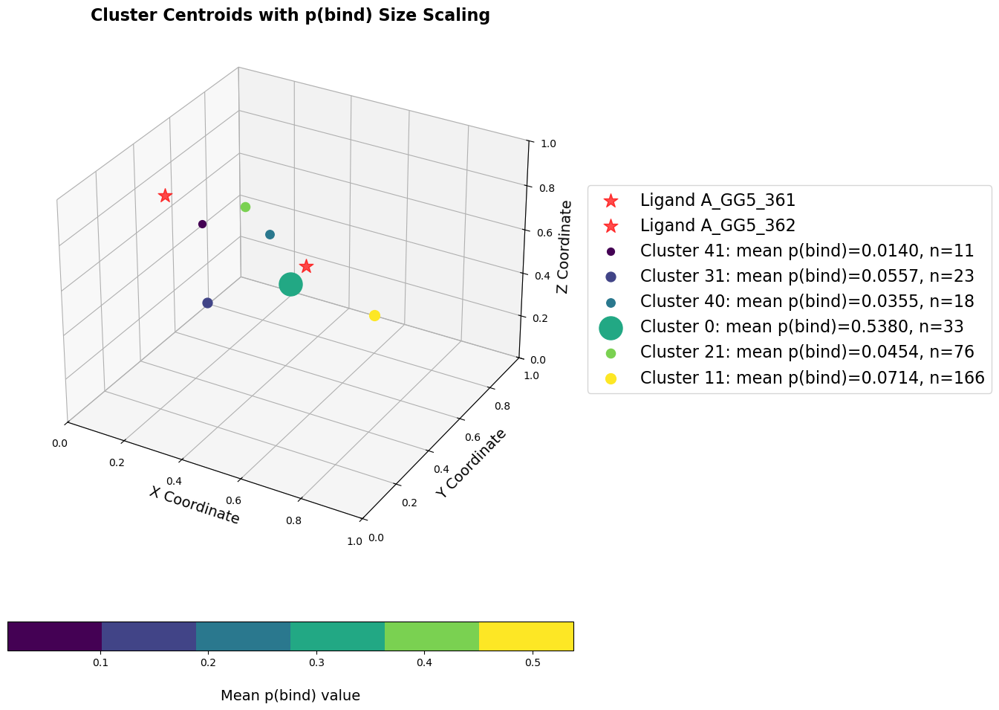

In [11]:
scaler = MinMaxScaler()
scalers = {
    'center_of_mass_x': scaler.fit(df_3hvc[['center_of_mass_x']]),
    'center_of_mass_y': scaler.fit(df_3hvc[['center_of_mass_y']]),
    'center_of_mass_z': scaler.fit(df_3hvc[['center_of_mass_z']])
}

ligand_centers_3hvc_normalized = {
    lig_id: [
        scalers['center_of_mass_x'].transform(np.array([[x]]))[0][0],
        scalers['center_of_mass_y'].transform(np.array([[y]]))[0][0],
        scalers['center_of_mass_z'].transform(np.array([[z]]))[0][0]
    ]
    for lig_id, (x, y, z) in ligand_centers_3hvc.items()
}   

visualize_centroids_pbind_size(df_clustered_3hvc, ligand_centers_3hvc, scalers, pdb_file_3hvc, title="Cluster Centroids with p(bind) Size Scaling")

In [12]:
ligand_centers_3hvc_normalized

{'A_GG5_361': [-0.2090642114453528, 0.8828743021932958, 0.39630129375347256],
 'A_GG5_362': [0.5410217742148848, 0.4793766701060932, 0.6025875069449957]}

In [13]:
ligand_centers_3hvc

{'A_GG5_361': (-3.732, 37.54, 19.149), 'A_GG5_362': (24.619, 22.289, 26.946)}

In [62]:
# Run the grid search for the hierarchical clustering method

# Initialize DataFrame to store best parameters for each PDB file
best_params_df = pd.DataFrame(columns=["pdb_code", "clustering_method", "n_clusters", "pbind_weight", "threshold", "best_distance", "ligand_to_best_distance"])

# Debugging: Print available PDB codes
print(f"Available PDB Codes: {list(dfs.keys())}")

# Iterate over all PDB files in dfs
for pdb_code, df in dfs.items():
    pdb_file = f"{data_path}/{pdb_code}.pdb"
    
    # Calculate ligand centers
    ligand_centers = calculate_ligand_centers(pdb_file)
    if not ligand_centers:
        print(f"⚠️ No ligand centers found for {pdb_code}. Skipping...")
        continue  # Skip this file if no ligands are found
    
    print(f"\n🔍 Running Grid Search for {pdb_code}...")
    
    try:
        # Run grid search to find the best parameters
        result_df, best_param, ligand_to_distance = grid_search_hierarchical_clustering(df, ligand_centers, pdb_file)
        
        # Validate `best_param`
        if not isinstance(best_param, dict):
            raise ValueError(f"⚠️ Unexpected return type from grid_search_hierarchical_clustering for {pdb_code}")
    
    except Exception as e:
        print(f"❌ Error running grid search for {pdb_code}: {e}")
        continue  # Skip to the next PDB file

    # Store results in DataFrame
    best_params_df = pd.concat([best_params_df, pd.DataFrame([{
        "pdb_code": pdb_code,
        "clustering_method": best_param.get("clustering_method", "Unknown"),
        "n_clusters": best_param.get("n_clusters", 2),
        "pbind_weight": best_param.get("pbind_weight", 1),
        "threshold": best_param.get("threshold", 0.1),
        "best_distance": best_param.get("best_distance", float('inf')),
        "ligand_to_best_distance": best_param.get("ligand_to_best_distance", "Unknown")
    }])], ignore_index=True)

# Save best parameters to a CSV file
best_params_df.to_csv("best_params_hierachical_cluster.csv", index=False)

print("\n✅ Grid Search Completed for all PDB files. Results saved to 'best_params.csv'.")

Available PDB Codes: ['1ao6', '1be9', '1cz2', '1ema', '1h61', '1hvy', '1kv1', '1lyz', '1ny3', '1pw6', '1qcf', '1ubq', '1yer', '2bal', '3cpa', '3g5d', '3hvc', '3ptb', '3qkd', '3zln', '4f9w', '4pti', '6o0k']
⚠️ No ligand centers found for 1ao6. Skipping...
⚠️ No ligand centers found for 1be9. Skipping...

🔍 Running Grid Search for 1cz2...

🔍 Testing: kmeans | Clusters: 2 | Weight: 1 | Threshold: 0.01
Initial Clusters' Mean p(bind): 
cluster_iteration_0
0    0.104206
1    0.729609
Name: p(bind), dtype: float64

Initial kmeans clustering results:
Cluster counts: 
cluster_iteration_0
0    65
1    25
Name: count, dtype: int64


🔄 Iteration 1: Re-clustering cluster 0
Iteration 1 Clusters' Mean p(bind): 
cluster_iteration_1
0    0.107916
1    0.100136
Name: p(bind), dtype: float64
Selected cluster 1 for next iteration with mean p(bind): 0.100136
Remaining points: 31

🔄 Iteration 2: Re-clustering cluster 1
Iteration 2 Clusters' Mean p(bind): 
cluster_iteration_2
0    0.112652
1    0.089829
Name

/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/2333483248.py:34: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  best_params_df = pd.concat([best_params_df, pd.DataFrame([{


Iteration 2 Clusters' Mean p(bind): 
cluster_iteration_2
0    0.022634
1    0.052090
Name: p(bind), dtype: float64
Selected cluster 0 for next iteration with mean p(bind): 0.022634
Remaining points: 28

Final clustering summary:
               Mean p(bind)  Count
final_cluster                     
1                  0.181386    125
10                 0.080094     42
20                 0.022634     28
21                 0.052090     30

🔍 Calculating cluster-to-ligand distances... {'A_CRO_66': (27.199, 27.908, 38.472)}

🎯 High-binding Clusters: []
⚠️ No clusters with mean p(bind) > 0.2, distance of low pbind cluster = inf.
⚠️ Error with params (kmeans, 2, 1, 0.03): not enough values to unpack (expected 3, got 2)

🔍 Testing: kmeans | Clusters: 2 | Weight: 2 | Threshold: 0.01
Initial Clusters' Mean p(bind): 
cluster_iteration_0
0    0.059745
1    0.569782
Name: p(bind), dtype: float64

Initial kmeans clustering results:
Cluster counts: 
cluster_iteration_0
0    196
1     29
Name: count, d

/opt/miniconda3/envs/protein_pp/lib/python3.11/site-packages/sklearn/manifold/_spectral_embedding.py:329: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn(


Initial Clusters' Mean p(bind): 
cluster_iteration_0
0    0.134323
1    0.137832
Name: p(bind), dtype: float64

Initial spectral clustering results:
Cluster counts: 
cluster_iteration_0
1    576
0    576
Name: count, dtype: int64


🔄 Iteration 1: Re-clustering cluster 0
Iteration 1 Clusters' Mean p(bind): 
cluster_iteration_1
0    0.702712
1    0.047928
Name: p(bind), dtype: float64
Selected cluster 1 for next iteration with mean p(bind): 0.047928
Remaining points: 500

🔄 Iteration 2: Re-clustering cluster 1
Iteration 2 Clusters' Mean p(bind): 
cluster_iteration_2
0    0.047395
1    0.048428
Name: p(bind), dtype: float64
Selected cluster 0 for next iteration with mean p(bind): 0.047395
Remaining points: 242

🔄 Iteration 3: Re-clustering cluster 0
Iteration 3 Clusters' Mean p(bind): 
cluster_iteration_3
0    0.041769
1    0.049971
Name: p(bind), dtype: float64
Selected cluster 0 for next iteration with mean p(bind): 0.041769
Remaining points: 76

🔄 Iteration 4: Re-clustering cluster 0
I

/opt/miniconda3/envs/protein_pp/lib/python3.11/site-packages/sklearn/manifold/_spectral_embedding.py:329: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn(



🔍 Calculating cluster-to-ligand distances... {'A_UMP_314': (-0.157, 3.884, 15.29), 'A_D16_414': (0.396, 12.556, 17.778), 'A_BME_1514': (16.05, 2.941, -5.002), 'B_UMP_315': (7.157, -6.568, -12.476), 'B_D16_415': (3.706, -14.241, -16.273), 'B_BME_1515': (3.884, -9.798, 12.903), 'C_UMP_316': (35.591, 41.738, 39.158), 'C_D16_416': (30.523, 34.872, 41.903), 'C_BME_1516': (50.843, 30.447, 21.906), 'D_UMP_317': (62.852, 38.862, 25.613), 'D_D16_417': (69.298, 45.348, 25.408), 'D_BME_1517': (40.997, 51.607, 29.982)}

🎯 High-binding Clusters: [10]
✅ Cluster 10 closest to Ligand C_BME_1516: 14.56 Å

🏆 Best Distance: 14.56 Å
⚠️ Error with params (spectral, 2, 1, 0.02): not enough values to unpack (expected 3, got 2)

🔍 Testing: spectral | Clusters: 2 | Weight: 1 | Threshold: 0.03
Initial Clusters' Mean p(bind): 
cluster_iteration_0
0    0.134323
1    0.137832
Name: p(bind), dtype: float64

Initial spectral clustering results:
Cluster counts: 
cluster_iteration_0
1    576
0    576
Name: count, dty

/opt/miniconda3/envs/protein_pp/lib/python3.11/site-packages/sklearn/manifold/_spectral_embedding.py:329: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn(



🔍 Calculating cluster-to-ligand distances... {'A_UMP_314': (-0.157, 3.884, 15.29), 'A_D16_414': (0.396, 12.556, 17.778), 'A_BME_1514': (16.05, 2.941, -5.002), 'B_UMP_315': (7.157, -6.568, -12.476), 'B_D16_415': (3.706, -14.241, -16.273), 'B_BME_1515': (3.884, -9.798, 12.903), 'C_UMP_316': (35.591, 41.738, 39.158), 'C_D16_416': (30.523, 34.872, 41.903), 'C_BME_1516': (50.843, 30.447, 21.906), 'D_UMP_317': (62.852, 38.862, 25.613), 'D_D16_417': (69.298, 45.348, 25.408), 'D_BME_1517': (40.997, 51.607, 29.982)}

🎯 High-binding Clusters: [10]
✅ Cluster 10 closest to Ligand C_BME_1516: 14.56 Å

🏆 Best Distance: 14.56 Å
⚠️ Error with params (spectral, 2, 1, 0.03): not enough values to unpack (expected 3, got 2)

🔍 Testing: spectral | Clusters: 2 | Weight: 2 | Threshold: 0.01
Initial Clusters' Mean p(bind): 
cluster_iteration_0
0    0.134323
1    0.137832
Name: p(bind), dtype: float64

Initial spectral clustering results:
Cluster counts: 
cluster_iteration_0
1    576
0    576
Name: count, dty

/opt/miniconda3/envs/protein_pp/lib/python3.11/site-packages/sklearn/manifold/_spectral_embedding.py:329: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn(


Initial Clusters' Mean p(bind): 
cluster_iteration_0
0    0.127145
1    0.984669
Name: p(bind), dtype: float64

Initial spectral clustering results:
Cluster counts: 
cluster_iteration_0
0    1140
1      12
Name: count, dtype: int64


🔄 Iteration 1: Re-clustering cluster 0
Iteration 1 Clusters' Mean p(bind): 
cluster_iteration_1
0    0.564298
1    0.031868
Name: p(bind), dtype: float64
Selected cluster 1 for next iteration with mean p(bind): 0.031868
Remaining points: 936

🔄 Iteration 2: Re-clustering cluster 1
Iteration 2 Clusters' Mean p(bind): 
cluster_iteration_2
0    0.012813
1    0.127881
Name: p(bind), dtype: float64
Selected cluster 0 for next iteration with mean p(bind): 0.012813
Remaining points: 781

🔄 Iteration 3: Re-clustering cluster 0
Iteration 3 Clusters' Mean p(bind): 
cluster_iteration_3
0    0.012800
1    0.012827
Name: p(bind), dtype: float64
Selected cluster 0 for next iteration with mean p(bind): 0.012800
Remaining points: 392

🔄 Iteration 4: Re-clustering cluster 

/opt/miniconda3/envs/protein_pp/lib/python3.11/site-packages/sklearn/manifold/_spectral_embedding.py:329: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn(


Initial Clusters' Mean p(bind): 
cluster_iteration_0
0    0.127145
1    0.984669
Name: p(bind), dtype: float64

Initial spectral clustering results:
Cluster counts: 
cluster_iteration_0
0    1140
1      12
Name: count, dtype: int64


🔄 Iteration 1: Re-clustering cluster 0
Iteration 1 Clusters' Mean p(bind): 
cluster_iteration_1
0    0.564298
1    0.031868
Name: p(bind), dtype: float64
Selected cluster 1 for next iteration with mean p(bind): 0.031868
Remaining points: 936

🔄 Iteration 2: Re-clustering cluster 1
Iteration 2 Clusters' Mean p(bind): 
cluster_iteration_2
0    0.012813
1    0.127881
Name: p(bind), dtype: float64
Selected cluster 0 for next iteration with mean p(bind): 0.012813
Remaining points: 781

Final clustering summary:
               Mean p(bind)  Count
final_cluster                     
1                  0.984669     12
10                 0.564298    204
20                 0.012813    781
21                 0.127881    155

🔍 Calculating cluster-to-ligand distances..

/opt/miniconda3/envs/protein_pp/lib/python3.11/site-packages/sklearn/manifold/_spectral_embedding.py:329: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn(


Initial Clusters' Mean p(bind): 
cluster_iteration_0
0    0.127145
1    0.984669
Name: p(bind), dtype: float64

Initial spectral clustering results:
Cluster counts: 
cluster_iteration_0
0    1140
1      12
Name: count, dtype: int64


🔄 Iteration 1: Re-clustering cluster 0
Iteration 1 Clusters' Mean p(bind): 
cluster_iteration_1
0    0.564298
1    0.031868
Name: p(bind), dtype: float64
Selected cluster 1 for next iteration with mean p(bind): 0.031868
Remaining points: 936

🔄 Iteration 2: Re-clustering cluster 1
Iteration 2 Clusters' Mean p(bind): 
cluster_iteration_2
0    0.012813
1    0.127881
Name: p(bind), dtype: float64
Selected cluster 0 for next iteration with mean p(bind): 0.012813
Remaining points: 781

Final clustering summary:
               Mean p(bind)  Count
final_cluster                     
1                  0.984669     12
10                 0.564298    204
20                 0.012813    781
21                 0.127881    155

🔍 Calculating cluster-to-ligand distances..

/opt/miniconda3/envs/protein_pp/lib/python3.11/site-packages/sklearn/manifold/_spectral_embedding.py:329: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn(


Iteration 1 Clusters' Mean p(bind): 
cluster_iteration_1
0    0.529557
1    0.027643
Name: p(bind), dtype: float64
Selected cluster 1 for next iteration with mean p(bind): 0.027643
Remaining points: 914

🔄 Iteration 2: Re-clustering cluster 1
Iteration 2 Clusters' Mean p(bind): 
cluster_iteration_2
0    0.010907
1    0.103058
Name: p(bind), dtype: float64
Selected cluster 0 for next iteration with mean p(bind): 0.010907
Remaining points: 748

🔄 Iteration 3: Re-clustering cluster 0
Iteration 3 Clusters' Mean p(bind): 
cluster_iteration_3
0    0.005799
1    0.028676
Name: p(bind), dtype: float64
Selected cluster 0 for next iteration with mean p(bind): 0.005799
Remaining points: 581

Final clustering summary:
               Mean p(bind)  Count
final_cluster                     
1                  0.984669     12
10                 0.529557    226
21                 0.103058    166
30                 0.005799    581
31                 0.028676    167

🔍 Calculating cluster-to-ligand distan

/opt/miniconda3/envs/protein_pp/lib/python3.11/site-packages/sklearn/manifold/_spectral_embedding.py:329: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn(


Iteration 1 Clusters' Mean p(bind): 
cluster_iteration_1
0    0.529557
1    0.027643
Name: p(bind), dtype: float64
Selected cluster 1 for next iteration with mean p(bind): 0.027643
Remaining points: 914

🔄 Iteration 2: Re-clustering cluster 1
Iteration 2 Clusters' Mean p(bind): 
cluster_iteration_2
0    0.010907
1    0.103058
Name: p(bind), dtype: float64
Selected cluster 0 for next iteration with mean p(bind): 0.010907
Remaining points: 748

Final clustering summary:
               Mean p(bind)  Count
final_cluster                     
1                  0.984669     12
10                 0.529557    226
20                 0.010907    748
21                 0.103058    166

🔍 Calculating cluster-to-ligand distances... {'A_UMP_314': (-0.157, 3.884, 15.29), 'A_D16_414': (0.396, 12.556, 17.778), 'A_BME_1514': (16.05, 2.941, -5.002), 'B_UMP_315': (7.157, -6.568, -12.476), 'B_D16_415': (3.706, -14.241, -16.273), 'B_BME_1515': (3.884, -9.798, 12.903), 'C_UMP_316': (35.591, 41.738, 39.158), 

/opt/miniconda3/envs/protein_pp/lib/python3.11/site-packages/sklearn/manifold/_spectral_embedding.py:329: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn(


Initial Clusters' Mean p(bind): 
cluster_iteration_0
0    0.127145
1    0.984669
Name: p(bind), dtype: float64

Initial spectral clustering results:
Cluster counts: 
cluster_iteration_0
0    1140
1      12
Name: count, dtype: int64


🔄 Iteration 1: Re-clustering cluster 0
Iteration 1 Clusters' Mean p(bind): 
cluster_iteration_1
0    0.529557
1    0.027643
Name: p(bind), dtype: float64
Selected cluster 1 for next iteration with mean p(bind): 0.027643
Remaining points: 914

Final clustering summary:
               Mean p(bind)  Count
final_cluster                     
1                  0.984669     12
10                 0.529557    226
11                 0.027643    914

🔍 Calculating cluster-to-ligand distances... {'A_UMP_314': (-0.157, 3.884, 15.29), 'A_D16_414': (0.396, 12.556, 17.778), 'A_BME_1514': (16.05, 2.941, -5.002), 'B_UMP_315': (7.157, -6.568, -12.476), 'B_D16_415': (3.706, -14.241, -16.273), 'B_BME_1515': (3.884, -9.798, 12.903), 'C_UMP_316': (35.591, 41.738, 39.158), 'C_D1

/opt/miniconda3/envs/protein_pp/lib/python3.11/site-packages/sklearn/cluster/_spectral.py:703: UserWarning: The spectral clustering API has changed. ``fit``now constructs an affinity matrix from data. To use a custom affinity matrix, set ``affinity=precomputed``.
  warnings.warn(


Iteration 1 Clusters' Mean p(bind): 
cluster_iteration_1
0    0.023332
1    0.073010
Name: p(bind), dtype: float64
Selected cluster 0 for next iteration with mean p(bind): 0.023332
Remaining points: 111

🔄 Iteration 2: Re-clustering cluster 0
Iteration 2 Clusters' Mean p(bind): 
cluster_iteration_2
0    0.026434
1    0.021137
Name: p(bind), dtype: float64
Selected cluster 1 for next iteration with mean p(bind): 0.021137
Remaining points: 65

🔄 Iteration 3: Re-clustering cluster 1
Iteration 3 Clusters' Mean p(bind): 
cluster_iteration_3
0    0.017557
1    0.022845
Name: p(bind), dtype: float64
Selected cluster 0 for next iteration with mean p(bind): 0.017557
Remaining points: 21

🔄 Iteration 4: Re-clustering cluster 0
Iteration 4 Clusters' Mean p(bind): 
cluster_iteration_4
0    0.018053
1    0.016896
Name: p(bind), dtype: float64
Selected cluster 1 for next iteration with mean p(bind): 0.016896
Remaining points: 9

🔄 Iteration 5: Re-clustering cluster 1
⚠️ Error with params (spectral, 

/opt/miniconda3/envs/protein_pp/lib/python3.11/site-packages/sklearn/cluster/_spectral.py:703: UserWarning: The spectral clustering API has changed. ``fit``now constructs an affinity matrix from data. To use a custom affinity matrix, set ``affinity=precomputed``.
  warnings.warn(


Iteration 4 Clusters' Mean p(bind): 
cluster_iteration_4
0    0.004564
1    0.016563
Name: p(bind), dtype: float64
Selected cluster 0 for next iteration with mean p(bind): 0.004564
Remaining points: 2

Final clustering summary:
               Mean p(bind)  Count
final_cluster                     
0                  0.187215    145
11                 0.259028     19
20                 0.056651     61
30                 0.017759     13
40                 0.004564      2
41                 0.016563     10

🔍 Calculating cluster-to-ligand distances... {'A_FRB_201': (89.178, 23.244, 15.193), 'B_FRB_301': (88.101, 21.582, 4.864)}

🎯 High-binding Clusters: [11]
✅ Cluster 11 closest to Ligand A_FRB_201: 13.18 Å

🏆 Best Distance: 13.18 Å
⚠️ Error with params (spectral, 2, 3, 0.01): not enough values to unpack (expected 3, got 2)

🔍 Testing: spectral | Clusters: 2 | Weight: 3 | Threshold: 0.02
Initial Clusters' Mean p(bind): 
cluster_iteration_0
0    0.187215
1    0.083647
Name: p(bind), dtype: 

In [51]:
# Initialize DataFrame to store best parameters for each PDB file
best_params_df = pd.DataFrame(columns=["pdb_code", "clustering_method", "n_clusters", "pbind_weight", "threshold", "best_distance", "ligand_to_best_distance"])

# Debugging: Print available PDB codes
print(f"Available PDB Codes: {list(dfs.keys())}")

# Iterate over all PDB files in dfs
for pdb_code, df in dfs.items():
    if df.empty:
        print(f"⚠️ DataFrame for {pdb_code} is empty. Skipping...")
        continue
    
    pdb_file = f"{data_path}/{pdb_code}.pdb"
    
    # Calculate ligand centers
    ligand_centers = calculate_ligand_centers(pdb_file)
    if not ligand_centers:
        print(f"⚠️ No ligand centers found for {pdb_code}. Skipping...")
        continue
    
    print(f"\n🔍 Running Grid Search for {pdb_code}...")
    
    try:
        # Run grid search to find the best parameters
        result_df, best_param, ligand_to_distance = grid_search_hierarchical_clustering(df, ligand_centers, pdb_file)
        result_df.to_csv(f"results_hierachical_cluster_{pdb_code}.csv", index=False)

    except Exception as e:
        print(f"❌ Error running grid search for {pdb_code}: {e}")
        continue

    # Append results to DataFrame
    best_params_df = pd.concat([best_params_df, pd.DataFrame([{
        "pdb_code": pdb_code,
        "clustering_method": best_param.get("clustering_method", "Unknown"),
        "n_clusters": best_param.get("n_clusters", 2),
        "pbind_weight": best_param.get("pbind_weight", 1),
        "threshold": best_param.get("threshold", 0.1),
        "best_distance": best_param.get("best_distance", float('inf')),
        "ligand_to_best_distance": best_param.get("ligand_to_best_distance", "Unknown")
    }])], ignore_index=True)

    # Debug: Print shape of DataFrame to check if rows are being added
    print(f"📊 best_params_df shape after {pdb_code}: {best_params_df.shape}")

# Save best parameters to a CSV file
best_params_df.to_csv("best_params_hierarchical_cluster.csv", index=False)

print("\n✅ Grid Search Completed for all PDB files. Results saved to 'best_params_hierarchical_cluster.csv'.")

Available PDB Codes: ['1ao6', '1be9', '1cz2', '1ema', '1h61', '1hvy', '1kv1', '1lyz', '1ny3', '1pw6', '1qcf', '1ubq', '1yer', '2bal', '3cpa', '3g5d', '3hvc', '3ptb', '3qkd', '3zln', '4f9w', '4pti', '6o0k']
⚠️ No ligand centers found for 1ao6. Skipping...
⚠️ No ligand centers found for 1be9. Skipping...

🔍 Running Grid Search for 1cz2...

🔍 Testing: kmeans | Clusters: 2 | Weight: 1 | Threshold: 0.01
Initial Clusters' Mean p(bind): 
cluster_iteration_0
0    0.104206
1    0.729609
Name: p(bind), dtype: float64

Initial kmeans clustering results:
Cluster counts: 
cluster_iteration_0
0    65
1    25
Name: count, dtype: int64


🔄 Iteration 1: Re-clustering cluster 0
Iteration 1 Clusters' Mean p(bind): 
cluster_iteration_1
0    0.107916
1    0.100136
Name: p(bind), dtype: float64
Selected cluster 1 for next iteration with mean p(bind): 0.100136
Remaining points: 31

🔄 Iteration 2: Re-clustering cluster 1
Iteration 2 Clusters' Mean p(bind): 
cluster_iteration_2
0    0.112652
1    0.089829
Name

/opt/miniconda3/envs/protein_pp/lib/python3.11/site-packages/sklearn/manifold/_spectral_embedding.py:329: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn(



🔍 Calculating cluster-to-ligand distances... {'A_UMP_314': (-0.157, 3.884, 15.29), 'A_D16_414': (0.396, 12.556, 17.778), 'A_BME_1514': (16.05, 2.941, -5.002), 'B_UMP_315': (7.157, -6.568, -12.476), 'B_D16_415': (3.706, -14.241, -16.273), 'B_BME_1515': (3.884, -9.798, 12.903), 'C_UMP_316': (35.591, 41.738, 39.158), 'C_D16_416': (30.523, 34.872, 41.903), 'C_BME_1516': (50.843, 30.447, 21.906), 'D_UMP_317': (62.852, 38.862, 25.613), 'D_D16_417': (69.298, 45.348, 25.408), 'D_BME_1517': (40.997, 51.607, 29.982)}

🎯 High-binding Clusters: [10]
✅ Cluster 10 closest to Ligand C_BME_1516: 14.56 Å

🏆 Best Distance: 14.56 Å
⚠️ Error with params (spectral, 2, 1, 0.01): not enough values to unpack (expected 3, got 2)

🔍 Testing: spectral | Clusters: 2 | Weight: 1 | Threshold: 0.02
Initial Clusters' Mean p(bind): 
cluster_iteration_0
0    0.134323
1    0.137832
Name: p(bind), dtype: float64

Initial spectral clustering results:
Cluster counts: 
cluster_iteration_0
1    576
0    576
Name: count, dty

/opt/miniconda3/envs/protein_pp/lib/python3.11/site-packages/sklearn/manifold/_spectral_embedding.py:329: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn(



🔍 Calculating cluster-to-ligand distances... {'A_UMP_314': (-0.157, 3.884, 15.29), 'A_D16_414': (0.396, 12.556, 17.778), 'A_BME_1514': (16.05, 2.941, -5.002), 'B_UMP_315': (7.157, -6.568, -12.476), 'B_D16_415': (3.706, -14.241, -16.273), 'B_BME_1515': (3.884, -9.798, 12.903), 'C_UMP_316': (35.591, 41.738, 39.158), 'C_D16_416': (30.523, 34.872, 41.903), 'C_BME_1516': (50.843, 30.447, 21.906), 'D_UMP_317': (62.852, 38.862, 25.613), 'D_D16_417': (69.298, 45.348, 25.408), 'D_BME_1517': (40.997, 51.607, 29.982)}

🎯 High-binding Clusters: [10]
✅ Cluster 10 closest to Ligand C_BME_1516: 14.56 Å

🏆 Best Distance: 14.56 Å
⚠️ Error with params (spectral, 2, 1, 0.02): not enough values to unpack (expected 3, got 2)

🔍 Testing: spectral | Clusters: 2 | Weight: 1 | Threshold: 0.03
Initial Clusters' Mean p(bind): 
cluster_iteration_0
0    0.134323
1    0.137832
Name: p(bind), dtype: float64

Initial spectral clustering results:
Cluster counts: 
cluster_iteration_0
1    576
0    576
Name: count, dty

/opt/miniconda3/envs/protein_pp/lib/python3.11/site-packages/sklearn/manifold/_spectral_embedding.py:329: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn(



🔍 Calculating cluster-to-ligand distances... {'A_UMP_314': (-0.157, 3.884, 15.29), 'A_D16_414': (0.396, 12.556, 17.778), 'A_BME_1514': (16.05, 2.941, -5.002), 'B_UMP_315': (7.157, -6.568, -12.476), 'B_D16_415': (3.706, -14.241, -16.273), 'B_BME_1515': (3.884, -9.798, 12.903), 'C_UMP_316': (35.591, 41.738, 39.158), 'C_D16_416': (30.523, 34.872, 41.903), 'C_BME_1516': (50.843, 30.447, 21.906), 'D_UMP_317': (62.852, 38.862, 25.613), 'D_D16_417': (69.298, 45.348, 25.408), 'D_BME_1517': (40.997, 51.607, 29.982)}

🎯 High-binding Clusters: [10]
✅ Cluster 10 closest to Ligand C_BME_1516: 14.56 Å

🏆 Best Distance: 14.56 Å
⚠️ Error with params (spectral, 2, 1, 0.03): not enough values to unpack (expected 3, got 2)

🔍 Testing: spectral | Clusters: 2 | Weight: 2 | Threshold: 0.01
Initial Clusters' Mean p(bind): 
cluster_iteration_0
0    0.134323
1    0.137832
Name: p(bind), dtype: float64

Initial spectral clustering results:
Cluster counts: 
cluster_iteration_0
1    576
0    576
Name: count, dty

/opt/miniconda3/envs/protein_pp/lib/python3.11/site-packages/sklearn/manifold/_spectral_embedding.py:329: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn(


Initial Clusters' Mean p(bind): 
cluster_iteration_0
0    0.127145
1    0.984669
Name: p(bind), dtype: float64

Initial spectral clustering results:
Cluster counts: 
cluster_iteration_0
0    1140
1      12
Name: count, dtype: int64


🔄 Iteration 1: Re-clustering cluster 0
Iteration 1 Clusters' Mean p(bind): 
cluster_iteration_1
0    0.564298
1    0.031868
Name: p(bind), dtype: float64
Selected cluster 1 for next iteration with mean p(bind): 0.031868
Remaining points: 936

🔄 Iteration 2: Re-clustering cluster 1
Iteration 2 Clusters' Mean p(bind): 
cluster_iteration_2
0    0.012813
1    0.127881
Name: p(bind), dtype: float64
Selected cluster 0 for next iteration with mean p(bind): 0.012813
Remaining points: 781

🔄 Iteration 3: Re-clustering cluster 0
Iteration 3 Clusters' Mean p(bind): 
cluster_iteration_3
0    0.012800
1    0.012827
Name: p(bind), dtype: float64
Selected cluster 0 for next iteration with mean p(bind): 0.012800
Remaining points: 392

🔄 Iteration 4: Re-clustering cluster 

/opt/miniconda3/envs/protein_pp/lib/python3.11/site-packages/sklearn/manifold/_spectral_embedding.py:329: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn(


Initial Clusters' Mean p(bind): 
cluster_iteration_0
0    0.127145
1    0.984669
Name: p(bind), dtype: float64

Initial spectral clustering results:
Cluster counts: 
cluster_iteration_0
0    1140
1      12
Name: count, dtype: int64


🔄 Iteration 1: Re-clustering cluster 0
Iteration 1 Clusters' Mean p(bind): 
cluster_iteration_1
0    0.564298
1    0.031868
Name: p(bind), dtype: float64
Selected cluster 1 for next iteration with mean p(bind): 0.031868
Remaining points: 936

🔄 Iteration 2: Re-clustering cluster 1
Iteration 2 Clusters' Mean p(bind): 
cluster_iteration_2
0    0.012813
1    0.127881
Name: p(bind), dtype: float64
Selected cluster 0 for next iteration with mean p(bind): 0.012813
Remaining points: 781

Final clustering summary:
               Mean p(bind)  Count
final_cluster                     
1                  0.984669     12
10                 0.564298    204
20                 0.012813    781
21                 0.127881    155

🔍 Calculating cluster-to-ligand distances..

/opt/miniconda3/envs/protein_pp/lib/python3.11/site-packages/sklearn/manifold/_spectral_embedding.py:329: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn(


Initial Clusters' Mean p(bind): 
cluster_iteration_0
0    0.127145
1    0.984669
Name: p(bind), dtype: float64

Initial spectral clustering results:
Cluster counts: 
cluster_iteration_0
0    1140
1      12
Name: count, dtype: int64


🔄 Iteration 1: Re-clustering cluster 0
Iteration 1 Clusters' Mean p(bind): 
cluster_iteration_1
0    0.564298
1    0.031868
Name: p(bind), dtype: float64
Selected cluster 1 for next iteration with mean p(bind): 0.031868
Remaining points: 936

🔄 Iteration 2: Re-clustering cluster 1
Iteration 2 Clusters' Mean p(bind): 
cluster_iteration_2
0    0.012813
1    0.127881
Name: p(bind), dtype: float64
Selected cluster 0 for next iteration with mean p(bind): 0.012813
Remaining points: 781

Final clustering summary:
               Mean p(bind)  Count
final_cluster                     
1                  0.984669     12
10                 0.564298    204
20                 0.012813    781
21                 0.127881    155

🔍 Calculating cluster-to-ligand distances..

/opt/miniconda3/envs/protein_pp/lib/python3.11/site-packages/sklearn/manifold/_spectral_embedding.py:329: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn(


Iteration 1 Clusters' Mean p(bind): 
cluster_iteration_1
0    0.529557
1    0.027643
Name: p(bind), dtype: float64
Selected cluster 1 for next iteration with mean p(bind): 0.027643
Remaining points: 914

🔄 Iteration 2: Re-clustering cluster 1
Iteration 2 Clusters' Mean p(bind): 
cluster_iteration_2
0    0.010907
1    0.103058
Name: p(bind), dtype: float64
Selected cluster 0 for next iteration with mean p(bind): 0.010907
Remaining points: 748

🔄 Iteration 3: Re-clustering cluster 0
Iteration 3 Clusters' Mean p(bind): 
cluster_iteration_3
0    0.005799
1    0.028676
Name: p(bind), dtype: float64
Selected cluster 0 for next iteration with mean p(bind): 0.005799
Remaining points: 581

Final clustering summary:
               Mean p(bind)  Count
final_cluster                     
1                  0.984669     12
10                 0.529557    226
21                 0.103058    166
30                 0.005799    581
31                 0.028676    167

🔍 Calculating cluster-to-ligand distan

/opt/miniconda3/envs/protein_pp/lib/python3.11/site-packages/sklearn/manifold/_spectral_embedding.py:329: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn(


Iteration 1 Clusters' Mean p(bind): 
cluster_iteration_1
0    0.529557
1    0.027643
Name: p(bind), dtype: float64
Selected cluster 1 for next iteration with mean p(bind): 0.027643
Remaining points: 914

🔄 Iteration 2: Re-clustering cluster 1
Iteration 2 Clusters' Mean p(bind): 
cluster_iteration_2
0    0.010907
1    0.103058
Name: p(bind), dtype: float64
Selected cluster 0 for next iteration with mean p(bind): 0.010907
Remaining points: 748

Final clustering summary:
               Mean p(bind)  Count
final_cluster                     
1                  0.984669     12
10                 0.529557    226
20                 0.010907    748
21                 0.103058    166

🔍 Calculating cluster-to-ligand distances... {'A_UMP_314': (-0.157, 3.884, 15.29), 'A_D16_414': (0.396, 12.556, 17.778), 'A_BME_1514': (16.05, 2.941, -5.002), 'B_UMP_315': (7.157, -6.568, -12.476), 'B_D16_415': (3.706, -14.241, -16.273), 'B_BME_1515': (3.884, -9.798, 12.903), 'C_UMP_316': (35.591, 41.738, 39.158), 

/opt/miniconda3/envs/protein_pp/lib/python3.11/site-packages/sklearn/manifold/_spectral_embedding.py:329: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn(


Initial Clusters' Mean p(bind): 
cluster_iteration_0
0    0.127145
1    0.984669
Name: p(bind), dtype: float64

Initial spectral clustering results:
Cluster counts: 
cluster_iteration_0
0    1140
1      12
Name: count, dtype: int64


🔄 Iteration 1: Re-clustering cluster 0
Iteration 1 Clusters' Mean p(bind): 
cluster_iteration_1
0    0.529557
1    0.027643
Name: p(bind), dtype: float64
Selected cluster 1 for next iteration with mean p(bind): 0.027643
Remaining points: 914

Final clustering summary:
               Mean p(bind)  Count
final_cluster                     
1                  0.984669     12
10                 0.529557    226
11                 0.027643    914

🔍 Calculating cluster-to-ligand distances... {'A_UMP_314': (-0.157, 3.884, 15.29), 'A_D16_414': (0.396, 12.556, 17.778), 'A_BME_1514': (16.05, 2.941, -5.002), 'B_UMP_315': (7.157, -6.568, -12.476), 'B_D16_415': (3.706, -14.241, -16.273), 'B_BME_1515': (3.884, -9.798, 12.903), 'C_UMP_316': (35.591, 41.738, 39.158), 'C_D1

/opt/miniconda3/envs/protein_pp/lib/python3.11/site-packages/sklearn/cluster/_spectral.py:703: UserWarning: The spectral clustering API has changed. ``fit``now constructs an affinity matrix from data. To use a custom affinity matrix, set ``affinity=precomputed``.
  warnings.warn(


Initial Clusters' Mean p(bind): 
cluster_iteration_0
0    0.054629
1    0.679931
Name: p(bind), dtype: float64

Initial spectral clustering results:
Cluster counts: 
cluster_iteration_0
0    300
1     31
Name: count, dtype: int64


🔄 Iteration 1: Re-clustering cluster 0
Iteration 1 Clusters' Mean p(bind): 
cluster_iteration_1
0    0.023332
1    0.073010
Name: p(bind), dtype: float64
Selected cluster 0 for next iteration with mean p(bind): 0.023332
Remaining points: 111

🔄 Iteration 2: Re-clustering cluster 0
Iteration 2 Clusters' Mean p(bind): 
cluster_iteration_2
0    0.026434
1    0.021137
Name: p(bind), dtype: float64
Selected cluster 1 for next iteration with mean p(bind): 0.021137
Remaining points: 65

🔄 Iteration 3: Re-clustering cluster 1
Iteration 3 Clusters' Mean p(bind): 
cluster_iteration_3
0    0.017557
1    0.022845
Name: p(bind), dtype: float64
Selected cluster 0 for next iteration with mean p(bind): 0.017557
Remaining points: 21

Final clustering summary:
               

/opt/miniconda3/envs/protein_pp/lib/python3.11/site-packages/sklearn/cluster/_spectral.py:703: UserWarning: The spectral clustering API has changed. ``fit``now constructs an affinity matrix from data. To use a custom affinity matrix, set ``affinity=precomputed``.
  warnings.warn(


Iteration 2 Clusters' Mean p(bind): 
cluster_iteration_2
0    0.056651
1    0.016225
Name: p(bind), dtype: float64
Selected cluster 1 for next iteration with mean p(bind): 0.016225
Remaining points: 25

Final clustering summary:
               Mean p(bind)  Count
final_cluster                     
0                  0.187215    145
11                 0.259028     19
20                 0.056651     61
21                 0.016225     25

🔍 Calculating cluster-to-ligand distances... {'A_FRB_201': (89.178, 23.244, 15.193), 'B_FRB_301': (88.101, 21.582, 4.864)}

🎯 High-binding Clusters: [11]
✅ Cluster 11 closest to Ligand A_FRB_201: 13.18 Å

🏆 Best Distance: 13.18 Å
⚠️ Error with params (spectral, 2, 3, 0.02): not enough values to unpack (expected 3, got 2)

🔍 Testing: spectral | Clusters: 2 | Weight: 3 | Threshold: 0.03
Initial Clusters' Mean p(bind): 
cluster_iteration_0
0    0.187215
1    0.083647
Name: p(bind), dtype: float64

Initial spectral clustering results:
Cluster counts: 
cluste

In [ ]:
# Function for preprocessing (Normalized the features and weighted pbind)
def preprocess_features(df, feature_columns, pbind_column='p(bind)', pbind_weights=[1.0]):
    """
    Normalize features based on their distribution and apply weighting to p(bind).

    - Standardizes normally distributed features (Z-score)
    - Normalizes non-normally distributed features (MinMax scaling)
    - Applies multiple weightings to `p(bind)`

    Args:
        df (pd.DataFrame): Input DataFrame.
        feature_columns (list): Feature columns (3D coordinates).
        pbind_column (str, optional): Column containing `p(bind)`. Defaults to 'p(bind)'.
        pbind_weights (list, optional): List of weights for `p(bind)`. Defaults to [1.0].

    Returns:
        pd.DataFrame: DataFrame with transformed features and weighted `p(bind)`.
        dict: Dictionary of scalers for later transformation consistency.
    """

    processed_df = df.copy()
    scalers = {}

    # # Normalize or standardize feature columns
    # for col in feature_columns:
    #     stat, p_value = shapiro(df[col].dropna())  # Shapiro-Wilk test for normality
    #     if p_value > 0.05:
    #         # Normally distributed → Standardization
    #         scaler = StandardScaler()
    #     else:
            # Not normally distributed → MinMax Normalization
    scaler = MinMaxScaler()
        
    processed_df[f"{col}_scaled"] = scaler.fit_transform(df[[col]])
    scalers[col] = scaler  # Store scaler for consistency

    # Normalize and apply weights to `p(bind)`
    if pbind_column in df.columns:
        pbind_scaler = MinMaxScaler()
        normalized_pbind = pbind_scaler.fit_transform(df[[pbind_column]])

        for weight in pbind_weights:
            processed_df[f"{pbind_column}_weight_{weight}"] = normalized_pbind * weight
        
        scalers[pbind_column] = pbind_scaler  # Store p(bind) scaler

    return processed_df, scalers

def kmeans_clustering(df, feature_columns, n_clusters):
    """
    Perform KMeans clustering and add cluster labels to the DataFrame.

    Args:
        df (pd.DataFrame): Input DataFrame.
        feature_columns (list): List of feature column names.
        n_clusters (int): Number of clusters.

    Returns:
        pd.DataFrame: Updated DataFrame with cluster labels.
        KMeans: Fitted KMeans model.
    """
    features = df[feature_columns].values
    kmeans = KMeans(n_clusters=n_clusters, random_state=42, n_init=10)
    df['kmeans_cluster'] = kmeans.fit_predict(features)
    return df, kmeans

def normalize_within_clusters(df, cluster_column, pbind_column):
    """
    Normalize p(bind) values within each cluster.

    Args:
        df (pd.DataFrame): Input DataFrame.
        cluster_column (str): Column containing cluster IDs.
        pbind_column (str): Column containing p(bind) values.

    Returns:
        pd.DataFrame: Updated DataFrame with normalized p(bind) values.
    """
    df[f"normalized_{pbind_column}"] = df.groupby(cluster_column)[pbind_column].transform(
        lambda x: (x - x.min()) / (x.max() - x.min())
    )
    return df

# Filter by p(bind) cutoff
def filter_by_pbind_cutoff(df, pbind_column, cluster_column, cutoff_method, std_factor):
    """
    Filter residues based on p(bind) cutoff.

    Args:
        df (pd.DataFrame): Input DataFrame.
        pbind_column (str): Column containing p(bind) values.
        cluster_column (str): Column containing cluster IDs.
        cutoff_method (str): Method for calculating cutoff ('median_std' or 'percentile').
        std_factor (float): Factor for standard deviation in cutoff calculation.

    Returns:
        pd.DataFrame: Filtered DataFrame.
    """
    filtered_df = pd.DataFrame()

    for cluster_id in df[cluster_column].unique():
        cluster_data = df[df[cluster_column] == cluster_id]
        if cutoff_method == 'median_std':
            median_value = cluster_data[pbind_column].median()
            std_value = cluster_data[pbind_column].std()
            cutoff = median_value + std_factor * std_value
        elif cutoff_method == 'percentile':
            cutoff = cluster_data[pbind_column].quantile(0.95)
        else:
            raise ValueError("Invalid cutoff method. Use 'median_std' or 'percentile'.")

        filtered_cluster = cluster_data[cluster_data[pbind_column] > cutoff]
        filtered_df = pd.concat([filtered_df, filtered_cluster])

    return filtered_df.reset_index(drop=True)

# Evaluate clustering
def evaluate_clustering(pdb_file, df, cluster_column):
    """
    Evaluate clustering by calculating distances between clusters and ligands.

    Args:
        pdb_file (str): Path to the PDB file.
        df (pd.DataFrame): Input DataFrame.
        cluster_column (str): Column containing cluster IDs.

    Returns:
        dict: Distances between clusters and ligands.
    """
    def calculate_cluster_centers():
        cmd.load(pdb_file, "protein")
        cluster_centers = {}
        for cluster_id in df[cluster_column].unique():
            cluster_data = df[df[cluster_column] == cluster_id]
            resi_selection = "+".join(map(str, cluster_data['resi']))
            cmd.select(f"cluster_{cluster_id}", f"resi {resi_selection}")
            center_of_mass = cmd.centerofmass(f"cluster_{cluster_id}")
            cluster_centers[cluster_id] = tuple(round(coord, 3) for coord in center_of_mass)
        cmd.delete("all")
        return cluster_centers

    def bad_calculate_ligand_centers():
        cmd.load(pdb_file, "protein")
        cmd.select("ligands", "organic")
        ligand_centers = {}
        for atom in cmd.get_model("ligands").atom:
            ligand_id = f"{atom.chain}_{atom.resn}_{atom.resi}"
            cmd.select("ligand", f"chain {atom.chain} and resn {atom.resn} and resi {atom.resi}")
            center_of_mass = cmd.centerofmass("ligand")
            ligand_centers[ligand_id] = tuple(round(coord, 3) for coord in center_of_mass)
        cmd.delete("all")
        return ligand_centers

    cluster_centers = bad_calculate_cluster_centers()
    ligand_centers = bad_calculate_ligand_centers()

    distances = {}
    for cluster_id, cluster_center in cluster_centers.items():
        min_distance = float('inf')
        closest_ligand = None

        for ligand_id, ligand_center in ligand_centers.items():
            distance = np.linalg.norm(np.array(cluster_center) - np.array(ligand_center))
            if distance < min_distance:
                min_distance = round(distance, 3)
                closest_ligand = ligand_id

        distances[cluster_id] = (closest_ligand, min_distance)

    return distances

# hierarchical clustering Kmeans

def kmeans_clustering(df, feature_columns, n_clusters=2):
    """
    Perform KMeans clustering on the given dataframe.
    
    Args:
        df (pd.DataFrame): Input DataFrame.
        feature_columns (list): Feature columns for clustering.
        n_clusters (int): Number of clusters.
        
    Returns:
        tuple: (Updated DataFrame with cluster labels, KMeans model)
    """
    df = df.copy()
    
    # Extract features for clustering
    X = df[feature_columns].values
    
    # Perform KMeans clustering
    kmeans = KMeans(n_clusters=n_clusters, random_state=42)
    df['kmeans_cluster'] = kmeans.fit_predict(X)
    
    return df, kmeans

def hierarchical_kmeans_clustering(df, feature_columns, pbind_column, clustering_method='kmeans', n_clusters=2, pbind_weight=5, threshold=0.5):
    """
    Perform hierarchical KMeans clustering with p(bind) thresholding.
    
    Steps:
    1. Cluster the dataset into 2 groups.
    2. Identify the cluster with lower mean p(bind).
    3. Recursively re-cluster this group until mean p(bind) < threshold.

    Args:
        df (pd.DataFrame): Input DataFrame.
        feature_columns (list): Feature columns for clustering (spatial coordinates).
        pbind_column (str): Column name for p(bind).
        clustering_method (str): Clustering method to use ('kmeans' by default).
        n_clusters (int): Initial number of clusters (default: 2).
        pbind_weight (float): Weight for p(bind) column.
        threshold (float): Threshold for stopping recursion.

    Returns:
        pd.DataFrame: Updated DataFrame with hierarchical clustering labels.
    """
    df = df.copy()  # Ensure original data is not modified

    # Normalize p(bind) values and then apply weight
    pbind_scaler = MinMaxScaler()
    normalized_pbind = pbind_scaler.fit_transform(df[[pbind_column]]).flatten()

    # Create weighted column
    df[f"{pbind_column}_weighted"] = normalized_pbind * pbind_weight

    # Use normalized feature columns for clustering
    normalized_feature_columns = [f"{col}_normalized" for col in feature_columns]
    
    # Feature set including weighted p(bind)
    clustering_features = normalized_feature_columns + [f"{pbind_column}_weighted"]

    # Initial clustering
    iteration = 0
    df, kmeans_model = kmeans_clustering(df, clustering_features, n_clusters)
    df[f'kmeans_cluster_iteration_{iteration}'] = df['kmeans_cluster']
    df.drop(columns=['kmeans_cluster'], inplace=True)
    
    cluster_means = df.groupby(f'kmeans_cluster_iteration_{iteration}')[pbind_column].mean()
    
    print(f"Initial Clusters' Mean p(bind): \n{cluster_means}")

    # Identify the cluster with lower mean p(bind)
    lower_pbind_cluster = cluster_means.idxmin()
    
    # Get subset of data for the lower p(bind) cluster
    lower_pbind_df = df[df[f'kmeans_cluster_iteration_{iteration}'] == lower_pbind_cluster].copy()

    # Print initial clustering results
    print(f"\nInitial clustering results:")
    print(f"Cluster counts: {df[f'kmeans_cluster_iteration_{iteration}'].value_counts()}")
    
    # Print cluster information instead of using merge
    print(f"Clusters and their mean p(bind) values:")
    for cluster, mean_pbind in cluster_means.items():
        count = df[df[f'kmeans_cluster_iteration_{iteration}'] == cluster].shape[0]
        print(f"Cluster {cluster}: {count} points, mean p(bind) = {mean_pbind:.6f}")

    # Initialize final_cluster column with the initial cluster labels
    df["final_cluster"] = df[f'kmeans_cluster_iteration_{iteration}']

    # Recursively re-cluster if mean p(bind) > threshold
    iteration += 1
    while lower_pbind_df[pbind_column].mean() > threshold and len(lower_pbind_df) > n_clusters:
        
        print(f"\n🔄 Iteration {iteration}: Re-clustering cluster {lower_pbind_cluster}")
        lower_pbind_df, kmeans_model = kmeans_clustering(lower_pbind_df, clustering_features, n_clusters)
        lower_pbind_df[f'kmeans_cluster_iteration_{iteration}'] = lower_pbind_df['kmeans_cluster']
        lower_pbind_df.drop(columns=['kmeans_cluster'], inplace=True)
        
        cluster_means = lower_pbind_df.groupby(f'kmeans_cluster_iteration_{iteration}')[pbind_column].mean()
        print(f"Iteration {iteration} Clusters' Mean p(bind): \n{cluster_means}")
        
        # Update final_cluster for this subset
        # Generate unique cluster IDs by adding offset based on iteration
        new_cluster_ids = lower_pbind_df[f'kmeans_cluster_iteration_{iteration}'] + (iteration * 10)
        df.loc[lower_pbind_df.index, "final_cluster"] = new_cluster_ids
        
        # Select the cluster with lowest p(bind) for next iteration
        lower_pbind_cluster = cluster_means.idxmin()
        lower_pbind_df = lower_pbind_df[lower_pbind_df[f'kmeans_cluster_iteration_{iteration}'] == lower_pbind_cluster].copy()
        
        print(f"Selected cluster {lower_pbind_cluster} for next iteration with mean p(bind): {lower_pbind_df[pbind_column].mean():.6f}")
        print(f"Remaining points: {len(lower_pbind_df)}")
        
        iteration += 1

    # Ensure final_cluster is integer type
    df["final_cluster"] = df["final_cluster"].astype(int)
    
    summary_df = df.groupby('final_cluster')['p(bind)'].agg(['mean', 'count'])
    summary_df.columns = ['Mean p(bind)', 'Count']
    print(f"\nFinal clustering summary:")
    print(summary_df)
    
    return df

def hierarchical_clustering_pipeline(df, clustering_method='kmeans', feature_columns=['center_of_mass_x', 'center_of_mass_y', 'center_of_mass_z'], 
                                    pbind_column="p(bind)", n_clusters=2, pbind_weight=5, threshold=0.2, random_state = 42):
    """
    Perform hierarchical clustering with p(bind) thresholding using different clustering methods.
    
    Steps:
    1. Normalize p(bind), apply weight.
    2. Cluster dataset using the specified method.
    3. Identify cluster with lower mean p(bind).
    4. Recursively re-cluster this group until mean p(bind) < threshold.

    Args:
        df (pd.DataFrame): Input DataFrame.
        clustering_method (str): Clustering method ('kmeans', 'spectral', 'gmm').
        feature_columns (list): Spatial feature columns for clustering.
        pbind_column (str): Column name for p(bind).
        n_clusters (int): Initial number of clusters (default: 2).
        pbind_weight (float): Weight for p(bind) column.
        threshold (float): Threshold for stopping recursion.

    Returns:
        pd.DataFrame: Updated DataFrame with hierarchical clustering labels.
    """
    df = df.copy()  # Ensure original data is not modified

    # Normalize p(bind) values and apply weight
    pbind_scaler = MinMaxScaler()
    df[f"{pbind_column}_normalized"] = pbind_scaler.fit_transform(df[[pbind_column]])
    df[f"{pbind_column}_weighted"] = df[f"{pbind_column}_normalized"] * pbind_weight

    # Use normalized spatial feature columns for clustering
    normalized_feature_columns = [f"{col}_normalized" for col in feature_columns]

    # Feature set including weighted p(bind)
    clustering_features = normalized_feature_columns + [f"{pbind_column}_weighted"]

    # Define a function to perform clustering based on method
    def perform_clustering(data, features, n_clusters):
        if clustering_method == 'kmeans':
            features_data = data[features].values
            model = KMeans(n_clusters=n_clusters, random_state=random_state, n_init=10) # max interations = 10 set differently
            data['cluster_label'] = model.fit_predict(features_data)
            return data, model
        
        elif clustering_method == 'spectral':
            features_data = data[features].values
            model = SpectralClustering(n_clusters=n_clusters, random_state=random_state, 
                                     affinity='nearest_neighbors', assign_labels='kmeans')
            data['cluster_label'] = model.fit_predict(features_data)
            return data, model
        
        elif clustering_method == 'gmm':
            features_data = data[features].values
            model = GaussianMixture(n_components=n_clusters, random_state=random_state)
            data['cluster_label'] = model.fit_predict(features_data)
            return data, model
        
        else:
            raise ValueError("Invalid clustering method. Choose 'kmeans', 'spectral', or 'gmm'.")

    # Initial clustering
    iteration = 0
    df, model = perform_clustering(df, clustering_features, n_clusters)
    df[f'cluster_iteration_{iteration}'] = df['cluster_label']
    df.drop(columns=['cluster_label'], inplace=True)
    
    # Store cluster means
    cluster_means = df.groupby(f'cluster_iteration_{iteration}')[pbind_column].mean()
    print(f"Initial Clusters' Mean p(bind): \n{cluster_means}")

    # Identify the cluster with lower mean p(bind)
    lower_pbind_cluster = cluster_means.idxmin()
    
    # Get subset of data for the lower p(bind) cluster
    lower_pbind_df = df[df[f'cluster_iteration_{iteration}'] == lower_pbind_cluster].copy()

    # Print initial clustering results
    print(f"\nInitial {clustering_method} clustering results:")
    print(f"Cluster counts: \n{df[f'cluster_iteration_{iteration}'].value_counts()}\n")

    # Store initial clusters
    df["final_cluster"] = df[f'cluster_iteration_{iteration}']

    # Recursively re-cluster if mean p(bind) > threshold
    iteration += 1
    while lower_pbind_df[pbind_column].mean() > threshold and len(lower_pbind_df) > n_clusters:
        print(f"\n🔄 Iteration {iteration}: Re-clustering cluster {lower_pbind_cluster}")
        
        # Run clustering on this cluster again
        lower_pbind_df, model = perform_clustering(lower_pbind_df, clustering_features, n_clusters)
        lower_pbind_df[f'cluster_iteration_{iteration}'] = lower_pbind_df['cluster_label']
        lower_pbind_df.drop(columns=['cluster_label'], inplace=True)
        
        cluster_means = lower_pbind_df.groupby(f'cluster_iteration_{iteration}')[pbind_column].mean()
        print(f"Iteration {iteration} Clusters' Mean p(bind): \n{cluster_means}")
        
        # Assign new cluster labels using unique numbering
        new_cluster_ids = lower_pbind_df[f'cluster_iteration_{iteration}'] + (iteration * 10)
        df.loc[lower_pbind_df.index, "final_cluster"] = new_cluster_ids
        
        # Select the cluster with lowest p(bind) for next iteration
        lower_pbind_cluster = cluster_means.idxmin()
        lower_pbind_df = lower_pbind_df[lower_pbind_df[f'cluster_iteration_{iteration}'] == lower_pbind_cluster].copy()
        
        print(f"Selected cluster {lower_pbind_cluster} for next iteration with mean p(bind): {lower_pbind_df[pbind_column].mean():.6f}")
        print(f"Remaining points: {len(lower_pbind_df)}")
        
        iteration += 1

    # Ensure final_cluster is integer type
    df["final_cluster"] = df["final_cluster"].astype(int)
    
    # Create output dataframe with selected columns
    output_columns = ['resi', 'resn', 'p(bind)', 'center_of_mass_x', 'center_of_mass_y', 'center_of_mass_z']
    
    # Add normalized coordinates to output if they exist in the dataframe
    for col in normalized_feature_columns:
        if col in df.columns:
            output_columns.append(col)
    
    # Add final cluster to output
    output_columns.append('final_cluster')
    
    summary_df = df.groupby('final_cluster')['p(bind)'].agg(['mean', 'count'])
    summary_df.columns = ['Mean p(bind)', 'Count']
    print(f"\nFinal clustering summary:")
    print(summary_df)
    
    return df[output_columns], summary_df



def visualize_cluster_projections(df_clustered, ligand_centers_normalized, title="KMeans Cluster Visualization"):
    """
    Visualize KMeans clustering results in 3D and 2D projections.
    
    Args:
        df_clustered (pd.DataFrame): DataFrame containing clustering results with normalized coordinates.
        ligand_centers_normalized (dict): Dictionary of ligand centers with normalized coordinates.
        title (str): Title for the figure.
    
    Returns:
        None (Displays the plots)
    """

    # 🎨 Define figure size and layout
    fig = plt.figure(figsize=(16, 12))

    # 🎯 Font sizes for readability
    TITLE_SIZE = 16
    LABEL_SIZE = 14
    TICK_SIZE = 12
    LEGEND_SIZE = 12

    # 🎨 Create a 2x2 grid of subplots
    ax_3d = fig.add_subplot(221, projection='3d')
    ax_xy = fig.add_subplot(222)
    ax_xz = fig.add_subplot(223)
    ax_yz = fig.add_subplot(224)

    # 🎨 Use a consistent colormap for clusters
    unique_clusters = np.sort(df_clustered['final_cluster'].unique())
    colors = plt.cm.tab10(np.linspace(0, 1, len(unique_clusters)))

    # 🔹 3D Plot (top-left)
    for i, cluster in enumerate(unique_clusters):
        cluster_data = df_clustered[df_clustered['final_cluster'] == cluster]
        ax_3d.scatter(
            cluster_data['center_of_mass_x_normalized'], 
            cluster_data['center_of_mass_y_normalized'], 
            cluster_data['center_of_mass_z_normalized'], 
            s=20, color=colors[i], label=f'Cluster {cluster}'
        )

    # 🔹 XY Projection (top-right)
    for i, cluster in enumerate(unique_clusters):
        cluster_data = df_clustered[df_clustered['final_cluster'] == cluster]
        ax_xy.scatter(
            cluster_data['center_of_mass_x_normalized'], 
            cluster_data['center_of_mass_y_normalized'], 
            s=20, color=colors[i], label=f'Cluster {cluster}'
        )

    # 🔹 XZ Projection (bottom-left)
    for i, cluster in enumerate(unique_clusters):
        cluster_data = df_clustered[df_clustered['final_cluster'] == cluster]
        ax_xz.scatter(
            cluster_data['center_of_mass_x_normalized'], 
            cluster_data['center_of_mass_z_normalized'], 
            s=20, color=colors[i], label=f'Cluster {cluster}'
        )

    # 🔹 YZ Projection (bottom-right)
    for i, cluster in enumerate(unique_clusters):
        cluster_data = df_clustered[df_clustered['final_cluster'] == cluster]
        ax_yz.scatter(
            cluster_data['center_of_mass_y_normalized'], 
            cluster_data['center_of_mass_z_normalized'], 
            s=20, color=colors[i], label=f'Cluster {cluster}'
        )

    # 🔴 Add ligand centers to all plots with consistent markers
    for ligand_id, center in ligand_centers_normalized.items():
        ax_3d.scatter(*center, color='red', marker='*', s=200, alpha=0.7, label=f'Ligand {ligand_id}')
        ax_xy.scatter(center[0], center[1], color='red', marker='*', s=200, alpha=0.7)
        ax_xz.scatter(center[0], center[2], color='red', marker='*', s=200, alpha=0.7)
        ax_yz.scatter(center[1], center[2], color='red', marker='*', s=200, alpha=0.7)

    # 📌 Set titles and labels with increased font size
    ax_3d.set_title(f'3D View of {title}', fontsize=TITLE_SIZE)
    ax_xy.set_title('XY Projection', fontsize=TITLE_SIZE)
    ax_xz.set_title('XZ Projection', fontsize=TITLE_SIZE)
    ax_yz.set_title('YZ Projection', fontsize=TITLE_SIZE)

    ax_3d.set_xlabel('X', fontsize=LABEL_SIZE)
    ax_3d.set_ylabel('Y', fontsize=LABEL_SIZE)
    ax_3d.set_zlabel('Z', fontsize=LABEL_SIZE)
    ax_xy.set_xlabel('X', fontsize=LABEL_SIZE)
    ax_xy.set_ylabel('Y', fontsize=LABEL_SIZE)
    ax_xz.set_xlabel('X', fontsize=LABEL_SIZE)
    ax_xz.set_ylabel('Z', fontsize=LABEL_SIZE)
    ax_yz.set_xlabel('Y', fontsize=LABEL_SIZE)
    ax_yz.set_ylabel('Z', fontsize=LABEL_SIZE)

    # 📌 Set consistent axis limits
    for ax in [ax_3d, ax_xy, ax_xz, ax_yz]:
        if hasattr(ax, 'set_xlim'):
            ax.set_xlim([0, 1])
        if hasattr(ax, 'set_ylim'):
            ax.set_ylim([0, 1])
        if hasattr(ax, 'set_zlim'):
            ax.set_zlim([0, 1])
        ax.grid(True)
        
        # Increase tick label font size
        ax.tick_params(axis='both', labelsize=TICK_SIZE)

    # 🎯 Create a single legend for the figure
    handles, labels = ax_3d.get_legend_handles_labels()
    fig.legend(handles, labels, loc='upper center', bbox_to_anchor=(0.5, 0.05), 
               ncol=len(handles)//2, fontsize=LEGEND_SIZE)

    # 📌 Adjust layout for better spacing
    plt.tight_layout()
    plt.subplots_adjust(bottom=0.15)  # Make room for the legend at the bottom

    # 📌 Show the final visualization
    plt.show()

def visualize_centroids(df_clustered, ligand_centers, scalers, pdb_file, title="Filtered Cluster KMeans Centroids in 3D"):
    """
    Visualize the centroids of KMeans clusters in 3D, along with ligand centers.

    Args:
        df_clustered (pd.DataFrame): DataFrame containing clustering results.
        ligand_centers (dict): Dictionary of ligand centers (raw coordinates).
        scalers (dict): Dictionary of scalers for normalizing coordinates.
        pdb_file (str): Path to the PDB file for ligand centers extraction.
        title (str): Title for the figure.

    Returns:
        None (Displays the 3D plot)
    """

    # 🔹 Step 1: Normalize ligand centers using separate scalers for each dimension
    ligand_centers_normalized = {
        lig_id: [
            scalers['center_of_mass_x'].transform(np.array([[x]]))[0][0],
            scalers['center_of_mass_y'].transform(np.array([[y]]))[0][0],
            scalers['center_of_mass_z'].transform(np.array([[z]]))[0][0]
        ]
        for lig_id, (x, y, z) in ligand_centers.items()
    }

    # 🔹 Step 2: Create 3D figure
    fig = plt.figure(figsize=(10, 6))
    ax = fig.add_subplot(111, projection='3d')

    # 🔹 Step 3: Plot centroids for KMeans
    unique_clusters = df_clustered['final_cluster'].unique()
    colors = plt.cm.get_cmap('tab10', len(unique_clusters))

    for i, cluster in enumerate(unique_clusters):
        cluster_data = df_clustered[df_clustered['final_cluster'] == cluster]

        # Calculate centroid of each cluster
        centroid = cluster_data[['center_of_mass_x_normalized', 'center_of_mass_y_normalized', 'center_of_mass_z_normalized']].mean()
        
        ax.scatter(*centroid, s=100, color=colors(i % colors.N), label=f"Cluster {cluster}")

    # 🔴 Step 4: Plot ligand centers (Sent to Back for Visibility)
    for ligand_id, center in ligand_centers_normalized.items():
        ax.scatter(*center, color='red', marker='*', s=200, alpha=0.4, label=f'Ligand {ligand_id}')

    # 🔹 Step 5: Set Labels, Titles & Axis Limits
    ax.set_xlabel("X Coordinate")
    ax.set_ylabel("Y Coordinate")
    ax.set_zlabel("Z Coordinate")
    ax.set_title(title)

    # Set axis limits to normalized scale (0-1)
    ax.set_xlim([0, 1])
    ax.set_ylim([0, 1])
    ax.set_zlim([0, 1])

    # 🔹 Step 6: Sort legend to prioritize clusters over ligands
    handles, labels = ax.get_legend_handles_labels()
    handles, labels = zip(*sorted(zip(handles, labels), key=lambda x: "Ligand" in x[1]))  # Moves ligands to end
    ax.legend(handles, labels, bbox_to_anchor=(1.05, 1), loc='upper left')

    # 🔹 Step 7: Show the final visualization
    plt.show()
    
def visualize_centroids_pbind_size(df_clustered, ligand_centers, scalers, pdb_file, title="Cluster Centroids with p(bind) Size Scaling"):
    """
    Visualize the centroids of clusters in 3D, with marker size proportional to mean p(bind) value.

    Args:
        df_clustered (pd.DataFrame): DataFrame containing clustering results.
        ligand_centers (dict): Dictionary of ligand centers (raw coordinates).
        scalers (dict): Dictionary of scalers for normalizing coordinates.
        pdb_file (str): Path to the PDB file for ligand centers extraction.
        title (str): Title for the figure.

    Returns:
        None (Displays the 3D plot)
    """

    # 🔹 Step 1: Normalize ligand centers using separate scalers for each dimension
    ligand_centers_normalized = {
        lig_id: [
            scalers['center_of_mass_x'].transform(np.array([[x]]))[0][0],
            scalers['center_of_mass_y'].transform(np.array([[y]]))[0][0],
            scalers['center_of_mass_z'].transform(np.array([[z]]))[0][0]
        ]
        for lig_id, (x, y, z) in ligand_centers.items()
    }

    # 🔹 Step 2: Calculate mean p(bind) for each cluster
    df_clustered = df_clustered[0] if isinstance(df_clustered, tuple) else df_clustered
    cluster_stats = df_clustered.groupby('final_cluster')['p(bind)'].agg(['mean', 'count'])
    
    # Calculate size scaling - map p(bind) to a reasonable marker size range (50-500)
    min_pbind = cluster_stats['mean'].min()
    max_pbind = cluster_stats['mean'].max()
    size_scale = lambda x: 50 + 450 * ((x - min_pbind) / (max_pbind - min_pbind) if max_pbind > min_pbind else 0)
    cluster_stats['marker_size'] = cluster_stats['mean'].apply(size_scale)

    # 🔹 Step 3: Create 3D figure
    fig = plt.figure(figsize=(12, 10))
    ax = fig.add_subplot(111, projection='3d')

    # 🔹 Step 4: Plot centroids for each cluster with size based on p(bind)
    unique_clusters = df_clustered['final_cluster'].unique()
    colors = plt.cm.get_cmap('viridis', len(unique_clusters))

    for i, cluster in enumerate(unique_clusters):
        cluster_data = df_clustered[df_clustered['final_cluster'] == cluster]

        # Calculate centroid of each cluster
        centroid = cluster_data[['center_of_mass_x_normalized', 'center_of_mass_y_normalized', 'center_of_mass_z_normalized']].mean()
        
        # Get mean p(bind) and marker size for this cluster
        mean_pbind = cluster_stats.loc[cluster, 'mean']
        marker_size = cluster_stats.loc[cluster, 'marker_size']
        count = cluster_stats.loc[cluster, 'count']
        
        ax.scatter(*centroid, s=marker_size, color=colors(i % colors.N), 
                  label=f"Cluster {cluster}: mean p(bind)={mean_pbind:.4f}, n={count}")

    # 🔴 Step 5: Plot ligand centers
    for ligand_id, center in ligand_centers_normalized.items():
        ax.scatter(*center, color='red', marker='*', s=200, alpha=0.7, label=f'Ligand {ligand_id}')

    # 🔹 Step 6: Set labels, title and axis limits
    ax.set_xlabel("X Coordinate", fontsize=14)
    ax.set_ylabel("Y Coordinate", fontsize=14)
    ax.set_zlabel("Z Coordinate", fontsize=14)
    ax.set_title(title, fontsize=16, fontweight='bold')

    # Set axis limits to normalized scale (0-1)
    ax.set_xlim([0, 1])
    ax.set_ylim([0, 1])
    ax.set_zlim([0, 1])
    
    # Add a colorbar to indicate p(bind) values
    norm = plt.Normalize(min_pbind, max_pbind)
    sm = plt.cm.ScalarMappable(cmap=colors, norm=norm)
    sm.set_array([])
    cbar = plt.colorbar(sm, ax=ax, pad=0.1, orientation='horizontal')
    cbar.set_label('Mean p(bind) value', fontsize=14, labelpad=20)

    # Sort legend to prioritize ligands
    handles, labels = ax.get_legend_handles_labels()
    handles, labels = zip(*sorted(zip(handles, labels), key=lambda x: "Ligand" in x[1], reverse=True))
    ax.legend(handles, labels, bbox_to_anchor=(1.05, 0.5), loc='center left', fontsize=16)

    plt.tight_layout()
    plt.show()

def grid_search_hierarchical_clustering(df, ligand_centers, pdb_file, clustering_methods=['kmeans', 'spectral', 'gmm'],
                                       feature_columns=['center_of_mass_x', 'center_of_mass_y', 'center_of_mass_z'], 
                                       pbind_column="p(bind)", n_clusters_list=[2], 
                                       pbind_weight_list=[1, 2, 3, 5, 10, 20, 50, 100], threshold_list=[0.01, 0.02, 0.03],
                                       random_state=42):
    """
    Perform a grid search to find the best clustering parameters with the lowest cluster-to-ligand distance.
    
    Args:
        ...
        random_state (int): Random seed for reproducibility in clustering algorithms.
    
    Returns:
        ...
    """
    
    results = []
    
    # Iterate over all combinations of parameters
    for clustering_method, n_clusters, pbind_weight, threshold in product(clustering_methods, n_clusters_list, pbind_weight_list, threshold_list):
        print(f"\n🔍 Testing: {clustering_method} | Clusters: {n_clusters} | Weight: {pbind_weight} | Threshold: {threshold}")

        try:
            # Run hierarchical clustering with current parameters
            df_clustered, _ = hierarchical_clustering_pipeline(df, clustering_method=clustering_method, 
                                                              feature_columns=feature_columns, 
                                                              pbind_column=pbind_column, 
                                                              n_clusters=n_clusters, 
                                                              pbind_weight=pbind_weight, 
                                                              threshold=threshold,
                                                              random_state=random_state)  # Add random_state here

            # Compute cluster-to-ligand distances
            distances, best_distance, ligand_to_best_distance = distance_cluster_ligand(df_clustered, pdb_file)

            # Store results
            results.append({
                'clustering_method': clustering_method,
                'n_clusters': n_clusters,
                'pbind_weight': pbind_weight,
                'threshold': threshold,
                'best_distance': best_distance,
                'ligand_to_best_dis': ligand_to_best_distance
            })

        except Exception as e:
            print(f"⚠️ Error with params ({clustering_method}, {n_clusters}, {pbind_weight}, {threshold}): {e}")
    
    # Convert results to DataFrame
    results_df = pd.DataFrame(results)

    # Sort by best distance (ascending order)
    results_df = results_df.sort_values(by='best_distance')

    print("\n🔹 Grid Search Completed! Best Parameters:")
    print(results_df.head())
    
    # best parameters
    best_params = results_df.iloc[0].to_dict()
    print(f"\n🏆 Best Parameters:{best_params}")  

    return results_df, best_params

def calculate_ligand_centers(pdb_file):
    cmd.load(pdb_file, "protein")
    cmd.select("ligands", "organic")
    ligand_centers = {}
    for atom in cmd.get_model("ligands").atom:
        ligand_id = f"{atom.chain}_{atom.resn}_{atom.resi}"
        cmd.select("ligand", f"chain {atom.chain} and resn {atom.resn} and resi {atom.resi}")
        center_of_mass = cmd.centerofmass("ligand")
        ligand_centers[ligand_id] = tuple(round(coord, 3) for coord in center_of_mass)
    cmd.delete("all")
    return ligand_centers

def calculate_distances_between_clusters_and_ligands(cluster_centers, ligand_centers):
    """
    Calculate the minimum distance between each cluster and the ligands.

    Args:
        cluster_centers (dict): Cluster IDs and their center of mass coordinates.
        ligand_centers (dict): Ligand identifiers and their center of mass coordinates.

    Returns:
        dict: Cluster IDs as keys and tuples of (closest ligand ID, distance) as values.
    """
    distances = {}

    for cluster_id, cluster_center in cluster_centers.items():
        min_distance = float('inf')
        closest_ligand = None

        for ligand_id, ligand_center in ligand_centers.items():
            distance = np.linalg.norm(np.array(cluster_center) - np.array(ligand_center))
            if distance < min_distance:
                min_distance = round(distance, 3)
                closest_ligand = ligand_id

        distances[cluster_id] = (closest_ligand, min_distance)

    return distances

def distance_cluster_ligand(df_clustered, pdb_file):
    """
    Calculate the minimum distances between cluster centroids (that have mean of pbind > 0.2) and ligand centers, otherwise distance = inf.

    Args:
        df_clustered (pd.DataFrame): DataFrame containing clustering results.
        pdb_file (str): Path to the PDB file for ligand center extraction.

    Returns:
        dict: Dictionary of cluster IDs and their distances to the closest ligand.
        float: Minimum distance (best cluster-to-ligand distance).
    """

    ligand_centers = calculate_ligand_centers(pdb_file)
    print(f"\n🔍 Calculating cluster-to-ligand distances... {ligand_centers}")
    
    # Ensure required columns exist
    if 'final_cluster' not in df_clustered.columns:
        raise ValueError("❌ DataFrame must contain 'final_cluster' column.")

    # Filter clusters with mean p(bind) > 0.2 (high-binding clusters)
    cluster_means = df_clustered.groupby('final_cluster')['p(bind)'].mean()
    high_pbind_clusters = cluster_means[cluster_means > 0.2].index.tolist()
    print(f"\n🎯 High-binding Clusters: {high_pbind_clusters}")

    # If no high-binding clusters exist, distance = inf
    if not high_pbind_clusters:
        print("⚠️ No clusters with mean p(bind) > 0.2, distance of low pbind cluster = inf.")
        return {}, float('inf')

    distances = {}
    for cluster in high_pbind_clusters:
        cluster_data = df_clustered[df_clustered['final_cluster'] == cluster]

        # Ensure cluster is not empty
        if cluster_data.empty:
            print(f"⚠️ Skipping empty cluster {cluster}")
            continue  

        # Compute centroid for the cluster
        centroid = cluster_data[['center_of_mass_x', 'center_of_mass_y', 'center_of_mass_z']].mean().values

        # Handle NaN cases in centroid computation
        if np.isnan(centroid).any():
            print(f"⚠️ Skipping cluster {cluster} due to NaN centroid")
            continue  

        min_distance = float('inf')
        closest_ligand = None

        # Compute Euclidean distance between cluster centroid and ligand centers
        for ligand_id, center in ligand_centers.items():
            distance = np.linalg.norm(centroid - np.array(center))
            if distance < min_distance:
                min_distance = distance
                closest_ligand = ligand_id
        
        distances[cluster] = min_distance
        print(f"✅ Cluster {cluster} closest to Ligand {closest_ligand}: {min_distance:.2f} Å")

    # Determine best distance (smallest cluster-to-ligand distance)
    best_distance = round(min(distances.values()), 2) if distances else float('inf')

    print(f"\n🏆 Best Distance: {best_distance} Å")
    return distances, best_distance, closest_ligand
def grid_search_hierarchical_clustering(df, ligand_centers, pdb_file, clustering_methods=['kmeans', 'spectral', 'gmm'],
                                       feature_columns=['center_of_mass_x', 'center_of_mass_y', 'center_of_mass_z'], 
                                       pbind_column="p(bind)", n_clusters_list=[2], 
                                       pbind_weight_list=[1, 2, 3, 5, 10, 20, 50, 100], threshold_list=[0.01, 0.02, 0.03],
                                       random_state=42):
    """
    Perform a grid search to find the best clustering parameters with the lowest cluster-to-ligand distance.
    
    Args:
        ...
        random_state (int): Random seed for reproducibility in clustering algorithms.
    
    Returns:
        ...
    """
    
    results = []
    
    # Iterate over all combinations of parameters
    for clustering_method, n_clusters, pbind_weight, threshold in product(clustering_methods, n_clusters_list, pbind_weight_list, threshold_list):
        print(f"\n🔍 Testing: {clustering_method} | Clusters: {n_clusters} | Weight: {pbind_weight} | Threshold: {threshold}")

        try:
            # Run hierarchical clustering with current parameters
            df_clustered, _ = hierarchical_clustering_pipeline(df, clustering_method=clustering_method, 
                                                              feature_columns=feature_columns, 
                                                              pbind_column=pbind_column, 
                                                              n_clusters=n_clusters, 
                                                              pbind_weight=pbind_weight, 
                                                              threshold=threshold,
                                                              random_state=random_state)  # Add random_state here

            # Compute cluster-to-ligand distances
            distances, best_distance, ligand_to_best_distance = distance_cluster_ligand(df_clustered, pdb_file)

            # Store results
            results.append({
                'clustering_method': clustering_method,
                'n_clusters': n_clusters,
                'pbind_weight': pbind_weight,
                'threshold': threshold,
                'best_distance': best_distance,
                'ligand_to_best_dis': ligand_to_best_distance
            })

        except Exception as e:
            print(f"⚠️ Error with params ({clustering_method}, {n_clusters}, {pbind_weight}, {threshold}): {e}")
    
    # Convert results to DataFrame
    results_df = pd.DataFrame(results)

    # Sort by best distance (ascending order)
    results_df = results_df.sort_values(by='best_distance')

    print("\n🔹 Grid Search Completed! Best Parameters:")
    print(results_df.head())
    
    # best parameters
    best_params = results_df.iloc[0].to_dict()
    print(f"\n🏆 Best Parameters:{best_params}")  

    return results_df, best_params


In [78]:
result_df, best_params = grid_search_hierarchical_clustering(df, ligand_centers, pdb_file)


🔍 Testing: kmeans | Clusters: 2 | Weight: 1 | Threshold: 0.01
Initial Clusters' Mean p(bind): 
cluster_iteration_0
0    0.114498
1    0.063131
Name: p(bind), dtype: float64

Initial kmeans clustering results:
Cluster counts: 
cluster_iteration_0
0    74
1    67
Name: count, dtype: int64


🔄 Iteration 1: Re-clustering cluster 1
Iteration 1 Clusters' Mean p(bind): 
cluster_iteration_1
0    0.088192
1    0.034028
Name: p(bind), dtype: float64
Selected cluster 1 for next iteration with mean p(bind): 0.034028
Remaining points: 31

🔄 Iteration 2: Re-clustering cluster 1
Iteration 2 Clusters' Mean p(bind): 
cluster_iteration_2
0    0.040308
1    0.027329
Name: p(bind), dtype: float64
Selected cluster 1 for next iteration with mean p(bind): 0.027329
Remaining points: 15

🔄 Iteration 3: Re-clustering cluster 1
Iteration 3 Clusters' Mean p(bind): 
cluster_iteration_3
0    0.033580
1    0.020185
Name: p(bind), dtype: float64
Selected cluster 1 for next iteration with mean p(bind): 0.020185
Remai

In [82]:
result_df

,clustering_method,n_clusters,pbind_weight,threshold,best_distance,ligand_to_best_dis
21,spectral,2,2,0.02,7.19,A_LBM_301
17,kmeans,2,50,0.03,7.19,A_LBM_301
16,kmeans,2,50,0.02,7.19,A_LBM_301
15,kmeans,2,50,0.01,7.19,A_LBM_301
14,kmeans,2,20,0.03,7.19,A_LBM_301
13,kmeans,2,20,0.02,7.19,A_LBM_301
12,kmeans,2,20,0.01,7.19,A_LBM_301
11,kmeans,2,10,0.03,7.19,A_LBM_301
10,kmeans,2,10,0.02,7.19,A_LBM_301
9,kmeans,2,10,0.01,7.19,A_LBM_301


In [83]:
best_params

{'clustering_method': 'spectral',
 'n_clusters': 2,
 'pbind_weight': 2,
 'threshold': 0.02,
 'best_distance': 7.19,
 'ligand_to_best_dis': 'A_LBM_301'}

In [86]:
# Run the grid search for the hierarchical clustering method for each PDB file



# Initialize DataFrame to store best parameters for each PDB file
best_params_df_hierarchical_clustering = pd.DataFrame(columns=["pdb_code", "clustering_method", "n_clusters", "pbind_weight", "threshold", "best_distance", "ligand_to_best_distance"])

# Debugging: Print available PDB codes
print(f"Available PDB Codes: {list(dfs.keys())}")

# Iterate over all PDB files in dfs
for pdb_code, df in dfs.items():
    pdb_file = f"{data_path}/{pdb_code}.pdb"
    
    # Calculate ligand centers
    ligand_centers = calculate_ligand_centers(pdb_file)
    if not ligand_centers:
        print(f"⚠️ No ligand centers found for {pdb_code}. Skipping...")
        continue  # Skip this file if no ligands are found
    
    print(f"\n🔍 Running Grid Search for {pdb_code}...")
    
    try:
        # Run grid search to find the best parameters
        result_df, best_params = grid_search_hierarchical_clustering(df, ligand_centers, pdb_file)
        best_distance = best_params['best_distance']
        
        result_df.to_csv(f"results_hierarchical_cluster_{pdb_code}.csv", index=False)
        
    except Exception as e:
        print(f"❌ Error running grid search for {pdb_code}: {e}")
        continue  # Skip to the next PDB file
    
    # Store results in DataFrame
    best_params_df_hierarchical_clustering = pd.concat([best_params_df_hierarchical_clustering, pd.DataFrame([{
        "pdb_code": pdb_code,
        "clustering_method": best_params.get("clustering_method", "Unknown"),
        "n_clusters": best_params.get("n_clusters", 2),
        "pbind_weight": best_params.get("pbind_weight", 1),
        "threshold": best_params.get("threshold", 0.01),
        "best_distance": best_params.get("best_distance", float('inf')),
        "ligand_to_best_distance": best_params.get("ligand_to_best_dis", "Unknown")
    }])], ignore_index=True)
    
# Save best parameters to a CSV file
best_params_df_hierarchical_clustering.to_csv("best_params_hierarchical_clustering.csv", index=False)

print("\n✅ Grid Search Completed for all PDB files. Results saved to 'best_params_hierarchical_clustering.csv'.")
        


Available PDB Codes: ['1ao6', '1be9', '1cz2', '1ema', '1h61', '1hvy', '1kv1', '1lyz', '1ny3', '1pw6', '1qcf', '1ubq', '1yer', '2bal', '3cpa', '3g5d', '3hvc', '3ptb', '3qkd', '3zln', '4f9w', '4pti', '6o0k']
⚠️ No ligand centers found for 1ao6. Skipping...
⚠️ No ligand centers found for 1be9. Skipping...

🔍 Running Grid Search for 1cz2...

🔍 Testing: kmeans | Clusters: 2 | Weight: 1 | Threshold: 0.01
Initial Clusters' Mean p(bind): 
cluster_iteration_0
0    0.104206
1    0.729609
Name: p(bind), dtype: float64

Initial kmeans clustering results:
Cluster counts: 
cluster_iteration_0
0    65
1    25
Name: count, dtype: int64


🔄 Iteration 1: Re-clustering cluster 0
Iteration 1 Clusters' Mean p(bind): 
cluster_iteration_1
0    0.107916
1    0.100136
Name: p(bind), dtype: float64
Selected cluster 1 for next iteration with mean p(bind): 0.100136
Remaining points: 31

🔄 Iteration 2: Re-clustering cluster 1
Iteration 2 Clusters' Mean p(bind): 
cluster_iteration_2
0    0.112652
1    0.089829
Name

/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/3891579894.py:35: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  best_params_df_hierarchical_clustering = pd.concat([best_params_df_hierarchical_clustering, pd.DataFrame([{



🔍 Calculating cluster-to-ligand distances... {'A_CRO_66': (27.199, 27.908, 38.472)}

🎯 High-binding Clusters: [1]
✅ Cluster 1 closest to Ligand A_CRO_66: 2.95 Å

🏆 Best Distance: 2.95 Å

🔍 Testing: kmeans | Clusters: 2 | Weight: 2 | Threshold: 0.02
Initial Clusters' Mean p(bind): 
cluster_iteration_0
0    0.059745
1    0.569782
Name: p(bind), dtype: float64

Initial kmeans clustering results:
Cluster counts: 
cluster_iteration_0
0    196
1     29
Name: count, dtype: int64


🔄 Iteration 1: Re-clustering cluster 0
Iteration 1 Clusters' Mean p(bind): 
cluster_iteration_1
0    0.048448
1    0.070813
Name: p(bind), dtype: float64
Selected cluster 0 for next iteration with mean p(bind): 0.048448
Remaining points: 97

🔄 Iteration 2: Re-clustering cluster 0
Iteration 2 Clusters' Mean p(bind): 
cluster_iteration_2
0    0.074275
1    0.027882
Name: p(bind), dtype: float64
Selected cluster 1 for next iteration with mean p(bind): 0.027882
Remaining points: 54

🔄 Iteration 3: Re-clustering cluster

/opt/miniconda3/envs/protein_pp/lib/python3.11/site-packages/sklearn/manifold/_spectral_embedding.py:329: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn(


Initial Clusters' Mean p(bind): 
cluster_iteration_0
0    0.134323
1    0.137832
Name: p(bind), dtype: float64

Initial spectral clustering results:
Cluster counts: 
cluster_iteration_0
1    576
0    576
Name: count, dtype: int64


🔄 Iteration 1: Re-clustering cluster 0
Iteration 1 Clusters' Mean p(bind): 
cluster_iteration_1
0    0.702712
1    0.047928
Name: p(bind), dtype: float64
Selected cluster 1 for next iteration with mean p(bind): 0.047928
Remaining points: 500

🔄 Iteration 2: Re-clustering cluster 1
Iteration 2 Clusters' Mean p(bind): 
cluster_iteration_2
0    0.047395
1    0.048428
Name: p(bind), dtype: float64
Selected cluster 0 for next iteration with mean p(bind): 0.047395
Remaining points: 242

🔄 Iteration 3: Re-clustering cluster 0
Iteration 3 Clusters' Mean p(bind): 
cluster_iteration_3
0    0.041769
1    0.049971
Name: p(bind), dtype: float64
Selected cluster 0 for next iteration with mean p(bind): 0.041769
Remaining points: 76

🔄 Iteration 4: Re-clustering cluster 0
I

/opt/miniconda3/envs/protein_pp/lib/python3.11/site-packages/sklearn/manifold/_spectral_embedding.py:329: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn(



🔍 Calculating cluster-to-ligand distances... {'A_UMP_314': (-0.157, 3.884, 15.29), 'A_D16_414': (0.396, 12.556, 17.778), 'A_BME_1514': (16.05, 2.941, -5.002), 'B_UMP_315': (7.157, -6.568, -12.476), 'B_D16_415': (3.706, -14.241, -16.273), 'B_BME_1515': (3.884, -9.798, 12.903), 'C_UMP_316': (35.591, 41.738, 39.158), 'C_D16_416': (30.523, 34.872, 41.903), 'C_BME_1516': (50.843, 30.447, 21.906), 'D_UMP_317': (62.852, 38.862, 25.613), 'D_D16_417': (69.298, 45.348, 25.408), 'D_BME_1517': (40.997, 51.607, 29.982)}

🎯 High-binding Clusters: [10]
✅ Cluster 10 closest to Ligand C_BME_1516: 14.56 Å

🏆 Best Distance: 14.56 Å

🔍 Testing: spectral | Clusters: 2 | Weight: 1 | Threshold: 0.03
Initial Clusters' Mean p(bind): 
cluster_iteration_0
0    0.134323
1    0.137832
Name: p(bind), dtype: float64

Initial spectral clustering results:
Cluster counts: 
cluster_iteration_0
1    576
0    576
Name: count, dtype: int64


🔄 Iteration 1: Re-clustering cluster 0
Iteration 1 Clusters' Mean p(bind): 
clust

/opt/miniconda3/envs/protein_pp/lib/python3.11/site-packages/sklearn/manifold/_spectral_embedding.py:329: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn(



🔍 Calculating cluster-to-ligand distances... {'A_UMP_314': (-0.157, 3.884, 15.29), 'A_D16_414': (0.396, 12.556, 17.778), 'A_BME_1514': (16.05, 2.941, -5.002), 'B_UMP_315': (7.157, -6.568, -12.476), 'B_D16_415': (3.706, -14.241, -16.273), 'B_BME_1515': (3.884, -9.798, 12.903), 'C_UMP_316': (35.591, 41.738, 39.158), 'C_D16_416': (30.523, 34.872, 41.903), 'C_BME_1516': (50.843, 30.447, 21.906), 'D_UMP_317': (62.852, 38.862, 25.613), 'D_D16_417': (69.298, 45.348, 25.408), 'D_BME_1517': (40.997, 51.607, 29.982)}

🎯 High-binding Clusters: [10]
✅ Cluster 10 closest to Ligand C_BME_1516: 14.56 Å

🏆 Best Distance: 14.56 Å

🔍 Testing: spectral | Clusters: 2 | Weight: 2 | Threshold: 0.01
Initial Clusters' Mean p(bind): 
cluster_iteration_0
0    0.134323
1    0.137832
Name: p(bind), dtype: float64

Initial spectral clustering results:
Cluster counts: 
cluster_iteration_0
1    576
0    576
Name: count, dtype: int64


🔄 Iteration 1: Re-clustering cluster 0
Iteration 1 Clusters' Mean p(bind): 
clust

/opt/miniconda3/envs/protein_pp/lib/python3.11/site-packages/sklearn/manifold/_spectral_embedding.py:329: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn(


Initial Clusters' Mean p(bind): 
cluster_iteration_0
0    0.127145
1    0.984669
Name: p(bind), dtype: float64

Initial spectral clustering results:
Cluster counts: 
cluster_iteration_0
0    1140
1      12
Name: count, dtype: int64


🔄 Iteration 1: Re-clustering cluster 0
Iteration 1 Clusters' Mean p(bind): 
cluster_iteration_1
0    0.564298
1    0.031868
Name: p(bind), dtype: float64
Selected cluster 1 for next iteration with mean p(bind): 0.031868
Remaining points: 936

🔄 Iteration 2: Re-clustering cluster 1
Iteration 2 Clusters' Mean p(bind): 
cluster_iteration_2
0    0.012813
1    0.127881
Name: p(bind), dtype: float64
Selected cluster 0 for next iteration with mean p(bind): 0.012813
Remaining points: 781

🔄 Iteration 3: Re-clustering cluster 0
Iteration 3 Clusters' Mean p(bind): 
cluster_iteration_3
0    0.012800
1    0.012827
Name: p(bind), dtype: float64
Selected cluster 0 for next iteration with mean p(bind): 0.012800
Remaining points: 392

🔄 Iteration 4: Re-clustering cluster 

/opt/miniconda3/envs/protein_pp/lib/python3.11/site-packages/sklearn/manifold/_spectral_embedding.py:329: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn(


Initial Clusters' Mean p(bind): 
cluster_iteration_0
0    0.127145
1    0.984669
Name: p(bind), dtype: float64

Initial spectral clustering results:
Cluster counts: 
cluster_iteration_0
0    1140
1      12
Name: count, dtype: int64


🔄 Iteration 1: Re-clustering cluster 0
Iteration 1 Clusters' Mean p(bind): 
cluster_iteration_1
0    0.564298
1    0.031868
Name: p(bind), dtype: float64
Selected cluster 1 for next iteration with mean p(bind): 0.031868
Remaining points: 936

🔄 Iteration 2: Re-clustering cluster 1
Iteration 2 Clusters' Mean p(bind): 
cluster_iteration_2
0    0.012813
1    0.127881
Name: p(bind), dtype: float64
Selected cluster 0 for next iteration with mean p(bind): 0.012813
Remaining points: 781

Final clustering summary:
               Mean p(bind)  Count
final_cluster                     
1                  0.984669     12
10                 0.564298    204
20                 0.012813    781
21                 0.127881    155

🔍 Calculating cluster-to-ligand distances..

/opt/miniconda3/envs/protein_pp/lib/python3.11/site-packages/sklearn/manifold/_spectral_embedding.py:329: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn(


Initial Clusters' Mean p(bind): 
cluster_iteration_0
0    0.127145
1    0.984669
Name: p(bind), dtype: float64

Initial spectral clustering results:
Cluster counts: 
cluster_iteration_0
0    1140
1      12
Name: count, dtype: int64


🔄 Iteration 1: Re-clustering cluster 0
Iteration 1 Clusters' Mean p(bind): 
cluster_iteration_1
0    0.564298
1    0.031868
Name: p(bind), dtype: float64
Selected cluster 1 for next iteration with mean p(bind): 0.031868
Remaining points: 936

🔄 Iteration 2: Re-clustering cluster 1
Iteration 2 Clusters' Mean p(bind): 
cluster_iteration_2
0    0.012813
1    0.127881
Name: p(bind), dtype: float64
Selected cluster 0 for next iteration with mean p(bind): 0.012813
Remaining points: 781

Final clustering summary:
               Mean p(bind)  Count
final_cluster                     
1                  0.984669     12
10                 0.564298    204
20                 0.012813    781
21                 0.127881    155

🔍 Calculating cluster-to-ligand distances..

/opt/miniconda3/envs/protein_pp/lib/python3.11/site-packages/sklearn/manifold/_spectral_embedding.py:329: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn(


Iteration 1 Clusters' Mean p(bind): 
cluster_iteration_1
0    0.529557
1    0.027643
Name: p(bind), dtype: float64
Selected cluster 1 for next iteration with mean p(bind): 0.027643
Remaining points: 914

🔄 Iteration 2: Re-clustering cluster 1
Iteration 2 Clusters' Mean p(bind): 
cluster_iteration_2
0    0.010907
1    0.103058
Name: p(bind), dtype: float64
Selected cluster 0 for next iteration with mean p(bind): 0.010907
Remaining points: 748

🔄 Iteration 3: Re-clustering cluster 0
Iteration 3 Clusters' Mean p(bind): 
cluster_iteration_3
0    0.005799
1    0.028676
Name: p(bind), dtype: float64
Selected cluster 0 for next iteration with mean p(bind): 0.005799
Remaining points: 581

Final clustering summary:
               Mean p(bind)  Count
final_cluster                     
1                  0.984669     12
10                 0.529557    226
21                 0.103058    166
30                 0.005799    581
31                 0.028676    167

🔍 Calculating cluster-to-ligand distan

/opt/miniconda3/envs/protein_pp/lib/python3.11/site-packages/sklearn/manifold/_spectral_embedding.py:329: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn(


Iteration 1 Clusters' Mean p(bind): 
cluster_iteration_1
0    0.529557
1    0.027643
Name: p(bind), dtype: float64
Selected cluster 1 for next iteration with mean p(bind): 0.027643
Remaining points: 914

🔄 Iteration 2: Re-clustering cluster 1
Iteration 2 Clusters' Mean p(bind): 
cluster_iteration_2
0    0.010907
1    0.103058
Name: p(bind), dtype: float64
Selected cluster 0 for next iteration with mean p(bind): 0.010907
Remaining points: 748

Final clustering summary:
               Mean p(bind)  Count
final_cluster                     
1                  0.984669     12
10                 0.529557    226
20                 0.010907    748
21                 0.103058    166

🔍 Calculating cluster-to-ligand distances... {'A_UMP_314': (-0.157, 3.884, 15.29), 'A_D16_414': (0.396, 12.556, 17.778), 'A_BME_1514': (16.05, 2.941, -5.002), 'B_UMP_315': (7.157, -6.568, -12.476), 'B_D16_415': (3.706, -14.241, -16.273), 'B_BME_1515': (3.884, -9.798, 12.903), 'C_UMP_316': (35.591, 41.738, 39.158), 

/opt/miniconda3/envs/protein_pp/lib/python3.11/site-packages/sklearn/manifold/_spectral_embedding.py:329: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn(


Initial Clusters' Mean p(bind): 
cluster_iteration_0
0    0.127145
1    0.984669
Name: p(bind), dtype: float64

Initial spectral clustering results:
Cluster counts: 
cluster_iteration_0
0    1140
1      12
Name: count, dtype: int64


🔄 Iteration 1: Re-clustering cluster 0
Iteration 1 Clusters' Mean p(bind): 
cluster_iteration_1
0    0.529557
1    0.027643
Name: p(bind), dtype: float64
Selected cluster 1 for next iteration with mean p(bind): 0.027643
Remaining points: 914

Final clustering summary:
               Mean p(bind)  Count
final_cluster                     
1                  0.984669     12
10                 0.529557    226
11                 0.027643    914

🔍 Calculating cluster-to-ligand distances... {'A_UMP_314': (-0.157, 3.884, 15.29), 'A_D16_414': (0.396, 12.556, 17.778), 'A_BME_1514': (16.05, 2.941, -5.002), 'B_UMP_315': (7.157, -6.568, -12.476), 'B_D16_415': (3.706, -14.241, -16.273), 'B_BME_1515': (3.884, -9.798, 12.903), 'C_UMP_316': (35.591, 41.738, 39.158), 'C_D1

/opt/miniconda3/envs/protein_pp/lib/python3.11/site-packages/sklearn/cluster/_spectral.py:703: UserWarning: The spectral clustering API has changed. ``fit``now constructs an affinity matrix from data. To use a custom affinity matrix, set ``affinity=precomputed``.
  warnings.warn(



🔍 Calculating cluster-to-ligand distances... {'A_BMU_391': (32.984, 34.256, 14.872)}

🎯 High-binding Clusters: [1]
✅ Cluster 1 closest to Ligand A_BMU_391: 4.09 Å

🏆 Best Distance: 4.09 Å

🔍 Testing: spectral | Clusters: 2 | Weight: 3 | Threshold: 0.01
Initial Clusters' Mean p(bind): 
cluster_iteration_0
0    0.054629
1    0.679931
Name: p(bind), dtype: float64

Initial spectral clustering results:
Cluster counts: 
cluster_iteration_0
0    300
1     31
Name: count, dtype: int64


🔄 Iteration 1: Re-clustering cluster 0
Iteration 1 Clusters' Mean p(bind): 
cluster_iteration_1
0    0.023332
1    0.073010
Name: p(bind), dtype: float64
Selected cluster 0 for next iteration with mean p(bind): 0.023332
Remaining points: 111

🔄 Iteration 2: Re-clustering cluster 0
Iteration 2 Clusters' Mean p(bind): 
cluster_iteration_2
0    0.026434
1    0.021137
Name: p(bind), dtype: float64
Selected cluster 1 for next iteration with mean p(bind): 0.021137
Remaining points: 65

🔄 Iteration 3: Re-clustering 

/opt/miniconda3/envs/protein_pp/lib/python3.11/site-packages/sklearn/cluster/_spectral.py:703: UserWarning: The spectral clustering API has changed. ``fit``now constructs an affinity matrix from data. To use a custom affinity matrix, set ``affinity=precomputed``.
  warnings.warn(


Iteration 1 Clusters' Mean p(bind): 
cluster_iteration_1
0    0.044900
1    0.259028
Name: p(bind), dtype: float64
Selected cluster 0 for next iteration with mean p(bind): 0.044900
Remaining points: 86

🔄 Iteration 2: Re-clustering cluster 0
Iteration 2 Clusters' Mean p(bind): 
cluster_iteration_2
0    0.056651
1    0.016225
Name: p(bind), dtype: float64
Selected cluster 1 for next iteration with mean p(bind): 0.016225
Remaining points: 25

Final clustering summary:
               Mean p(bind)  Count
final_cluster                     
0                  0.187215    145
11                 0.259028     19
20                 0.056651     61
21                 0.016225     25

🔍 Calculating cluster-to-ligand distances... {'A_FRB_201': (89.178, 23.244, 15.193), 'B_FRB_301': (88.101, 21.582, 4.864)}

🎯 High-binding Clusters: [11]
✅ Cluster 11 closest to Ligand A_FRB_201: 13.18 Å

🏆 Best Distance: 13.18 Å

🔍 Testing: spectral | Clusters: 2 | Weight: 3 | Threshold: 0.03
Initial Clusters' Mean 

In [87]:
best_params_df_hierarchical_clustering

,pdb_code,clustering_method,n_clusters,pbind_weight,threshold,best_distance,ligand_to_best_distance
0,1cz2,kmeans,2,20,0.02,0.59,A_E2P_91
1,1ema,gmm,2,100,0.03,2.18,A_CRO_66
2,1h61,spectral,2,2,0.02,4.29,A_FMN_1365
3,1hvy,spectral,2,3,0.01,13.90,C_BME_1516
4,1kv1,kmeans,2,2,0.01,3.51,A_BMU_391
5,1ny3,spectral,2,2,0.01,4.37,A_ADP_401
6,1pw6,kmeans,2,50,0.01,2.87,A_FRB_201
7,1qcf,kmeans,2,3,0.01,5.90,A_PP1_532
8,2bal,kmeans,2,2,0.01,8.17,A_PQA_401
9,3g5d,kmeans,2,1,0.01,6.18,B_1N1_1


In [15]:
dfs["1cz2"]

,chain,resi,resn,p(bind),resn_coordinates,center_of_mass_x,center_of_mass_y,center_of_mass_z,PDBcode,center_of_mass_x_normalized,...,p(bind)_weight_2,p(bind)_weight_5,p(bind)_weight_10,p(bind)_weight_20,p(bind)_weight_50,p(bind)_weight_100,protein_x,protein_y,protein_z,protein_diameter
6619,A,1,I,0.068491,"[('N', 9.901, -5.858, -2.276), ('C', 10.365, -...",1.535,-3.070,0.751,1cz2,0.651454,...,0.135227,0.338067,0.676133,1.352266,3.380665,6.761331,0.031,-0.003,0.017,13.481
6620,A,2,D,0.032438,"[('N', 11.711, -4.45, -5.166), ('C', 12.294, -...",3.268,-2.305,-1.242,1cz2,0.832031,...,0.060128,0.150320,0.300639,0.601279,1.503197,3.006393,0.031,-0.003,0.017,13.481
6621,A,3,C,0.019638,"[('N', 10.232, -1.776, -5.397), ('C', 9.34, -0...",1.966,-0.330,-1.727,1cz2,0.696363,...,0.033464,0.083661,0.167322,0.334645,0.836612,1.673224,0.031,-0.003,0.017,13.481
6622,A,4,G,0.003933,"[('N', 8.395, -2.068, -7.707), ('C', 8.009, -2...",0.712,-1.918,-1.016,1cz2,0.565698,...,0.000750,0.001875,0.003750,0.007500,0.018750,0.037500,0.031,-0.003,0.017,13.481
6623,A,5,H,0.005678,"[('N', 6.833, -4.467, -8.828), ('C', 5.604, -5...",-0.125,-3.820,0.123,1cz2,0.478483,...,0.004385,0.010961,0.021923,0.043845,0.109614,0.219227,0.031,-0.003,0.017,13.481
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6704,A,86,D,0.130388,"[('N', 3.473, 6.478, 9.049), ('C', 4.935, 6.58...",2.620,3.406,-0.931,1cz2,0.764510,...,0.264161,0.660402,1.320805,2.641610,6.604025,13.208050,0.031,-0.003,0.017,13.481
6705,A,87,C,0.095212,"[('N', 6.871, 5.94, 7.665), ('C', 7.621, 5.066...",3.000,2.307,-0.916,1cz2,0.804105,...,0.190889,0.477222,0.954444,1.908887,4.772218,9.544436,0.031,-0.003,0.017,13.481
6706,A,88,S,0.046281,"[('N', 7.751, 3.398, 8.605), ('C', 7.928, 2.03...",3.244,1.611,0.049,1cz2,0.829530,...,0.088963,0.222407,0.444814,0.889627,2.224068,4.448136,0.031,-0.003,0.017,13.481
6707,A,89,R,0.210910,"[('N', 10.365, 2.184, 8.919), ('C', 11.678, 1....",4.565,1.580,-0.008,1cz2,0.967177,...,0.431891,1.079727,2.159454,4.318908,10.797270,21.594541,0.031,-0.003,0.017,13.481


In [16]:
import pickle

# Define the file path
file_path = '/Users/nicha/dev/Protein-preparation-pipeline/notebooks/all_calculated_values.pkl'

# Open the file in read-binary mode and load the data
with open(file_path, 'rb') as file:
    data = pickle.load(file)

# Now you can use the 'data' variable to access the contents of the file
print(data)

{'1h61': {'result_df':    clustering_method  n_clusters  pbind_weight  threshold  best_distance
28          spectral           2             2       0.02           4.29
32          spectral           2             3       0.03           4.29
31          spectral           2             3       0.02           4.29
30          spectral           2             3       0.01           4.29
29          spectral           2             2       0.03           4.29
..               ...         ...           ...        ...            ...
70               gmm           2           100       0.02           5.67
57               gmm           2             5       0.01           5.67
2             kmeans           2             1       0.03           9.04
1             kmeans           2             1       0.02           9.04
0             kmeans           2             1       0.01           9.04

[72 rows x 5 columns], 'best_param': {'clustering_method': 'spectral', 'n_clusters': 2, 'pbind_weigh

In [17]:
dfs["1cz2"]

,chain,resi,resn,p(bind),resn_coordinates,center_of_mass_x,center_of_mass_y,center_of_mass_z,PDBcode,center_of_mass_x_normalized,...,p(bind)_weight_2,p(bind)_weight_5,p(bind)_weight_10,p(bind)_weight_20,p(bind)_weight_50,p(bind)_weight_100,protein_x,protein_y,protein_z,protein_diameter
6619,A,1,I,0.068491,"[('N', 9.901, -5.858, -2.276), ('C', 10.365, -...",1.535,-3.070,0.751,1cz2,0.651454,...,0.135227,0.338067,0.676133,1.352266,3.380665,6.761331,0.031,-0.003,0.017,13.481
6620,A,2,D,0.032438,"[('N', 11.711, -4.45, -5.166), ('C', 12.294, -...",3.268,-2.305,-1.242,1cz2,0.832031,...,0.060128,0.150320,0.300639,0.601279,1.503197,3.006393,0.031,-0.003,0.017,13.481
6621,A,3,C,0.019638,"[('N', 10.232, -1.776, -5.397), ('C', 9.34, -0...",1.966,-0.330,-1.727,1cz2,0.696363,...,0.033464,0.083661,0.167322,0.334645,0.836612,1.673224,0.031,-0.003,0.017,13.481
6622,A,4,G,0.003933,"[('N', 8.395, -2.068, -7.707), ('C', 8.009, -2...",0.712,-1.918,-1.016,1cz2,0.565698,...,0.000750,0.001875,0.003750,0.007500,0.018750,0.037500,0.031,-0.003,0.017,13.481
6623,A,5,H,0.005678,"[('N', 6.833, -4.467, -8.828), ('C', 5.604, -5...",-0.125,-3.820,0.123,1cz2,0.478483,...,0.004385,0.010961,0.021923,0.043845,0.109614,0.219227,0.031,-0.003,0.017,13.481
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6704,A,86,D,0.130388,"[('N', 3.473, 6.478, 9.049), ('C', 4.935, 6.58...",2.620,3.406,-0.931,1cz2,0.764510,...,0.264161,0.660402,1.320805,2.641610,6.604025,13.208050,0.031,-0.003,0.017,13.481
6705,A,87,C,0.095212,"[('N', 6.871, 5.94, 7.665), ('C', 7.621, 5.066...",3.000,2.307,-0.916,1cz2,0.804105,...,0.190889,0.477222,0.954444,1.908887,4.772218,9.544436,0.031,-0.003,0.017,13.481
6706,A,88,S,0.046281,"[('N', 7.751, 3.398, 8.605), ('C', 7.928, 2.03...",3.244,1.611,0.049,1cz2,0.829530,...,0.088963,0.222407,0.444814,0.889627,2.224068,4.448136,0.031,-0.003,0.017,13.481
6707,A,89,R,0.210910,"[('N', 10.365, 2.184, 8.919), ('C', 11.678, 1....",4.565,1.580,-0.008,1cz2,0.967177,...,0.431891,1.079727,2.159454,4.318908,10.797270,21.594541,0.031,-0.003,0.017,13.481


Initial Clusters' Mean p(bind): 
cluster_iteration_0
0    0.729609
1    0.104206
Name: p(bind), dtype: float64

Initial kmeans clustering results:
Cluster counts: 
cluster_iteration_0
1    65
0    25
Name: count, dtype: int64


🔄 Iteration 1: Re-clustering cluster 1
Iteration 1 Clusters' Mean p(bind): 
cluster_iteration_1
0    0.107916
1    0.100136
Name: p(bind), dtype: float64
Selected cluster 1 for next iteration with mean p(bind): 0.100136
Remaining points: 31

🔄 Iteration 2: Re-clustering cluster 1
Iteration 2 Clusters' Mean p(bind): 
cluster_iteration_2
0    0.089829
1    0.112652
Name: p(bind), dtype: float64
Selected cluster 0 for next iteration with mean p(bind): 0.089829
Remaining points: 17

🔄 Iteration 3: Re-clustering cluster 0
Iteration 3 Clusters' Mean p(bind): 
cluster_iteration_3
0    0.112917
1    0.063856
Name: p(bind), dtype: float64
Selected cluster 1 for next iteration with mean p(bind): 0.063856
Remaining points: 8

🔄 Iteration 4: Re-clustering cluster 1
Iteratio

/opt/miniconda3/envs/protein_pp/lib/python3.11/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/opt/miniconda3/envs/protein_pp/lib/python3.11/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/opt/miniconda3/envs/protein_pp/lib/python3.11/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1223547626.py:652: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  colors = plt.cm.get_cmap('viridis', len(unique_clusters))


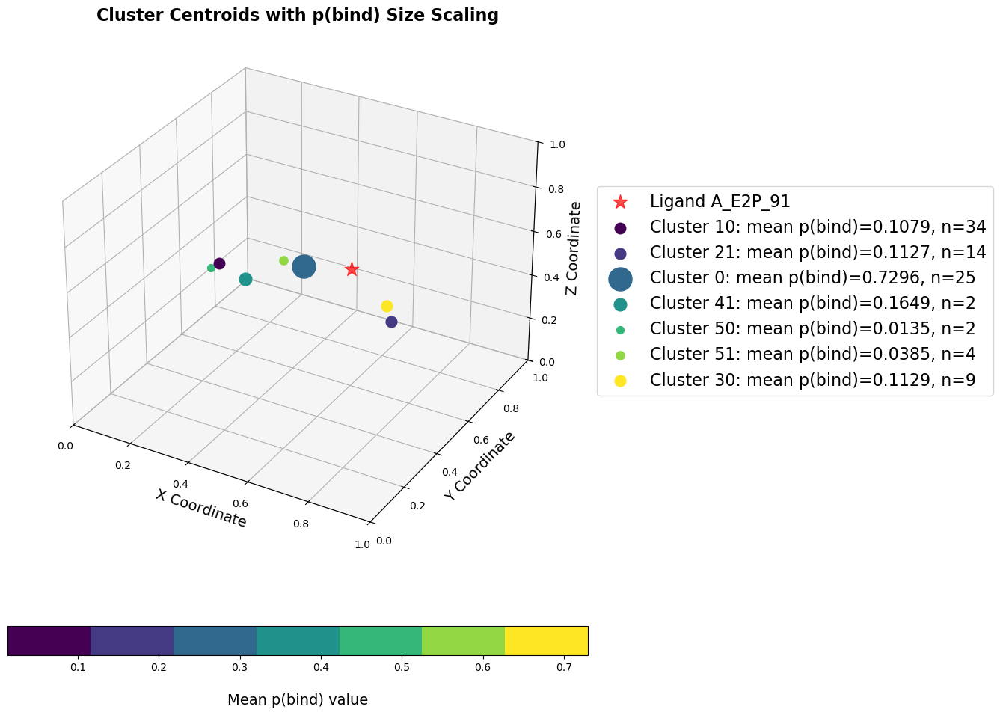

In [18]:
df_1cz2 = dfs["1cz2"]
df_clustered_1cz2, _ = hierarchical_clustering_pipeline(df_1cz2, clustering_method='kmeans',
                                                        feature_columns=['center_of_mass_x', 'center_of_mass_y', 'center_of_mass_z'],
                                                        pbind_column='p(bind)', n_clusters=2, pbind_weight=2, threshold=0.02)
pdb_file_1cz2 = f"{data_path}/1cz2.pdb"
scalers_1cz2 = {
    'center_of_mass_x': scaler.fit(df_1cz2[['center_of_mass_x']]),
    'center_of_mass_y': scaler.fit(df_1cz2[['center_of_mass_y']]),
    'center_of_mass_z': scaler.fit(df_1cz2[['center_of_mass_z']])
}

ligand_centers_1cz2 = calculate_ligand_centers(pdb_file_1cz2)

visualize_centroids_pbind_size(df_clustered_1cz2, ligand_centers_1cz2, scalers_1cz2, pdb_file_1cz2, title="Cluster Centroids with p(bind) Size Scaling")

Initial Clusters' Mean p(bind): 
cluster_iteration_0
0    0.044288
1    0.384186
Name: p(bind), dtype: float64

Initial kmeans clustering results:
Cluster counts: 
cluster_iteration_0
0    122
1     19
Name: count, dtype: int64


🔄 Iteration 1: Re-clustering cluster 0
Iteration 1 Clusters' Mean p(bind): 
cluster_iteration_1
0    0.028369
1    0.058714
Name: p(bind), dtype: float64
Selected cluster 0 for next iteration with mean p(bind): 0.028369
Remaining points: 58

🔄 Iteration 2: Re-clustering cluster 0
Iteration 2 Clusters' Mean p(bind): 
cluster_iteration_2
0    0.028336
1    0.028400
Name: p(bind), dtype: float64
Selected cluster 0 for next iteration with mean p(bind): 0.028336
Remaining points: 28

🔄 Iteration 3: Re-clustering cluster 0
Iteration 3 Clusters' Mean p(bind): 
cluster_iteration_3
0    0.015524
1    0.051397
Name: p(bind), dtype: float64
Selected cluster 0 for next iteration with mean p(bind): 0.015524
Remaining points: 18

Final clustering summary:
               Mea

/opt/miniconda3/envs/protein_pp/lib/python3.11/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/opt/miniconda3/envs/protein_pp/lib/python3.11/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/opt/miniconda3/envs/protein_pp/lib/python3.11/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/opt/miniconda3/envs/protein_pp/lib/python3.11/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/opt/miniconda3/envs/protein_pp/lib/python3.11/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler wa

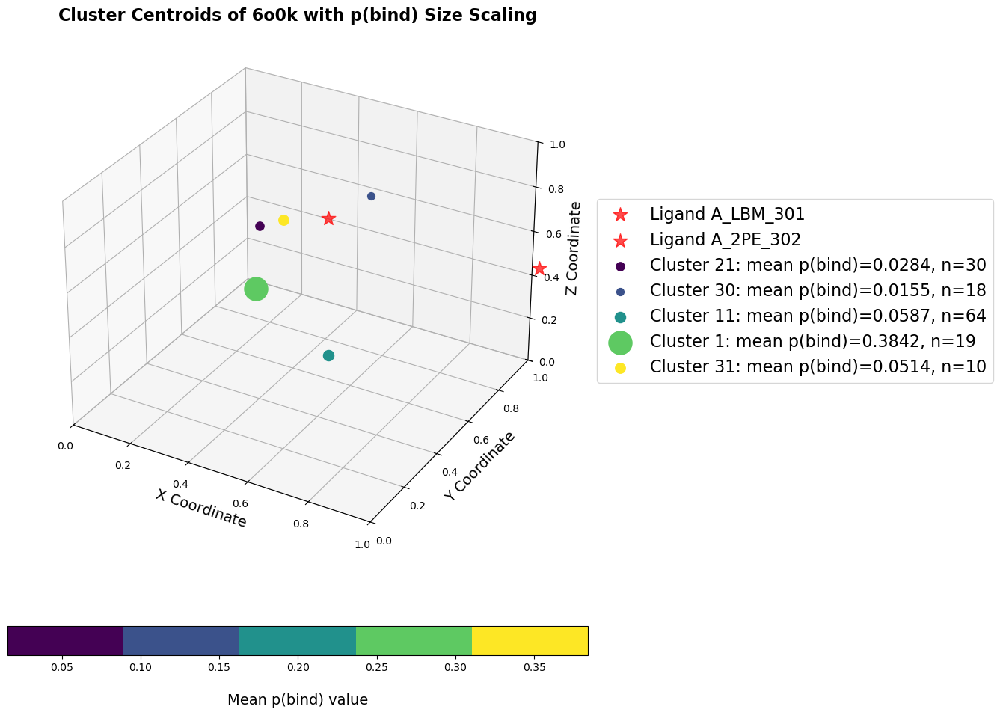

In [19]:
df_6o0k = dfs["6o0k"]
df_clustered_6o0k, _ = hierarchical_clustering_pipeline(df_6o0k, clustering_method='kmeans',
                                                        feature_columns=['center_of_mass_x', 'center_of_mass_y', 'center_of_mass_z'],
                                                        pbind_column='p(bind)', n_clusters=2, pbind_weight=2, threshold=0.02)
pdb_file_6o0k = f"{data_path}/6o0k.pdb"
scalers_6o0k = {
    'center_of_mass_x': scaler.fit(df_6o0k[['center_of_mass_x']]),
    'center_of_mass_y': scaler.fit(df_6o0k[['center_of_mass_y']]),
    'center_of_mass_z': scaler.fit(df_6o0k[['center_of_mass_z']])
}

ligand_centers_6o0k = calculate_ligand_centers(pdb_file_6o0k)

visualize_centroids_pbind_size(df_clustered_6o0k, ligand_centers_6o0k, scalers_6o0k, pdb_file_6o0k, title="Cluster Centroids of 6o0k with p(bind) Size Scaling")

In [20]:
ligand_centers_6o0k

{'A_LBM_301': (-15.258, 2.212, -9.458), 'A_2PE_302': (11.638, 2.891, -8.625)}

In [21]:
distance_cluster_ligand(df_clustered_6o0k, pdb_file_6o0k)


🔍 Calculating cluster-to-ligand distances... {'A_LBM_301': (-15.258, 2.212, -9.458), 'A_2PE_302': (11.638, 2.891, -8.625)}

🎯 High-binding Clusters: [1]
✅ Cluster 1 closest to Ligand A_LBM_301: 8.06 Å

🏆 Best Distance: 8.06 Å


({1: 8.061636958897596}, 8.06, 'A_LBM_301')

According to the results, the best clustering method (most common method in the best params) are kmeans with p_bind_weight = 2, threshold = 0.01, n_clustering = 2

### Grid search of the median filter cluster

In [22]:
# Clustering Functions

### 1️⃣ Determine Optimal Clusters number

def silhouette_analysis(data, max_clusters=10):
    """
    Perform silhouette analysis for a range of clusters and suggest the optimal n_clusters.

    Args:
        data (array-like): Dataset to cluster.
        max_clusters (int): Maximum number of clusters to evaluate.

    Returns:
        tuple: Suggested n_clusters, silhouette scores for each k.
    """
    silhouette_scores = []
    
    for n_clusters in range(2, max_clusters + 1):  # Silhouette starts from k=2
        kmeans = KMeans(n_clusters=n_clusters, random_state=42, n_init=10)
        labels = kmeans.fit_predict(data)
        silhouette_scores.append(silhouette_score(data, labels))

    suggested_k = np.argmax(silhouette_scores) + 2  # +2 because we start at k=2
    print(f"Suggested number of clusters (Silhouette): {suggested_k}")
    print("Silhouette Scores:", silhouette_scores)
    
    return suggested_k, silhouette_scores


def eigengap_heuristic(data, max_clusters=10):
    """
    Determines the optimal number of clusters for Spectral Clustering using the Eigengap heuristic.

    Args:
        data (array-like): Dataset for clustering.
        max_clusters (int): Maximum number of clusters to evaluate.

    Returns:
        int: Suggested number of clusters.
        list: Eigenvalues for visualization.
    """
    # Construct affinity matrix using nearest neighbors graph
    adjacency_matrix = kneighbors_graph(data, n_neighbors=10, mode='connectivity', include_self=True).toarray()
    
    # Compute Laplacian matrix
    laplacian_matrix = laplacian(adjacency_matrix, normed=True)

    # Compute eigenvalues
    eigenvalues, _ = eigh(laplacian_matrix)
    
    # Compute eigengap (difference between consecutive eigenvalues)
    eigengaps = np.diff(eigenvalues[:max_clusters])  # Only first max_clusters eigenvalues
    
    # Find the optimal number of clusters (index of the largest eigengap)
    optimal_k = np.argmax(eigengaps) + 1  # +1 because indexing starts at 0
    
    print(f"Optimal number of clusters (Eigengap): {optimal_k}")
    print("Eigengaps:", eigengaps)
    
    return optimal_k, eigenvalues[:max_clusters]

### 2️⃣ Clustering Functions

def kmeans_clustering(df, feature_columns, n_clusters):
    """
    Perform KMeans clustering and add cluster labels to the DataFrame.

    Args:
        df (pd.DataFrame): Input DataFrame.
        feature_columns (list): List of feature column names.
        n_clusters (int): Number of clusters.

    Returns:
        pd.DataFrame: Updated DataFrame with cluster labels.
        KMeans: Fitted KMeans model.
    """
    features = df[feature_columns].values
    kmeans = KMeans(n_clusters=n_clusters, random_state=42, n_init=10)
    df['kmeans_cluster'] = kmeans.fit_predict(features)
    return df, kmeans


def spectral_clustering(df, feature_columns, n_clusters):
    """
    Perform Spectral clustering and add cluster labels to the DataFrame.

    Args:
        df (pd.DataFrame): Input DataFrame.
        feature_columns (list): List of feature column names.
        n_clusters (int): Number of clusters.

    Returns:
        pd.DataFrame: Updated DataFrame with cluster labels.
        SpectralClustering: Fitted SpectralClustering model.
    """
    features = df[feature_columns].values
    spectral = SpectralClustering(n_clusters=n_clusters, random_state=42, assign_labels='kmeans')
    df['spectral_cluster'] = spectral.fit_predict(features)
    return df, spectral


def gmm_clustering(df, feature_columns, weight_column='p(bind)', max_clusters=10):
    """
    Perform Gaussian Mixture Model (GMM) clustering with automatic cluster selection using BIC.

    Args:
        df (pd.DataFrame): The DataFrame containing data to cluster.
        feature_columns (list): List of spatial features for clustering.
        weight_column (str): The column containing binding probabilities (default: 'p(bind)').
        max_clusters (int): Maximum number of clusters to evaluate.

    Returns:
        pd.DataFrame: The original DataFrame with an additional column 'gmm_cluster'.
        int: The selected optimal number of clusters.
    """
    coordinates = df[feature_columns].values
    weights = df[[weight_column]].values.reshape(-1, 1)

    # Normalize weights
    scaler = MinMaxScaler()
    normalized_weights = scaler.fit_transform(weights).flatten()

    # Combine normalized weights with spatial coordinates
    augmented_data = np.hstack((coordinates, normalized_weights.reshape(-1, 1)))

    # Determine optimal number of clusters using BIC
    bic_scores = []
    n_components_range = range(1, min(len(augmented_data), max_clusters) + 1)  

    for n in n_components_range:
        gmm = GaussianMixture(n_components=n, random_state=42)
        gmm.fit(augmented_data)
        bic_scores.append(gmm.bic(augmented_data))

    optimal_clusters = n_components_range[np.argmin(bic_scores)]
    print(f"Optimal number of clusters (BIC): {optimal_clusters}")

    # Perform GMM clustering
    gmm = GaussianMixture(n_components=optimal_clusters, random_state=42)
    df['gmm_cluster'] = gmm.fit_predict(augmented_data)

    return df, optimal_clusters


def find_best_cluster(idx, remaining_points, dist_matrix, max_diameter):
    """
    Finds the best possible cluster centered around a given index point.
    
    Args:
        idx (int): Index of the point to form a cluster around.
        remaining_points (set): Indices of available points.
        dist_matrix (np.array): Precomputed pairwise distance matrix.
        max_diameter (float): The maximum allowed cluster diameter.
    
    Returns:
        set: Best cluster formed around the given index.
    """
    candidate_cluster = {idx}
    candidate_remaining = remaining_points - candidate_cluster
    
    while True:
        # Find valid points that can be added to the cluster
        nearest_points = [
            i for i in candidate_remaining 
            if max(dist_matrix[i, list(candidate_cluster)]) <= max_diameter
        ]
        
        if not nearest_points:
            break
        
        # Add the point that maintains the smallest cluster diameter
        best_new_point = min(nearest_points, key=lambda i: max(dist_matrix[i, list(candidate_cluster)]))
        candidate_cluster.add(best_new_point)
        candidate_remaining.remove(best_new_point)
    
    return candidate_cluster

def qt_clustering(df, feature_columns, max_diameter = 22.5, n_jobs=-2):
    """
    Perform Quality Threshold (QT) clustering with parallel processing.

    Args:
        df (pd.DataFrame): Input DataFrame containing feature columns.
        feature_columns (list): List of feature column names.
        max_diameter (float): The maximum allowed diameter for a cluster.
        n_jobs (int): Number of parallel jobs (-1 for all available cores).

    Returns:
        pd.DataFrame: DataFrame with cluster labels.
    """
    points = df[feature_columns].values
    print(f"Number of points: {len(points)}")
    print(points)
    num_points = len(points)
    labels = np.full(num_points, -1)  # Initialize all points as unassigned (-1)

    # Precompute pairwise distances using a distance matrix (faster than calculating repeatedly)
    dist_matrix = distance_matrix(points, points)
    #print(f"Distance matrix shape: {dist_matrix.shape}")
    #print(dist_matrix)

    # Track unassigned points
    remaining_points = set(range(num_points))
    cluster_id = 0  # Cluster counter

    while remaining_points:
        # Run parallel cluster formation for all remaining points
        cluster_candidates = Parallel(n_jobs=n_jobs)(
            delayed(find_best_cluster)(idx, remaining_points, dist_matrix, max_diameter) 
            for idx in remaining_points
        )

        # Select the largest valid cluster
        best_cluster = max(cluster_candidates, key=len)

        # Assign cluster labels to the best cluster found
        for point in best_cluster:
            labels[point] = cluster_id

        cluster_id += 1
        remaining_points -= best_cluster  # Remove clustered points

    df['qt_cluster'] = labels
    return df

### 3️⃣ Feature Normalization
# Filter by p(bind) cutoff# Normalize within clusters
def normalize_within_clusters(df, cluster_column, pbind_column):
    """
    Normalize p(bind) values within each cluster.

    Args:
        df (pd.DataFrame): Input DataFrame.
        cluster_column (str): Column containing cluster IDs.
        pbind_column (str): Column containing p(bind) values.

    Returns:
        pd.DataFrame: Updated DataFrame with normalized p(bind) values.
    """
    df[f"normalized_{pbind_column}"] = df.groupby(cluster_column)[pbind_column].transform(
        lambda x: (x - x.min()) / (x.max() - x.min())
    )
    return df

# Filter by p(bind) cutoff
def filter_by_pbind_cutoff(df, pbind_column, cluster_column, cutoff_method, std_factor):
    """
    Filter residues based on p(bind) cutoff.

    Args:
        df (pd.DataFrame): Input DataFrame.
        pbind_column (str): Column containing p(bind) values.
        cluster_column (str): Column containing cluster IDs.
        cutoff_method (str): Method for calculating cutoff ('median_std' or 'percentile').
        std_factor (float): Factor for standard deviation in cutoff calculation.

    Returns:
        pd.DataFrame: Filtered DataFrame.
    """
    filtered_df = pd.DataFrame()

    for cluster_id in df[cluster_column].unique():
        cluster_data = df[df[cluster_column] == cluster_id]
        if cutoff_method == 'median_std':
            median_value = cluster_data[pbind_column].median()
            std_value = cluster_data[pbind_column].std()
            cutoff = median_value + std_factor * std_value
        elif cutoff_method == 'percentile':
            cutoff = cluster_data[pbind_column].quantile(0.95)
        else:
            raise ValueError("Invalid cutoff method. Use 'median_std' or 'percentile'.")

        filtered_cluster = cluster_data[cluster_data[pbind_column] > cutoff]
        filtered_df = pd.concat([filtered_df, filtered_cluster])

    return filtered_df.reset_index(drop=True)

def calculate_cluster_centers():
    cmd.load(pdb_file, "protein")
    cluster_centers = {}
    for cluster_id in df[cluster_column].unique():
        cluster_data = df[df[cluster_column] == cluster_id]
        resi_selection = "+".join(map(str, cluster_data['resi']))
        cmd.select(f"cluster_{cluster_id}", f"resi {resi_selection}")
        center_of_mass = cmd.centerofmass(f"cluster_{cluster_id}")
        cluster_centers[cluster_id] = tuple(round(coord, 3) for coord in center_of_mass)
    cmd.delete("all")
    return cluster_centers

def calculate_ligand_centers():
        cmd.load(pdb_file, "protein")
        cmd.select("ligands", "organic")
        ligand_centers = {}
        for atom in cmd.get_model("ligands").atom:
            ligand_id = f"{atom.chain}_{atom.resn}_{atom.resi}"
            cmd.select("ligand", f"chain {atom.chain} and resn {atom.resn} and resi {atom.resi}")
            center_of_mass = cmd.centerofmass("ligand")
            ligand_centers[ligand_id] = tuple(round(coord, 3) for coord in center_of_mass)
        cmd.delete("all")
        return ligand_centers

# Evaluate clustering
def evaluate_clustering(pdb_file, df, cluster_column):
    """
    Evaluate clustering by calculating distances between clusters and ligands.

    Args:
        pdb_file (str): Path to the PDB file.
        df (pd.DataFrame): Input DataFrame.
        cluster_column (str): Column containing cluster IDs.

    Returns:
        dict: Distances between clusters and ligands.
    """

    cluster_centers = calculate_cluster_centers()
    ligand_centers = calculate_ligand_centers()

    distances = {}
    for cluster_id, cluster_center in cluster_centers.items():
        min_distance = float('inf')
        closest_ligand = None

        for ligand_id, ligand_center in ligand_centers.items():
            distance = np.linalg.norm(np.array(cluster_center) - np.array(ligand_center))
            if distance < min_distance:
                min_distance = round(distance, 3)
                closest_ligand = ligand_id

        distances[cluster_id] = (closest_ligand, min_distance)

    return distances

# Run pipeline
def run_pipeline(data_path, pdb_file, clustering_method, cluster_params, pbind_column, cutoff_method, std_factor):
    """
    Run the full clustering pipeline.

    Args:
        data_path (str): Path to data directory.
        pdb_file (str): Path to the PDB file.
        clustering_method (str): Clustering method ('kmeans', 'spectral').
        cluster_params (dict): Parameters for the clustering method.
        pbind_column (str): Column containing p(bind) values.
        cutoff_method (str): Method for p(bind) cutoff ('median_std', 'percentile').
        std_factor (float): Standard deviation factor for cutoff.

    Returns:
        dict: Results including clustered DataFrame and evaluation metrics.
    """
    df = process_and_update_pdb_data(data_path, pdb_file.split("/")[-1].split(".")[0])

    if clustering_method == 'kmeans':
        df, _ = kmeans_clustering(df, **cluster_params)
    elif clustering_method == 'spectral':
        df, _ = spectral_clustering(df, **cluster_params)
    elif clustering_method == 'gmm':
        df, _ = gmm_clustering(df, **cluster_params)
    else:
        raise ValueError("Invalid clustering method. Choose 'kmeans' or 'spectral'.")

    cluster_column = f"{clustering_method}_cluster"
    df = normalize_within_clusters(df, cluster_column=cluster_column, pbind_column=pbind_column)
    df_filtered = filter_by_pbind_cutoff(df, pbind_column=pbind_column, cluster_column=cluster_column, cutoff_method=cutoff_method, std_factor=std_factor)
    evaluation = evaluate_clustering(pdb_file, df_filtered, cluster_column=cluster_column)

    return {
        "clustered_df": df_filtered,
        "evaluation": evaluation
    }


# Example Usage
# df = run_pipeline(dataframe, clustering_method='kmeans', feature_columns=['x', 'y', 'z'], max_clusters=10)

In [23]:
def grid_search_med_clustering(df, std_factors, feature_columns, pbind_column, pbind_weights, ligand_centers, output_csv="grid_search_results.csv"):
    """
    Perform grid search with median cutoff filtering and save results.

    Args:
        df (pd.DataFrame): Input DataFrame.
        std_factors (list): List of standard deviation factors for filtering.
        feature_columns (list): Feature columns for clustering.
        pbind_column (str): Column name for p(bind).
        pbind_weights (list): List of weights to apply to p(bind).
        ligand_centers (dict): Dictionary of ligand centers.
        output_csv (str): File path to save grid search results.

    Returns:
        dict: Best parameters for each weight.
        dict: Best distance for each weight.
        pd.DataFrame: DataFrame with all calculated values.
    """

    # Initialize list to store all results
    results = []
    best_params_overall = {}
    best_distance_overall = {}

    # Compute median and std for filtering
    median_value = df[pbind_column].median()
    std_value = df[pbind_column].std()

    for std_filter in std_factors:
        # Compute cutoff threshold
        cutoff = median_value + std_filter * std_value
        df_filtered = df.loc[df[pbind_column] > cutoff]

        # 🛑 Skip clustering if fewer than 3 entries remain
        if df_filtered.shape[0] < 3:
            print(f"⚠️ Skipping std_factor={std_filter} as only {df_filtered.shape[0]} entries remain. Setting distance to inf.")
            for weight in pbind_weights:
                best_params_overall[weight] = {'std_factor': std_filter, 'pbind_weight': weight, 'distance': float('inf')}
                best_distance_overall[weight] = float('inf')
            continue

        print(f"✅ Number of residues higher than cutoff (std_factor={std_filter}): {df_filtered.shape[0]}")

        for weight in pbind_weights:
            weighted_columns = [f"{col}_normalized" for col in feature_columns] + [f"{pbind_column}_weight_{weight}"]

            # 🛑 Ensure enough points exist for clustering
            if df_filtered.shape[0] < 3:
                print(f"⚠️ Skipping weight {weight} due to insufficient data ({df_filtered.shape[0]} points).")
                best_params_overall[weight] = {'std_factor': std_filter, 'pbind_weight': weight, 'distance': float('inf')}
                best_distance_overall[weight] = float('inf')
                continue

            # 🔹 Step 2: Determine optimal number of clusters safely
            try:
                optimal_kmeans, _ = silhouette_analysis(df_filtered[weighted_columns].values, max_clusters=min(10, len(df_filtered) - 1))
                optimal_spectral, _ = eigengap_heuristic(df_filtered[weighted_columns].values, max_clusters=min(10, len(df_filtered) - 1))
                _, optimal_gmm = gmm_clustering(df_filtered, feature_columns=weighted_columns, max_clusters=min(10, len(df_filtered) - 1))
            except ValueError as e:
                print(f"⚠️ Skipping clustering for weight {weight} due to error: {e}")
                best_params_overall[weight] = {'std_factor': std_filter, 'pbind_weight': weight, 'distance': float('inf')}
                best_distance_overall[weight] = float('inf')
                continue

            # 🔹 Step 3: Run Clustering with Optimal Clusters
            df_kmeans, _ = kmeans_clustering(df_filtered, weighted_columns, n_clusters=optimal_kmeans)
            df_spectral, _ = spectral_clustering(df_filtered, weighted_columns, n_clusters=optimal_spectral)
            df_gmm, _ = gmm_clustering(df_filtered, feature_columns=weighted_columns, max_clusters=optimal_gmm)

            # Store cluster labels
            df_filtered[f'kmeans_pbind_{weight}'] = df_kmeans['kmeans_cluster']
            df_filtered[f'spectral_pbind_{weight}'] = df_spectral['spectral_cluster']
            df_filtered[f'gmm_pbind_{weight}'] = df_gmm['gmm_cluster']

            # 🔹 Compute & Store Centroids
            def compute_centroids(df, cluster_column):
                return df.groupby(cluster_column)[['center_of_mass_x', 'center_of_mass_y', 'center_of_mass_z']].mean()

            centroids = {
                f'kmeans_pbind_{weight}': compute_centroids(df_filtered, f'kmeans_pbind_{weight}'),
                f'spectral_pbind_{weight}': compute_centroids(df_filtered, f'spectral_pbind_{weight}'),
                f'gmm_pbind_{weight}': compute_centroids(df_filtered, f'gmm_pbind_{weight}')
            }

            print(f"🔹 Weight {weight} - KMeans: {optimal_kmeans} clusters")
            print(centroids[f'kmeans_pbind_{weight}'])

            # 🔹 Compute Best Cluster Distances
            best_params = {}
            for method in ['kmeans', 'spectral', 'gmm']:
                cluster_distances = {}

                for cluster_id, centroid in centroids[f'{method}_pbind_{weight}'].iterrows():
                    distances = calculate_distances_between_clusters_and_ligands(
                        {cluster_id: centroid.tolist()}, ligand_centers
                    )

                    if distances:
                        cluster_distances[cluster_id] = min(distances.values())

                # Find best cluster (minimum distance)
                if cluster_distances:
                    best_cluster = min(cluster_distances, key=cluster_distances.get)
                    best_distance = cluster_distances[best_cluster]
                    best_params[method] = {
                        'cluster': best_cluster, 
                        'distance': best_distance, 
                        'pbind_weight': weight, 
                        'std_factor': std_filter
                    }

                    print(f"✅ Weight {weight} - {method.upper()}: Best Cluster = {best_cluster}, Best Distance = {best_distance}")

                    # Store all results in a list for later conversion to DataFrame
                    results.append({
                        'method': method,
                        'pbind_weight': weight,
                        'std_factor': std_filter,
                        'optimal_clusters': {
                            'kmeans': optimal_kmeans,
                            'spectral': optimal_spectral,
                            'gmm': optimal_gmm
                        },
                        'best_cluster': best_cluster,
                        'best_distance': best_distance[1],  # Fixed syntax error
                        'ligand_to_best_distance': best_distance[0]
                    })

            # Convert results to DataFrame
            result_df = pd.DataFrame(results)
            result_df.sort_values(by='best_distance', inplace=True)

            if not result_df.empty:
                # Get the best overall distance and parameters
                best_distance_overall[weight] = result_df['best_distance'].min()

                # get row with the best distance
                best_params_overall[weight] = result_df[result_df['best_distance'] == best_distance_overall[weight]].iloc[0].to_dict()

    
    # Save results to CSV
    result_df.to_csv(output_csv, index=False)
    
    return result_df


In [29]:
# Define parameters
pbind_weights = [1,2, 5, 10,20,50, 100]
std_factors = [1, 1.5, 2, 2.5, 5]

# calculate the grid search for 6o0k
df_6o0k = dfs['6o0k']
pdb_file_6o0k = data_path+"/6o0k.pdb"
ligand_centers_6o0k = calculate_ligand_centers(pdb_file_6o0k)

# Example Usage
results_df_6o0k = grid_search_med_clustering(
    df_6o0k, std_factors, feature_columns, "p(bind)", pbind_weights, ligand_centers_6o0k
)

✅ Number of residues higher than cutoff (std_factor=1): 22
Suggested number of clusters (Silhouette): 2
Silhouette Scores: [0.2557361135097594, 0.22019695622433447, 0.20923206320432944, 0.19219428184259515, 0.1894350459297693, 0.1892645206283577, 0.20815799911635063, 0.19205860314250833, 0.23904334717425507]
Optimal number of clusters (Eigengap): 2
Eigengaps: [0.26505568 0.35639561 0.08535411 0.12226945 0.10342739 0.05212201
 0.02307744 0.00592899 0.09434302]
Optimal number of clusters (BIC): 1
Optimal number of clusters (BIC): 1
🔹 Weight 1 - KMeans: 2 clusters
                center_of_mass_x  center_of_mass_y  center_of_mass_z
kmeans_pbind_1                                                      
0                        -5.4365            1.3315        -15.789417
1                       -11.1967            2.6403        -13.497600
✅ Weight 1 - KMEANS: Best Cluster = 1, Best Distance = ('A_LBM_301', 5.744)
✅ Weight 1 - SPECTRAL: Best Cluster = 1, Best Distance = ('A_LBM_301', 6.49)
✅ W

/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:140: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['gmm_cluster'] = gmm.fit_predict(augmented_data)
/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['spectral_cluster'] = spectral.fit_predict(features)
/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:140: SettingWithCopyWarning: 
A value is trying to be set on a cop

Suggested number of clusters (Silhouette): 2
Silhouette Scores: [0.570792219723158, 0.549847322840498, 0.5212270139065547, 0.3241183261882274, 0.34023508753411247, 0.2821059753331105, 0.30145751733633913, 0.25195853652285705, 0.22463370725113885]
Optimal number of clusters (Eigengap): 2
Eigengaps: [0.32793641 0.54420583 0.15626453 0.14176157 0.04600147 0.03455982
 0.00604633 0.03414714 0.02489443]
Optimal number of clusters (BIC): 9
Optimal number of clusters (BIC): 9
🔹 Weight 5 - KMeans: 2 clusters
                center_of_mass_x  center_of_mass_y  center_of_mass_z
kmeans_pbind_5                                                      
0                         -6.671          1.814533        -15.156200
1                        -11.020          2.166143        -13.872286
✅ Weight 5 - KMEANS: Best Cluster = 1, Best Distance = ('A_LBM_301', 6.12)
✅ Weight 5 - SPECTRAL: Best Cluster = 0, Best Distance = ('A_LBM_301', 6.12)
✅ Weight 5 - GMM: Best Cluster = 4, Best Distance = ('A_2PE_302', 7

/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:140: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['gmm_cluster'] = gmm.fit_predict(augmented_data)
/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['spectral_cluster'] = spectral.fit_predict(features)
/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:140: SettingWithCopyWarning: 
A value is trying to be set on a cop

Optimal number of clusters (BIC): 7
🔹 Weight 20 - KMeans: 3 clusters
                 center_of_mass_x  center_of_mass_y  center_of_mass_z
kmeans_pbind_20                                                      
0                       -5.866273          2.074455        -14.195818
1                       -9.572600          1.550600        -13.789000
2                      -10.802167          1.968167        -16.558333
✅ Weight 20 - KMEANS: Best Cluster = 1, Best Distance = ('A_LBM_301', 7.178)
✅ Weight 20 - SPECTRAL: Best Cluster = 0, Best Distance = ('A_LBM_301', 7.711)
✅ Weight 20 - GMM: Best Cluster = 5, Best Distance = ('A_2PE_302', 13.065)
Suggested number of clusters (Silhouette): 3
Silhouette Scores: [0.6477245879693313, 0.6805285997762858, 0.6629023924928862, 0.5699583166395508, 0.6230618720870313, 0.6362963999784509, 0.6236989818418994, 0.5756047087958316, 0.5326795843069178]
Optimal number of clusters (Eigengap): 2
Eigengaps: [0.28775316 0.54577419 0.27606157 0.07862568 0.025114

/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:140: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['gmm_cluster'] = gmm.fit_predict(augmented_data)
/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['spectral_cluster'] = spectral.fit_predict(features)
/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:140: SettingWithCopyWarning: 
A value is trying to be set on a cop

Suggested number of clusters (Silhouette): 4
Silhouette Scores: [0.22083352057070413, 0.20352474327357503, 0.24078402722874695, 0.2365918800221482, 0.22320973967391255, 0.20660665683402152, 0.18562279433496948, 0.19502815804576137, 0.17776727128912334]
Optimal number of clusters (Eigengap): 1
Eigengaps: [0.53889399 0.25799132 0.05581668 0.03696968 0.0720808  0.07499207
 0.0319263  0.08197678 0.03256517]
Optimal number of clusters (BIC): 6
Optimal number of clusters (BIC): 6
🔹 Weight 1 - KMeans: 4 clusters
                center_of_mass_x  center_of_mass_y  center_of_mass_z
kmeans_pbind_1                                                      
0                      -9.399000          1.302250        -19.830500
1                      -9.883500          2.781833        -13.920500
2                     -14.924333          0.578667        -10.614667
3                      -3.751500          1.448000         -9.779500
✅ Weight 1 - KMEANS: Best Cluster = 2, Best Distance = ('A_LBM_301', 2.029)

/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:140: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['gmm_cluster'] = gmm.fit_predict(augmented_data)
/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['spectral_cluster'] = spectral.fit_predict(features)
/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:140: SettingWithCopyWarning: 
A value is trying to be set on a cop

Optimal number of clusters (BIC): 7
🔹 Weight 5 - KMeans: 3 clusters
                center_of_mass_x  center_of_mass_y  center_of_mass_z
kmeans_pbind_5                                                      
0                     -10.802167          1.968167        -16.558333
1                      -9.572600          1.550600        -13.789000
2                      -9.124250          1.742500        -11.488250
✅ Weight 5 - KMEANS: Best Cluster = 2, Best Distance = ('A_LBM_301', 6.478)
✅ Weight 5 - SPECTRAL: Best Cluster = 1, Best Distance = ('A_LBM_301', 7.178)
✅ Weight 5 - GMM: Best Cluster = 6, Best Distance = ('A_LBM_301', 3.82)
Suggested number of clusters (Silhouette): 3
Silhouette Scores: [0.5555694662422316, 0.6123090688466913, 0.5812555522633804, 0.5967679992971909, 0.5552430749358026, 0.42528444349581424, 0.3535850666103505, 0.31020308324944873, 0.2839125108585326]
Optimal number of clusters (Eigengap): 2
Eigengaps: [0.48392536 0.63897485 0.05724995 0.01206528 0.02887262 0.0315

/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:140: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['gmm_cluster'] = gmm.fit_predict(augmented_data)
/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['spectral_cluster'] = spectral.fit_predict(features)
/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:140: SettingWithCopyWarning: 
A value is trying to be set on a cop

Optimal number of clusters (BIC): 5
Optimal number of clusters (BIC): 5
🔹 Weight 1 - KMeans: 4 clusters
                center_of_mass_x  center_of_mass_y  center_of_mass_z
kmeans_pbind_1                                                      
0                        -7.2990            1.9980        -20.064333
1                       -10.2740            5.8020        -13.364500
2                       -15.7390           -1.5615        -12.289500
3                        -9.1025           -3.2585        -15.032500
✅ Weight 1 - KMEANS: Best Cluster = 2, Best Distance = ('A_LBM_301', 4.742)
✅ Weight 1 - SPECTRAL: Best Cluster = 0, Best Distance = ('A_LBM_301', 7.711)
✅ Weight 1 - GMM: Best Cluster = 2, Best Distance = ('A_LBM_301', 4.742)
Suggested number of clusters (Silhouette): 2
Silhouette Scores: [0.38203331627764037, 0.2962247124997146, 0.3391147156414796, 0.3325224147472795, 0.2600792930790394, 0.20889233362164059, 0.1600336194544126, 0.11129157235780328, 0.05866865282383578]
Optima

/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:140: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['gmm_cluster'] = gmm.fit_predict(augmented_data)
/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['spectral_cluster'] = spectral.fit_predict(features)
/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:140: SettingWithCopyWarning: 
A value is trying to be set on a cop

Optimal number of clusters (BIC): 4
🔹 Weight 5 - KMeans: 2 clusters
                center_of_mass_x  center_of_mass_y  center_of_mass_z
kmeans_pbind_5                                                      
0                     -10.802167          1.968167        -16.558333
1                      -9.572600          1.550600        -13.789000
✅ Weight 5 - KMEANS: Best Cluster = 1, Best Distance = ('A_LBM_301', 7.178)
✅ Weight 5 - SPECTRAL: Best Cluster = 0, Best Distance = ('A_LBM_301', 7.711)
✅ Weight 5 - GMM: Best Cluster = 2, Best Distance = ('A_LBM_301', 4.584)
Suggested number of clusters (Silhouette): 2
Silhouette Scores: [0.6191699348266846, 0.5586459072304294, 0.5586524446715595, 0.5020275478151208, 0.4042556702440337, 0.3450984202064405, 0.16994967014274634, 0.06879646719563111, 0.08059933751678477]
Optimal number of clusters (Eigengap): 1
Eigengaps: [9.67594956e-01 1.69661179e-01 6.54533174e-02 4.44089210e-16
 0.00000000e+00 0.00000000e+00 0.00000000e+00 4.44089210e-16
 1.3353

/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:140: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['gmm_cluster'] = gmm.fit_predict(augmented_data)
/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['spectral_cluster'] = spectral.fit_predict(features)
/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:140: SettingWithCopyWarning: 
A value is trying to be set on a cop

Optimal number of clusters (Eigengap): 1
Eigengaps: [9.67594956e-01 1.69661179e-01 6.54533174e-02 4.44089210e-16
 0.00000000e+00 0.00000000e+00 0.00000000e+00 4.44089210e-16
 1.33530636e-01]
Optimal number of clusters (BIC): 5
Optimal number of clusters (BIC): 5
🔹 Weight 50 - KMeans: 4 clusters
                 center_of_mass_x  center_of_mass_y  center_of_mass_z
kmeans_pbind_50                                                      
0                         -8.8840          1.099750        -17.797250
1                         -9.8715          5.636000        -13.598500
2                        -13.0640          3.469333        -13.281333
3                         -9.1025         -3.258500        -15.032500
✅ Weight 50 - KMEANS: Best Cluster = 2, Best Distance = ('A_LBM_301', 4.584)
✅ Weight 50 - SPECTRAL: Best Cluster = 0, Best Distance = ('A_LBM_301', 7.711)
✅ Weight 50 - GMM: Best Cluster = 2, Best Distance = ('A_LBM_301', 4.897)
Suggested number of clusters (Silhouette): 4
Silhouett

/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:140: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['gmm_cluster'] = gmm.fit_predict(augmented_data)
/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['spectral_cluster'] = spectral.fit_predict(features)
/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:140: SettingWithCopyWarning: 
A value is trying to be set on a cop

Suggested number of clusters (Silhouette): 2
Silhouette Scores: [0.38203331627764037, 0.2962247124997146, 0.3391147156414796, 0.3325224147472795, 0.2600792930790394, 0.20889233362164059, 0.1600336194544126, 0.11129157235780328, 0.05866865282383578]
Optimal number of clusters (Eigengap): 1
Eigengaps: [1.01829823e+00 6.60825351e-02 1.00000000e-01 0.00000000e+00
 2.22044605e-16 2.22044605e-16 9.01354460e-03 8.74028167e-03
 6.29488343e-02]
Optimal number of clusters (BIC): 4
Optimal number of clusters (BIC): 4
🔹 Weight 2 - KMeans: 2 clusters
                center_of_mass_x  center_of_mass_y  center_of_mass_z
kmeans_pbind_2                                                      
0                     -10.802167          1.968167        -16.558333
1                      -9.572600          1.550600        -13.789000
✅ Weight 2 - KMEANS: Best Cluster = 1, Best Distance = ('A_LBM_301', 7.178)
✅ Weight 2 - SPECTRAL: Best Cluster = 0, Best Distance = ('A_LBM_301', 7.711)
✅ Weight 2 - GMM: Best Clu

/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:140: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['gmm_cluster'] = gmm.fit_predict(augmented_data)
/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['spectral_cluster'] = spectral.fit_predict(features)
/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:140: SettingWithCopyWarning: 
A value is trying to be set on a cop

Suggested number of clusters (Silhouette): 2
Silhouette Scores: [0.6409812236692338, 0.588962049242136, 0.6360800645824987, 0.6018542476483772, 0.5050211693041807, 0.419528602119288, 0.2868920870772207, 0.15182901545557767, 0.1087409573914358]
Optimal number of clusters (Eigengap): 1
Eigengaps: [9.67594956e-01 1.69661179e-01 6.54533174e-02 4.44089210e-16
 0.00000000e+00 0.00000000e+00 0.00000000e+00 4.44089210e-16
 1.33530636e-01]
Optimal number of clusters (BIC): 4
Optimal number of clusters (BIC): 4
🔹 Weight 20 - KMeans: 2 clusters
                 center_of_mass_x  center_of_mass_y  center_of_mass_z
kmeans_pbind_20                                                      
0                      -10.802167          1.968167        -16.558333
1                       -9.572600          1.550600        -13.789000
✅ Weight 20 - KMEANS: Best Cluster = 1, Best Distance = ('A_LBM_301', 7.178)
✅ Weight 20 - SPECTRAL: Best Cluster = 0, Best Distance = ('A_LBM_301', 7.711)
✅ Weight 20 - GMM: Best 

/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:140: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['gmm_cluster'] = gmm.fit_predict(augmented_data)
/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['spectral_cluster'] = spectral.fit_predict(features)
/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:140: SettingWithCopyWarning: 
A value is trying to be set on a cop

In [30]:
calculate_ligand_centers(pdb_file_3hvc)

{'A_GG5_361': (-3.732, 37.54, 19.149), 'A_GG5_362': (24.619, 22.289, 26.946)}

In [31]:
# calculate the grid search for 6o0k
df_3hvc = dfs['3hvc']
pdb_file_3hvc = data_path+"/3hvc.pdb"
ligand_centers_3hvc = calculate_ligand_centers(pdb_file_3hvc)

result_df_3hvc = grid_search_med_clustering(
    df_3hvc, std_factors, feature_columns, "p(bind)", pbind_weights, ligand_centers_3hvc
)

best_distance = results_df_6o0k['best_distance'].min()
best_params = results_df_6o0k[results_df_6o0k['best_distance'] == best_distance].iloc[0].to_dict()

print(f"Best Distance: {best_distance}")
print(f"Best Parameters: {best_params}")

✅ Number of residues higher than cutoff (std_factor=1): 54
Suggested number of clusters (Silhouette): 4
Silhouette Scores: [0.3275199752633735, 0.318864946416632, 0.353051802765197, 0.3459807351397049, 0.34881876821981017, 0.34092458867530195, 0.3041891727866996, 0.3067997360143117, 0.2537728462699949]
Optimal number of clusters (Eigengap): 1
Eigengaps: [0.38647238 0.06923868 0.06656129 0.05403407 0.2145988  0.04620094
 0.17363384 0.02579775 0.03587597]
Optimal number of clusters (BIC): 1
Optimal number of clusters (BIC): 1
🔹 Weight 1 - KMeans: 4 clusters
                center_of_mass_x  center_of_mass_y  center_of_mass_z
kmeans_pbind_1                                                      
0                       0.192909         41.795364         14.327091
1                       2.325789         32.156000         26.365895
2                      -1.929333         33.958917         21.158917
3                      20.789583         26.619833         17.409750
✅ Weight 1 - KMEANS: Bes

/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:140: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['gmm_cluster'] = gmm.fit_predict(augmented_data)
/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['spectral_cluster'] = spectral.fit_predict(features)
/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:140: SettingWithCopyWarning: 
A value is trying to be set on a cop

Suggested number of clusters (Silhouette): 2
Silhouette Scores: [0.6651350996296651, 0.5406618710250409, 0.3720496392743267, 0.35516056648347455, 0.3377028690440551, 0.3305722811585412, 0.29593035966856435, 0.3048777926485517, 0.30749540083741256]
Optimal number of clusters (Eigengap): 5
Eigengaps: [0.08836261 0.08994018 0.14835577 0.07161667 0.16006234 0.04912842
 0.06681204 0.14588448 0.03711703]
Optimal number of clusters (BIC): 1
Optimal number of clusters (BIC): 1
🔹 Weight 5 - KMeans: 2 clusters
                center_of_mass_x  center_of_mass_y  center_of_mass_z
kmeans_pbind_5                                                      
0                       7.555225         32.825125         20.976425
1                      -2.112429         34.618071         20.165500
✅ Weight 5 - KMEANS: Best Cluster = 1, Best Distance = ('A_GG5_361', 3.492)
✅ Weight 5 - SPECTRAL: Best Cluster = 3, Best Distance = ('A_GG5_361', 2.827)
✅ Weight 5 - GMM: Best Cluster = 0, Best Distance = ('A_GG5_361'

/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['spectral_cluster'] = spectral.fit_predict(features)
/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:140: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['gmm_cluster'] = gmm.fit_predict(augmented_data)
/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/60628077.py:71: SettingWithCopyWarning: 
A value is trying to be set on a copy o

Suggested number of clusters (Silhouette): 2
Silhouette Scores: [0.7223951401060794, 0.6568536641063751, 0.53605959490202, 0.5524254819662332, 0.5336501011860183, 0.5342388785024954, 0.49077298075673187, 0.5124817364360582, 0.5318142529067297]
Optimal number of clusters (Eigengap): 5
Eigengaps: [0.1035107  0.03795041 0.07474891 0.14766686 0.2225611  0.12214995
 0.17550323 0.0290897  0.06158669]
Optimal number of clusters (BIC): 1
Optimal number of clusters (BIC): 1
🔹 Weight 20 - KMeans: 2 clusters
                 center_of_mass_x  center_of_mass_y  center_of_mass_z
kmeans_pbind_20                                                      
0                        7.555225         32.825125         20.976425
1                       -2.112429         34.618071         20.165500
✅ Weight 20 - KMEANS: Best Cluster = 1, Best Distance = ('A_GG5_361', 3.492)
✅ Weight 20 - SPECTRAL: Best Cluster = 2, Best Distance = ('A_GG5_361', 2.128)
✅ Weight 20 - GMM: Best Cluster = 0, Best Distance = ('A_GG5_

/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:140: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['gmm_cluster'] = gmm.fit_predict(augmented_data)
/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['spectral_cluster'] = spectral.fit_predict(features)
/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:140: SettingWithCopyWarning: 
A value is trying to be set on a cop

Suggested number of clusters (Silhouette): 2
Silhouette Scores: [0.7296145030771379, 0.673862743333288, 0.5756602987903163, 0.6122712419676302, 0.5930775981313592, 0.5880200122340553, 0.6264611404357978, 0.6236856920800837, 0.6504811987351893]
Optimal number of clusters (Eigengap): 7
Eigengaps: [0.03323866 0.05649704 0.04935638 0.161895   0.20456778 0.04754473
 0.24229161 0.0552114  0.05930449]
Optimal number of clusters (BIC): 1
Optimal number of clusters (BIC): 1
🔹 Weight 100 - KMeans: 2 clusters
                  center_of_mass_x  center_of_mass_y  center_of_mass_z
kmeans_pbind_100                                                      
0                         7.555225         32.825125         20.976425
1                        -2.112429         34.618071         20.165500
✅ Weight 100 - KMEANS: Best Cluster = 1, Best Distance = ('A_GG5_361', 3.492)
✅ Weight 100 - SPECTRAL: Best Cluster = 3, Best Distance = ('A_GG5_361', 1.69)
✅ Weight 100 - GMM: Best Cluster = 0, Best Distance = (

/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:140: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['gmm_cluster'] = gmm.fit_predict(augmented_data)
/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['spectral_cluster'] = spectral.fit_predict(features)
/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:140: SettingWithCopyWarning: 
A value is trying to be set on a cop

Optimal number of clusters (BIC): 1
🔹 Weight 2 - KMeans: 2 clusters
                center_of_mass_x  center_of_mass_y  center_of_mass_z
kmeans_pbind_2                                                      
0                       4.148000         35.417435         19.637087
1                      -2.613545         33.926182         21.418636
✅ Weight 2 - KMEANS: Best Cluster = 1, Best Distance = ('A_GG5_361', 4.412)
✅ Weight 2 - SPECTRAL: Best Cluster = 2, Best Distance = ('A_GG5_361', 1.461)
✅ Weight 2 - GMM: Best Cluster = 0, Best Distance = ('A_GG5_361', 6.35)
Suggested number of clusters (Silhouette): 2
Silhouette Scores: [0.6400307955233691, 0.5381601514803593, 0.4374919636900878, 0.4075468986296049, 0.3464076165472256, 0.3384881527221619, 0.34646554224608533, 0.35207619296249537, 0.3806319851035223]
Optimal number of clusters (Eigengap): 3
Eigengaps: [0.04075813 0.19861198 0.31401329 0.06503305 0.18040912 0.03747183
 0.0987798  0.02913377 0.0302715 ]
Optimal number of clusters (B

/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:140: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['gmm_cluster'] = gmm.fit_predict(augmented_data)
/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['spectral_cluster'] = spectral.fit_predict(features)
/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:140: SettingWithCopyWarning: 
A value is trying to be set on a cop

Optimal number of clusters (BIC): 1
Optimal number of clusters (BIC): 1
🔹 Weight 100 - KMeans: 2 clusters
                  center_of_mass_x  center_of_mass_y  center_of_mass_z
kmeans_pbind_100                                                      
0                        -1.929333         33.958917         21.158917
1                         4.082136         35.467364         19.697773
✅ Weight 100 - KMEANS: Best Cluster = 0, Best Distance = ('A_GG5_361', 4.485)
✅ Weight 100 - SPECTRAL: Best Cluster = 1, Best Distance = ('A_GG5_361', 5.12)
✅ Weight 100 - GMM: Best Cluster = 0, Best Distance = ('A_GG5_361', 6.35)
✅ Number of residues higher than cutoff (std_factor=2): 21
Suggested number of clusters (Silhouette): 3
Silhouette Scores: [0.30939539303786484, 0.34644868130832435, 0.32233016870283826, 0.279141607662276, 0.22909718266984788, 0.25379103226825733, 0.19976697751066017, 0.2286402655461434, 0.2362650698077855]
Optimal number of clusters (Eigengap): 1
Eigengaps: [0.65327248 0.1524

/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['spectral_cluster'] = spectral.fit_predict(features)
/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:140: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['gmm_cluster'] = gmm.fit_predict(augmented_data)
/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/60628077.py:71: SettingWithCopyWarning: 
A value is trying to be set on a copy o

Suggested number of clusters (Silhouette): 2
Silhouette Scores: [0.47815128831795956, 0.3831619960536469, 0.31752915173315643, 0.3080770626679083, 0.27364974587777907, 0.2436122912450769, 0.22026853669371219, 0.22193736589550495, 0.19881452248158857]
Optimal number of clusters (Eigengap): 2
Eigengaps: [0.15226843 0.72845536 0.02285527 0.09687863 0.02576063 0.02289637
 0.07236913 0.00587506 0.0159066 ]
Optimal number of clusters (BIC): 8
Optimal number of clusters (BIC): 8
🔹 Weight 2 - KMeans: 2 clusters
                center_of_mass_x  center_of_mass_y  center_of_mass_z
kmeans_pbind_2                                                      
0                       2.968583         32.908083         21.085917
1                      -3.750000         35.536444         20.912667
✅ Weight 2 - KMEANS: Best Cluster = 1, Best Distance = ('A_GG5_361', 2.669)
✅ Weight 2 - SPECTRAL: Best Cluster = 0, Best Distance = ('A_GG5_361', 2.669)
✅ Weight 2 - GMM: Best Cluster = 4, Best Distance = ('A_GG5_3

/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:140: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['gmm_cluster'] = gmm.fit_predict(augmented_data)
/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['spectral_cluster'] = spectral.fit_predict(features)
/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:140: SettingWithCopyWarning: 
A value is trying to be set on a cop

Optimal number of clusters (BIC): 8
Optimal number of clusters (BIC): 8
🔹 Weight 10 - KMeans: 2 clusters
                 center_of_mass_x  center_of_mass_y  center_of_mass_z
kmeans_pbind_10                                                      
0                        2.968583         32.908083         21.085917
1                       -3.750000         35.536444         20.912667
✅ Weight 10 - KMEANS: Best Cluster = 1, Best Distance = ('A_GG5_361', 2.669)
✅ Weight 10 - SPECTRAL: Best Cluster = 0, Best Distance = ('A_GG5_361', 2.669)
✅ Weight 10 - GMM: Best Cluster = 1, Best Distance = ('A_GG5_361', 1.69)
Suggested number of clusters (Silhouette): 2
Silhouette Scores: [0.6574929061114352, 0.5816762707062577, 0.5490585537731331, 0.5282687142650153, 0.5961568721529023, 0.6095864599117986, 0.5873593586579638, 0.5306739749172478, 0.47454256498370356]
Optimal number of clusters (Eigengap): 2
Eigengaps: [0.07513013 0.61986511 0.26143891 0.04832105 0.02675174 0.03609627
 0.04545249 0.0041105

/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:140: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['gmm_cluster'] = gmm.fit_predict(augmented_data)
/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['spectral_cluster'] = spectral.fit_predict(features)
/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:140: SettingWithCopyWarning: 
A value is trying to be set on a cop

Optimal number of clusters (BIC): 8
🔹 Weight 50 - KMeans: 2 clusters
                 center_of_mass_x  center_of_mass_y  center_of_mass_z
kmeans_pbind_50                                                      
0                        2.968583         32.908083         21.085917
1                       -3.750000         35.536444         20.912667
✅ Weight 50 - KMEANS: Best Cluster = 1, Best Distance = ('A_GG5_361', 2.669)
✅ Weight 50 - SPECTRAL: Best Cluster = 0, Best Distance = ('A_GG5_361', 2.669)
✅ Weight 50 - GMM: Best Cluster = 1, Best Distance = ('A_GG5_361', 1.69)
Suggested number of clusters (Silhouette): 2
Silhouette Scores: [0.6630710341248355, 0.5956297114834983, 0.5650282840663087, 0.5551601817545972, 0.6305640356235797, 0.6562184432498509, 0.6520481744655569, 0.5993772050609105, 0.5544410973330187]
Optimal number of clusters (Eigengap): 2
Eigengaps: [0.07513013 0.61986511 0.26143891 0.04832105 0.02675174 0.03609627
 0.04545249 0.00411054 0.00288866]
Optimal number of clust

/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:140: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['gmm_cluster'] = gmm.fit_predict(augmented_data)
/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['spectral_cluster'] = spectral.fit_predict(features)
/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:140: SettingWithCopyWarning: 
A value is trying to be set on a cop

Suggested number of clusters (Silhouette): 2
Silhouette Scores: [0.6355500000273231, 0.5408567437235675, 0.4782575153318153, 0.546560379332679, 0.5558734824532499, 0.47383802182445184, 0.3953970140688617, 0.3066187319657964, 0.2537951909941676]
Optimal number of clusters (Eigengap): 2
Eigengaps: [3.13988750e-01 5.91303150e-01 1.18385118e-01 5.18739290e-02
 1.07745211e-02 1.41924322e-02 6.69162984e-02 6.66133815e-16
 2.61987292e-02]
Optimal number of clusters (BIC): 7
Optimal number of clusters (BIC): 7
🔹 Weight 10 - KMeans: 2 clusters
                 center_of_mass_x  center_of_mass_y  center_of_mass_z
kmeans_pbind_10                                                      
0                        0.725857         32.605714         20.853286
1                       -3.750000         35.536444         20.912667
✅ Weight 10 - KMEANS: Best Cluster = 1, Best Distance = ('A_GG5_361', 2.669)
✅ Weight 10 - SPECTRAL: Best Cluster = 0, Best Distance = ('A_GG5_361', 2.669)
✅ Weight 10 - GMM: Best

/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:140: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['gmm_cluster'] = gmm.fit_predict(augmented_data)
/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['spectral_cluster'] = spectral.fit_predict(features)
/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:140: SettingWithCopyWarning: 
A value is trying to be set on a cop

Suggested number of clusters (Silhouette): 6
Silhouette Scores: [0.6581699064818144, 0.5736924751445466, 0.535422422532934, 0.6343899807359739, 0.6648871491583738, 0.5957565018147756, 0.5367778604219176, 0.47713637483924576, 0.42124101474087094]
Optimal number of clusters (Eigengap): 2
Eigengaps: [3.13988750e-01 5.91303150e-01 1.18385118e-01 5.18739290e-02
 1.07745211e-02 1.41924322e-02 6.69162984e-02 6.66133815e-16
 2.61987292e-02]
Optimal number of clusters (BIC): 7
Optimal number of clusters (BIC): 7
🔹 Weight 100 - KMeans: 6 clusters
                  center_of_mass_x  center_of_mass_y  center_of_mass_z
kmeans_pbind_100                                                      
0                         2.500500         26.680000           23.6955
1                        -5.087667         38.532333           19.3360
2                         0.016000         34.976000           19.7164
3                         2.216000         32.589000           21.7370
4                        -3.289

/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:140: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['gmm_cluster'] = gmm.fit_predict(augmented_data)
/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['spectral_cluster'] = spectral.fit_predict(features)
/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:140: SettingWithCopyWarning: 
A value is trying to be set on a cop

In [32]:
best_distance = result_df_3hvc['best_distance'].min()
best_params = result_df_3hvc[result_df_3hvc['best_distance'] == best_distance].iloc[0].to_dict()
print(f"Best Distance: {best_distance}")
print(f"Best Parameters: {best_params}")

Best Distance: 1.434
Best Parameters: {'method': 'kmeans', 'pbind_weight': 1, 'std_factor': 2.5, 'optimal_clusters': {'kmeans': 3, 'spectral': 1, 'gmm': 7}, 'best_cluster': 1, 'best_distance': 1.434, 'ligand_to_best_distance': 'A_GG5_361'}


In [40]:
result_df_3hvc

,method,pbind_weight,std_factor,optimal_clusters,best_cluster,best_distance,ligand_to_best_distance
63,kmeans,1,2.5,"{'kmeans': 3, 'spectral': 1, 'gmm': 7}",1,1.434,A_GG5_361
25,spectral,2,1.5,"{'kmeans': 2, 'spectral': 5, 'gmm': 1}",2,1.461,A_GG5_361
62,gmm,100,2.0,"{'kmeans': 2, 'spectral': 2, 'gmm': 8}",1,1.690,A_GG5_361
59,gmm,50,2.0,"{'kmeans': 2, 'spectral': 2, 'gmm': 8}",1,1.690,A_GG5_361
19,spectral,100,1.0,"{'kmeans': 2, 'spectral': 7, 'gmm': 1}",3,1.690,A_GG5_361
...,...,...,...,...,...,...,...
5,gmm,2,1.0,"{'kmeans': 2, 'spectral': 1, 'gmm': 1}",0,9.888,A_GG5_361
4,spectral,2,1.0,"{'kmeans': 2, 'spectral': 1, 'gmm': 1}",0,9.888,A_GG5_361
2,gmm,1,1.0,"{'kmeans': 4, 'spectral': 1, 'gmm': 1}",0,9.888,A_GG5_361
1,spectral,1,1.0,"{'kmeans': 4, 'spectral': 1, 'gmm': 1}",0,9.888,A_GG5_361


In [41]:
# Run the grid search for the median clustering method for all PDB files

# Initialize DataFrame to store best parameters for each PDB file
best_params_df_med_clustering = pd.DataFrame(columns=["pdb_code", "clustering_method", "pbind_weight", "std_factor", "best_distance", "ligand_to_best_distance"])

# Debugging: Print available PDB codes
print(f"Available PDB Codes: {list(dfs.keys())}")

# Iterate over all PDB files in dfs
for pdb_code, df in dfs.items():
    pdb_file = f"{data_path}/{pdb_code}.pdb"
    
    # Calculate ligand centers
    ligand_centers = calculate_ligand_centers(pdb_file)
    if not ligand_centers:
        print(f"⚠️ No ligand centers found for {pdb_code}. Skipping...")
        continue  # Skip this file if no ligands are found
    
    print(f"\n🔍 Running Grid Search for {pdb_code}...")
    
    try:
        # Run grid search to find the best parameters
        result_df = grid_search_med_clustering(df, std_factors, feature_columns, "p(bind)", pbind_weights, ligand_centers)
        best_distance = result_df['best_distance'].min()
        best_params = result_df[result_df['best_distance'] == best_distance].iloc[0].to_dict()
        
        result_df.to_csv(f"results_med_cluster_{pdb_code}.csv", index=False)
        
    except Exception as e:
        print(f"❌ Error running grid search for {pdb_code}: {e}")
        continue  # Skip to the next PDB file

    # Store results in DataFrame
    best_params_df_med_clustering = pd.concat([best_params_df_med_clustering, pd.DataFrame([{
        "pdb_code": pdb_code,
        "clustering_method": best_params.get("method", "Unknown"),
        "pbind_weight": best_params.get("pbind_weight", 1),
        "std_factor": best_params.get("std_factor", 1),
        "best_distance": best_params.get("best_distance", float('inf')),
        "ligand_to_best_distance": best_params.get("ligand_to_best_distance", "Unknown")
    }])], ignore_index=True)

# Save best parameters to a CSV file
best_params_df_med_clustering.to_csv("best_params_med_clustering.csv", index=False)

print("\n✅ Grid Search Completed for all PDB files. Results saved to 'best_params_med_clustering.csv'.")


Available PDB Codes: ['1ao6', '1be9', '1cz2', '1ema', '1h61', '1hvy', '1kv1', '1lyz', '1ny3', '1pw6', '1qcf', '1ubq', '1yer', '2bal', '3cpa', '3g5d', '3hvc', '3ptb', '3qkd', '3zln', '4f9w', '4pti', '6o0k']
⚠️ No ligand centers found for 1ao6. Skipping...
⚠️ No ligand centers found for 1be9. Skipping...

🔍 Running Grid Search for 1cz2...
✅ Number of residues higher than cutoff (std_factor=1): 24
Suggested number of clusters (Silhouette): 8
Silhouette Scores: [0.3068152663620088, 0.29865313414919265, 0.2845390975003157, 0.2691542114310217, 0.26085756476061744, 0.2925952652157328, 0.31353017974956704, 0.2822000740066382, 0.3092833989335379]
Optimal number of clusters (Eigengap): 3
Eigengaps: [0.29479615 0.19857289 0.29685153 0.12935913 0.10319144 0.04849645
 0.04553703 0.00704311 0.02835399]
Optimal number of clusters (BIC): 1
Optimal number of clusters (BIC): 1
🔹 Weight 1 - KMeans: 8 clusters
                center_of_mass_x  center_of_mass_y  center_of_mass_z
kmeans_pbind_1             

/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:140: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['gmm_cluster'] = gmm.fit_predict(augmented_data)
/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['spectral_cluster'] = spectral.fit_predict(features)
/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:140: SettingWithCopyWarning: 
A value is trying to be set on a cop

Optimal number of clusters (BIC): 1
Optimal number of clusters (BIC): 1
🔹 Weight 2 - KMeans: 2 clusters
                center_of_mass_x  center_of_mass_y  center_of_mass_z
kmeans_pbind_2                                                      
0                      -0.212471         -0.311647          0.768000
1                       0.386857          2.714857         -1.581429
✅ Weight 2 - KMEANS: Best Cluster = 0, Best Distance = ('A_E2P_91', 1.109)
✅ Weight 2 - SPECTRAL: Best Cluster = 0, Best Distance = ('A_E2P_91', 0.729)
✅ Weight 2 - GMM: Best Cluster = 0, Best Distance = ('A_E2P_91', 0.729)
Suggested number of clusters (Silhouette): 2
Silhouette Scores: [0.5135039972339677, 0.45490134846247426, 0.4259600229974514, 0.40723869138801777, 0.3295327859893543, 0.37816813116386677, 0.3896375571584862, 0.389422287311126, 0.36433316916456393]
Optimal number of clusters (Eigengap): 3
Eigengaps: [0.10730913 0.38892045 0.46438541 0.09416203 0.01247716 0.03293374
 0.01700514 0.01639674 0.0448

/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:140: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['gmm_cluster'] = gmm.fit_predict(augmented_data)
/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['spectral_cluster'] = spectral.fit_predict(features)
/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:140: SettingWithCopyWarning: 
A value is trying to be set on a cop

🔹 Weight 10 - KMeans: 2 clusters
                 center_of_mass_x  center_of_mass_y  center_of_mass_z
kmeans_pbind_10                                                      
0                   -5.650000e-02          -0.18775          0.764437
1                    2.775558e-17           2.08875         -1.280625
✅ Weight 10 - KMEANS: Best Cluster = 0, Best Distance = ('A_E2P_91', 0.955)
✅ Weight 10 - SPECTRAL: Best Cluster = 1, Best Distance = ('A_E2P_91', 0.626)
✅ Weight 10 - GMM: Best Cluster = 3, Best Distance = ('A_E2P_91', 1.892)
Suggested number of clusters (Silhouette): 5
Silhouette Scores: [0.5822066475885052, 0.5286324540029987, 0.5612392870723405, 0.6002043143898627, 0.5778693352191063, 0.5366795461143273, 0.49031879435600895, 0.40527993187355255, 0.36443573011029534]
Optimal number of clusters (Eigengap): 2
Eigengaps: [0.26590854 0.3975055  0.35696244 0.13715509 0.02039813 0.01334617
 0.03177832 0.03320992 0.00924103]
Optimal number of clusters (BIC): 8
Optimal number of clus

/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:140: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['gmm_cluster'] = gmm.fit_predict(augmented_data)
/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/60628077.py:71: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_filtered[f'kmeans_pbind_{weight}'] = df_kmeans['kmeans_cluster']
/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/60628077.py:72: SettingWithCopyWarning: 
A value is trying to be set o

Suggested number of clusters (Silhouette): 5
Silhouette Scores: [0.5922440969127188, 0.5482116649769938, 0.5863805350263729, 0.6605650582700932, 0.6331795224224074, 0.5877726271830573, 0.5957630547461864, 0.5804533151439434, 0.5803708570094194]
Optimal number of clusters (Eigengap): 2
Eigengaps: [0.25670479 0.41427953 0.35655328 0.1300068  0.02573262 0.02687578
 0.0196384  0.01007272 0.02247226]
Optimal number of clusters (BIC): 9
Optimal number of clusters (BIC): 9
🔹 Weight 100 - KMeans: 5 clusters
                  center_of_mass_x  center_of_mass_y  center_of_mass_z
kmeans_pbind_100                                                      
0                         0.864200         -0.561800          1.452400
1                         1.428333          2.948333         -1.502333
2                        -0.381000         -0.085167          0.756333
3                        -0.857000          1.573000         -1.147600
4                        -0.587800          0.063200          0.08620

/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:140: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['gmm_cluster'] = gmm.fit_predict(augmented_data)
/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['spectral_cluster'] = spectral.fit_predict(features)
/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:140: SettingWithCopyWarning: 
A value is trying to be set on a cop

Suggested number of clusters (Silhouette): 3
Silhouette Scores: [0.28382292634682005, 0.3074410205554131, 0.2980418697660478, 0.27675559610631795, 0.2887890779808132, 0.27018209793645076, 0.2866816411901959, 0.28003196664483054, 0.2400855607281884]
Optimal number of clusters (Eigengap): 1
Eigengaps: [0.58835992 0.12332098 0.23411768 0.10226346 0.15976477 0.02261481
 0.06184957 0.03302772 0.01193543]
Optimal number of clusters (BIC): 8
Optimal number of clusters (BIC): 8
🔹 Weight 2 - KMeans: 3 clusters
                center_of_mass_x  center_of_mass_y  center_of_mass_z
kmeans_pbind_2                                                      
0                       1.512286         -0.835714          1.544000
1                      -1.911000         -1.277333          0.882333
2                      -0.513167          2.336833         -0.825000
✅ Weight 2 - KMEANS: Best Cluster = 0, Best Distance = ('A_E2P_91', 1.983)
✅ Weight 2 - SPECTRAL: Best Cluster = 0, Best Distance = ('A_E2P_91', 0.9

/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:140: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['gmm_cluster'] = gmm.fit_predict(augmented_data)
/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/60628077.py:71: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_filtered[f'kmeans_pbind_{weight}'] = df_kmeans['kmeans_cluster']
/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/60628077.py:72: SettingWithCopyWarning: 
A value is trying to be set o

Optimal number of clusters (BIC): 7
Optimal number of clusters (BIC): 7
🔹 Weight 10 - KMeans: 2 clusters
                 center_of_mass_x  center_of_mass_y  center_of_mass_z
kmeans_pbind_10                                                      
0                          0.1640         -0.040333          0.958444
1                         -0.5435          0.087000          0.252600
✅ Weight 10 - KMEANS: Best Cluster = 0, Best Distance = ('A_E2P_91', 0.951)
✅ Weight 10 - SPECTRAL: Best Cluster = 1, Best Distance = ('A_E2P_91', 0.773)
✅ Weight 10 - GMM: Best Cluster = 4, Best Distance = ('A_E2P_91', 1.478)
Suggested number of clusters (Silhouette): 2
Silhouette Scores: [0.6057505141592474, 0.5468756951340393, 0.574320058039472, 0.5490984452590201, 0.47238932036555287, 0.43042038585165293, 0.3208781534877614, 0.30336628946997174, 0.27601559866701225]
Optimal number of clusters (Eigengap): 2
Eigengaps: [0.2107798  0.62180613 0.20356367 0.01063825 0.04227172 0.03294769
 0.02318091 0.0256691

/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:140: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['gmm_cluster'] = gmm.fit_predict(augmented_data)
/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['spectral_cluster'] = spectral.fit_predict(features)
/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:140: SettingWithCopyWarning: 
A value is trying to be set on a cop

Suggested number of clusters (Silhouette): 4
Silhouette Scores: [0.6297824609410687, 0.6000400919927197, 0.6523445477203123, 0.6193071908557712, 0.6225074249372174, 0.595238614163692, 0.5490669825635413, 0.5489628249199321, 0.5415693516839429]
Optimal number of clusters (Eigengap): 2
Eigengaps: [0.24154265 0.63629897 0.18296221 0.03296578 0.00811981 0.04673672
 0.04195317 0.00899442 0.01588134]
Optimal number of clusters (BIC): 8
Optimal number of clusters (BIC): 8
🔹 Weight 100 - KMeans: 4 clusters
                  center_of_mass_x  center_of_mass_y  center_of_mass_z
kmeans_pbind_100                                                      
0                         0.864200         -0.561800          1.452400
1                        -0.744667          0.308000          0.112667
2                        -1.018333          1.170333         -0.359667
3                        -0.151400         -0.408600          0.858600
✅ Weight 100 - KMEANS: Best Cluster = 3, Best Distance = ('A_E2P_91', 

/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:140: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['gmm_cluster'] = gmm.fit_predict(augmented_data)
/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['spectral_cluster'] = spectral.fit_predict(features)
/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:140: SettingWithCopyWarning: 
A value is trying to be set on a cop

Suggested number of clusters (Silhouette): 4
Silhouette Scores: [0.40107940102415485, 0.34576980976708055, 0.42439786605011026, 0.37772596325341057, 0.25379309656444266, 0.1778809028194348, 0.11604711569211115, 0.09803005960476557, 0.0739527156951079]
Optimal number of clusters (Eigengap): 1
Eigengaps: [9.03695766e-01 1.25726727e-01 5.79985091e-02 4.20014909e-02
 1.33226763e-15 1.11022302e-15 8.67868844e-03 5.32301998e-02
 7.35488794e-02]
Optimal number of clusters (BIC): 4
Optimal number of clusters (BIC): 4
🔹 Weight 5 - KMeans: 4 clusters
                center_of_mass_x  center_of_mass_y  center_of_mass_z
kmeans_pbind_5                                                      
0                       1.087000         -1.092333          1.907000
1                      -1.791000         -1.511500          1.645000
2                      -1.849000          0.922000         -0.394333
3                       0.214333          1.113000         -0.953000
✅ Weight 5 - KMEANS: Best Cluster = 3, 

/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:140: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['gmm_cluster'] = gmm.fit_predict(augmented_data)
/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['spectral_cluster'] = spectral.fit_predict(features)
/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:140: SettingWithCopyWarning: 
A value is trying to be set on a cop

Suggested number of clusters (Silhouette): 2
Silhouette Scores: [0.44620441101367503, 0.26958118261356867, 0.19378224052748502]
⚠️ Skipping clustering for weight 2 due to error: Expected n_neighbors <= n_samples_fit, but n_neighbors = 10, n_samples_fit = 5, n_samples = 5
Suggested number of clusters (Silhouette): 2
Silhouette Scores: [0.3966442221694994, 0.2600277558159398, 0.1677487201836659]
⚠️ Skipping clustering for weight 5 due to error: Expected n_neighbors <= n_samples_fit, but n_neighbors = 10, n_samples_fit = 5, n_samples = 5
Suggested number of clusters (Silhouette): 2
Silhouette Scores: [0.2802839477302647, 0.2237414640097289, 0.10542762174353267]
⚠️ Skipping clustering for weight 10 due to error: Expected n_neighbors <= n_samples_fit, but n_neighbors = 10, n_samples_fit = 5, n_samples = 5
Suggested number of clusters (Silhouette): 2
Silhouette Scores: [0.2453096288472088, 0.12333108805314241, 0.04821600297557061]
⚠️ Skipping clustering for weight 20 due to error: Expected n

/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/3506068797.py:34: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  best_params_df_med_clustering = pd.concat([best_params_df_med_clustering, pd.DataFrame([{
/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:140: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['gmm_cluster'] = gmm.fit_predict(augmented_data)
/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:98: SettingWithCopyWarning

Optimal number of clusters (BIC): 1
Optimal number of clusters (BIC): 1
🔹 Weight 2 - KMeans: 2 clusters
                center_of_mass_x  center_of_mass_y  center_of_mass_z
kmeans_pbind_2                                                      
0                      25.292348         30.982000         36.820478
1                      27.052882         29.462529         42.513000
✅ Weight 2 - KMEANS: Best Cluster = 0, Best Distance = ('A_CRO_66', 3.976)
✅ Weight 2 - SPECTRAL: Best Cluster = 0, Best Distance = ('A_CRO_66', 4.003)
✅ Weight 2 - GMM: Best Cluster = 0, Best Distance = ('A_CRO_66', 2.798)
Suggested number of clusters (Silhouette): 2
Silhouette Scores: [0.5754728968632895, 0.5078551713257305, 0.44069642940044584, 0.39556637124341254, 0.3266144443046352, 0.30805616680570513, 0.275107754306595, 0.2931549816688425, 0.21895596307804266]
Optimal number of clusters (Eigengap): 4
Eigengaps: [0.05864981 0.07132575 0.18250119 0.38765331 0.02321454 0.07197941
 0.09614762 0.05921719 0.0327

/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:140: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['gmm_cluster'] = gmm.fit_predict(augmented_data)
/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['spectral_cluster'] = spectral.fit_predict(features)
/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:140: SettingWithCopyWarning: 
A value is trying to be set on a cop

Suggested number of clusters (Silhouette): 2
Silhouette Scores: [0.6308244891108962, 0.6051877708343911, 0.6242096070710632, 0.5966395687026376, 0.5762605180263816, 0.5546705261171088, 0.4844530428282421, 0.49089500269390507, 0.48174324861691076]
Optimal number of clusters (Eigengap): 4
Eigengaps: [0.09166441 0.05540923 0.12106357 0.35184474 0.07926204 0.18601322
 0.09490692 0.00878822 0.04134372]
Optimal number of clusters (BIC): 1
Optimal number of clusters (BIC): 1
🔹 Weight 20 - KMeans: 2 clusters
                 center_of_mass_x  center_of_mass_y  center_of_mass_z
kmeans_pbind_20                                                      
0                       25.417792         31.213500         37.085125
1                       26.974750         29.020312         42.471812
✅ Weight 20 - KMEANS: Best Cluster = 0, Best Distance = ('A_CRO_66', 4.003)
✅ Weight 20 - SPECTRAL: Best Cluster = 3, Best Distance = ('A_CRO_66', 3.371)
✅ Weight 20 - GMM: Best Cluster = 0, Best Distance = ('A_CRO

/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:140: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['gmm_cluster'] = gmm.fit_predict(augmented_data)
/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['spectral_cluster'] = spectral.fit_predict(features)
/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:140: SettingWithCopyWarning: 
A value is trying to be set on a cop

Suggested number of clusters (Silhouette): 6
Silhouette Scores: [0.22660782774299146, 0.26092218562113206, 0.23819885489299134, 0.25094362013342597, 0.2783336207626799, 0.25346900722821114, 0.24021212781773002, 0.2532194394407967, 0.23741929831480454]
Optimal number of clusters (Eigengap): 1
Eigengaps: [0.2761451  0.06186721 0.24786615 0.18223505 0.03932702 0.07644775
 0.05196956 0.03303603 0.05996434]
Optimal number of clusters (BIC): 1
Optimal number of clusters (BIC): 1
🔹 Weight 1 - KMeans: 6 clusters
                center_of_mass_x  center_of_mass_y  center_of_mass_z
kmeans_pbind_1                                                      
0                       20.34100         30.162250         43.213500
1                       30.36200         31.374222         41.188444
2                       21.97050         38.855500         31.688000
3                       31.25075         25.741500         32.799000
4                       24.73525         25.278750         47.677500
5      

/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:140: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['gmm_cluster'] = gmm.fit_predict(augmented_data)
/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['spectral_cluster'] = spectral.fit_predict(features)
/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:140: SettingWithCopyWarning: 
A value is trying to be set on a cop

🔹 Weight 5 - KMeans: 2 clusters
                center_of_mass_x  center_of_mass_y  center_of_mass_z
kmeans_pbind_5                                                      
0                      26.075417         29.258917         42.174333
1                      25.866533         30.777000         39.125667
✅ Weight 5 - KMEANS: Best Cluster = 1, Best Distance = ('A_CRO_66', 3.23)
✅ Weight 5 - SPECTRAL: Best Cluster = 1, Best Distance = ('A_CRO_66', 3.685)
✅ Weight 5 - GMM: Best Cluster = 0, Best Distance = ('A_CRO_66', 3.223)
Suggested number of clusters (Silhouette): 2
Silhouette Scores: [0.6191912443195913, 0.5896332148642517, 0.5391888027729972, 0.5047524999760457, 0.4256882881169357, 0.359322045578618, 0.35085414053742336, 0.33174943814578745, 0.33229306449876145]
Optimal number of clusters (Eigengap): 3
Eigengaps: [0.11890766 0.19762504 0.40178647 0.15774076 0.1205247  0.01364956
 0.03647702 0.01833638 0.00982774]
Optimal number of clusters (BIC): 1
Optimal number of clusters (BIC)

/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:140: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['gmm_cluster'] = gmm.fit_predict(augmented_data)
/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['spectral_cluster'] = spectral.fit_predict(features)
/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:140: SettingWithCopyWarning: 
A value is trying to be set on a cop

Suggested number of clusters (Silhouette): 3
Silhouette Scores: [0.6460312408194763, 0.6547776598964523, 0.6185041889213619, 0.609551071823394, 0.5679126007448259, 0.5725902490664407, 0.5661644462150083, 0.5478904951435728, 0.5235938377894207]
Optimal number of clusters (Eigengap): 3
Eigengaps: [0.13415235 0.18314561 0.38234716 0.21263923 0.06911608 0.05114261
 0.0103035  0.04311503 0.01390629]
Optimal number of clusters (BIC): 1
Optimal number of clusters (BIC): 1
🔹 Weight 50 - KMeans: 3 clusters
                 center_of_mass_x  center_of_mass_y  center_of_mass_z
kmeans_pbind_50                                                      
0                       28.283111         30.865778         42.609222
1                       24.624000         30.499385         39.312769
2                       25.248600         27.695600         39.685600
✅ Weight 50 - KMEANS: Best Cluster = 2, Best Distance = ('A_CRO_66', 2.307)
✅ Weight 50 - SPECTRAL: Best Cluster = 2, Best Distance = ('A_CRO_66', 

/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:140: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['gmm_cluster'] = gmm.fit_predict(augmented_data)
/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['spectral_cluster'] = spectral.fit_predict(features)
/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:140: SettingWithCopyWarning: 
A value is trying to be set on a cop

Optimal number of clusters (BIC): 1
🔹 Weight 1 - KMeans: 2 clusters
                center_of_mass_x  center_of_mass_y  center_of_mass_z
kmeans_pbind_1                                                      
0                      22.471583         28.114250         43.866583
1                      31.842667         32.085111         38.194333
✅ Weight 1 - KMEANS: Best Cluster = 1, Best Distance = ('A_CRO_66', 6.252)
✅ Weight 1 - SPECTRAL: Best Cluster = 0, Best Distance = ('A_CRO_66', 3.596)
✅ Weight 1 - GMM: Best Cluster = 0, Best Distance = ('A_CRO_66', 3.596)
Suggested number of clusters (Silhouette): 2
Silhouette Scores: [0.36050283634207386, 0.2965463055899141, 0.2750594849781687, 0.27928402457977236, 0.2659607887364859, 0.24508894851528656, 0.2412680452007325, 0.20993132638730566, 0.24050867813916793]
Optimal number of clusters (Eigengap): 2
Eigengaps: [0.23986668 0.31390869 0.23047342 0.08098768 0.10538482 0.00832833
 0.02846993 0.01570682 0.02209598]
Optimal number of clusters (

/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:140: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['gmm_cluster'] = gmm.fit_predict(augmented_data)
/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['spectral_cluster'] = spectral.fit_predict(features)
/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:140: SettingWithCopyWarning: 
A value is trying to be set on a cop

Suggested number of clusters (Silhouette): 2
Silhouette Scores: [0.6673462321265609, 0.5906656320926663, 0.5134176242509346, 0.4827506065677503, 0.4555998680137227, 0.50638865000869, 0.48921173299004445, 0.4572396204730312, 0.43155136222094714]
Optimal number of clusters (Eigengap): 2
Eigengaps: [8.49179886e-02 5.22406328e-01 1.70339533e-01 1.31274554e-01
 7.54024944e-02 7.60688690e-03 5.00174106e-02 9.09090909e-03
 6.66133815e-16]
Optimal number of clusters (BIC): 1
Optimal number of clusters (BIC): 1
🔹 Weight 100 - KMeans: 2 clusters
                  center_of_mass_x  center_of_mass_y  center_of_mass_z
kmeans_pbind_100                                                      
0                        26.741818         29.931545         42.009455
1                        26.208300         29.689000         40.804400
✅ Weight 100 - KMEANS: Best Cluster = 1, Best Distance = ('A_CRO_66', 3.097)
✅ Weight 100 - SPECTRAL: Best Cluster = 0, Best Distance = ('A_CRO_66', 3.703)
✅ Weight 100 - GMM

/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:140: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['gmm_cluster'] = gmm.fit_predict(augmented_data)
/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['spectral_cluster'] = spectral.fit_predict(features)
/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:140: SettingWithCopyWarning: 
A value is trying to be set on a cop

Optimal number of clusters (BIC): 6
Optimal number of clusters (BIC): 6
🔹 Weight 2 - KMeans: 3 clusters
                center_of_mass_x  center_of_mass_y  center_of_mass_z
kmeans_pbind_2                                                      
0                      19.188250         27.254000         43.087000
1                      31.493714         29.972571         42.850429
2                      26.877400         29.100200         41.449600
✅ Weight 2 - KMEANS: Best Cluster = 2, Best Distance = ('A_CRO_66', 3.223)
✅ Weight 2 - SPECTRAL: Best Cluster = 0, Best Distance = ('A_CRO_66', 4.158)
✅ Weight 2 - GMM: Best Cluster = 2, Best Distance = ('A_CRO_66', 2.729)
Suggested number of clusters (Silhouette): 2
Silhouette Scores: [0.4655949848293284, 0.4081251883199688, 0.3446240570703878, 0.3092460306909412, 0.30769538845967803, 0.29754876722979884, 0.31232640470823536, 0.30384136269518813, 0.28761224298847166]
Optimal number of clusters (Eigengap): 2
Eigengaps: [0.46852687 0.47934161 0.

/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:140: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['gmm_cluster'] = gmm.fit_predict(augmented_data)
/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['spectral_cluster'] = spectral.fit_predict(features)
/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:140: SettingWithCopyWarning: 
A value is trying to be set on a cop

Suggested number of clusters (Silhouette): 2
Silhouette Scores: [0.5797689292150943, 0.5719637011316678, 0.5247954421346451, 0.499878645983438, 0.39399111737603965, 0.38178869334128623, 0.41626885597014673, 0.3685189855332562, 0.315716618045186]
Optimal number of clusters (Eigengap): 1
Eigengaps: [0.46675907 0.42850249 0.23549059 0.00667843 0.02258433 0.03418597
 0.00321793 0.03333333 0.0431358 ]
Optimal number of clusters (BIC): 9
Optimal number of clusters (BIC): 9
🔹 Weight 20 - KMeans: 2 clusters
                 center_of_mass_x  center_of_mass_y  center_of_mass_z
kmeans_pbind_20                                                      
0                         26.2612         29.496200         41.822900
1                         28.1640         28.227167         43.553333
✅ Weight 20 - KMEANS: Best Cluster = 0, Best Distance = ('A_CRO_66', 3.825)
✅ Weight 20 - SPECTRAL: Best Cluster = 0, Best Distance = ('A_CRO_66', 4.158)
✅ Weight 20 - GMM: Best Cluster = 5, Best Distance = ('A_CRO_

/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:140: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['gmm_cluster'] = gmm.fit_predict(augmented_data)
/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/60628077.py:71: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_filtered[f'kmeans_pbind_{weight}'] = df_kmeans['kmeans_cluster']
/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/60628077.py:72: SettingWithCopyWarning: 
A value is trying to be set o

Optimal number of clusters (BIC): 6
Optimal number of clusters (BIC): 6
🔹 Weight 100 - KMeans: 3 clusters
                  center_of_mass_x  center_of_mass_y  center_of_mass_z
kmeans_pbind_100                                                      
0                        28.401857         30.743571         42.463714
1                        27.487200         27.015600         43.489000
2                        23.836750         28.510500         41.214500
✅ Weight 100 - KMEANS: Best Cluster = 2, Best Distance = ('A_CRO_66', 4.381)
✅ Weight 100 - SPECTRAL: Best Cluster = 0, Best Distance = ('A_CRO_66', 4.158)
✅ Weight 100 - GMM: Best Cluster = 1, Best Distance = ('A_CRO_66', 5.496)
⚠️ Skipping std_factor=5 as only 0 entries remain. Setting distance to inf.

🔍 Running Grid Search for 1h61...
✅ Number of residues higher than cutoff (std_factor=1): 53
Suggested number of clusters (Silhouette): 2
Silhouette Scores: [0.3774444851413312, 0.34561059805872874, 0.25792269430258863, 0.2547998738

/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:140: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['gmm_cluster'] = gmm.fit_predict(augmented_data)
/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['spectral_cluster'] = spectral.fit_predict(features)
/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:140: SettingWithCopyWarning: 
A value is trying to be set on a cop

Suggested number of clusters (Silhouette): 2
Silhouette Scores: [0.5373573449750293, 0.3936091924273481, 0.3346083356311805, 0.33185845132934266, 0.28587384327751153, 0.27683032492504095, 0.2561214543220665, 0.2657586659811496, 0.24212993580681208]
Optimal number of clusters (Eigengap): 6
Eigengaps: [0.16043178 0.03876523 0.23145468 0.05412612 0.06204837 0.27117659
 0.06331654 0.04422311 0.03654632]
Optimal number of clusters (BIC): 1
Optimal number of clusters (BIC): 1
🔹 Weight 2 - KMeans: 2 clusters
                center_of_mass_x  center_of_mass_y  center_of_mass_z
kmeans_pbind_2                                                      
0                      21.460909          8.102424         22.799848
1                      20.219950         10.037700         21.059800
✅ Weight 2 - KMEANS: Best Cluster = 0, Best Distance = ('A_FMN_1365', 4.249)
✅ Weight 2 - SPECTRAL: Best Cluster = 0, Best Distance = ('A_FMN_1365', 3.277)
✅ Weight 2 - GMM: Best Cluster = 0, Best Distance = ('A_FMN_1

/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:140: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['gmm_cluster'] = gmm.fit_predict(augmented_data)
/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['spectral_cluster'] = spectral.fit_predict(features)
/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:140: SettingWithCopyWarning: 
A value is trying to be set on a cop

Suggested number of clusters (Silhouette): 2
Silhouette Scores: [0.6995130896274354, 0.6671879575985761, 0.5990979505365528, 0.6148203938604608, 0.6124489953356234, 0.6180582395747309, 0.6047768306234562, 0.6478945548196469, 0.6331823602851822]
Optimal number of clusters (Eigengap): 6
Eigengaps: [0.02236817 0.0800934  0.11191889 0.04576549 0.18856093 0.25459674
 0.12078233 0.13092282 0.05664929]
Optimal number of clusters (BIC): 1
Optimal number of clusters (BIC): 1
🔹 Weight 100 - KMeans: 2 clusters
                  center_of_mass_x  center_of_mass_y  center_of_mass_z
kmeans_pbind_100                                                      
0                        21.460909          8.102424         22.799848
1                        20.219950         10.037700         21.059800
✅ Weight 100 - KMEANS: Best Cluster = 0, Best Distance = ('A_FMN_1365', 4.249)
✅ Weight 100 - SPECTRAL: Best Cluster = 0, Best Distance = ('A_FMN_1365', 3.312)
✅ Weight 100 - GMM: Best Cluster = 0, Best Distance

/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:140: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['gmm_cluster'] = gmm.fit_predict(augmented_data)
/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['spectral_cluster'] = spectral.fit_predict(features)
/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:140: SettingWithCopyWarning: 
A value is trying to be set on a cop

Optimal number of clusters (BIC): 1
Optimal number of clusters (BIC): 1
🔹 Weight 2 - KMeans: 2 clusters
                center_of_mass_x  center_of_mass_y  center_of_mass_z
kmeans_pbind_2                                                      
0                      22.055783          8.191217         20.921435
1                      20.193412          8.631941         23.790294
✅ Weight 2 - KMEANS: Best Cluster = 1, Best Distance = ('A_FMN_1365', 4.855)
✅ Weight 2 - SPECTRAL: Best Cluster = 0, Best Distance = ('A_FMN_1365', 5.651)
✅ Weight 2 - GMM: Best Cluster = 0, Best Distance = ('A_FMN_1365', 4.683)
Suggested number of clusters (Silhouette): 3
Silhouette Scores: [0.4982207366465504, 0.5325676083943641, 0.4544864981346068, 0.43253744264535215, 0.41724564856482294, 0.36334461988683775, 0.3554139942701037, 0.3328522866878302, 0.3579793092580855]
Optimal number of clusters (Eigengap): 5
Eigengaps: [0.03176833 0.09525593 0.17237447 0.20745605 0.2193981  0.19134277
 0.03424174 0.07372683 

/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:140: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['gmm_cluster'] = gmm.fit_predict(augmented_data)
/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['spectral_cluster'] = spectral.fit_predict(features)
/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:140: SettingWithCopyWarning: 
A value is trying to be set on a cop

Suggested number of clusters (Silhouette): 3
Silhouette Scores: [0.5449297432594442, 0.6177293825606366, 0.5813979935866485, 0.5740629971143931, 0.5650566031877174, 0.5826774133002148, 0.5788477282544655, 0.5702723249821142, 0.5689906317685086]
Optimal number of clusters (Eigengap): 5
Eigengaps: [0.08617851 0.05345123 0.1653786  0.17809913 0.30674608 0.1503575
 0.09106786 0.00811824 0.02475972]
Optimal number of clusters (BIC): 1
Optimal number of clusters (BIC): 1
🔹 Weight 20 - KMeans: 3 clusters
                 center_of_mass_x  center_of_mass_y  center_of_mass_z
kmeans_pbind_20                                                      
0                       22.644353          8.139000         22.017294
1                       20.337286          9.680143         19.033286
2                       20.203500          8.063562         23.631312
✅ Weight 20 - KMEANS: Best Cluster = 0, Best Distance = ('A_FMN_1365', 3.925)
✅ Weight 20 - SPECTRAL: Best Cluster = 0, Best Distance = ('A_FMN_136

/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:140: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['gmm_cluster'] = gmm.fit_predict(augmented_data)
/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['spectral_cluster'] = spectral.fit_predict(features)
/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:140: SettingWithCopyWarning: 
A value is trying to be set on a cop

Optimal number of clusters (BIC): 1
Optimal number of clusters (BIC): 1
🔹 Weight 100 - KMeans: 9 clusters
                  center_of_mass_x  center_of_mass_y  center_of_mass_z
kmeans_pbind_100                                                      
0                        17.443000          5.555750         19.197250
1                        20.982600          8.425200         19.498600
2                        20.971714          8.923714         22.947429
3                        26.965000         12.017750         30.878750
4                        19.551000          8.147800         22.956400
5                        18.724000         12.817500         17.870000
6                        19.674750          6.453000         25.671750
7                        24.267000          8.085500         22.991500
8                        22.050800          7.145400         16.404800
✅ Weight 100 - KMEANS: Best Cluster = 7, Best Distance = ('A_FMN_1365', 2.531)
✅ Weight 100 - SPECTRAL: Best Clus

/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:140: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['gmm_cluster'] = gmm.fit_predict(augmented_data)
/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['spectral_cluster'] = spectral.fit_predict(features)
/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:140: SettingWithCopyWarning: 
A value is trying to be set on a cop

Suggested number of clusters (Silhouette): 2
Silhouette Scores: [0.6130629333159638, 0.5016265092562567, 0.5532368357127493, 0.5371123206633788, 0.5553840849340599, 0.5633311301007616, 0.5419256883529033, 0.5397420488978243, 0.5441630585593424]
Optimal number of clusters (Eigengap): 4
Eigengaps: [0.13066731 0.1767427  0.23987809 0.27799492 0.0965289  0.16473001
 0.08400674 0.00368319 0.03058792]
Optimal number of clusters (BIC): 1
Optimal number of clusters (BIC): 1
🔹 Weight 20 - KMeans: 2 clusters
                 center_of_mass_x  center_of_mass_y  center_of_mass_z
kmeans_pbind_20                                                      
0                       22.353889          8.126222         21.316667
1                       20.193412          8.631941         23.790294
✅ Weight 20 - KMEANS: Best Cluster = 0, Best Distance = ('A_FMN_1365', 4.624)
✅ Weight 20 - SPECTRAL: Best Cluster = 2, Best Distance = ('A_FMN_1365', 4.299)
✅ Weight 20 - GMM: Best Cluster = 0, Best Distance = ('A_F

/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:140: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['gmm_cluster'] = gmm.fit_predict(augmented_data)
/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['spectral_cluster'] = spectral.fit_predict(features)
/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:140: SettingWithCopyWarning: 
A value is trying to be set on a cop

Optimal number of clusters (BIC): 1
🔹 Weight 100 - KMeans: 2 clusters
                  center_of_mass_x  center_of_mass_y  center_of_mass_z
kmeans_pbind_100                                                      
0                        22.353889          8.126222         21.316667
1                        20.193412          8.631941         23.790294
✅ Weight 100 - KMEANS: Best Cluster = 0, Best Distance = ('A_FMN_1365', 4.624)
✅ Weight 100 - SPECTRAL: Best Cluster = 0, Best Distance = ('A_FMN_1365', 5.52)
✅ Weight 100 - GMM: Best Cluster = 0, Best Distance = ('A_FMN_1365', 4.437)
✅ Number of residues higher than cutoff (std_factor=2.5): 30
Suggested number of clusters (Silhouette): 9
Silhouette Scores: [0.2371153605957384, 0.2058544820771629, 0.2265747661786109, 0.18852417246892697, 0.2430098103643897, 0.24131201769358004, 0.24738083612466688, 0.25407285195081736, 0.2423714272816697]
Optimal number of clusters (Eigengap): 1
Eigengaps: [0.38833015 0.29942833 0.07887855 0.19534195 0.05

/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:140: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['gmm_cluster'] = gmm.fit_predict(augmented_data)
/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['spectral_cluster'] = spectral.fit_predict(features)
/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:140: SettingWithCopyWarning: 
A value is trying to be set on a cop

Optimal number of clusters (Eigengap): 4
Eigengaps: [0.15551359 0.2840262  0.29024734 0.30514703 0.01712547 0.07859422
 0.05683394 0.00572413 0.00714176]
Optimal number of clusters (BIC): 1
Optimal number of clusters (BIC): 1
🔹 Weight 5 - KMeans: 2 clusters
                center_of_mass_x  center_of_mass_y  center_of_mass_z
kmeans_pbind_5                                                      
0                      21.715857          7.540786         20.239000
1                      20.203500          8.063562         23.631312
✅ Weight 5 - KMEANS: Best Cluster = 1, Best Distance = ('A_FMN_1365', 5.028)
✅ Weight 5 - SPECTRAL: Best Cluster = 1, Best Distance = ('A_FMN_1365', 6.589)
✅ Weight 5 - GMM: Best Cluster = 0, Best Distance = ('A_FMN_1365', 5.174)
Suggested number of clusters (Silhouette): 2
Silhouette Scores: [0.5987019054069707, 0.5490829999524931, 0.4680244156952274, 0.43082667987775536, 0.40166252993489526, 0.37359042806744625, 0.346045469335639, 0.321351630352791, 0.32042173

/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:140: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['gmm_cluster'] = gmm.fit_predict(augmented_data)
/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['spectral_cluster'] = spectral.fit_predict(features)
/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:140: SettingWithCopyWarning: 
A value is trying to be set on a cop

Suggested number of clusters (Silhouette): 2
Silhouette Scores: [0.6327708819024938, 0.6086390274630856, 0.5660718242825153, 0.5672094925424336, 0.5683295734751751, 0.5439327217567781, 0.4925874507310528, 0.514278804902126, 0.5506211520908088]
Optimal number of clusters (Eigengap): 4
Eigengaps: [0.03122855 0.25457478 0.29156546 0.33487576 0.12181925 0.04824988
 0.0117785  0.01978697 0.01009267]
Optimal number of clusters (BIC): 1
Optimal number of clusters (BIC): 1
🔹 Weight 50 - KMeans: 2 clusters
                 center_of_mass_x  center_of_mass_y  center_of_mass_z
kmeans_pbind_50                                                      
0                       21.715857          7.540786         20.239000
1                       20.203500          8.063562         23.631312
✅ Weight 50 - KMEANS: Best Cluster = 1, Best Distance = ('A_FMN_1365', 5.028)
✅ Weight 50 - SPECTRAL: Best Cluster = 1, Best Distance = ('A_FMN_1365', 4.424)
✅ Weight 50 - GMM: Best Cluster = 0, Best Distance = ('A_FM

/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:140: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['gmm_cluster'] = gmm.fit_predict(augmented_data)
/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['spectral_cluster'] = spectral.fit_predict(features)
/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:140: SettingWithCopyWarning: 
A value is trying to be set on a cop


🔍 Running Grid Search for 1hvy...
✅ Number of residues higher than cutoff (std_factor=1): 201
Suggested number of clusters (Silhouette): 2
Silhouette Scores: [0.46829703596001643, 0.39444773967915436, 0.3527116850086984, 0.3687291066635029, 0.38292096388469143, 0.3943072101529368, 0.3974925823681567, 0.3887250035520063, 0.38545469737292165]
Optimal number of clusters (Eigengap): 2
Eigengaps: [0.00964167 0.02742265 0.00192231 0.01160453 0.00044082 0.02100572
 0.01956933 0.00984922 0.01297014]
Optimal number of clusters (BIC): 3
Optimal number of clusters (BIC): 3
🔹 Weight 1 - KMeans: 2 clusters
                center_of_mass_x  center_of_mass_y  center_of_mass_z
kmeans_pbind_1                                                      
0                       3.085126         -1.310010          1.216641
1                      49.197265         39.976551         32.633122
✅ Weight 1 - KMEANS: Best Cluster = 0, Best Distance = ('B_BME_1515', 14.466)
✅ Weight 1 - SPECTRAL: Best Cluster = 0, Bes

/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:140: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['gmm_cluster'] = gmm.fit_predict(augmented_data)
/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['spectral_cluster'] = spectral.fit_predict(features)
/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:140: SettingWithCopyWarning: 
A value is trying to be set on a cop

Suggested number of clusters (Silhouette): 4
Silhouette Scores: [0.375387383930293, 0.38333413638676306, 0.4080401101965954, 0.40133795640208847, 0.39616023209213264, 0.3939167693994351, 0.39534655650103717, 0.3877692940851866, 0.39366327873485535]
Optimal number of clusters (Eigengap): 2
Eigengaps: [0.02099729 0.03153984 0.01077478 0.00166232 0.00147173 0.00913924
 0.00529002 0.02187713 0.00551748]
Optimal number of clusters (BIC): 3
Optimal number of clusters (BIC): 3
🔹 Weight 2 - KMeans: 4 clusters
                center_of_mass_x  center_of_mass_y  center_of_mass_z
kmeans_pbind_2                                                      
0                       2.994306         -1.412898          1.153388
1                      50.571234         40.322574         32.250957
2                       3.167537         -1.216648          1.274037
3                      47.931059         39.657667         32.985314
✅ Weight 2 - KMEANS: Best Cluster = 0, Best Distance = ('B_BME_1515', 14.462)
✅

/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:140: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['gmm_cluster'] = gmm.fit_predict(augmented_data)
/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['spectral_cluster'] = spectral.fit_predict(features)
/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:140: SettingWithCopyWarning: 
A value is trying to be set on a cop

Suggested number of clusters (Silhouette): 4
Silhouette Scores: [0.6235941124859699, 0.6098187857211554, 0.6318681646547822, 0.6008520873076897, 0.5526814349221941, 0.5159382877640846, 0.46078424197195644, 0.4443203157077957, 0.40455822489149146]
Optimal number of clusters (Eigengap): 1
Eigengaps: [0.09981936 0.03838682 0.01293663 0.00895516 0.07712715 0.01770198
 0.01499734 0.03217482 0.00824998]
Optimal number of clusters (BIC): 1
Optimal number of clusters (BIC): 1
🔹 Weight 20 - KMeans: 4 clusters
                 center_of_mass_x  center_of_mass_y  center_of_mass_z
kmeans_pbind_20                                                      
0                       23.404340         16.581255         15.215426
1                       26.206550         19.538633         17.005633
2                       25.335880         18.697740         16.203000
3                       27.270659         20.369250         17.676068
✅ Weight 20 - KMEANS: Best Cluster = 0, Best Distance = ('A_D16_414', 23.4

/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:140: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['gmm_cluster'] = gmm.fit_predict(augmented_data)
/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['spectral_cluster'] = spectral.fit_predict(features)
/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:140: SettingWithCopyWarning: 
A value is trying to be set on a cop

Optimal number of clusters (BIC): 1
Optimal number of clusters (BIC): 1
🔹 Weight 50 - KMeans: 4 clusters
                 center_of_mass_x  center_of_mass_y  center_of_mass_z
kmeans_pbind_50                                                      
0                       25.241015         18.262731         16.130537
1                       24.492528         19.648444         18.910611
2                       26.786621         20.219310         17.219862
3                       25.314925         16.977600         14.077000
✅ Weight 50 - KMEANS: Best Cluster = 3, Best Distance = ('A_BME_1514', 25.434)
✅ Weight 50 - SPECTRAL: Best Cluster = 0, Best Distance = ('A_D16_414', 25.969)
✅ Weight 50 - GMM: Best Cluster = 0, Best Distance = ('A_D16_414', 25.969)
Suggested number of clusters (Silhouette): 4
Silhouette Scores: [0.6358399011501215, 0.6346315502171199, 0.6752163557496051, 0.66405230152417, 0.6320764362068167, 0.617711861974283, 0.5901823270088394, 0.588424955350412, 0.5673085139711384]


/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:140: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['gmm_cluster'] = gmm.fit_predict(augmented_data)
/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['spectral_cluster'] = spectral.fit_predict(features)
/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:140: SettingWithCopyWarning: 
A value is trying to be set on a cop

Optimal number of clusters (BIC): 1
🔹 Weight 100 - KMeans: 4 clusters
                  center_of_mass_x  center_of_mass_y  center_of_mass_z
kmeans_pbind_100                                                      
0                        25.241015         18.262731         16.130537
1                        24.492528         19.648444         18.910611
2                        26.786621         20.219310         17.219862
3                        25.314925         16.977600         14.077000
✅ Weight 100 - KMEANS: Best Cluster = 3, Best Distance = ('A_BME_1514', 25.434)
✅ Weight 100 - SPECTRAL: Best Cluster = 0, Best Distance = ('A_D16_414', 25.643)
✅ Weight 100 - GMM: Best Cluster = 0, Best Distance = ('A_D16_414', 25.969)
✅ Number of residues higher than cutoff (std_factor=1.5): 155
Suggested number of clusters (Silhouette): 2
Silhouette Scores: [0.5104924750410181, 0.4110262231298296, 0.3836655173102453, 0.38113553658350197, 0.37766875202260514, 0.40678701697298053, 0.423628287478288

/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:140: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['gmm_cluster'] = gmm.fit_predict(augmented_data)
/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['spectral_cluster'] = spectral.fit_predict(features)
/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:140: SettingWithCopyWarning: 
A value is trying to be set on a cop

Optimal number of clusters (BIC): 2
🔹 Weight 1 - KMeans: 2 clusters
                center_of_mass_x  center_of_mass_y  center_of_mass_z
kmeans_pbind_1                                                      
0                       3.158179         -1.206090          1.271128
1                      49.252195         40.284688         32.682234
✅ Weight 1 - KMEANS: Best Cluster = 0, Best Distance = ('B_BME_1515', 14.479)
✅ Weight 1 - SPECTRAL: Best Cluster = 4, Best Distance = ('A_D16_414', 2.01)
✅ Weight 1 - GMM: Best Cluster = 0, Best Distance = ('B_BME_1515', 14.479)
Suggested number of clusters (Silhouette): 4
Silhouette Scores: [0.3755372063893805, 0.38281147144063243, 0.44195175937919107, 0.39849291372201195, 0.3698541228489446, 0.3799930614316955, 0.3926206320718999, 0.4172270395212666, 0.4266497015479341]
Optimal number of clusters (Eigengap): 8
Eigengaps: [0.03199171 0.02156727 0.01744059 0.00846498 0.00144875 0.02668813
 0.00570504 0.03221561 0.02228348]
Optimal number of cluste

/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:140: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['gmm_cluster'] = gmm.fit_predict(augmented_data)
/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['spectral_cluster'] = spectral.fit_predict(features)
/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:140: SettingWithCopyWarning: 
A value is trying to be set on a cop

Suggested number of clusters (Silhouette): 2
Silhouette Scores: [0.6471740468780955, 0.6372149459637192, 0.5952808078377073, 0.5249719852324665, 0.4856475208862667, 0.4641840476225283, 0.41378497459828933, 0.3906098306863989, 0.37592652357098993]
Optimal number of clusters (Eigengap): 1
Eigengaps: [0.09971859 0.03839188 0.0247947  0.0742485  0.03136017 0.04048266
 0.03514537 0.0373153  0.02232188]
Optimal number of clusters (BIC): 1
Optimal number of clusters (BIC): 1
🔹 Weight 20 - KMeans: 2 clusters
                 center_of_mass_x  center_of_mass_y  center_of_mass_z
kmeans_pbind_20                                                      
0                       25.914484         19.328769         16.839703
1                       26.258422         19.514500         16.926047
✅ Weight 20 - KMEANS: Best Cluster = 0, Best Distance = ('A_D16_414', 26.419)
✅ Weight 20 - SPECTRAL: Best Cluster = 0, Best Distance = ('A_D16_414', 26.574)
✅ Weight 20 - GMM: Best Cluster = 0, Best Distance = ('A

/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:140: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['gmm_cluster'] = gmm.fit_predict(augmented_data)
/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['spectral_cluster'] = spectral.fit_predict(features)
/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:140: SettingWithCopyWarning: 
A value is trying to be set on a cop

Optimal number of clusters (BIC): 1
Optimal number of clusters (BIC): 1
🔹 Weight 50 - KMeans: 3 clusters
                 center_of_mass_x  center_of_mass_y  center_of_mass_z
kmeans_pbind_50                                                      
0                       25.335880         18.697740         16.203000
1                       26.206550         19.538633         17.005633
2                       26.657111         20.014244         17.448711
✅ Weight 50 - KMEANS: Best Cluster = 0, Best Distance = ('A_D16_414', 25.733)
✅ Weight 50 - SPECTRAL: Best Cluster = 0, Best Distance = ('A_D16_414', 26.574)
✅ Weight 50 - GMM: Best Cluster = 0, Best Distance = ('A_D16_414', 26.574)
Suggested number of clusters (Silhouette): 3
Silhouette Scores: [0.6655005710558772, 0.6742401354997237, 0.6582413796843942, 0.6072973839584868, 0.5910487175557982, 0.5831806563671078, 0.5588597776709968, 0.5593289955083859, 0.5761625439470982]
Optimal number of clusters (Eigengap): 2
Eigengaps: [0.00337748 0.1

/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:140: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['gmm_cluster'] = gmm.fit_predict(augmented_data)
/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['spectral_cluster'] = spectral.fit_predict(features)
/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:140: SettingWithCopyWarning: 
A value is trying to be set on a cop

Optimal number of clusters (BIC): 1
🔹 Weight 100 - KMeans: 3 clusters
                  center_of_mass_x  center_of_mass_y  center_of_mass_z
kmeans_pbind_100                                                      
0                        25.335880         18.697740         16.203000
1                        26.206550         19.538633         17.005633
2                        26.657111         20.014244         17.448711
✅ Weight 100 - KMEANS: Best Cluster = 0, Best Distance = ('A_D16_414', 25.733)
✅ Weight 100 - SPECTRAL: Best Cluster = 1, Best Distance = ('A_D16_414', 26.464)
✅ Weight 100 - GMM: Best Cluster = 0, Best Distance = ('A_D16_414', 26.574)
✅ Number of residues higher than cutoff (std_factor=2): 122
Suggested number of clusters (Silhouette): 2
Silhouette Scores: [0.5434025352675951, 0.466495071789261, 0.4586474174442331, 0.43868811253798745, 0.4487367986581151, 0.43921661862227956, 0.44247738166588046, 0.41492658012700273, 0.3967212334776018]
Optimal number of clusters (Eig

/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:140: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['gmm_cluster'] = gmm.fit_predict(augmented_data)
/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['spectral_cluster'] = spectral.fit_predict(features)
/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:140: SettingWithCopyWarning: 
A value is trying to be set on a cop

Optimal number of clusters (BIC): 1
Optimal number of clusters (BIC): 1
🔹 Weight 10 - KMeans: 2 clusters
                 center_of_mass_x  center_of_mass_y  center_of_mass_z
kmeans_pbind_10                                                      
0                       23.698817         17.728717         14.922850
1                       26.611210         20.087145         17.098597
✅ Weight 10 - KMEANS: Best Cluster = 0, Best Distance = ('A_D16_414', 24.04)
✅ Weight 10 - SPECTRAL: Best Cluster = 1, Best Distance = ('A_D16_414', 24.04)
✅ Weight 10 - GMM: Best Cluster = 0, Best Distance = ('A_D16_414', 25.648)
Suggested number of clusters (Silhouette): 2
Silhouette Scores: [0.6782478100677861, 0.5637367230919257, 0.536956666385663, 0.5050477788031074, 0.43410490878053765, 0.4168456081719617, 0.37136992121773826, 0.3750897799829967, 0.37523136409619307]
Optimal number of clusters (Eigengap): 3
Eigengaps: [0.02214418 0.0169624  0.09880616 0.0351319  0.0506585  0.02119361
 0.03753419 0.0550

/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:140: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['gmm_cluster'] = gmm.fit_predict(augmented_data)
/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['spectral_cluster'] = spectral.fit_predict(features)
/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:140: SettingWithCopyWarning: 
A value is trying to be set on a cop

Optimal number of clusters (BIC): 1
Optimal number of clusters (BIC): 1
🔹 Weight 50 - KMeans: 2 clusters
                 center_of_mass_x  center_of_mass_y  center_of_mass_z
kmeans_pbind_50                                                      
0                       24.019169         18.434627         15.407915
1                       26.264968         19.388619         16.609794
✅ Weight 50 - KMEANS: Best Cluster = 0, Best Distance = ('A_D16_414', 24.459)
✅ Weight 50 - SPECTRAL: Best Cluster = 4, Best Distance = ('A_BME_1514', 16.047)
✅ Weight 50 - GMM: Best Cluster = 0, Best Distance = ('A_D16_414', 25.648)
Suggested number of clusters (Silhouette): 2
Silhouette Scores: [0.7054402937383352, 0.6181057846622936, 0.622374630621554, 0.615527346646375, 0.5780431752893187, 0.5773904534890453, 0.6000504177765938, 0.6206239133450532, 0.6235262551754202]
Optimal number of clusters (Eigengap): 2
Eigengaps: [0.00337748 0.1266959  0.0042008  0.06522949 0.01973591 0.03073243
 0.04067063 0.04943

/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:140: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['gmm_cluster'] = gmm.fit_predict(augmented_data)
/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['spectral_cluster'] = spectral.fit_predict(features)
/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:140: SettingWithCopyWarning: 
A value is trying to be set on a cop

Suggested number of clusters (Silhouette): 2
Silhouette Scores: [0.5618043801659978, 0.5024176417811985, 0.5175487981131137, 0.48487205000189476, 0.45680551080895254, 0.42680821747962994, 0.4000964263498941, 0.3632526120934132, 0.36379164477308834]
Optimal number of clusters (Eigengap): 8
Eigengaps: [0.04172528 0.01741694 0.09203838 0.10812495 0.02704099 0.00419318
 0.00858227 0.38472997 0.06411233]
Optimal number of clusters (BIC): 2
Optimal number of clusters (BIC): 2
🔹 Weight 1 - KMeans: 2 clusters
                center_of_mass_x  center_of_mass_y  center_of_mass_z
kmeans_pbind_1                                                      
0                       2.917420         -1.378300          0.773460
1                      50.571234         40.322574         32.250957
✅ Weight 1 - KMEANS: Best Cluster = 0, Best Distance = ('B_BME_1515', 14.797)
✅ Weight 1 - SPECTRAL: Best Cluster = 7, Best Distance = ('A_D16_414', 3.364)
✅ Weight 1 - GMM: Best Cluster = 0, Best Distance = ('B_BME_1

/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:140: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['gmm_cluster'] = gmm.fit_predict(augmented_data)
/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['spectral_cluster'] = spectral.fit_predict(features)
/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:140: SettingWithCopyWarning: 
A value is trying to be set on a cop

Suggested number of clusters (Silhouette): 2
Silhouette Scores: [0.47430906586385896, 0.442767856678468, 0.443829615700275, 0.4416060051945314, 0.4536761217464802, 0.4654001111125477, 0.42532551464993423, 0.44261745429720023, 0.4454758350330054]
Optimal number of clusters (Eigengap): 9
Eigengaps: [0.02902906 0.0316248  0.05232194 0.0324553  0.02571599 0.03329997
 0.02894173 0.02064801 0.15714083]
Optimal number of clusters (BIC): 3
Optimal number of clusters (BIC): 3
🔹 Weight 5 - KMeans: 2 clusters
                center_of_mass_x  center_of_mass_y  center_of_mass_z
kmeans_pbind_5                                                      
0                      25.684486         17.673730         14.435946
1                      26.206550         19.538633         17.005633
✅ Weight 5 - KMEANS: Best Cluster = 0, Best Distance = ('A_D16_414', 26.017)
✅ Weight 5 - SPECTRAL: Best Cluster = 7, Best Distance = ('A_D16_414', 2.584)
✅ Weight 5 - GMM: Best Cluster = 0, Best Distance = ('A_D16_414',

/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:140: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['gmm_cluster'] = gmm.fit_predict(augmented_data)
/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['spectral_cluster'] = spectral.fit_predict(features)
/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:140: SettingWithCopyWarning: 
A value is trying to be set on a cop

Suggested number of clusters (Silhouette): 2
Silhouette Scores: [0.6706756116572973, 0.615270257737242, 0.5110524514119404, 0.4212635105765433, 0.3788687209872795, 0.38525942384788064, 0.39747140280023974, 0.372900947841598, 0.3878968626507441]
Optimal number of clusters (Eigengap): 9
Eigengaps: [0.03686723 0.09522605 0.02179176 0.08735245 0.01047758 0.02961791
 0.05621434 0.0545384  0.10519614]
Optimal number of clusters (BIC): 1
Optimal number of clusters (BIC): 1
🔹 Weight 20 - KMeans: 2 clusters
                 center_of_mass_x  center_of_mass_y  center_of_mass_z
kmeans_pbind_20                                                      
0                       25.684486         17.673730         14.435946
1                       26.206550         19.538633         17.005633
✅ Weight 20 - KMEANS: Best Cluster = 0, Best Distance = ('A_D16_414', 26.017)
✅ Weight 20 - SPECTRAL: Best Cluster = 7, Best Distance = ('A_BME_1514', 12.825)
✅ Weight 20 - GMM: Best Cluster = 0, Best Distance = ('A_

/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:140: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['gmm_cluster'] = gmm.fit_predict(augmented_data)
/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['spectral_cluster'] = spectral.fit_predict(features)
/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:140: SettingWithCopyWarning: 
A value is trying to be set on a cop

Optimal number of clusters (BIC): 1
Optimal number of clusters (BIC): 1
🔹 Weight 50 - KMeans: 2 clusters
                 center_of_mass_x  center_of_mass_y  center_of_mass_z
kmeans_pbind_50                                                      
0                       25.684486         17.673730         14.435946
1                       26.206550         19.538633         17.005633
✅ Weight 50 - KMEANS: Best Cluster = 0, Best Distance = ('A_D16_414', 26.017)
✅ Weight 50 - SPECTRAL: Best Cluster = 6, Best Distance = ('A_BME_1514', 16.047)
✅ Weight 50 - GMM: Best Cluster = 0, Best Distance = ('A_D16_414', 26.426)
Suggested number of clusters (Silhouette): 2
Silhouette Scores: [0.7089307581245002, 0.6956863353925588, 0.6338705642484107, 0.5986083773418466, 0.6133658147532306, 0.6394122657662853, 0.6178213262490555, 0.5746884351428226, 0.5401647985601916]
Optimal number of clusters (Eigengap): 2
Eigengaps: [0.00337806 0.13089557 0.04870097 0.01652965 0.03994086 0.05311368
 0.12238152 0.097

/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:140: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['gmm_cluster'] = gmm.fit_predict(augmented_data)
/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['spectral_cluster'] = spectral.fit_predict(features)
/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:140: SettingWithCopyWarning: 
A value is trying to be set on a cop

Optimal number of clusters (BIC): 1
Optimal number of clusters (BIC): 1
🔹 Weight 1 - KMeans: 2 clusters
                center_of_mass_x  center_of_mass_y  center_of_mass_z
kmeans_pbind_1                                                      
0                      34.414000         33.141333         19.380333
1                      28.437906         34.439156         17.369875
✅ Weight 1 - KMEANS: Best Cluster = 0, Best Distance = ('A_BMU_391', 4.859)
✅ Weight 1 - SPECTRAL: Best Cluster = 0, Best Distance = ('A_BMU_391', 4.024)
✅ Weight 1 - GMM: Best Cluster = 0, Best Distance = ('A_BMU_391', 4.024)
Suggested number of clusters (Silhouette): 2
Silhouette Scores: [0.5203413126830871, 0.39334960340815245, 0.3687219804913937, 0.30623124301645394, 0.3028989753463124, 0.3049805134990525, 0.3135193363234372, 0.3058249643200745, 0.2403989682847342]
Optimal number of clusters (Eigengap): 3
Eigengaps: [0.10251042 0.12469288 0.17286683 0.04271353 0.03606324 0.13197939
 0.12098209 0.04415206 0.08

/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:140: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['gmm_cluster'] = gmm.fit_predict(augmented_data)
/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['spectral_cluster'] = spectral.fit_predict(features)
/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:140: SettingWithCopyWarning: 
A value is trying to be set on a cop

Suggested number of clusters (Silhouette): 2
Silhouette Scores: [0.6678665833705132, 0.6481202524403155, 0.6164932187292815, 0.5655319385436997, 0.48838268995972534, 0.4184817639246944, 0.4263750710880175, 0.39837171833656876, 0.3838001253295413]
Optimal number of clusters (Eigengap): 5
Eigengaps: [0.05687088 0.09341177 0.13098669 0.08440631 0.18117681 0.14829299
 0.08573324 0.10545454 0.09836746]
Optimal number of clusters (BIC): 1
Optimal number of clusters (BIC): 1
🔹 Weight 10 - KMeans: 2 clusters
                 center_of_mass_x  center_of_mass_y  center_of_mass_z
kmeans_pbind_10                                                      
0                       34.095647         33.458412         19.275353
1                       28.783000         34.236485         17.484879
✅ Weight 10 - KMEANS: Best Cluster = 0, Best Distance = ('A_BMU_391', 4.611)
✅ Weight 10 - SPECTRAL: Best Cluster = 4, Best Distance = ('A_BMU_391', 2.926)
✅ Weight 10 - GMM: Best Cluster = 0, Best Distance = ('A_B

/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['spectral_cluster'] = spectral.fit_predict(features)
/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:140: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['gmm_cluster'] = gmm.fit_predict(augmented_data)
/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/60628077.py:71: SettingWithCopyWarning: 
A value is trying to be set on a copy o

Optimal number of clusters (BIC): 1
Optimal number of clusters (BIC): 1
🔹 Weight 50 - KMeans: 3 clusters
                 center_of_mass_x  center_of_mass_y  center_of_mass_z
kmeans_pbind_50                                                      
0                       34.451867          33.81960         19.240400
1                       26.644500          33.89925         17.031600
2                       31.986467          34.22120         18.362933
✅ Weight 50 - KMEANS: Best Cluster = 2, Best Distance = ('A_BMU_391', 3.631)
✅ Weight 50 - SPECTRAL: Best Cluster = 4, Best Distance = ('A_BMU_391', 1.954)
✅ Weight 50 - GMM: Best Cluster = 0, Best Distance = ('A_BMU_391', 4.024)
Suggested number of clusters (Silhouette): 3
Silhouette Scores: [0.6842127567727866, 0.6903666243912984, 0.6744747209802509, 0.6508434403737197, 0.642243697287872, 0.5747041393376129, 0.6355785873523312, 0.6371458037590657, 0.6605585038700851]
Optimal number of clusters (Eigengap): 6
Eigengaps: [0.04399956 0.12010

/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:140: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['gmm_cluster'] = gmm.fit_predict(augmented_data)
/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['spectral_cluster'] = spectral.fit_predict(features)
/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:140: SettingWithCopyWarning: 
A value is trying to be set on a cop

Suggested number of clusters (Silhouette): 2
Silhouette Scores: [0.5249543138185623, 0.39052263172672813, 0.3211326415072274, 0.3367392985534626, 0.26112181890667097, 0.267323870611977, 0.26211279392762904, 0.2523759887260856, 0.25353169025807265]
Optimal number of clusters (Eigengap): 2
Eigengaps: [0.05607803 0.26910012 0.13401751 0.05523709 0.17619705 0.04840385
 0.05881338 0.06023391 0.03332114]
Optimal number of clusters (BIC): 1
Optimal number of clusters (BIC): 1
🔹 Weight 2 - KMeans: 2 clusters
                center_of_mass_x  center_of_mass_y  center_of_mass_z
kmeans_pbind_2                                                      
0                      32.025278         33.401056         16.383556
1                      34.010062         34.072125         19.753625
✅ Weight 2 - KMEANS: Best Cluster = 0, Best Distance = ('A_BMU_391', 1.984)
✅ Weight 2 - SPECTRAL: Best Cluster = 1, Best Distance = ('A_BMU_391', 2.493)
✅ Weight 2 - GMM: Best Cluster = 0, Best Distance = ('A_BMU_391'

/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:140: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['gmm_cluster'] = gmm.fit_predict(augmented_data)
/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['spectral_cluster'] = spectral.fit_predict(features)
/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:140: SettingWithCopyWarning: 
A value is trying to be set on a cop

Suggested number of clusters (Silhouette): 2
Silhouette Scores: [0.7150815338198435, 0.6272114284972684, 0.5837545230549412, 0.5943965543685416, 0.5375361247684591, 0.5377305915345233, 0.5592632333917095, 0.5246726770777312, 0.4941514181640821]
Optimal number of clusters (Eigengap): 4
Eigengaps: [0.04022819 0.18861956 0.23261871 0.27190585 0.09328715 0.16439183
 0.03397534 0.02813652 0.02885767]
Optimal number of clusters (BIC): 1
Optimal number of clusters (BIC): 1
🔹 Weight 20 - KMeans: 2 clusters
                 center_of_mass_x  center_of_mass_y  center_of_mass_z
kmeans_pbind_20                                                      
0                       31.780947         33.635737         16.966105
1                       34.451867         33.819600         19.240400
✅ Weight 20 - KMEANS: Best Cluster = 0, Best Distance = ('A_BMU_391', 2.493)
✅ Weight 20 - SPECTRAL: Best Cluster = 3, Best Distance = ('A_BMU_391', 3.469)
✅ Weight 20 - GMM: Best Cluster = 0, Best Distance = ('A_BMU

/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:140: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['gmm_cluster'] = gmm.fit_predict(augmented_data)
/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['spectral_cluster'] = spectral.fit_predict(features)
/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:140: SettingWithCopyWarning: 
A value is trying to be set on a cop

Suggested number of clusters (Silhouette): 3
Silhouette Scores: [0.3252127975238293, 0.34375213649729286, 0.31575378985049213, 0.23295074289523535, 0.22143890404630168, 0.2072384924954746, 0.23838064009663779, 0.220152874268121, 0.19282219677175608]
Optimal number of clusters (Eigengap): 3
Eigengaps: [0.17256266 0.08521183 0.31077673 0.15801984 0.05284395 0.02549859
 0.02691807 0.01219922 0.10636445]
Optimal number of clusters (BIC): 1
Optimal number of clusters (BIC): 1
🔹 Weight 1 - KMeans: 3 clusters
                center_of_mass_x  center_of_mass_y  center_of_mass_z
kmeans_pbind_1                                                      
0                      31.186857         32.460714         11.968714
1                      34.144357         33.970429         18.669714
2                      33.360667         35.311222         24.321444
✅ Weight 1 - KMEANS: Best Cluster = 0, Best Distance = ('A_BMU_391', 3.858)
✅ Weight 1 - SPECTRAL: Best Cluster = 2, Best Distance = ('A_BMU_391', 

/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:140: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['gmm_cluster'] = gmm.fit_predict(augmented_data)
/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['spectral_cluster'] = spectral.fit_predict(features)
/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:140: SettingWithCopyWarning: 
A value is trying to be set on a cop

Suggested number of clusters (Silhouette): 2
Silhouette Scores: [0.7113843580302105, 0.6358043795915019, 0.562564257660106, 0.4533368385521863, 0.45629164481765255, 0.46142469732185876, 0.38308088396771006, 0.3423535830669696, 0.32705081627623134]
Optimal number of clusters (Eigengap): 3
Eigengaps: [0.10993434 0.16719156 0.35157324 0.12988075 0.22043288 0.02788319
 0.0401566  0.03454361 0.01926015]
Optimal number of clusters (BIC): 1
Optimal number of clusters (BIC): 1
🔹 Weight 10 - KMeans: 2 clusters
                 center_of_mass_x  center_of_mass_y  center_of_mass_z
kmeans_pbind_10                                                      
0                       31.986467           34.2212         18.362933
1                       34.451867           33.8196         19.240400
✅ Weight 10 - KMEANS: Best Cluster = 0, Best Distance = ('A_BMU_391', 3.631)
✅ Weight 10 - SPECTRAL: Best Cluster = 2, Best Distance = ('A_BMU_391', 3.469)
✅ Weight 10 - GMM: Best Cluster = 0, Best Distance = ('A_

/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:140: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['gmm_cluster'] = gmm.fit_predict(augmented_data)
/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['spectral_cluster'] = spectral.fit_predict(features)
/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:140: SettingWithCopyWarning: 
A value is trying to be set on a cop

Suggested number of clusters (Silhouette): 2
Silhouette Scores: [0.7334431750574288, 0.6834487547694175, 0.6692086734155133, 0.5932354245400362, 0.5987150687121655, 0.6348686187362927, 0.6282363803723156, 0.5929849204788613, 0.5748243443687825]
Optimal number of clusters (Eigengap): 3
Eigengaps: [0.13638567 0.15513082 0.3477627  0.13511763 0.22740224 0.03288422
 0.02059644 0.05014627 0.02643826]
Optimal number of clusters (BIC): 1
Optimal number of clusters (BIC): 1
🔹 Weight 100 - KMeans: 2 clusters
                  center_of_mass_x  center_of_mass_y  center_of_mass_z
kmeans_pbind_100                                                      
0                        31.986467           34.2212         18.362933
1                        34.451867           33.8196         19.240400
✅ Weight 100 - KMEANS: Best Cluster = 0, Best Distance = ('A_BMU_391', 3.631)
✅ Weight 100 - SPECTRAL: Best Cluster = 1, Best Distance = ('A_BMU_391', 3.368)
✅ Weight 100 - GMM: Best Cluster = 0, Best Distance =

/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:140: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['gmm_cluster'] = gmm.fit_predict(augmented_data)
/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['spectral_cluster'] = spectral.fit_predict(features)
/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:140: SettingWithCopyWarning: 
A value is trying to be set on a cop

Suggested number of clusters (Silhouette): 2
Silhouette Scores: [0.6250012103412741, 0.5615324799651199, 0.4016445985500473, 0.3076726157293648, 0.28945001754944977, 0.2537031790517885, 0.2333927417426308, 0.22805902472323067, 0.24036319943228399]
Optimal number of clusters (Eigengap): 2
Eigengaps: [0.13022236 0.58404194 0.18140585 0.06723855 0.11114483 0.01818492
 0.02106019 0.03937066 0.00391208]
Optimal number of clusters (BIC): 4
Optimal number of clusters (BIC): 4
🔹 Weight 5 - KMeans: 2 clusters
                center_of_mass_x  center_of_mass_y  center_of_mass_z
kmeans_pbind_5                                                      
0                      34.144357         33.970429         18.669714
1                      33.173500         31.474500         17.075875
✅ Weight 5 - KMEANS: Best Cluster = 1, Best Distance = ('A_BMU_391', 3.554)
✅ Weight 5 - SPECTRAL: Best Cluster = 1, Best Distance = ('A_BMU_391', 2.977)
✅ Weight 5 - GMM: Best Cluster = 0, Best Distance = ('A_BMU_391'

/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:140: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['gmm_cluster'] = gmm.fit_predict(augmented_data)
/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['spectral_cluster'] = spectral.fit_predict(features)
/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:140: SettingWithCopyWarning: 
A value is trying to be set on a cop

Optimal number of clusters (BIC): 10
🔹 Weight 100 - KMeans: 2 clusters
                  center_of_mass_x  center_of_mass_y  center_of_mass_z
kmeans_pbind_100                                                      
0                        34.246615         33.185538         18.377231
1                        33.133667         32.885556         17.675444
✅ Weight 100 - KMEANS: Best Cluster = 1, Best Distance = ('A_BMU_391', 3.124)
✅ Weight 100 - SPECTRAL: Best Cluster = 1, Best Distance = ('A_BMU_391', 3.347)
✅ Weight 100 - GMM: Best Cluster = 5, Best Distance = ('A_BMU_391', 1.835)
⚠️ Skipping std_factor=5 as only 0 entries remain. Setting distance to inf.
⚠️ No ligand centers found for 1lyz. Skipping...

🔍 Running Grid Search for 1ny3...
✅ Number of residues higher than cutoff (std_factor=1): 55
Suggested number of clusters (Silhouette): 2
Silhouette Scores: [0.5240311389822774, 0.34476604297944397, 0.3757453973574627, 0.33682971024111663, 0.35146596388324297, 0.3314401938447855, 0.350

/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:140: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['gmm_cluster'] = gmm.fit_predict(augmented_data)
/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/60628077.py:71: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_filtered[f'kmeans_pbind_{weight}'] = df_kmeans['kmeans_cluster']
/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/60628077.py:72: SettingWithCopyWarning: 
A value is trying to be set o

Suggested number of clusters (Silhouette): 2
Silhouette Scores: [0.6090199397291193, 0.3955365994999715, 0.3748077437840314, 0.44166958554863167, 0.40170516669939116, 0.3452151784781493, 0.3423912454183234, 0.3393717182562525, 0.329026308693924]
Optimal number of clusters (Eigengap): 4
Eigengaps: [0.20004549 0.1481781  0.11047308 0.260859   0.0147633  0.16146181
 0.12407078 0.12519866 0.06945712]
Optimal number of clusters (BIC): 1
Optimal number of clusters (BIC): 1
🔹 Weight 5 - KMeans: 2 clusters
                center_of_mass_x  center_of_mass_y  center_of_mass_z
kmeans_pbind_5                                                      
0                     227.178514         82.894892        189.803784
1                     228.804222         78.486667        186.821500
✅ Weight 5 - KMEANS: Best Cluster = 1, Best Distance = ('A_ADP_401', 5.048)
✅ Weight 5 - SPECTRAL: Best Cluster = 2, Best Distance = ('A_ADP_401', 4.271)
✅ Weight 5 - GMM: Best Cluster = 0, Best Distance = ('A_ADP_401', 

/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:140: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['gmm_cluster'] = gmm.fit_predict(augmented_data)
/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['spectral_cluster'] = spectral.fit_predict(features)
/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:140: SettingWithCopyWarning: 
A value is trying to be set on a cop

Suggested number of clusters (Silhouette): 2
Silhouette Scores: [0.6903439950589881, 0.5290764751031001, 0.526281216695188, 0.5301796281319803, 0.4910650014911767, 0.48610521535785056, 0.4931046373465646, 0.4949330950628438, 0.48868151621499223]
Optimal number of clusters (Eigengap): 6
Eigengaps: [0.13325049 0.06713319 0.03457731 0.17042044 0.13010428 0.22240398
 0.15191472 0.13821435 0.089253  ]
Optimal number of clusters (BIC): 1
Optimal number of clusters (BIC): 1
🔹 Weight 20 - KMeans: 2 clusters
                 center_of_mass_x  center_of_mass_y  center_of_mass_z
kmeans_pbind_20                                                      
0                      227.178514         82.894892        189.803784
1                      228.804222         78.486667        186.821500
✅ Weight 20 - KMEANS: Best Cluster = 1, Best Distance = ('A_ADP_401', 5.048)
✅ Weight 20 - SPECTRAL: Best Cluster = 1, Best Distance = ('A_ADP_401', 4.271)
✅ Weight 20 - GMM: Best Cluster = 0, Best Distance = ('A_AD

/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:140: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['gmm_cluster'] = gmm.fit_predict(augmented_data)
/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['spectral_cluster'] = spectral.fit_predict(features)
/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:140: SettingWithCopyWarning: 
A value is trying to be set on a cop

Suggested number of clusters (Silhouette): 2
Silhouette Scores: [0.701680783296878, 0.5633739072846236, 0.5564323637056632, 0.5715218756177896, 0.5604220024522827, 0.5739890225275872, 0.5840796062586211, 0.6063307620109084, 0.6145936836931559]
Optimal number of clusters (Eigengap): 8
Eigengaps: [0.1656665  0.05473811 0.09035602 0.10418221 0.21361594 0.1141421
 0.07812196 0.2831779  0.04736219]
Optimal number of clusters (BIC): 1
Optimal number of clusters (BIC): 1
🔹 Weight 100 - KMeans: 2 clusters
                  center_of_mass_x  center_of_mass_y  center_of_mass_z
kmeans_pbind_100                                                      
0                       227.178514         82.894892        189.803784
1                       228.804222         78.486667        186.821500
✅ Weight 100 - KMEANS: Best Cluster = 1, Best Distance = ('A_ADP_401', 5.048)
✅ Weight 100 - SPECTRAL: Best Cluster = 4, Best Distance = ('A_ADP_401', 3.399)
✅ Weight 100 - GMM: Best Cluster = 0, Best Distance = (

/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:140: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['gmm_cluster'] = gmm.fit_predict(augmented_data)
/opt/miniconda3/envs/protein_pp/lib/python3.11/site-packages/sklearn/base.py:1389: ConvergenceWarning: Number of distinct clusters (6) found smaller than n_clusters (8). Possibly due to duplicate points in X.
  return fit_method(estimator, *args, **kwargs)
/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/us

Optimal number of clusters (BIC): 2
Optimal number of clusters (BIC): 2
🔹 Weight 2 - KMeans: 3 clusters
                center_of_mass_x  center_of_mass_y  center_of_mass_z
kmeans_pbind_2                                                      
0                     229.172261         80.198391        188.355609
1                     228.395667         78.388067        185.976000
2                     200.868000        100.013000        201.550000
✅ Weight 2 - KMEANS: Best Cluster = 1, Best Distance = ('A_ADP_401', 5.017)
✅ Weight 2 - SPECTRAL: Best Cluster = 0, Best Distance = ('A_ADP_401', 4.619)
✅ Weight 2 - GMM: Best Cluster = 1, Best Distance = ('A_ADP_401', 5.384)
Suggested number of clusters (Silhouette): 2
Silhouette Scores: [0.5989416203701259, 0.5084912251778054, 0.3767172530711096, 0.44210729189404274, 0.3783817214569433, 0.3362534606604939, 0.3551396877337685, 0.3495564489611268, 0.3471125133614838]
Optimal number of clusters (Eigengap): 2
Eigengaps: [0.21777962 0.26131541 0.1

/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:140: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['gmm_cluster'] = gmm.fit_predict(augmented_data)
/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['spectral_cluster'] = spectral.fit_predict(features)
/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:140: SettingWithCopyWarning: 
A value is trying to be set on a cop

Suggested number of clusters (Silhouette): 2
Silhouette Scores: [0.6888363872745163, 0.6276375170997643, 0.5400567766833954, 0.5003880510706641, 0.5169301354082502, 0.5098798029742259, 0.506636756648626, 0.5148527956963485, 0.5221976262668393]
Optimal number of clusters (Eigengap): 6
Eigengaps: [0.14867997 0.07461525 0.18109594 0.19369285 0.16575002 0.27963026
 0.10441587 0.05944866 0.01233273]
Optimal number of clusters (BIC): 2
Optimal number of clusters (BIC): 2
🔹 Weight 20 - KMeans: 2 clusters
                 center_of_mass_x  center_of_mass_y  center_of_mass_z
kmeans_pbind_20                                                      
0                      224.979037         83.133889        190.310333
1                      228.395667         78.388067        185.976000
✅ Weight 20 - KMEANS: Best Cluster = 1, Best Distance = ('A_ADP_401', 5.017)
✅ Weight 20 - SPECTRAL: Best Cluster = 1, Best Distance = ('A_ADP_401', 4.271)
✅ Weight 20 - GMM: Best Cluster = 1, Best Distance = ('A_ADP_

/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:140: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['gmm_cluster'] = gmm.fit_predict(augmented_data)
/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['spectral_cluster'] = spectral.fit_predict(features)
/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:140: SettingWithCopyWarning: 
A value is trying to be set on a cop

Suggested number of clusters (Silhouette): 2
Silhouette Scores: [0.7021154388982468, 0.6466408983754937, 0.5750507383111965, 0.5570459652207982, 0.5755289304462203, 0.604253312149479, 0.6358297527384751, 0.6376438060432655, 0.6570224826543252]
Optimal number of clusters (Eigengap): 6
Eigengaps: [0.21354817 0.05111138 0.12201517 0.2622171  0.14292268 0.31867296
 0.05636439 0.03144321 0.01363497]
Optimal number of clusters (BIC): 2
Optimal number of clusters (BIC): 2
🔹 Weight 100 - KMeans: 2 clusters
                  center_of_mass_x  center_of_mass_y  center_of_mass_z
kmeans_pbind_100                                                      
0                       224.979037         83.133889        190.310333
1                       228.395667         78.388067        185.976000
✅ Weight 100 - KMEANS: Best Cluster = 1, Best Distance = ('A_ADP_401', 5.017)
✅ Weight 100 - SPECTRAL: Best Cluster = 5, Best Distance = ('A_ADP_401', 3.399)
✅ Weight 100 - GMM: Best Cluster = 1, Best Distance = 

/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:140: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['gmm_cluster'] = gmm.fit_predict(augmented_data)
/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['spectral_cluster'] = spectral.fit_predict(features)
/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:140: SettingWithCopyWarning: 
A value is trying to be set on a cop

Optimal number of clusters (BIC): 2
Optimal number of clusters (BIC): 2
🔹 Weight 2 - KMeans: 3 clusters
                center_of_mass_x  center_of_mass_y  center_of_mass_z
kmeans_pbind_2                                                      
0                     222.987375         84.219375        192.097875
1                     230.348556         79.278667        188.936889
2                     230.056875         75.470375        181.866125
✅ Weight 2 - KMEANS: Best Cluster = 2, Best Distance = ('A_ADP_401', 5.148)
✅ Weight 2 - SPECTRAL: Best Cluster = 1, Best Distance = ('A_ADP_401', 3.994)
✅ Weight 2 - GMM: Best Cluster = 0, Best Distance = ('A_ADP_401', 4.813)
Suggested number of clusters (Silhouette): 2
Silhouette Scores: [0.5049762117625269, 0.4782716505076929, 0.38851130091260555, 0.3728706729285774, 0.3368864343323608, 0.31704407158421066, 0.30680200472293595, 0.298113058421676, 0.3176134857390413]
Optimal number of clusters (Eigengap): 2
Eigengaps: [0.05307623 0.54430486 0.

/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:140: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['gmm_cluster'] = gmm.fit_predict(augmented_data)
/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/60628077.py:71: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_filtered[f'kmeans_pbind_{weight}'] = df_kmeans['kmeans_cluster']
/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/60628077.py:72: SettingWithCopyWarning: 
A value is trying to be set o

Optimal number of clusters (BIC): 10
🔹 Weight 10 - KMeans: 2 clusters
                 center_of_mass_x  center_of_mass_y  center_of_mass_z
kmeans_pbind_10                                                      
0                      229.110154         78.258846        184.636615
1                      226.588250         81.138417        190.989000
✅ Weight 10 - KMEANS: Best Cluster = 0, Best Distance = ('A_ADP_401', 3.994)
✅ Weight 10 - SPECTRAL: Best Cluster = 1, Best Distance = ('A_ADP_401', 4.271)
✅ Weight 10 - GMM: Best Cluster = 0, Best Distance = ('A_ADP_401', 3.399)
Suggested number of clusters (Silhouette): 3
Silhouette Scores: [0.5827187578686299, 0.5932199988929536, 0.567243142224631, 0.5754041646976714, 0.5908028930728423, 0.5308384033581856, 0.5431777187166102, 0.4993184988814198, 0.49719574913220277]
Optimal number of clusters (Eigengap): 3
Eigengaps: [0.1847511  0.37028378 0.45526409 0.18262405 0.01290088 0.03234256
 0.02119348 0.02809879 0.00510606]
Optimal number of clu

/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:140: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['gmm_cluster'] = gmm.fit_predict(augmented_data)
/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['spectral_cluster'] = spectral.fit_predict(features)
/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:140: SettingWithCopyWarning: 
A value is trying to be set on a cop

Suggested number of clusters (Silhouette): 7
Silhouette Scores: [0.5947559793845628, 0.6113441975623931, 0.6024585802211134, 0.6394338879153346, 0.661633172123609, 0.6926957953096016, 0.6632101381853652, 0.6187780198506931, 0.5928191267205972]
Optimal number of clusters (Eigengap): 3
Eigengaps: [0.2249146  0.3241057  0.46716737 0.17002917 0.01290097 0.04425545
 0.0264941  0.0099238  0.01360092]
Optimal number of clusters (BIC): 10


/opt/miniconda3/envs/protein_pp/lib/python3.11/site-packages/sklearn/manifold/_spectral_embedding.py:455: UserWarning: Exited at iteration 1443 with accuracies 
[7.70295247e-12 4.68056159e-07 1.96144245e-07 3.70556110e-07]
not reaching the requested tolerance 3.725290298461914e-07.
Use iteration 1443 instead with accuracy 
2.5869105438991823e-07.

  _, diffusion_map = lobpcg(
/opt/miniconda3/envs/protein_pp/lib/python3.11/site-packages/sklearn/manifold/_spectral_embedding.py:455: UserWarning: Exited postprocessing with accuracies 
[7.75749131e-13 4.68034782e-07 1.96202997e-07 3.70552015e-07]
not reaching the requested tolerance 3.725290298461914e-07.
  _, diffusion_map = lobpcg(
/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stab

Optimal number of clusters (BIC): 10
🔹 Weight 100 - KMeans: 7 clusters
                  center_of_mass_x  center_of_mass_y  center_of_mass_z
kmeans_pbind_100                                                      
0                       227.922400         80.255800        189.359600
1                       225.573571         82.609429        189.908143
2                       228.784000         79.026000        177.959000
3                       229.427833         78.210500        185.177000
4                       230.847000         78.979667        191.049000
5                       225.741000         73.856500        179.987500
6                       229.490000         78.540000        193.846000
✅ Weight 100 - KMEANS: Best Cluster = 3, Best Distance = ('A_ADP_401', 3.826)
✅ Weight 100 - SPECTRAL: Best Cluster = 1, Best Distance = ('A_ADP_401', 4.271)
✅ Weight 100 - GMM: Best Cluster = 0, Best Distance = ('A_ADP_401', 3.399)
✅ Number of residues higher than cutoff (std_factor=2.5):

/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:140: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['gmm_cluster'] = gmm.fit_predict(augmented_data)
/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['spectral_cluster'] = spectral.fit_predict(features)
/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:140: SettingWithCopyWarning: 
A value is trying to be set on a cop

Optimal number of clusters (BIC): 8
Optimal number of clusters (BIC): 8
🔹 Weight 20 - KMeans: 6 clusters
                 center_of_mass_x  center_of_mass_y  center_of_mass_z
kmeans_pbind_20                                                      
0                      230.847000         78.979667        191.049000
1                      229.427833         78.210500        185.177000
2                      229.137000         78.783000        185.902500
3                      223.751500         79.228000        194.682000
4                      230.703000         80.941000        185.811333
5                      225.741000         73.856500        179.987500
✅ Weight 20 - KMEANS: Best Cluster = 4, Best Distance = ('A_ADP_401', 3.399)
✅ Weight 20 - SPECTRAL: Best Cluster = 1, Best Distance = ('A_ADP_401', 4.271)
✅ Weight 20 - GMM: Best Cluster = 3, Best Distance = ('A_ADP_401', 3.399)
Suggested number of clusters (Silhouette): 6
Silhouette Scores: [0.5452540936466538, 0.5832528464658805, 

/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:140: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['gmm_cluster'] = gmm.fit_predict(augmented_data)
/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['spectral_cluster'] = spectral.fit_predict(features)
/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:140: SettingWithCopyWarning: 
A value is trying to be set on a cop


🔍 Running Grid Search for 1pw6...
✅ Number of residues higher than cutoff (std_factor=1): 53
Suggested number of clusters (Silhouette): 2
Silhouette Scores: [0.46379238797483674, 0.416558066095048, 0.3797172541978485, 0.29751629681327746, 0.29334455902361617, 0.27097632453398984, 0.29036035320643677, 0.2732796124976112, 0.2742077275661813]
Optimal number of clusters (Eigengap): 1
Eigengaps: [0.1975408  0.12113763 0.07953461 0.0358416  0.16677767 0.18124035
 0.01157787 0.06991851 0.08891139]
Optimal number of clusters (BIC): 2
Optimal number of clusters (BIC): 2
🔹 Weight 1 - KMeans: 2 clusters
                center_of_mass_x  center_of_mass_y  center_of_mass_z
kmeans_pbind_1                                                      
0                       80.41169         29.460345         21.913276
1                       98.01325         17.152625         -0.359708
✅ Weight 1 - KMEANS: Best Cluster = 0, Best Distance = ('A_FRB_201', 12.675)
✅ Weight 1 - SPECTRAL: Best Cluster = 0, Best 

/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:140: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['gmm_cluster'] = gmm.fit_predict(augmented_data)
/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['spectral_cluster'] = spectral.fit_predict(features)
/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:140: SettingWithCopyWarning: 
A value is trying to be set on a cop

Suggested number of clusters (Silhouette): 3
Silhouette Scores: [0.5038481533147122, 0.5106427445831574, 0.444144962868979, 0.4002546225634783, 0.4003513206303959, 0.39954700740735566, 0.36130126346106006, 0.3421448458587242, 0.3458494848568169]
Optimal number of clusters (Eigengap): 4
Eigengaps: [0.05436419 0.04922223 0.04114549 0.21534554 0.14338784 0.09340324
 0.10731427 0.12537485 0.02853355]
Optimal number of clusters (BIC): 1
Optimal number of clusters (BIC): 1
🔹 Weight 5 - KMeans: 3 clusters
                center_of_mass_x  center_of_mass_y  center_of_mass_z
kmeans_pbind_5                                                      
0                      88.866704         22.059778          8.778630
1                      84.157429         26.807857         21.563000
2                      89.250211         25.407579         12.573053
✅ Weight 5 - KMEANS: Best Cluster = 2, Best Distance = ('A_FRB_201', 3.399)
✅ Weight 5 - SPECTRAL: Best Cluster = 2, Best Distance = ('A_FRB_201', 2.86

/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:140: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['gmm_cluster'] = gmm.fit_predict(augmented_data)
/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['spectral_cluster'] = spectral.fit_predict(features)
/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:140: SettingWithCopyWarning: 
A value is trying to be set on a cop

Optimal number of clusters (BIC): 1
Optimal number of clusters (BIC): 1
🔹 Weight 20 - KMeans: 3 clusters
                 center_of_mass_x  center_of_mass_y  center_of_mass_z
kmeans_pbind_20                                                      
0                       88.469179         22.334000          9.601000
1                       89.100000         25.129211         12.359000
2                       85.703333         27.201000         20.533833
✅ Weight 20 - KMEANS: Best Cluster = 1, Best Distance = ('A_FRB_201', 3.405)
✅ Weight 20 - SPECTRAL: Best Cluster = 0, Best Distance = ('A_FRB_201', 3.518)
✅ Weight 20 - GMM: Best Cluster = 0, Best Distance = ('A_FRB_201', 3.518)
Suggested number of clusters (Silhouette): 3
Silhouette Scores: [0.5960747747802867, 0.6954834369563353, 0.6394294147690868, 0.5614041754278484, 0.5749714796216405, 0.6055779121405191, 0.6062927603898353, 0.6139795861409996, 0.609767066275151]
Optimal number of clusters (Eigengap): 1
Eigengaps: [0.27312254 0.02387

/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:140: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['gmm_cluster'] = gmm.fit_predict(augmented_data)
/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['spectral_cluster'] = spectral.fit_predict(features)
/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:140: SettingWithCopyWarning: 
A value is trying to be set on a cop

Suggested number of clusters (Silhouette): 2
Silhouette Scores: [0.5039895192237698, 0.432203374049638, 0.39113242416117305, 0.3102509113144504, 0.3026535973138853, 0.29883403321599733, 0.3515156511223759, 0.34599737955382986, 0.34163067982569034]
Optimal number of clusters (Eigengap): 3
Eigengaps: [0.16859824 0.27042927 0.3026601  0.09938499 0.11132351 0.13608223
 0.03070078 0.00930729 0.01884505]
Optimal number of clusters (BIC): 1
Optimal number of clusters (BIC): 1
🔹 Weight 1 - KMeans: 2 clusters
                center_of_mass_x  center_of_mass_y  center_of_mass_z
kmeans_pbind_1                                                      
0                      80.631176         29.247059         22.389294
1                     100.416455         18.203000          0.389273
✅ Weight 1 - KMEANS: Best Cluster = 0, Best Distance = ('A_FRB_201', 12.684)
✅ Weight 1 - SPECTRAL: Best Cluster = 2, Best Distance = ('A_FRB_201', 12.887)
✅ Weight 1 - GMM: Best Cluster = 0, Best Distance = ('A_FRB_20

/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:140: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['gmm_cluster'] = gmm.fit_predict(augmented_data)
/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['spectral_cluster'] = spectral.fit_predict(features)
/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:140: SettingWithCopyWarning: 
A value is trying to be set on a cop

Optimal number of clusters (BIC): 1
🔹 Weight 5 - KMeans: 2 clusters
                center_of_mass_x  center_of_mass_y  center_of_mass_z
kmeans_pbind_5                                                      
0                      84.157429         26.807857         21.563000
1                      89.819476         24.275143         11.140905
✅ Weight 5 - KMEANS: Best Cluster = 1, Best Distance = ('A_FRB_201', 4.23)
✅ Weight 5 - SPECTRAL: Best Cluster = 0, Best Distance = ('A_FRB_201', 2.809)
✅ Weight 5 - GMM: Best Cluster = 0, Best Distance = ('A_FRB_201', 2.337)
Suggested number of clusters (Silhouette): 2
Silhouette Scores: [0.6681789012217527, 0.4461841238724073, 0.4074869047869626, 0.38396337028033684, 0.38720708956362493, 0.412948346244608, 0.40618924113882876, 0.3770429482043266, 0.3972246040227431]
Optimal number of clusters (Eigengap): 4
Eigengaps: [0.25639229 0.26662868 0.18527469 0.31749747 0.13071344 0.03860246
 0.04184144 0.02676627 0.01126566]
Optimal number of clusters (B

/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:140: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['gmm_cluster'] = gmm.fit_predict(augmented_data)
/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['spectral_cluster'] = spectral.fit_predict(features)
/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:140: SettingWithCopyWarning: 
A value is trying to be set on a cop

Suggested number of clusters (Silhouette): 2
Silhouette Scores: [0.4921010089091505, 0.41486410873689605, 0.4027319849105295, 0.4049115261133791, 0.27228741846401466, 0.28659338491997133, 0.31137954285515923, 0.34613917211486644, 0.3332280339186301]
Optimal number of clusters (Eigengap): 2
Eigengaps: [0.10992425 0.38853044 0.27399919 0.23705784 0.06472021 0.01625514
 0.04441887 0.02706067 0.03531691]
Optimal number of clusters (BIC): 1
Optimal number of clusters (BIC): 1
🔹 Weight 1 - KMeans: 2 clusters
                center_of_mass_x  center_of_mass_y  center_of_mass_z
kmeans_pbind_1                                                      
0                      80.812125         29.216375         21.800812
1                     101.569556         19.244333          1.023444
✅ Weight 1 - KMEANS: Best Cluster = 0, Best Distance = ('A_FRB_201', 12.22)
✅ Weight 1 - SPECTRAL: Best Cluster = 1, Best Distance = ('A_FRB_201', 12.22)
✅ Weight 1 - GMM: Best Cluster = 0, Best Distance = ('A_FRB_20

/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:140: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['gmm_cluster'] = gmm.fit_predict(augmented_data)
/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['spectral_cluster'] = spectral.fit_predict(features)
/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:140: SettingWithCopyWarning: 
A value is trying to be set on a cop

Suggested number of clusters (Silhouette): 2
Silhouette Scores: [0.6777581932362138, 0.5219338196193063, 0.431542528615696, 0.410433473325205, 0.3954562989181893, 0.39029968847837293, 0.3422367479285208, 0.36554460658321825, 0.4216473986241082]
Optimal number of clusters (Eigengap): 3
Eigengaps: [0.09423397 0.26937515 0.29555727 0.23197051 0.05614632 0.01000123
 0.04369243 0.02328476 0.02138675]
Optimal number of clusters (BIC): 3
Optimal number of clusters (BIC): 3
🔹 Weight 10 - KMeans: 2 clusters
                 center_of_mass_x  center_of_mass_y  center_of_mass_z
kmeans_pbind_10                                                      
0                       84.157429         26.807857         21.563000
1                       89.889889         25.167000         11.504611
✅ Weight 10 - KMEANS: Best Cluster = 1, Best Distance = ('A_FRB_201', 4.22)
✅ Weight 10 - SPECTRAL: Best Cluster = 1, Best Distance = ('A_FRB_201', 4.22)
✅ Weight 10 - GMM: Best Cluster = 0, Best Distance = ('A_FRB_2

/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:140: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['gmm_cluster'] = gmm.fit_predict(augmented_data)
/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['spectral_cluster'] = spectral.fit_predict(features)
/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:140: SettingWithCopyWarning: 
A value is trying to be set on a cop

Suggested number of clusters (Silhouette): 2
Silhouette Scores: [0.7223803531307351, 0.6124187773813519, 0.5921216980824117, 0.594441671650641, 0.6102375239979694, 0.5995905622547195, 0.5702601930793082, 0.5370028889765094, 0.5153957883668729]
Optimal number of clusters (Eigengap): 3
Eigengaps: [0.04601633 0.32650464 0.33625706 0.17137798 0.10837983 0.02126058
 0.0174607  0.01701464 0.01081193]
Optimal number of clusters (BIC): 1
Optimal number of clusters (BIC): 1
🔹 Weight 100 - KMeans: 2 clusters
                  center_of_mass_x  center_of_mass_y  center_of_mass_z
kmeans_pbind_100                                                      
0                        84.157429         26.807857         21.563000
1                        89.889889         25.167000         11.504611
✅ Weight 100 - KMEANS: Best Cluster = 1, Best Distance = ('A_FRB_201', 4.22)
✅ Weight 100 - SPECTRAL: Best Cluster = 2, Best Distance = ('A_FRB_201', 4.22)
✅ Weight 100 - GMM: Best Cluster = 0, Best Distance = ('

/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:140: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['gmm_cluster'] = gmm.fit_predict(augmented_data)
/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['spectral_cluster'] = spectral.fit_predict(features)
/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:140: SettingWithCopyWarning: 
A value is trying to be set on a cop

Suggested number of clusters (Silhouette): 2
Silhouette Scores: [0.5392583437387181, 0.4421817007470278, 0.4290490325714755, 0.4124537025798204, 0.37067872425765724, 0.33343232097171427, 0.2264371150550512, 0.19870405773727237, 0.1936633858296529]
Optimal number of clusters (Eigengap): 2
Eigengaps: [0.31629446 0.57192272 0.03664322 0.04677387 0.04262778 0.01634415
 0.0120609  0.03880538 0.01575951]
Optimal number of clusters (BIC): 6
Optimal number of clusters (BIC): 6
🔹 Weight 5 - KMeans: 2 clusters
                center_of_mass_x  center_of_mass_y  center_of_mass_z
kmeans_pbind_5                                                      
0                      87.110111         22.605444         16.217333
1                      87.053200         28.622600         19.196000
✅ Weight 5 - KMEANS: Best Cluster = 0, Best Distance = ('A_FRB_201', 2.394)
✅ Weight 5 - SPECTRAL: Best Cluster = 0, Best Distance = ('A_FRB_201', 2.394)
✅ Weight 5 - GMM: Best Cluster = 4, Best Distance = ('A_FRB_201'

/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:140: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['gmm_cluster'] = gmm.fit_predict(augmented_data)
/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['spectral_cluster'] = spectral.fit_predict(features)
/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:140: SettingWithCopyWarning: 
A value is trying to be set on a cop

Suggested number of clusters (Silhouette): 2
Silhouette Scores: [0.6642774556617626, 0.5814419412217481, 0.5718984369531025, 0.5634424950051662, 0.4848693648667886, 0.4123462369288055, 0.3725297368961443, 0.34371544085422706, 0.239699293600036]
Optimal number of clusters (Eigengap): 2
Eigengaps: [0.22862251 0.58173272 0.0883722  0.03304222 0.02078847 0.02131391
 0.03483575 0.01324117 0.04158595]
Optimal number of clusters (BIC): 6
Optimal number of clusters (BIC): 6
🔹 Weight 50 - KMeans: 2 clusters
                 center_of_mass_x  center_of_mass_y  center_of_mass_z
kmeans_pbind_50                                                      
0                       88.129625           22.9195         14.841625
1                       85.703333           27.2010         20.533833
✅ Weight 50 - KMEANS: Best Cluster = 0, Best Distance = ('A_FRB_201', 1.152)
✅ Weight 50 - SPECTRAL: Best Cluster = 0, Best Distance = ('A_FRB_201', 2.412)
✅ Weight 50 - GMM: Best Cluster = 3, Best Distance = ('A_FRB

/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:140: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['gmm_cluster'] = gmm.fit_predict(augmented_data)
/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['spectral_cluster'] = spectral.fit_predict(features)
/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:140: SettingWithCopyWarning: 
A value is trying to be set on a cop


🔍 Running Grid Search for 1qcf...
✅ Number of residues higher than cutoff (std_factor=1): 56
Suggested number of clusters (Silhouette): 6
Silhouette Scores: [0.32093329831942646, 0.3423722789740639, 0.29995832493408586, 0.3224582583006842, 0.35530620689603204, 0.32291615036941834, 0.34586457823254896, 0.3123692872685443, 0.3098150706178699]
Optimal number of clusters (Eigengap): 1
Eigengaps: [0.71287913 0.16953849 0.06347663 0.08078828 0.19827322 0.05945268
 0.04684878 0.08941156 0.06165525]
Optimal number of clusters (BIC): 1
Optimal number of clusters (BIC): 1
🔹 Weight 1 - KMeans: 6 clusters
                center_of_mass_x  center_of_mass_y  center_of_mass_z
kmeans_pbind_1                                                      
0                      23.015778         30.590111         43.479556
1                      21.895273         26.685545         27.304545
2                       6.708875         21.977750         23.730625
3                      17.096000         33.230111   

/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:140: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['gmm_cluster'] = gmm.fit_predict(augmented_data)
/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['spectral_cluster'] = spectral.fit_predict(features)
/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:140: SettingWithCopyWarning: 
A value is trying to be set on a cop

Suggested number of clusters (Silhouette): 2
Silhouette Scores: [0.5960040925494672, 0.5056642911043104, 0.4986419049754165, 0.36422194273458874, 0.35981082816953636, 0.34594653362211253, 0.3795993445775842, 0.36557351927673615, 0.33184496799133856]
Optimal number of clusters (Eigengap): 1
Eigengaps: [0.82360633 0.2260011  0.09491413 0.05966123 0.11354431 0.21378857
 0.06223106 0.01499674 0.08958741]
Optimal number of clusters (BIC): 1
Optimal number of clusters (BIC): 1
🔹 Weight 5 - KMeans: 2 clusters
                center_of_mass_x  center_of_mass_y  center_of_mass_z
kmeans_pbind_5                                                      
0                      21.143500         29.841900         41.704900
1                      18.683391         31.499217         35.054717
✅ Weight 5 - KMEANS: Best Cluster = 0, Best Distance = ('A_PP1_532', 4.126)
✅ Weight 5 - SPECTRAL: Best Cluster = 0, Best Distance = ('A_PP1_532', 7.125)
✅ Weight 5 - GMM: Best Cluster = 0, Best Distance = ('A_PP1_53

/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:140: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['gmm_cluster'] = gmm.fit_predict(augmented_data)
/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['spectral_cluster'] = spectral.fit_predict(features)
/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:140: SettingWithCopyWarning: 
A value is trying to be set on a cop

Optimal number of clusters (BIC): 1
Optimal number of clusters (BIC): 1
🔹 Weight 20 - KMeans: 2 clusters
                 center_of_mass_x  center_of_mass_y  center_of_mass_z
kmeans_pbind_20                                                      
0                       21.143500         29.841900         41.704900
1                       18.683391         31.499217         35.054717
✅ Weight 20 - KMEANS: Best Cluster = 0, Best Distance = ('A_PP1_532', 4.126)
✅ Weight 20 - SPECTRAL: Best Cluster = 0, Best Distance = ('A_PP1_532', 7.125)
✅ Weight 20 - GMM: Best Cluster = 0, Best Distance = ('A_PP1_532', 7.125)
Suggested number of clusters (Silhouette): 4
Silhouette Scores: [0.656720043682421, 0.6065715865325348, 0.6582800080612616, 0.6131924211187455, 0.5841901886090507, 0.5794450723938941, 0.5554358375239948, 0.5414546473218239, 0.5695594156104657]
Optimal number of clusters (Eigengap): 1
Eigengaps: [0.87490873 0.10197166 0.04782667 0.08440031 0.13567724 0.30847246
 0.08283982 0.05175032

/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:140: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['gmm_cluster'] = gmm.fit_predict(augmented_data)
/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['spectral_cluster'] = spectral.fit_predict(features)
/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:140: SettingWithCopyWarning: 
A value is trying to be set on a cop

Optimal number of clusters (BIC): 1
Optimal number of clusters (BIC): 1
🔹 Weight 100 - KMeans: 4 clusters
                  center_of_mass_x  center_of_mass_y  center_of_mass_z
kmeans_pbind_100                                                      
0                        23.336286         30.403857         42.833143
1                        19.440143         32.441429         34.757964
2                        16.810789         29.669053         35.001421
3                        21.894000         31.242000         45.742000
✅ Weight 100 - KMEANS: Best Cluster = 0, Best Distance = ('A_PP1_532', 3.107)
✅ Weight 100 - SPECTRAL: Best Cluster = 0, Best Distance = ('A_PP1_532', 7.125)
✅ Weight 100 - GMM: Best Cluster = 0, Best Distance = ('A_PP1_532', 7.125)
✅ Number of residues higher than cutoff (std_factor=1.5): 39
Suggested number of clusters (Silhouette): 3
Silhouette Scores: [0.3507309290960822, 0.3553650875266789, 0.31581319412762937, 0.344772262785748, 0.3348912197885067, 0.3205101

/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:140: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['gmm_cluster'] = gmm.fit_predict(augmented_data)
/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['spectral_cluster'] = spectral.fit_predict(features)
/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:140: SettingWithCopyWarning: 
A value is trying to be set on a cop

Suggested number of clusters (Silhouette): 2
Silhouette Scores: [0.5896769759570629, 0.5570485074089103, 0.45283545465247943, 0.4390664221242335, 0.4097353742950333, 0.3959325540217074, 0.3662457456509702, 0.3398950917087439, 0.35762959510304565]
Optimal number of clusters (Eigengap): 1
Eigengaps: [0.99979449 0.15111824 0.09292356 0.2907927  0.06190644 0.13477793
 0.04862269 0.06158546 0.0549435 ]
Optimal number of clusters (BIC): 1
Optimal number of clusters (BIC): 1
🔹 Weight 5 - KMeans: 2 clusters
                center_of_mass_x  center_of_mass_y  center_of_mass_z
kmeans_pbind_5                                                      
0                      23.015778         30.590111         43.479556
1                      18.830567         31.779533         34.793567
✅ Weight 5 - KMEANS: Best Cluster = 0, Best Distance = ('A_PP1_532', 3.839)
✅ Weight 5 - SPECTRAL: Best Cluster = 0, Best Distance = ('A_PP1_532', 6.321)
✅ Weight 5 - GMM: Best Cluster = 0, Best Distance = ('A_PP1_532',

/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:140: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['gmm_cluster'] = gmm.fit_predict(augmented_data)
/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['spectral_cluster'] = spectral.fit_predict(features)
/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:140: SettingWithCopyWarning: 
A value is trying to be set on a cop

Suggested number of clusters (Silhouette): 3
Silhouette Scores: [0.4034033427554767, 0.4129343245384894, 0.3720352411478878, 0.3670156305799158, 0.3497657360752345, 0.36457639744474835, 0.37099292139348333, 0.37204300262455653, 0.3800926524725674]
Optimal number of clusters (Eigengap): 1
Eigengaps: [0.77224051 0.0524592  0.48393056 0.11640168 0.10708809 0.09247337
 0.02383916 0.02698492 0.0322296 ]
Optimal number of clusters (BIC): 1
Optimal number of clusters (BIC): 1
🔹 Weight 1 - KMeans: 3 clusters
                center_of_mass_x  center_of_mass_y  center_of_mass_z
kmeans_pbind_1                                                      
0                      21.436583         36.566417         42.407000
1                      23.205875         30.343000         44.470250
2                      10.457625         19.685250         23.962125
✅ Weight 1 - KMEANS: Best Cluster = 1, Best Distance = ('A_PP1_532', 4.625)
✅ Weight 1 - SPECTRAL: Best Cluster = 0, Best Distance = ('A_PP1_532', 6.

/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:140: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['gmm_cluster'] = gmm.fit_predict(augmented_data)
/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['spectral_cluster'] = spectral.fit_predict(features)
/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:140: SettingWithCopyWarning: 
A value is trying to be set on a cop

Suggested number of clusters (Silhouette): 2
Silhouette Scores: [0.7016210384844322, 0.668661196963944, 0.48981011258325885, 0.460222038949132, 0.42464937258491064, 0.36998361574981126, 0.40265980573381194, 0.3933260352652394, 0.3736380327899422]
Optimal number of clusters (Eigengap): 1
Eigengaps: [0.95526635 0.34712163 0.28640135 0.08244144 0.09348817 0.09666211
 0.04639252 0.01159932 0.03773824]
Optimal number of clusters (BIC): 2
Optimal number of clusters (BIC): 2
🔹 Weight 10 - KMeans: 2 clusters
                 center_of_mass_x  center_of_mass_y  center_of_mass_z
kmeans_pbind_10                                                      
0                       18.567654         29.866885         37.109962
1                       21.894000         31.242000         45.742000
✅ Weight 10 - KMEANS: Best Cluster = 1, Best Distance = ('A_PP1_532', 6.425)
✅ Weight 10 - SPECTRAL: Best Cluster = 0, Best Distance = ('A_PP1_532', 6.641)
✅ Weight 10 - GMM: Best Cluster = 1, Best Distance = ('A_P

/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:140: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['gmm_cluster'] = gmm.fit_predict(augmented_data)
/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['spectral_cluster'] = spectral.fit_predict(features)
/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:140: SettingWithCopyWarning: 
A value is trying to be set on a cop

Suggested number of clusters (Silhouette): 2
Silhouette Scores: [0.7188851065590492, 0.7158764330787913, 0.5992077438450559, 0.5865087733976674, 0.5675500994821698, 0.5825842323395205, 0.5923078871534354, 0.5575951511749248, 0.5881792212530408]
Optimal number of clusters (Eigengap): 1
Eigengaps: [0.90142162 0.32660282 0.35189689 0.13983683 0.1363005  0.05477165
 0.01604941 0.01175042 0.01979452]
Optimal number of clusters (BIC): 2
Optimal number of clusters (BIC): 2
🔹 Weight 100 - KMeans: 2 clusters
                  center_of_mass_x  center_of_mass_y  center_of_mass_z
kmeans_pbind_100                                                      
0                        18.567654         29.866885         37.109962
1                        21.894000         31.242000         45.742000
✅ Weight 100 - KMEANS: Best Cluster = 1, Best Distance = ('A_PP1_532', 6.425)
✅ Weight 100 - SPECTRAL: Best Cluster = 0, Best Distance = ('A_PP1_532', 6.641)
✅ Weight 100 - GMM: Best Cluster = 1, Best Distance =

/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:140: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['gmm_cluster'] = gmm.fit_predict(augmented_data)
/opt/miniconda3/envs/protein_pp/lib/python3.11/site-packages/sklearn/manifold/_spectral_embedding.py:329: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn(
/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus

Suggested number of clusters (Silhouette): 2
Silhouette Scores: [0.7482950600667381, 0.6046237243810016, 0.4245242732911625, 0.4077221309346738, 0.383069905806938, 0.3575725164995662, 0.3243584410711336, 0.3386381450356939, 0.33843401316128235]
Optimal number of clusters (Eigengap): 1
Eigengaps: [1.1114515  0.3729597  0.06548604 0.23012159 0.08228959 0.03720624
 0.03116954 0.02842814 0.02055547]
Optimal number of clusters (BIC): 1
Optimal number of clusters (BIC): 1
🔹 Weight 5 - KMeans: 2 clusters
                center_of_mass_x  center_of_mass_y  center_of_mass_z
kmeans_pbind_5                                                      
0                      23.205875         30.343000          44.47025
1                      18.477294         29.743235          36.20100
✅ Weight 5 - KMEANS: Best Cluster = 0, Best Distance = ('A_PP1_532', 4.625)
✅ Weight 5 - SPECTRAL: Best Cluster = 0, Best Distance = ('A_PP1_532', 5.162)
✅ Weight 5 - GMM: Best Cluster = 0, Best Distance = ('A_PP1_532', 5

/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:140: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['gmm_cluster'] = gmm.fit_predict(augmented_data)
/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['spectral_cluster'] = spectral.fit_predict(features)
/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:140: SettingWithCopyWarning: 
A value is trying to be set on a cop

Optimal number of clusters (BIC): 1
Optimal number of clusters (BIC): 1
🔹 Weight 20 - KMeans: 2 clusters
                 center_of_mass_x  center_of_mass_y  center_of_mass_z
kmeans_pbind_20                                                      
0                       22.280714         29.497571         43.972571
1                       19.099778         30.105333         36.853944
✅ Weight 20 - KMEANS: Best Cluster = 0, Best Distance = ('A_PP1_532', 4.688)
✅ Weight 20 - SPECTRAL: Best Cluster = 0, Best Distance = ('A_PP1_532', 5.162)
✅ Weight 20 - GMM: Best Cluster = 0, Best Distance = ('A_PP1_532', 5.162)
Suggested number of clusters (Silhouette): 2
Silhouette Scores: [0.7870693764947003, 0.726059009513419, 0.5927958911402497, 0.5840339611714593, 0.5895797502077265, 0.5716025523015754, 0.5307304088620577, 0.5289661944502729, 0.51030973563111]
Optimal number of clusters (Eigengap): 1
Eigengaps: [0.94500444 0.43598589 0.22796807 0.23474114 0.05522394 0.03071135
 0.01482154 0.01338777 0

/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:140: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['gmm_cluster'] = gmm.fit_predict(augmented_data)
/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['spectral_cluster'] = spectral.fit_predict(features)
/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:140: SettingWithCopyWarning: 
A value is trying to be set on a cop

Suggested number of clusters (Silhouette): 4
Silhouette Scores: [0.29126354317447295, 0.30232892971197467, 0.3660078068270351, 0.33416898564860475, 0.337143439271609, 0.3196053302952438, 0.31996604591678485, 0.29426249439792673, 0.307313816630953]
Optimal number of clusters (Eigengap): 1
Eigengaps: [0.38861609 0.02107951 0.22752283 0.18026842 0.12470544 0.08844681
 0.11466777 0.06511623 0.0404999 ]
Optimal number of clusters (BIC): 1
Optimal number of clusters (BIC): 1
🔹 Weight 1 - KMeans: 4 clusters
                center_of_mass_x  center_of_mass_y  center_of_mass_z
kmeans_pbind_1                                                      
0                      -0.634143         -2.071500         23.699143
1                       5.402231          7.185462         14.245846
2                      -1.359000          5.300556         18.319333
3                      21.675000          6.292500         28.981875
✅ Weight 1 - KMEANS: Best Cluster = 0, Best Distance = ('A_PQA_401', 2.754)
✅ We

/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:140: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['gmm_cluster'] = gmm.fit_predict(augmented_data)
/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['spectral_cluster'] = spectral.fit_predict(features)
/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:140: SettingWithCopyWarning: 
A value is trying to be set on a cop

Optimal number of clusters (BIC): 1
Optimal number of clusters (BIC): 1
🔹 Weight 5 - KMeans: 2 clusters
                center_of_mass_x  center_of_mass_y  center_of_mass_z
kmeans_pbind_5                                                      
0                       7.146882            3.4445         21.433588
1                      -2.047400            4.5342         18.497100
✅ Weight 5 - KMEANS: Best Cluster = 1, Best Distance = ('A_PQA_401', 7.107)
✅ Weight 5 - SPECTRAL: Best Cluster = 2, Best Distance = ('A_PQA_401', 8.049)
✅ Weight 5 - GMM: Best Cluster = 0, Best Distance = ('A_PQA_401', 9.559)
Suggested number of clusters (Silhouette): 2
Silhouette Scores: [0.6629040333731439, 0.6069958650380213, 0.6131167051538131, 0.5797173959650649, 0.5941818722250689, 0.5192358279314934, 0.4208445520629983, 0.41470063407457686, 0.3935788450798104]
Optimal number of clusters (Eigengap): 3
Eigengaps: [0.05958166 0.14820825 0.27823259 0.14529756 0.13164648 0.08764577
 0.08433143 0.08191831 0.064

/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:140: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['gmm_cluster'] = gmm.fit_predict(augmented_data)
/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['spectral_cluster'] = spectral.fit_predict(features)
/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:140: SettingWithCopyWarning: 
A value is trying to be set on a cop

Suggested number of clusters (Silhouette): 6
Silhouette Scores: [0.6787095364846135, 0.659393281277156, 0.6701042061092507, 0.6672571612424847, 0.6889447594781468, 0.6389733356945104, 0.5832206853296147, 0.5850144732681442, 0.5674946288462953]
Optimal number of clusters (Eigengap): 5
Eigengaps: [0.02643233 0.16113827 0.21732248 0.05787055 0.27234419 0.14020867
 0.10101116 0.06730149 0.01948251]
Optimal number of clusters (BIC): 1
Optimal number of clusters (BIC): 1
🔹 Weight 50 - KMeans: 6 clusters
                 center_of_mass_x  center_of_mass_y  center_of_mass_z
kmeans_pbind_50                                                      
0                        3.439100          3.967500         19.069000
1                        1.157500         -0.899000         16.207500
2                        2.576111          4.104889         19.290556
3                       -2.982000          6.467000         18.696000
4                       11.073438          2.383188         24.033375
5      

/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:140: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['gmm_cluster'] = gmm.fit_predict(augmented_data)
/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['spectral_cluster'] = spectral.fit_predict(features)
/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:140: SettingWithCopyWarning: 
A value is trying to be set on a cop

Optimal number of clusters (BIC): 1
🔹 Weight 1 - KMeans: 9 clusters
                center_of_mass_x  center_of_mass_y  center_of_mass_z
kmeans_pbind_1                                                      
0                       1.157500         -0.899000         16.207500
1                       1.008000         -5.507000         23.944000
2                       2.663000         10.222000         17.147000
3                       2.425143          8.830143         11.677429
4                      -2.982000          6.467000         18.696000
5                       7.302500          4.436500         21.081500
6                      -7.485333         -0.894667         20.063333
7                      20.313667          7.465000         27.401000
8                      -1.884333          4.147000         26.522667
✅ Weight 1 - KMEANS: Best Cluster = 6, Best Distance = ('A_PQA_401', 5.303)
✅ Weight 1 - SPECTRAL: Best Cluster = 0, Best Distance = ('A_PQA_401', 8.367)
✅ Weight 1 - GMM: B

/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:140: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['gmm_cluster'] = gmm.fit_predict(augmented_data)
/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['spectral_cluster'] = spectral.fit_predict(features)
/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:140: SettingWithCopyWarning: 
A value is trying to be set on a cop

Suggested number of clusters (Silhouette): 2
Silhouette Scores: [0.6755690962011148, 0.6283623010901888, 0.5145957130036863, 0.45594019805536723, 0.4794578943479952, 0.4687575623526707, 0.44883008298453453, 0.4173566369860144, 0.4188883312367193]
Optimal number of clusters (Eigengap): 1
Eigengaps: [0.41379108 0.41220887 0.30643772 0.15512209 0.15047996 0.02967727
 0.00754516 0.04051958 0.00351473]
Optimal number of clusters (BIC): 10
Optimal number of clusters (BIC): 10
🔹 Weight 10 - KMeans: 2 clusters
                 center_of_mass_x  center_of_mass_y  center_of_mass_z
kmeans_pbind_10                                                      
0                        -1.35900          5.300556         18.319333
1                         3.76905          4.156200         19.715850
✅ Weight 10 - KMEANS: Best Cluster = 0, Best Distance = ('A_PQA_401', 7.931)
✅ Weight 10 - SPECTRAL: Best Cluster = 0, Best Distance = ('A_PQA_401', 8.367)
✅ Weight 10 - GMM: Best Cluster = 5, Best Distance = ('A

/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:140: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['gmm_cluster'] = gmm.fit_predict(augmented_data)
/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['spectral_cluster'] = spectral.fit_predict(features)
/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:140: SettingWithCopyWarning: 
A value is trying to be set on a cop

Suggested number of clusters (Silhouette): 2
Silhouette Scores: [0.5040137439978187, 0.32897433133074716, 0.37129619152884197, 0.39915100480196214, 0.3979337601973537, 0.3866738547027056, 0.37043717964079453, 0.3366621763428559, 0.3550793754237336]
Optimal number of clusters (Eigengap): 2
Eigengaps: [0.12347634 0.43573629 0.12405695 0.21333921 0.11993305 0.11911615
 0.02313993 0.01207276 0.0291238 ]
Optimal number of clusters (BIC): 1
Optimal number of clusters (BIC): 1
🔹 Weight 2 - KMeans: 2 clusters
                center_of_mass_x  center_of_mass_y  center_of_mass_z
kmeans_pbind_2                                                      
0                      -1.359000          5.300556         18.319333
1                       2.971889          4.475167         19.014389
✅ Weight 2 - KMEANS: Best Cluster = 0, Best Distance = ('A_PQA_401', 7.931)
✅ Weight 2 - SPECTRAL: Best Cluster = 1, Best Distance = ('A_PQA_401', 7.219)
✅ Weight 2 - GMM: Best Cluster = 0, Best Distance = ('A_PQA_401

/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:140: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['gmm_cluster'] = gmm.fit_predict(augmented_data)
/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['spectral_cluster'] = spectral.fit_predict(features)
/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:140: SettingWithCopyWarning: 
A value is trying to be set on a cop

Suggested number of clusters (Silhouette): 2
Silhouette Scores: [0.6908956536205028, 0.6617352090948734, 0.5962775571856928, 0.6285905590642566, 0.5772183019489048, 0.5525982712979234, 0.5220706187712231, 0.4764430287370419, 0.48936564203093225]
Optimal number of clusters (Eigengap): 3
Eigengaps: [0.19919044 0.24834764 0.30122435 0.15242801 0.16381696 0.01235421
 0.0257257  0.01136965 0.01148443]
Optimal number of clusters (BIC): 1
Optimal number of clusters (BIC): 1
🔹 Weight 20 - KMeans: 2 clusters
                 center_of_mass_x  center_of_mass_y  center_of_mass_z
kmeans_pbind_20                                                      
0                       -1.359000          5.300556         18.319333
1                        2.971889          4.475167         19.014389
✅ Weight 20 - KMEANS: Best Cluster = 0, Best Distance = ('A_PQA_401', 7.931)
✅ Weight 20 - SPECTRAL: Best Cluster = 2, Best Distance = ('A_PQA_401', 7.811)
✅ Weight 20 - GMM: Best Cluster = 0, Best Distance = ('A_PQ

/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:140: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['gmm_cluster'] = gmm.fit_predict(augmented_data)
/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['spectral_cluster'] = spectral.fit_predict(features)
/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:140: SettingWithCopyWarning: 
A value is trying to be set on a cop

Suggested number of clusters (Silhouette): 8
Silhouette Scores: [0.32110500016265653, 0.32860587244358286, 0.3402199261701704, 0.3393613171133167, 0.3332810704419849, 0.3507581466652375, 0.3867919789750991, 0.3475296523202322, 0.3217758134181347]
Optimal number of clusters (Eigengap): 1
Eigengaps: [0.74504578 0.47041173 0.10320512 0.08410221 0.05390967 0.04318613
 0.02649061 0.04007407 0.04587328]
Optimal number of clusters (BIC): 8
Optimal number of clusters (BIC): 8
🔹 Weight 1 - KMeans: 8 clusters
                center_of_mass_x  center_of_mass_y  center_of_mass_z
kmeans_pbind_1                                                      
0                      -2.982000          6.467000         18.696000
1                       3.902333          9.668000         11.814000
2                       4.457000         -0.742000         27.195000
3                       7.275500          5.848000         19.091500
4                      -5.805667          6.717667         22.261333
5           

/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:140: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['gmm_cluster'] = gmm.fit_predict(augmented_data)
/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['spectral_cluster'] = spectral.fit_predict(features)
/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:140: SettingWithCopyWarning: 
A value is trying to be set on a cop

Optimal number of clusters (BIC): 8
🔹 Weight 5 - KMeans: 2 clusters
                center_of_mass_x  center_of_mass_y  center_of_mass_z
kmeans_pbind_5                                                      
0                      -1.602167          4.011667         17.866500
1                       1.713917          5.048250         19.274167
✅ Weight 5 - KMEANS: Best Cluster = 0, Best Distance = ('A_PQA_401', 7.219)
✅ Weight 5 - SPECTRAL: Best Cluster = 0, Best Distance = ('A_PQA_401', 7.219)
✅ Weight 5 - GMM: Best Cluster = 7, Best Distance = ('A_PQA_401', 5.704)
Suggested number of clusters (Silhouette): 4
Silhouette Scores: [0.6507707276743403, 0.6697583606731607, 0.6698873887410248, 0.5786662952902503, 0.5279590767370789, 0.5096190609591038, 0.4747808952787781, 0.47527832419754973, 0.4338266955170437]
Optimal number of clusters (Eigengap): 2
Eigengaps: [2.33088132e-01 6.32591225e-01 2.08430433e-01 6.06951673e-02
 3.82512010e-02 6.66133815e-16 1.61001976e-02 4.10182261e-03
 1.388888

/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:140: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['gmm_cluster'] = gmm.fit_predict(augmented_data)
/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['spectral_cluster'] = spectral.fit_predict(features)
/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:140: SettingWithCopyWarning: 
A value is trying to be set on a cop

Suggested number of clusters (Silhouette): 4
Silhouette Scores: [0.6663749015844131, 0.7058836003862905, 0.7285279891193902, 0.6574308354009485, 0.6133270710049802, 0.613761544364651, 0.5801894591475059, 0.5421932785147064, 0.5754190061586506]
Optimal number of clusters (Eigengap): 2
Eigengaps: [2.33088132e-01 6.32591225e-01 2.08430433e-01 6.06951673e-02
 3.82512010e-02 6.66133815e-16 1.61001976e-02 4.10182261e-03
 1.38888889e-02]
Optimal number of clusters (BIC): 10
Optimal number of clusters (BIC): 10
🔹 Weight 50 - KMeans: 4 clusters
                 center_of_mass_x  center_of_mass_y  center_of_mass_z
kmeans_pbind_50                                                      
0                       -2.982000          6.467000         18.696000
1                        2.576111          4.104889         19.290556
2                       -0.872667          7.878333         19.225000
3                        1.157500         -0.899000         16.207500
✅ Weight 50 - KMEANS: Best Cluster = 3

/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:140: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['gmm_cluster'] = gmm.fit_predict(augmented_data)
/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['spectral_cluster'] = spectral.fit_predict(features)
/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:140: SettingWithCopyWarning: 
A value is trying to be set on a cop


🔍 Running Grid Search for 3g5d...
✅ Number of residues higher than cutoff (std_factor=1): 67
Suggested number of clusters (Silhouette): 2
Silhouette Scores: [0.4492403316689648, 0.41500678611371017, 0.40953779998525275, 0.3907637270090373, 0.3250851426823162, 0.3448472021682742, 0.3150413214521135, 0.33435678909704847, 0.3505719398725254]
Optimal number of clusters (Eigengap): 2
Eigengaps: [0.19678425 0.22080689 0.01556514 0.20898563 0.10156198 0.05170779
 0.06179692 0.1105131  0.01205774]
Optimal number of clusters (BIC): 1
Optimal number of clusters (BIC): 1
🔹 Weight 1 - KMeans: 2 clusters
                center_of_mass_x  center_of_mass_y  center_of_mass_z
kmeans_pbind_1                                                      
0                       1.298886         -34.12500         -1.118943
1                       7.503531          -2.52875         28.481063
✅ Weight 1 - KMEANS: Best Cluster = 0, Best Distance = ('A_1N1_1', 8.515)
✅ Weight 1 - SPECTRAL: Best Cluster = 1, Best Dist

/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['spectral_cluster'] = spectral.fit_predict(features)
/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:140: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['gmm_cluster'] = gmm.fit_predict(augmented_data)
/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/60628077.py:71: SettingWithCopyWarning: 
A value is trying to be set on a copy o

Suggested number of clusters (Silhouette): 2
Silhouette Scores: [0.5746766091365891, 0.4842306583103596, 0.45285989506784957, 0.44787659164351146, 0.4480871826479743, 0.47691527755781704, 0.45658692668689793, 0.45389498185075955, 0.45585920076028136]
Optimal number of clusters (Eigengap): 8
Eigengaps: [0.1616121  0.05342286 0.09926909 0.06111551 0.06340119 0.00485733
 0.12430754 0.20287275 0.09840963]
Optimal number of clusters (BIC): 1
Optimal number of clusters (BIC): 1
🔹 Weight 5 - KMeans: 2 clusters
                center_of_mass_x  center_of_mass_y  center_of_mass_z
kmeans_pbind_5                                                      
0                       4.502893        -19.099036         13.301286
1                       4.089564        -18.987744         12.815256
✅ Weight 5 - KMEANS: Best Cluster = 0, Best Distance = ('A_GOL_534', 13.176)
✅ Weight 5 - SPECTRAL: Best Cluster = 3, Best Distance = ('A_1N1_1', 5.327)
✅ Weight 5 - GMM: Best Cluster = 0, Best Distance = ('A_GOL_53

/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:140: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['gmm_cluster'] = gmm.fit_predict(augmented_data)
/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['spectral_cluster'] = spectral.fit_predict(features)
/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:140: SettingWithCopyWarning: 
A value is trying to be set on a cop

Suggested number of clusters (Silhouette): 4
Silhouette Scores: [0.6402047956182644, 0.6037699334038138, 0.6402527433029485, 0.6178063697161394, 0.5998284673373502, 0.5686955597775115, 0.5343492203692494, 0.5120572363797028, 0.4873246491132217]
Optimal number of clusters (Eigengap): 8
Eigengaps: [0.01918382 0.08144776 0.0802079  0.14451829 0.07925351 0.02901333
 0.09559679 0.24665303 0.14164109]
Optimal number of clusters (BIC): 1
Optimal number of clusters (BIC): 1
🔹 Weight 20 - KMeans: 4 clusters
                 center_of_mass_x  center_of_mass_y  center_of_mass_z
kmeans_pbind_20                                                      
0                        4.616111        -19.291833         12.905556
1                        5.069824        -17.377588         14.017706
2                        3.175667        -19.106833         10.865667
3                        4.223929        -20.621429         14.717714
✅ Weight 20 - KMEANS: Best Cluster = 0, Best Distance = ('A_GOL_534', 12.926

/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:140: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['gmm_cluster'] = gmm.fit_predict(augmented_data)
/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['spectral_cluster'] = spectral.fit_predict(features)
/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:140: SettingWithCopyWarning: 
A value is trying to be set on a cop

Suggested number of clusters (Silhouette): 2
Silhouette Scores: [0.5716610758546106, 0.47261641789886566, 0.4659387913102526, 0.4295257837969896, 0.4604188388206649, 0.47632456595425005, 0.4768182561371453, 0.47853233473001006, 0.46829934736306955]
Optimal number of clusters (Eigengap): 7
Eigengaps: [0.03455454 0.07458165 0.12424144 0.04900176 0.127731   0.10906973
 0.21574262 0.10013864 0.0430968 ]
Optimal number of clusters (BIC): 1
Optimal number of clusters (BIC): 1
🔹 Weight 5 - KMeans: 2 clusters
                center_of_mass_x  center_of_mass_y  center_of_mass_z
kmeans_pbind_5                                                      
0                       4.804296        -19.097593         14.078815
1                       4.271522        -19.304130         12.411087
✅ Weight 5 - KMEANS: Best Cluster = 0, Best Distance = ('A_GOL_534', 13.1)
✅ Weight 5 - SPECTRAL: Best Cluster = 1, Best Distance = ('A_1N1_1', 5.327)
✅ Weight 5 - GMM: Best Cluster = 0, Best Distance = ('A_GOL_534', 

/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:140: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['gmm_cluster'] = gmm.fit_predict(augmented_data)
/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['spectral_cluster'] = spectral.fit_predict(features)
/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:140: SettingWithCopyWarning: 
A value is trying to be set on a cop

Suggested number of clusters (Silhouette): 2
Silhouette Scores: [0.6626499583162446, 0.6388099474025438, 0.5924757788842961, 0.5727697153973104, 0.5310516192671269, 0.5056421951895523, 0.46802686508419783, 0.4437215486216568, 0.44084308495180197]
Optimal number of clusters (Eigengap): 6
Eigengaps: [0.10130168 0.11409215 0.11683456 0.09967913 0.09644955 0.25243019
 0.1409582  0.09131648 0.05240112]
Optimal number of clusters (BIC): 1
Optimal number of clusters (BIC): 1
🔹 Weight 20 - KMeans: 2 clusters
                 center_of_mass_x  center_of_mass_y  center_of_mass_z
kmeans_pbind_20                                                      
0                        4.804296        -19.097593         14.078815
1                        4.271522        -19.304130         12.411087
✅ Weight 20 - KMEANS: Best Cluster = 0, Best Distance = ('A_GOL_534', 13.1)
✅ Weight 20 - SPECTRAL: Best Cluster = 3, Best Distance = ('A_GOL_534', 12.941)
✅ Weight 20 - GMM: Best Cluster = 0, Best Distance = ('A_G

/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:140: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['gmm_cluster'] = gmm.fit_predict(augmented_data)
/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['spectral_cluster'] = spectral.fit_predict(features)
/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:140: SettingWithCopyWarning: 
A value is trying to be set on a cop

Suggested number of clusters (Silhouette): 2
Silhouette Scores: [0.5684168293758491, 0.4816781751881539, 0.41677945902804564, 0.3758333398663627, 0.32495050958892546, 0.3194225416872228, 0.3376102250327037, 0.3100279555751361, 0.3010185479974406]
Optimal number of clusters (Eigengap): 4
Eigengaps: [0.02649453 0.12439448 0.04099777 0.46206055 0.03883417 0.16713255
 0.028274   0.02486527 0.06743201]
Optimal number of clusters (BIC): 1
Optimal number of clusters (BIC): 1
🔹 Weight 1 - KMeans: 2 clusters
                center_of_mass_x  center_of_mass_y  center_of_mass_z
kmeans_pbind_1                                                      
0                       2.456545        -35.413727         -4.530818
1                       6.234682         -3.642909         31.591409
✅ Weight 1 - KMEANS: Best Cluster = 0, Best Distance = ('A_1N1_1', 6.139)
✅ Weight 1 - SPECTRAL: Best Cluster = 0, Best Distance = ('A_1N1_1', 4.814)
✅ Weight 1 - GMM: Best Cluster = 0, Best Distance = ('A_GOL_534', 13.

/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:140: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['gmm_cluster'] = gmm.fit_predict(augmented_data)
/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['spectral_cluster'] = spectral.fit_predict(features)
/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:140: SettingWithCopyWarning: 
A value is trying to be set on a cop

Suggested number of clusters (Silhouette): 2
Silhouette Scores: [0.6257056254177754, 0.5779599605475357, 0.5326356474554266, 0.449622835491148, 0.4071059184643545, 0.4437995816979512, 0.4901604612371576, 0.41205167016741007, 0.46030884521647375]
Optimal number of clusters (Eigengap): 3
Eigengaps: [0.03233021 0.04555392 0.26087389 0.2141734  0.08431391 0.10789533
 0.10640092 0.08263121 0.0141338 ]
Optimal number of clusters (BIC): 1
Optimal number of clusters (BIC): 1
🔹 Weight 10 - KMeans: 2 clusters
                 center_of_mass_x  center_of_mass_y  center_of_mass_z
kmeans_pbind_10                                                      
0                        4.426762        -19.773857         14.756095
1                        4.271522        -19.304130         12.411087
✅ Weight 10 - KMEANS: Best Cluster = 1, Best Distance = ('A_GOL_534', 13.157)
✅ Weight 10 - SPECTRAL: Best Cluster = 2, Best Distance = ('A_GOL_534', 12.844)
✅ Weight 10 - GMM: Best Cluster = 0, Best Distance = ('A_

/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:140: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['gmm_cluster'] = gmm.fit_predict(augmented_data)
/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['spectral_cluster'] = spectral.fit_predict(features)
/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:140: SettingWithCopyWarning: 
A value is trying to be set on a cop

🔹 Weight 50 - KMeans: 4 clusters
                 center_of_mass_x  center_of_mass_y  center_of_mass_z
kmeans_pbind_50                                                      
0                        3.529615        -21.163615         11.614154
1                        4.470000        -18.363000         13.326437
2                        5.884625        -17.515500         19.861750
3                        3.817857        -21.455286         10.318857
✅ Weight 50 - KMEANS: Best Cluster = 3, Best Distance = ('A_GOL_534', 12.941)
✅ Weight 50 - SPECTRAL: Best Cluster = 3, Best Distance = ('A_GOL_534', 12.941)
✅ Weight 50 - GMM: Best Cluster = 0, Best Distance = ('A_GOL_534', 13.243)
Suggested number of clusters (Silhouette): 4
Silhouette Scores: [0.6711828909171815, 0.6580297250025988, 0.6829164504723377, 0.6742895466851695, 0.6424433911449104, 0.6347203934216871, 0.6179940360317807, 0.6562484776635252, 0.6187685292756908]
Optimal number of clusters (Eigengap): 5
Eigengaps: [0.07764102 0.054

/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:140: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['gmm_cluster'] = gmm.fit_predict(augmented_data)
/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['spectral_cluster'] = spectral.fit_predict(features)
/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:140: SettingWithCopyWarning: 
A value is trying to be set on a cop

Optimal number of clusters (BIC): 1
Optimal number of clusters (BIC): 1
🔹 Weight 2 - KMeans: 4 clusters
                center_of_mass_x  center_of_mass_y  center_of_mass_z
kmeans_pbind_2                                                      
0                       2.689500        -37.080125         -2.749500
1                       5.641556         -2.352889         32.807556
2                       4.426625        -34.280375         -7.120875
3                       6.740143         -4.965857         31.731714
✅ Weight 2 - KMEANS: Best Cluster = 2, Best Distance = ('A_1N1_1', 5.327)
✅ Weight 2 - SPECTRAL: Best Cluster = 0, Best Distance = ('A_1N1_1', 5.327)
✅ Weight 2 - GMM: Best Cluster = 0, Best Distance = ('A_GOL_534', 12.812)
Suggested number of clusters (Silhouette): 2
Silhouette Scores: [0.5361232019187556, 0.5125732229823989, 0.481322133945959, 0.5033664405015934, 0.5207436174545769, 0.5008322992663228, 0.49453354107545955, 0.4929056869680664, 0.47700226368843557]
Optimal numb

/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:140: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['gmm_cluster'] = gmm.fit_predict(augmented_data)
/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['spectral_cluster'] = spectral.fit_predict(features)
/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:140: SettingWithCopyWarning: 
A value is trying to be set on a cop

Suggested number of clusters (Silhouette): 2
Silhouette Scores: [0.6861388325155061, 0.6336941642440532, 0.5680308126976885, 0.5085299948171529, 0.4874282745168068, 0.4519695931520019, 0.44909671117401984, 0.434635882258536, 0.379374493008926]
Optimal number of clusters (Eigengap): 4
Eigengaps: [0.15110106 0.22414279 0.13054398 0.41017727 0.09626863 0.05745165
 0.01923915 0.0299506  0.02343254]
Optimal number of clusters (BIC): 1
Optimal number of clusters (BIC): 1
🔹 Weight 20 - KMeans: 2 clusters
                 center_of_mass_x  center_of_mass_y  center_of_mass_z
kmeans_pbind_20                                                      
0                        4.579800        -22.093467         13.341733
1                        5.069824        -17.377588         14.017706
✅ Weight 20 - KMEANS: Best Cluster = 0, Best Distance = ('A_GOL_534', 12.468)
✅ Weight 20 - SPECTRAL: Best Cluster = 2, Best Distance = ('A_GOL_534', 12.651)
✅ Weight 20 - GMM: Best Cluster = 0, Best Distance = ('A_GO

/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:140: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['gmm_cluster'] = gmm.fit_predict(augmented_data)
/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['spectral_cluster'] = spectral.fit_predict(features)
/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:140: SettingWithCopyWarning: 
A value is trying to be set on a cop

Suggested number of clusters (Silhouette): 4
Silhouette Scores: [0.3275199752633735, 0.318864946416632, 0.353051802765197, 0.3459807351397049, 0.34881876821981017, 0.34092458867530195, 0.3041891727866996, 0.3067997360143117, 0.2537728462699949]
Optimal number of clusters (Eigengap): 1
Eigengaps: [0.38647238 0.06923868 0.06656129 0.05403407 0.2145988  0.04620094
 0.17363384 0.02579775 0.03587597]
Optimal number of clusters (BIC): 1
Optimal number of clusters (BIC): 1
🔹 Weight 1 - KMeans: 4 clusters
                center_of_mass_x  center_of_mass_y  center_of_mass_z
kmeans_pbind_1                                                      
0                       0.192909         41.795364         14.327091
1                       2.325789         32.156000         26.365895
2                      -1.929333         33.958917         21.158917
3                      20.789583         26.619833         17.409750
✅ Weight 1 - KMEANS: Best Cluster = 2, Best Distance = ('A_GG5_361', 4.485)
✅ Weigh

/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:140: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['gmm_cluster'] = gmm.fit_predict(augmented_data)
/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['spectral_cluster'] = spectral.fit_predict(features)
/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:140: SettingWithCopyWarning: 
A value is trying to be set on a cop

Optimal number of clusters (BIC): 1
Optimal number of clusters (BIC): 1
🔹 Weight 5 - KMeans: 2 clusters
                center_of_mass_x  center_of_mass_y  center_of_mass_z
kmeans_pbind_5                                                      
0                       7.555225         32.825125         20.976425
1                      -2.112429         34.618071         20.165500
✅ Weight 5 - KMEANS: Best Cluster = 1, Best Distance = ('A_GG5_361', 3.492)
✅ Weight 5 - SPECTRAL: Best Cluster = 3, Best Distance = ('A_GG5_361', 2.827)
✅ Weight 5 - GMM: Best Cluster = 0, Best Distance = ('A_GG5_361', 9.888)
Suggested number of clusters (Silhouette): 2
Silhouette Scores: [0.7067913204067467, 0.6224028940774355, 0.4742737963454245, 0.4660086274546088, 0.45157201452317014, 0.380085100335793, 0.38665293988914734, 0.39922604306028336, 0.403889090129732]
Optimal number of clusters (Eigengap): 1
Eigengaps: [0.2858854  0.04738168 0.10805455 0.151609   0.18817205 0.07120267
 0.09836284 0.05469998 0.089

/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:140: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['gmm_cluster'] = gmm.fit_predict(augmented_data)
/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['spectral_cluster'] = spectral.fit_predict(features)
/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:140: SettingWithCopyWarning: 
A value is trying to be set on a cop

Optimal number of clusters (BIC): 1
🔹 Weight 20 - KMeans: 2 clusters
                 center_of_mass_x  center_of_mass_y  center_of_mass_z
kmeans_pbind_20                                                      
0                        7.555225         32.825125         20.976425
1                       -2.112429         34.618071         20.165500
✅ Weight 20 - KMEANS: Best Cluster = 1, Best Distance = ('A_GG5_361', 3.492)
✅ Weight 20 - SPECTRAL: Best Cluster = 2, Best Distance = ('A_GG5_361', 2.128)
✅ Weight 20 - GMM: Best Cluster = 0, Best Distance = ('A_GG5_361', 9.888)
Suggested number of clusters (Silhouette): 2
Silhouette Scores: [0.7284646753354153, 0.6710851700958204, 0.568262417368801, 0.6008681712738179, 0.5823623038937839, 0.5756171071344791, 0.6136640821144522, 0.6005217815332023, 0.6266746306607499]
Optimal number of clusters (Eigengap): 7
Eigengaps: [0.04335935 0.03920126 0.06668524 0.16599752 0.20077892 0.059043
 0.23724489 0.06253385 0.04615005]
Optimal number of cluster

/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:140: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['gmm_cluster'] = gmm.fit_predict(augmented_data)
/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['spectral_cluster'] = spectral.fit_predict(features)
/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:140: SettingWithCopyWarning: 
A value is trying to be set on a cop

Optimal number of clusters (BIC): 1
Optimal number of clusters (BIC): 1
🔹 Weight 100 - KMeans: 2 clusters
                  center_of_mass_x  center_of_mass_y  center_of_mass_z
kmeans_pbind_100                                                      
0                         7.555225         32.825125         20.976425
1                        -2.112429         34.618071         20.165500
✅ Weight 100 - KMEANS: Best Cluster = 1, Best Distance = ('A_GG5_361', 3.492)
✅ Weight 100 - SPECTRAL: Best Cluster = 3, Best Distance = ('A_GG5_361', 1.69)
✅ Weight 100 - GMM: Best Cluster = 0, Best Distance = ('A_GG5_361', 9.888)
✅ Number of residues higher than cutoff (std_factor=1.5): 34
Suggested number of clusters (Silhouette): 3
Silhouette Scores: [0.3318861051617998, 0.343960419892077, 0.3399050791803804, 0.2965309760144046, 0.2797605777238404, 0.30261384254437423, 0.2737520402888831, 0.25103245093008303, 0.2545568476083266]
Optimal number of clusters (Eigengap): 1
Eigengaps: [0.28180532 0.09174

/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:140: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['gmm_cluster'] = gmm.fit_predict(augmented_data)
/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['spectral_cluster'] = spectral.fit_predict(features)
/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:140: SettingWithCopyWarning: 
A value is trying to be set on a cop

Suggested number of clusters (Silhouette): 2
Silhouette Scores: [0.6400307955233691, 0.5381601514803593, 0.4374919636900878, 0.4075468986296049, 0.3464076165472256, 0.3384881527221619, 0.34646554224608533, 0.35207619296249537, 0.3806319851035223]
Optimal number of clusters (Eigengap): 3
Eigengaps: [0.04075813 0.19861198 0.31401329 0.06503305 0.18040912 0.03747183
 0.0987798  0.02913377 0.0302715 ]
Optimal number of clusters (BIC): 1
Optimal number of clusters (BIC): 1
🔹 Weight 5 - KMeans: 2 clusters
                center_of_mass_x  center_of_mass_y  center_of_mass_z
kmeans_pbind_5                                                      
0                      -1.929333         33.958917         21.158917
1                       4.082136         35.467364         19.697773
✅ Weight 5 - KMEANS: Best Cluster = 0, Best Distance = ('A_GG5_361', 4.485)
✅ Weight 5 - SPECTRAL: Best Cluster = 1, Best Distance = ('A_GG5_361', 2.669)
✅ Weight 5 - GMM: Best Cluster = 0, Best Distance = ('A_GG5_361',

/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:140: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['gmm_cluster'] = gmm.fit_predict(augmented_data)
/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['spectral_cluster'] = spectral.fit_predict(features)
/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:140: SettingWithCopyWarning: 
A value is trying to be set on a cop

Suggested number of clusters (Silhouette): 2
Silhouette Scores: [0.6948493330975086, 0.6553577092322151, 0.6416081106462159, 0.6225119388268155, 0.6051262881060273, 0.6669866077630232, 0.6852476677059903, 0.6078210227977405, 0.6128935229106027]
Optimal number of clusters (Eigengap): 3
Eigengaps: [0.04331418 0.12639935 0.27987342 0.23928796 0.12519339 0.12262873
 0.02235725 0.02027762 0.02388807]
Optimal number of clusters (BIC): 1
Optimal number of clusters (BIC): 1
🔹 Weight 50 - KMeans: 2 clusters
                 center_of_mass_x  center_of_mass_y  center_of_mass_z
kmeans_pbind_50                                                      
0                       -1.929333         33.958917         21.158917
1                        4.082136         35.467364         19.697773
✅ Weight 50 - KMEANS: Best Cluster = 0, Best Distance = ('A_GG5_361', 4.485)
✅ Weight 50 - SPECTRAL: Best Cluster = 1, Best Distance = ('A_GG5_361', 2.669)
✅ Weight 50 - GMM: Best Cluster = 0, Best Distance = ('A_GG5

/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['spectral_cluster'] = spectral.fit_predict(features)
/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:140: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['gmm_cluster'] = gmm.fit_predict(augmented_data)
/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/60628077.py:71: SettingWithCopyWarning: 
A value is trying to be set on a copy o

Suggested number of clusters (Silhouette): 3
Silhouette Scores: [0.30939539303786484, 0.34644868130832435, 0.32233016870283826, 0.279141607662276, 0.22909718266984788, 0.25379103226825733, 0.19976697751066017, 0.2286402655461434, 0.2362650698077855]
Optimal number of clusters (Eigengap): 1
Eigengaps: [0.65327248 0.15242092 0.37695823 0.14821685 0.0800447  0.03787599
 0.00536458 0.03913617 0.01482756]
Optimal number of clusters (BIC): 1
Optimal number of clusters (BIC): 1
🔹 Weight 1 - KMeans: 3 clusters
                center_of_mass_x  center_of_mass_y  center_of_mass_z
kmeans_pbind_1                                                      
0                       0.307167         31.158167         26.751333
1                       5.630000         34.658000         15.420500
2                      -3.750000         35.536444         20.912667
✅ Weight 1 - KMEANS: Best Cluster = 2, Best Distance = ('A_GG5_361', 2.669)
✅ Weight 1 - SPECTRAL: Best Cluster = 0, Best Distance = ('A_GG5_361', 

/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:140: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['gmm_cluster'] = gmm.fit_predict(augmented_data)
/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['spectral_cluster'] = spectral.fit_predict(features)
/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:140: SettingWithCopyWarning: 
A value is trying to be set on a cop

Optimal number of clusters (BIC): 8
🔹 Weight 5 - KMeans: 2 clusters
                center_of_mass_x  center_of_mass_y  center_of_mass_z
kmeans_pbind_5                                                      
0                       2.968583         32.908083         21.085917
1                      -3.750000         35.536444         20.912667
✅ Weight 5 - KMEANS: Best Cluster = 1, Best Distance = ('A_GG5_361', 2.669)
✅ Weight 5 - SPECTRAL: Best Cluster = 0, Best Distance = ('A_GG5_361', 2.669)
✅ Weight 5 - GMM: Best Cluster = 1, Best Distance = ('A_GG5_361', 1.69)
Suggested number of clusters (Silhouette): 2
Silhouette Scores: [0.6442659963699813, 0.5519333553525454, 0.5148106363859889, 0.4753345944093153, 0.5273748717433067, 0.5253039442100486, 0.5048933870891956, 0.44239017899106386, 0.38262560165347137]
Optimal number of clusters (Eigengap): 2
Eigengaps: [0.07513013 0.61986511 0.26143891 0.04832105 0.02675174 0.03609627
 0.04545249 0.00411054 0.00288866]
Optimal number of clusters (B

/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:140: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['gmm_cluster'] = gmm.fit_predict(augmented_data)
/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['spectral_cluster'] = spectral.fit_predict(features)
/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:140: SettingWithCopyWarning: 
A value is trying to be set on a cop

Suggested number of clusters (Silhouette): 3
Silhouette Scores: [0.2741491314782532, 0.27489918671492536, 0.20876387775085162, 0.19453573762217297, 0.19455015419833876, 0.209170647344979, 0.19365994069819742, 0.19118900157365235, 0.16070835791475604]
Optimal number of clusters (Eigengap): 1
Eigengaps: [0.48083642 0.17208753 0.23970708 0.0470876  0.07552114 0.02591238
 0.00744246 0.05738228 0.0236573 ]
Optimal number of clusters (BIC): 7
Optimal number of clusters (BIC): 7
🔹 Weight 1 - KMeans: 3 clusters
                center_of_mass_x  center_of_mass_y  center_of_mass_z
kmeans_pbind_1                                                      
0                        0.50840         29.596800         25.315000
1                       -3.39200         37.135429         20.481857
2                       -1.86675         35.034000         16.059750
✅ Weight 1 - KMEANS: Best Cluster = 1, Best Distance = ('A_GG5_361', 1.434)
✅ Weight 1 - SPECTRAL: Best Cluster = 0, Best Distance = ('A_GG5_361',

/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:140: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['gmm_cluster'] = gmm.fit_predict(augmented_data)
/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['spectral_cluster'] = spectral.fit_predict(features)
/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:140: SettingWithCopyWarning: 
A value is trying to be set on a cop

Suggested number of clusters (Silhouette): 2
Silhouette Scores: [0.6355500000273231, 0.5408567437235675, 0.4782575153318153, 0.546560379332679, 0.5558734824532499, 0.47383802182445184, 0.3953970140688617, 0.3066187319657964, 0.2537951909941676]
Optimal number of clusters (Eigengap): 2
Eigengaps: [3.13988750e-01 5.91303150e-01 1.18385118e-01 5.18739290e-02
 1.07745211e-02 1.41924322e-02 6.69162984e-02 6.66133815e-16
 2.61987292e-02]
Optimal number of clusters (BIC): 7
Optimal number of clusters (BIC): 7
🔹 Weight 10 - KMeans: 2 clusters
                 center_of_mass_x  center_of_mass_y  center_of_mass_z
kmeans_pbind_10                                                      
0                        0.725857         32.605714         20.853286
1                       -3.750000         35.536444         20.912667
✅ Weight 10 - KMEANS: Best Cluster = 1, Best Distance = ('A_GG5_361', 2.669)
✅ Weight 10 - SPECTRAL: Best Cluster = 0, Best Distance = ('A_GG5_361', 2.669)
✅ Weight 10 - GMM: Best

/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:140: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['gmm_cluster'] = gmm.fit_predict(augmented_data)
/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['spectral_cluster'] = spectral.fit_predict(features)
/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:140: SettingWithCopyWarning: 
A value is trying to be set on a cop

✅ Weight 50 - GMM: Best Cluster = 1, Best Distance = ('A_GG5_361', 1.69)
Suggested number of clusters (Silhouette): 6
Silhouette Scores: [0.6581699064818144, 0.5736924751445466, 0.535422422532934, 0.6343899807359739, 0.6648871491583738, 0.5957565018147756, 0.5367778604219176, 0.47713637483924576, 0.42124101474087094]
Optimal number of clusters (Eigengap): 2
Eigengaps: [3.13988750e-01 5.91303150e-01 1.18385118e-01 5.18739290e-02
 1.07745211e-02 1.41924322e-02 6.69162984e-02 6.66133815e-16
 2.61987292e-02]
Optimal number of clusters (BIC): 7
Optimal number of clusters (BIC): 7
🔹 Weight 100 - KMeans: 6 clusters
                  center_of_mass_x  center_of_mass_y  center_of_mass_z
kmeans_pbind_100                                                      
0                         2.500500         26.680000           23.6955
1                        -5.087667         38.532333           19.3360
2                         0.016000         34.976000           19.7164
3                         2.2

/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:140: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['gmm_cluster'] = gmm.fit_predict(augmented_data)
/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['spectral_cluster'] = spectral.fit_predict(features)
/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:140: SettingWithCopyWarning: 
A value is trying to be set on a cop

Suggested number of clusters (Silhouette): 2
Silhouette Scores: [0.506042751397346, 0.3091261054352346, 0.35015878716651677, 0.3160216327269264, 0.3166874782124092, 0.30742286248046713, 0.29620721348624507, 0.30964555364341323, 0.2923602393478417]
Optimal number of clusters (Eigengap): 2
Eigengaps: [0.06225496 0.24691798 0.21428869 0.12045263 0.17287067 0.03086164
 0.09882069 0.0761532  0.02176202]
Optimal number of clusters (BIC): 1
Optimal number of clusters (BIC): 1
🔹 Weight 2 - KMeans: 2 clusters
                center_of_mass_x  center_of_mass_y  center_of_mass_z
kmeans_pbind_2                                                      
0                      -1.511483          9.996724         22.753931
1                      -2.805111         14.057333         18.855889
✅ Weight 2 - KMEANS: Best Cluster = 1, Best Distance = ('A_BEN_1', 2.288)
✅ Weight 2 - SPECTRAL: Best Cluster = 1, Best Distance = ('A_BEN_1', 2.695)
✅ Weight 2 - GMM: Best Cluster = 0, Best Distance = ('A_BEN_1', 6.07

/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['spectral_cluster'] = spectral.fit_predict(features)
/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:140: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['gmm_cluster'] = gmm.fit_predict(augmented_data)
/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/60628077.py:71: SettingWithCopyWarning: 
A value is trying to be set on a copy o

Optimal number of clusters (BIC): 1
Optimal number of clusters (BIC): 1
🔹 Weight 10 - KMeans: 2 clusters
                 center_of_mass_x  center_of_mass_y  center_of_mass_z
kmeans_pbind_10                                                      
0                       -3.126923         14.118385         20.852769
1                       -1.137160          9.315280         22.339240
✅ Weight 10 - KMEANS: Best Cluster = 0, Best Distance = ('A_BEN_1', 4.24)
✅ Weight 10 - SPECTRAL: Best Cluster = 2, Best Distance = ('A_BEN_1', 0.979)
✅ Weight 10 - GMM: Best Cluster = 0, Best Distance = ('A_BEN_1', 6.071)
Suggested number of clusters (Silhouette): 2
Silhouette Scores: [0.6777708134157653, 0.6376343108960342, 0.6544717515889965, 0.5741030867221567, 0.5672657846011585, 0.5605923476595289, 0.5111477541604602, 0.514324416475651, 0.514441832869173]
Optimal number of clusters (Eigengap): 4
Eigengaps: [0.04491959 0.20444978 0.12185509 0.45683019 0.22563217 0.01048028
 0.04706028 0.01813261 0.01634

/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:140: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['gmm_cluster'] = gmm.fit_predict(augmented_data)
/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['spectral_cluster'] = spectral.fit_predict(features)
/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:140: SettingWithCopyWarning: 
A value is trying to be set on a cop

Suggested number of clusters (Silhouette): 2
Silhouette Scores: [0.6839448433071595, 0.6569981403766396, 0.6751776047523811, 0.6164840679407022, 0.6325310393015657, 0.6282677603304206, 0.6089609352747783, 0.6221305149394272, 0.6455588424354057]
Optimal number of clusters (Eigengap): 4
Eigengaps: [0.04751781 0.19834349 0.124      0.46145626 0.22719754 0.0281235
 0.0204111  0.0242838  0.00718879]
Optimal number of clusters (BIC): 1
Optimal number of clusters (BIC): 1
🔹 Weight 100 - KMeans: 2 clusters
                  center_of_mass_x  center_of_mass_y  center_of_mass_z
kmeans_pbind_100                                                      
0                        -3.126923         14.118385         20.852769
1                        -1.137160          9.315280         22.339240
✅ Weight 100 - KMEANS: Best Cluster = 0, Best Distance = ('A_BEN_1', 4.24)
✅ Weight 100 - SPECTRAL: Best Cluster = 2, Best Distance = ('A_BEN_1', 5.644)
✅ Weight 100 - GMM: Best Cluster = 0, Best Distance = ('A_B

/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:140: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['gmm_cluster'] = gmm.fit_predict(augmented_data)
/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['spectral_cluster'] = spectral.fit_predict(features)
/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:140: SettingWithCopyWarning: 
A value is trying to be set on a cop

Optimal number of clusters (BIC): 10
Optimal number of clusters (BIC): 10
🔹 Weight 10 - KMeans: 2 clusters
                 center_of_mass_x  center_of_mass_y  center_of_mass_z
kmeans_pbind_10                                                      
0                       -2.615471         10.497176         23.449412
1                       -2.311250         13.890500         19.432375
✅ Weight 10 - KMEANS: Best Cluster = 1, Best Distance = ('A_BEN_1', 2.695)
✅ Weight 10 - SPECTRAL: Best Cluster = 2, Best Distance = ('A_BEN_1', 1.237)
✅ Weight 10 - GMM: Best Cluster = 1, Best Distance = ('A_BEN_1', 0.979)
Suggested number of clusters (Silhouette): 2
Silhouette Scores: [0.6941043791652103, 0.610140686093509, 0.6250143582374977, 0.644759223023139, 0.6346155988718621, 0.6390937564744873, 0.6154871707273817, 0.5616383037547031, 0.47493352453092763]
Optimal number of clusters (Eigengap): 3
Eigengaps: [0.1747761  0.307591   0.52580458 0.10237141 0.00501384 0.01353196
 0.06043819 0.05088483 0.0

/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:140: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['gmm_cluster'] = gmm.fit_predict(augmented_data)
/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['spectral_cluster'] = spectral.fit_predict(features)
/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:140: SettingWithCopyWarning: 
A value is trying to be set on a cop

Optimal number of clusters (BIC): 10
🔹 Weight 50 - KMeans: 2 clusters
                 center_of_mass_x  center_of_mass_y  center_of_mass_z
kmeans_pbind_50                                                      
0                       -2.615471         10.497176         23.449412
1                       -2.311250         13.890500         19.432375
✅ Weight 50 - KMEANS: Best Cluster = 1, Best Distance = ('A_BEN_1', 2.695)
✅ Weight 50 - SPECTRAL: Best Cluster = 2, Best Distance = ('A_BEN_1', 0.979)
✅ Weight 50 - GMM: Best Cluster = 9, Best Distance = ('A_BEN_1', 1.594)
Suggested number of clusters (Silhouette): 8
Silhouette Scores: [0.7005090395999103, 0.6278570726742184, 0.6482512362406897, 0.6949794998976369, 0.6884993158614963, 0.7078629044645014, 0.7169821573433094, 0.6862132441268297, 0.6356799588912743]
Optimal number of clusters (Eigengap): 3
Eigengaps: [0.17414657 0.29800073 0.54246859 0.09996317 0.01061366 0.01555995
 0.08463299 0.01504914 0.0134123 ]
Optimal number of clusters 

/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:140: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['gmm_cluster'] = gmm.fit_predict(augmented_data)
/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/60628077.py:71: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_filtered[f'kmeans_pbind_{weight}'] = df_kmeans['kmeans_cluster']
/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/60628077.py:72: SettingWithCopyWarning: 
A value is trying to be set o

Suggested number of clusters (Silhouette): 2
Silhouette Scores: [0.4830510364065262, 0.4281863217387059, 0.3379001978525731, 0.35884413998849224, 0.3607965268707383, 0.3189899194830236, 0.3676397541064867, 0.3456462309669387, 0.3176221489031211]
Optimal number of clusters (Eigengap): 2
Eigengaps: [0.25991164 0.66214401 0.0454282  0.05126921 0.06556694 0.05723003
 0.00645804 0.00422699 0.00320385]
Optimal number of clusters (BIC): 8
Optimal number of clusters (BIC): 8
🔹 Weight 2 - KMeans: 2 clusters
                center_of_mass_x  center_of_mass_y  center_of_mass_z
kmeans_pbind_2                                                      
0                      -2.311250         13.890500         19.432375
1                      -3.924556         11.819556         22.762222
✅ Weight 2 - KMEANS: Best Cluster = 0, Best Distance = ('A_BEN_1', 2.695)
✅ Weight 2 - SPECTRAL: Best Cluster = 0, Best Distance = ('A_BEN_1', 2.695)
✅ Weight 2 - GMM: Best Cluster = 5, Best Distance = ('A_BEN_1', 0.69)


/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:140: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['gmm_cluster'] = gmm.fit_predict(augmented_data)
/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['spectral_cluster'] = spectral.fit_predict(features)
/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:140: SettingWithCopyWarning: 
A value is trying to be set on a cop

Optimal number of clusters (BIC): 6
🔹 Weight 10 - KMeans: 3 clusters
                 center_of_mass_x  center_of_mass_y  center_of_mass_z
kmeans_pbind_10                                                      
0                       -1.860857         13.475571         19.294429
1                       -3.290250          8.490250         22.308250
2                       -4.604000         14.868333         22.670833
✅ Weight 10 - KMEANS: Best Cluster = 0, Best Distance = ('A_BEN_1', 2.627)
✅ Weight 10 - SPECTRAL: Best Cluster = 0, Best Distance = ('A_BEN_1', 2.695)
✅ Weight 10 - GMM: Best Cluster = 0, Best Distance = ('A_BEN_1', 0.979)
Suggested number of clusters (Silhouette): 3
Silhouette Scores: [0.6850538344349202, 0.7132728196062713, 0.6650661484655843, 0.6519856919359324, 0.6624515388736014, 0.6177466431801425, 0.5248260872603443, 0.3764765944143882, 0.324436535761061]
Optimal number of clusters (Eigengap): 2
Eigengaps: [2.47257205e-01 8.07442675e-01 8.72613191e-02 4.21996402e-02


/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:140: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['gmm_cluster'] = gmm.fit_predict(augmented_data)
/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['spectral_cluster'] = spectral.fit_predict(features)
/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:140: SettingWithCopyWarning: 
A value is trying to be set on a cop

Suggested number of clusters (Silhouette): 3
Silhouette Scores: [0.6924524112916879, 0.7243868432900248, 0.6981521559503312, 0.690389217238853, 0.7233694683373969, 0.6855650921763763, 0.5924085333627531, 0.5195046033100583, 0.4435581828019273]
Optimal number of clusters (Eigengap): 2
Eigengaps: [2.47257205e-01 8.07442675e-01 8.72613191e-02 4.21996402e-02
 6.56573584e-03 7.32315305e-03 8.88178420e-16 8.88178420e-16
 1.07025254e-03]
Optimal number of clusters (BIC): 5
Optimal number of clusters (BIC): 5
🔹 Weight 100 - KMeans: 3 clusters
                  center_of_mass_x  center_of_mass_y  center_of_mass_z
kmeans_pbind_100                                                      
0                        -1.860857         13.475571         19.294429
1                        -3.290250          8.490250         22.308250
2                        -4.604000         14.868333         22.670833
✅ Weight 100 - KMEANS: Best Cluster = 0, Best Distance = ('A_BEN_1', 2.627)
✅ Weight 100 - SPECTRAL: Bes

/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:140: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['gmm_cluster'] = gmm.fit_predict(augmented_data)
/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['spectral_cluster'] = spectral.fit_predict(features)
/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:140: SettingWithCopyWarning: 
A value is trying to be set on a cop

Optimal number of clusters (BIC): 5
Optimal number of clusters (BIC): 5
🔹 Weight 2 - KMeans: 2 clusters
                center_of_mass_x  center_of_mass_y  center_of_mass_z
kmeans_pbind_2                                                      
0                      -1.860857         13.475571         19.294429
1                      -4.604000         14.868333         22.670833
✅ Weight 2 - KMEANS: Best Cluster = 0, Best Distance = ('A_BEN_1', 2.627)
✅ Weight 2 - SPECTRAL: Best Cluster = 0, Best Distance = ('A_BEN_1', 4.24)
✅ Weight 2 - GMM: Best Cluster = 0, Best Distance = ('A_BEN_1', 0.979)
Suggested number of clusters (Silhouette): 3
Silhouette Scores: [0.616503411107501, 0.6427560649450821, 0.5344005964025189, 0.4707482734633949, 0.38145882555216304, 0.35513044443809705, 0.3140546305848587, 0.19762944071653965, 0.14367754065817495]
Optimal number of clusters (Eigengap): 2
Eigengaps: [3.94274243e-01 5.37415476e-01 4.90279747e-02 4.76705302e-02
 8.88178420e-16 4.44089210e-16 6.602929

/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:140: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['gmm_cluster'] = gmm.fit_predict(augmented_data)
/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['spectral_cluster'] = spectral.fit_predict(features)
/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:140: SettingWithCopyWarning: 
A value is trying to be set on a cop

Suggested number of clusters (Silhouette): 3
Silhouette Scores: [0.6776723661725709, 0.7374657023266165, 0.683224240406823, 0.6810666382391779, 0.5143266781934559, 0.39467375261942983, 0.2975072669988406, 0.259765435943722, 0.14814865551454906]
Optimal number of clusters (Eigengap): 2
Eigengaps: [3.94274243e-01 5.37415476e-01 4.90279747e-02 4.76705302e-02
 8.88178420e-16 4.44089210e-16 6.60292915e-02 1.73040418e-02
 1.60323136e-02]
Optimal number of clusters (BIC): 5
Optimal number of clusters (BIC): 5
🔹 Weight 20 - KMeans: 3 clusters
                 center_of_mass_x  center_of_mass_y  center_of_mass_z
kmeans_pbind_20                                                      
0                       -1.860857         13.475571         19.294429
1                       -4.432000         14.483000         23.125400
2                       -5.464000         16.795000         20.398000
✅ Weight 20 - KMEANS: Best Cluster = 0, Best Distance = ('A_BEN_1', 2.627)
✅ Weight 20 - SPECTRAL: Best Clust

/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:140: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['gmm_cluster'] = gmm.fit_predict(augmented_data)
/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['spectral_cluster'] = spectral.fit_predict(features)
/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:140: SettingWithCopyWarning: 
A value is trying to be set on a cop


🔍 Running Grid Search for 3qkd...
✅ Number of residues higher than cutoff (std_factor=1): 61
Suggested number of clusters (Silhouette): 2
Silhouette Scores: [0.44739620403528385, 0.3920537169489315, 0.3427406878813218, 0.3153817434328492, 0.287388210771929, 0.2683534804797151, 0.2661643026765476, 0.27466930443216986, 0.2520186791512144]
Optimal number of clusters (Eigengap): 4
Eigengaps: [0.01853701 0.1299037  0.01649401 0.19541216 0.09029195 0.1085338
 0.02226384 0.04464358 0.07266128]
Optimal number of clusters (BIC): 2
Optimal number of clusters (BIC): 2
🔹 Weight 1 - KMeans: 2 clusters
                center_of_mass_x  center_of_mass_y  center_of_mass_z
kmeans_pbind_1                                                      
0                      -7.748559        -23.455265          4.575853
1                     -17.012370        -32.872370        -22.728889
✅ Weight 1 - KMEANS: Best Cluster = 0, Best Distance = ('A_HI0_218', 11.379)
✅ Weight 1 - SPECTRAL: Best Cluster = 1, Best Dist

/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:140: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['gmm_cluster'] = gmm.fit_predict(augmented_data)
/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['spectral_cluster'] = spectral.fit_predict(features)
/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:140: SettingWithCopyWarning: 
A value is trying to be set on a cop

Optimal number of clusters (BIC): 1
🔹 Weight 2 - KMeans: 4 clusters
                center_of_mass_x  center_of_mass_y  center_of_mass_z
kmeans_pbind_2                                                      
0                      -6.743391        -24.580043          3.255957
1                     -13.168000        -34.704889        -24.009889
2                      -9.850273        -21.103455          7.335636
3                     -18.934556        -31.956111        -22.088389
✅ Weight 2 - KMEANS: Best Cluster = 2, Best Distance = ('A_HI0_218', 7.799)
✅ Weight 2 - SPECTRAL: Best Cluster = 2, Best Distance = ('A_HI0_218', 5.564)
✅ Weight 2 - GMM: Best Cluster = 0, Best Distance = ('A_GOL_247', 22.501)
Suggested number of clusters (Silhouette): 2
Silhouette Scores: [0.562758063561729, 0.3941689563159145, 0.3607412649272123, 0.39851034794636886, 0.41289874547436317, 0.41668367079267526, 0.4380379350792555, 0.42757616587002206, 0.39270953075624326]
Optimal number of clusters (Eigengap): 6


/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:140: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['gmm_cluster'] = gmm.fit_predict(augmented_data)
/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['spectral_cluster'] = spectral.fit_predict(features)
/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:140: SettingWithCopyWarning: 
A value is trying to be set on a cop

Suggested number of clusters (Silhouette): 2
Silhouette Scores: [0.661728520675327, 0.589440900713798, 0.6084754339945595, 0.5857911923260336, 0.5371608406374602, 0.4753941292532284, 0.46604495293385356, 0.4568407612874732, 0.45534897108821554]
Optimal number of clusters (Eigengap): 6
Eigengaps: [0.05104068 0.04782308 0.05233719 0.16237214 0.10035738 0.25975347
 0.0427965  0.09139112 0.03899743]
Optimal number of clusters (BIC): 1
Optimal number of clusters (BIC): 1
🔹 Weight 20 - KMeans: 2 clusters
                 center_of_mass_x  center_of_mass_y  center_of_mass_z
kmeans_pbind_20                                                      
0                      -12.459154          -27.9140         -8.249821
1                      -10.767182          -27.1085         -6.198091
✅ Weight 20 - KMEANS: Best Cluster = 0, Best Distance = ('A_GOL_247', 23.121)
✅ Weight 20 - SPECTRAL: Best Cluster = 5, Best Distance = ('A_GOL_247', 14.423)
✅ Weight 20 - GMM: Best Cluster = 0, Best Distance = ('A_G

/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:140: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['gmm_cluster'] = gmm.fit_predict(augmented_data)
/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['spectral_cluster'] = spectral.fit_predict(features)
/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:140: SettingWithCopyWarning: 
A value is trying to be set on a cop

Suggested number of clusters (Silhouette): 2
Silhouette Scores: [0.676206093010039, 0.6289780859238105, 0.651533831376154, 0.6427483031004626, 0.6071517217676089, 0.5755612910114412, 0.5667148799610997, 0.5792222454006272, 0.6061832778361255]
Optimal number of clusters (Eigengap): 6
Eigengaps: [0.01537693 0.04195319 0.08386478 0.12359749 0.08901667 0.21890721
 0.04381948 0.11801921 0.1128662 ]
Optimal number of clusters (BIC): 1
Optimal number of clusters (BIC): 1
🔹 Weight 100 - KMeans: 2 clusters
                  center_of_mass_x  center_of_mass_y  center_of_mass_z
kmeans_pbind_100                                                      
0                       -12.459154          -27.9140         -8.249821
1                       -10.767182          -27.1085         -6.198091
✅ Weight 100 - KMEANS: Best Cluster = 0, Best Distance = ('A_GOL_247', 23.121)
✅ Weight 100 - SPECTRAL: Best Cluster = 4, Best Distance = ('A_GOL_247', 14.423)
✅ Weight 100 - GMM: Best Cluster = 0, Best Distance =

/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['spectral_cluster'] = spectral.fit_predict(features)
/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:140: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['gmm_cluster'] = gmm.fit_predict(augmented_data)
/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/60628077.py:71: SettingWithCopyWarning: 
A value is trying to be set on a copy o

Optimal number of clusters (BIC): 1
Optimal number of clusters (BIC): 1
🔹 Weight 2 - KMeans: 4 clusters
                center_of_mass_x  center_of_mass_y  center_of_mass_z
kmeans_pbind_2                                                      
0                       -9.96930         -20.34650            6.9856
1                      -19.11700         -33.86390          -20.7027
2                       -6.59610         -24.17310            6.4542
3                      -12.39575         -36.16925          -24.5985
✅ Weight 2 - KMEANS: Best Cluster = 0, Best Distance = ('A_HI0_218', 7.302)
✅ Weight 2 - SPECTRAL: Best Cluster = 1, Best Distance = ('A_HI0_218', 5.992)
✅ Weight 2 - GMM: Best Cluster = 0, Best Distance = ('A_GOL_247', 21.875)
Suggested number of clusters (Silhouette): 2
Silhouette Scores: [0.48629796140468645, 0.45917363091955127, 0.4067661057048559, 0.4129280518923315, 0.4560117680339298, 0.44906254856677685, 0.4180416303779819, 0.35648101276147015, 0.38468808133938404]
Opti

/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:140: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['gmm_cluster'] = gmm.fit_predict(augmented_data)
/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['spectral_cluster'] = spectral.fit_predict(features)
/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:140: SettingWithCopyWarning: 
A value is trying to be set on a cop

Suggested number of clusters (Silhouette): 3
Silhouette Scores: [0.6162510567284235, 0.625436185565568, 0.5722843315147715, 0.4964991831106506, 0.49053156410794313, 0.44582647948852355, 0.43689889911048196, 0.4847462627034144, 0.5020091271268508]
Optimal number of clusters (Eigengap): 4
Eigengaps: [0.05561841 0.12664323 0.16378638 0.32443011 0.08478452 0.19016586
 0.10487923 0.05780274 0.00409264]
Optimal number of clusters (BIC): 1
Optimal number of clusters (BIC): 1
🔹 Weight 20 - KMeans: 3 clusters
                 center_of_mass_x  center_of_mass_y  center_of_mass_z
kmeans_pbind_20                                                      
0                      -11.122000        -27.761500         -8.853188
1                      -12.515000        -29.335789         -6.483368
2                      -13.417667        -23.875000         -1.527333
✅ Weight 20 - KMEANS: Best Cluster = 1, Best Distance = ('A_GOL_247', 20.962)
✅ Weight 20 - SPECTRAL: Best Cluster = 0, Best Distance = ('A_GOL_

/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:140: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['gmm_cluster'] = gmm.fit_predict(augmented_data)
/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['spectral_cluster'] = spectral.fit_predict(features)
/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:140: SettingWithCopyWarning: 
A value is trying to be set on a cop

Suggested number of clusters (Silhouette): 6
Silhouette Scores: [0.4005624453021167, 0.3477066831996867, 0.3869325837343028, 0.44993526332734146, 0.47991776005438935, 0.4181144333919326, 0.41053123416353327, 0.38357942854016325, 0.3626279371624975]
Optimal number of clusters (Eigengap): 2
Eigengaps: [0.22142806 0.30738855 0.1623881  0.19955801 0.07127092 0.12024817
 0.02360696 0.03011984 0.01877825]
Optimal number of clusters (BIC): 1
Optimal number of clusters (BIC): 1
🔹 Weight 5 - KMeans: 6 clusters
                center_of_mass_x  center_of_mass_y  center_of_mass_z
kmeans_pbind_5                                                      
0                      -8.131429        -19.097429          7.893857
1                      -8.656667        -34.923333        -23.759333
2                      -6.681600        -25.211400          4.384800
3                     -14.817714        -34.541714        -20.723286
4                     -15.708000        -36.062500        -27.211500
5         

/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:140: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['gmm_cluster'] = gmm.fit_predict(augmented_data)
/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['spectral_cluster'] = spectral.fit_predict(features)
/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:140: SettingWithCopyWarning: 
A value is trying to be set on a cop

Suggested number of clusters (Silhouette): 7
Silhouette Scores: [0.5367359867734671, 0.5728501322598661, 0.6034041144291021, 0.6001570831103193, 0.6143727272955141, 0.6428795706621631, 0.6179643824898471, 0.5775546604866447, 0.541070527476934]
Optimal number of clusters (Eigengap): 4
Eigengaps: [0.08037246 0.28817131 0.26368573 0.34241831 0.09393456 0.02131697
 0.00914298 0.00563607 0.0265379 ]
Optimal number of clusters (BIC): 1
Optimal number of clusters (BIC): 1
🔹 Weight 50 - KMeans: 7 clusters
                 center_of_mass_x  center_of_mass_y  center_of_mass_z
kmeans_pbind_50                                                      
0                       -9.603333        -25.870000         -5.644000
1                       -9.260571        -28.311714         -4.642714
2                      -16.004000        -20.347000          6.945000
3                       -8.381500        -26.942750         -7.919000
4                      -13.638286        -31.511571        -15.013429
5      

/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:140: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['gmm_cluster'] = gmm.fit_predict(augmented_data)
/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['spectral_cluster'] = spectral.fit_predict(features)
/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:140: SettingWithCopyWarning: 
A value is trying to be set on a cop

Suggested number of clusters (Silhouette): 3
Silhouette Scores: [0.49022726918686105, 0.5003317807881474, 0.4584831732949113, 0.400520334229217, 0.3716530783212195, 0.2425610950550381, 0.28325112394013724, 0.2377377532856885, 0.22305549787068674]
Optimal number of clusters (Eigengap): 2
Eigengaps: [1.54293317e-01 6.71299907e-01 1.13627227e-01 9.00459466e-02
 1.48215922e-02 2.55227217e-02 5.21855864e-02 6.66133815e-16
 2.66807642e-03]
Optimal number of clusters (BIC): 1
Optimal number of clusters (BIC): 1
🔹 Weight 2 - KMeans: 3 clusters
                center_of_mass_x  center_of_mass_y  center_of_mass_z
kmeans_pbind_2                                                      
0                       -8.51275        -20.987500          6.875625
1                      -13.16800        -34.704889        -24.009889
2                      -15.79550        -17.782500          7.425500
✅ Weight 2 - KMEANS: Best Cluster = 2, Best Distance = ('A_HI0_218', 7.862)
✅ Weight 2 - SPECTRAL: Best Cluster =

/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:140: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['gmm_cluster'] = gmm.fit_predict(augmented_data)
/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['spectral_cluster'] = spectral.fit_predict(features)
/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:140: SettingWithCopyWarning: 
A value is trying to be set on a cop

Suggested number of clusters (Silhouette): 2
Silhouette Scores: [0.651031190311111, 0.5615457805560942, 0.5496105425506792, 0.5176912939630713, 0.43801562989808385, 0.45596950483102505, 0.39205056101694147, 0.38918468628275027, 0.3418358403887175]
Optimal number of clusters (Eigengap): 2
Eigengaps: [1.86547737e-01 4.69321324e-01 4.33517068e-01 4.18152052e-02
 2.35486133e-02 2.21852149e-02 1.00169186e-02 3.44275258e-02
 8.88178420e-16]
Optimal number of clusters (BIC): 8
Optimal number of clusters (BIC): 8
🔹 Weight 20 - KMeans: 2 clusters
                 center_of_mass_x  center_of_mass_y  center_of_mass_z
kmeans_pbind_20                                                      
0                      -11.122000          -27.7615         -8.853188
1                      -13.417667          -23.8750         -1.527333
✅ Weight 20 - KMEANS: Best Cluster = 1, Best Distance = ('A_HI0_218', 16.123)
✅ Weight 20 - SPECTRAL: Best Cluster = 0, Best Distance = ('A_HI0_218', 16.123)
✅ Weight 20 - GMM:

/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:140: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['gmm_cluster'] = gmm.fit_predict(augmented_data)
/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['spectral_cluster'] = spectral.fit_predict(features)
/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:140: SettingWithCopyWarning: 
A value is trying to be set on a cop


🔍 Running Grid Search for 3zln...
✅ Number of residues higher than cutoff (std_factor=1): 31
Suggested number of clusters (Silhouette): 2
Silhouette Scores: [0.35847220924726536, 0.2871356797291266, 0.27557324825149476, 0.2778414100965116, 0.23664711462112972, 0.2308880352710682, 0.21565287185000043, 0.22602123876858296, 0.25053567499992385]
Optimal number of clusters (Eigengap): 1
Eigengaps: [0.33725921 0.11160813 0.25383573 0.24057472 0.13297186 0.03094372
 0.02615822 0.10071068 0.02966714]
Optimal number of clusters (BIC): 1
Optimal number of clusters (BIC): 1
🔹 Weight 1 - KMeans: 2 clusters
                center_of_mass_x  center_of_mass_y  center_of_mass_z
kmeans_pbind_1                                                      
0                     -20.220933        -11.034667         15.189533
1                     -24.103625          4.671563         14.443938
✅ Weight 1 - KMEANS: Best Cluster = 0, Best Distance = ('A_H0Y_1197', 3.076)
✅ Weight 1 - SPECTRAL: Best Cluster = 0, Bes

/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:140: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['gmm_cluster'] = gmm.fit_predict(augmented_data)
/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['spectral_cluster'] = spectral.fit_predict(features)
/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:140: SettingWithCopyWarning: 
A value is trying to be set on a cop

Suggested number of clusters (Silhouette): 3
Silhouette Scores: [0.4442196346592951, 0.45205143452821717, 0.3501419631533511, 0.3459271257114908, 0.34927821557173094, 0.3809357488256836, 0.39207874318695923, 0.3796580837955899, 0.36830667259637223]
Optimal number of clusters (Eigengap): 1
Eigengaps: [0.9420979  0.45259361 0.06101504 0.19304582 0.07403076 0.1349927
 0.04846007 0.03370978 0.02108248]
Optimal number of clusters (BIC): 1
Optimal number of clusters (BIC): 1
🔹 Weight 5 - KMeans: 3 clusters
                center_of_mass_x  center_of_mass_y  center_of_mass_z
kmeans_pbind_5                                                      
0                     -20.857500         -1.627562         15.650125
1                     -23.658000         -3.801917         14.566167
2                     -23.785333         -6.370333         11.250000
✅ Weight 5 - KMEANS: Best Cluster = 2, Best Distance = ('A_H0Y_1197', 8.022)
✅ Weight 5 - SPECTRAL: Best Cluster = 0, Best Distance = ('A_H0Y_1197', 

/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:140: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['gmm_cluster'] = gmm.fit_predict(augmented_data)
/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['spectral_cluster'] = spectral.fit_predict(features)
/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:140: SettingWithCopyWarning: 
A value is trying to be set on a cop

Suggested number of clusters (Silhouette): 3
Silhouette Scores: [0.6040850312615272, 0.659030781844164, 0.6509055906368779, 0.6127272166532339, 0.5930063673353582, 0.555414745314838, 0.5425511070315124, 0.5027995465592726, 0.48001342665177793]
Optimal number of clusters (Eigengap): 1
Eigengaps: [0.7637099  0.34463107 0.11528346 0.48222963 0.08982075 0.03857483
 0.01406069 0.01302041 0.02442532]
Optimal number of clusters (BIC): 2
Optimal number of clusters (BIC): 2
🔹 Weight 50 - KMeans: 3 clusters
                 center_of_mass_x  center_of_mass_y  center_of_mass_z
kmeans_pbind_50                                                      
0                      -20.857500         -1.627562         15.650125
1                      -23.658000         -3.801917         14.566167
2                      -23.785333         -6.370333         11.250000
✅ Weight 50 - KMEANS: Best Cluster = 2, Best Distance = ('A_H0Y_1197', 8.022)
✅ Weight 50 - SPECTRAL: Best Cluster = 0, Best Distance = ('A_H0Y_119

/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:140: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['gmm_cluster'] = gmm.fit_predict(augmented_data)
/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['spectral_cluster'] = spectral.fit_predict(features)
/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:140: SettingWithCopyWarning: 
A value is trying to be set on a cop

Suggested number of clusters (Silhouette): 3
Silhouette Scores: [0.3219240898685029, 0.382631125322539, 0.3820846999127248, 0.3306763805056489, 0.30670197025299567, 0.29843969876775084, 0.3259041325552301, 0.3366446502156566, 0.3317391713876986]
Optimal number of clusters (Eigengap): 1
Eigengaps: [0.76457761 0.05174581 0.36242364 0.21425126 0.01215364 0.03550541
 0.07841904 0.00849924 0.03362952]
Optimal number of clusters (BIC): 1
Optimal number of clusters (BIC): 1
🔹 Weight 2 - KMeans: 3 clusters
                center_of_mass_x  center_of_mass_y  center_of_mass_z
kmeans_pbind_2                                                      
0                     -21.845000           -2.2960           9.27120
1                     -20.390300          -11.5959          17.25830
2                     -26.172625            4.8370          15.40775
✅ Weight 2 - KMEANS: Best Cluster = 2, Best Distance = ('A_EDO_1203', 18.326)
✅ Weight 2 - SPECTRAL: Best Cluster = 0, Best Distance = ('A_H0Y_1197', 9

/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:140: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['gmm_cluster'] = gmm.fit_predict(augmented_data)
/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['spectral_cluster'] = spectral.fit_predict(features)
/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:140: SettingWithCopyWarning: 
A value is trying to be set on a cop

Suggested number of clusters (Silhouette): 2
Silhouette Scores: [0.6652117677757355, 0.6297487758386415, 0.6259856713442397, 0.5611458834435703, 0.4829624516432514, 0.4705944048671614, 0.3090883612026304, 0.3125367501818509, 0.2841725619850957]
Optimal number of clusters (Eigengap): 1
Eigengaps: [0.89593117 0.46199741 0.40990569 0.08622364 0.03359413 0.00449088
 0.03177252 0.01862044 0.00564436]
Optimal number of clusters (BIC): 2
Optimal number of clusters (BIC): 2
🔹 Weight 20 - KMeans: 2 clusters
                 center_of_mass_x  center_of_mass_y  center_of_mass_z
kmeans_pbind_20                                                      
0                      -22.557650         -3.481600          15.42255
1                      -23.785333         -6.370333          11.25000
✅ Weight 20 - KMEANS: Best Cluster = 1, Best Distance = ('A_H0Y_1197', 8.022)
✅ Weight 20 - SPECTRAL: Best Cluster = 0, Best Distance = ('A_H0Y_1197', 9.571)
✅ Weight 20 - GMM: Best Cluster = 1, Best Distance = ('A_H

/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:140: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['gmm_cluster'] = gmm.fit_predict(augmented_data)
/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['spectral_cluster'] = spectral.fit_predict(features)
/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:140: SettingWithCopyWarning: 
A value is trying to be set on a cop

Suggested number of clusters (Silhouette): 2
Silhouette Scores: [0.4426840301066907, 0.3994516300574743, 0.3708669330899574, 0.3482792638771741, 0.33828702437816077, 0.2943569636512367, 0.25518412435615545, 0.23466950566545913, 0.20500946104354528]
Optimal number of clusters (Eigengap): 2
Eigengaps: [0.40973228 0.52092068 0.10101659 0.02018703 0.0223546  0.05145731
 0.00120417 0.03574755 0.00288752]
Optimal number of clusters (BIC): 7
Optimal number of clusters (BIC): 7
🔹 Weight 1 - KMeans: 2 clusters
                center_of_mass_x  center_of_mass_y  center_of_mass_z
kmeans_pbind_1                                                      
0                     -22.761875        -11.720875         15.542750
1                     -24.736714          4.147571         12.028857
✅ Weight 1 - KMEANS: Best Cluster = 0, Best Distance = ('A_H0Y_1197', 4.974)
✅ Weight 1 - SPECTRAL: Best Cluster = 0, Best Distance = ('A_H0Y_1197', 4.974)
✅ Weight 1 - GMM: Best Cluster = 2, Best Distance = ('A_EDO_1

/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:140: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['gmm_cluster'] = gmm.fit_predict(augmented_data)
/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['spectral_cluster'] = spectral.fit_predict(features)
/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:140: SettingWithCopyWarning: 
A value is trying to be set on a cop

Optimal number of clusters (BIC): 7
🔹 Weight 5 - KMeans: 2 clusters
                center_of_mass_x  center_of_mass_y  center_of_mass_z
kmeans_pbind_5                                                      
0                     -23.785333         -6.370333         11.250000
1                     -23.658000         -3.801917         14.566167
✅ Weight 5 - KMEANS: Best Cluster = 0, Best Distance = ('A_H0Y_1197', 8.022)
✅ Weight 5 - SPECTRAL: Best Cluster = 0, Best Distance = ('A_H0Y_1197', 9.491)
✅ Weight 5 - GMM: Best Cluster = 2, Best Distance = ('A_EDO_1203', 12.84)
Suggested number of clusters (Silhouette): 2
Silhouette Scores: [0.6779720660344801, 0.6228706056319528, 0.4593478767119372, 0.4306353514689728, 0.40428003583368216, 0.33313674806005333, 0.2919441394804504, 0.25276212490617583, 0.23887714346965472]
Optimal number of clusters (Eigengap): 1
Eigengaps: [1.19417544 0.59923899 0.08136897 0.02838886 0.01342185 0.0246275
 0.02351563 0.03207886 0.02098197]
Optimal number of cluste

/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:140: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['gmm_cluster'] = gmm.fit_predict(augmented_data)
/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['spectral_cluster'] = spectral.fit_predict(features)
/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:140: SettingWithCopyWarning: 
A value is trying to be set on a cop

Optimal number of clusters (BIC): 6
🔹 Weight 20 - KMeans: 2 clusters
                 center_of_mass_x  center_of_mass_y  center_of_mass_z
kmeans_pbind_20                                                      
0                      -23.785333         -6.370333         11.250000
1                      -23.658000         -3.801917         14.566167
✅ Weight 20 - KMEANS: Best Cluster = 0, Best Distance = ('A_H0Y_1197', 8.022)
✅ Weight 20 - SPECTRAL: Best Cluster = 0, Best Distance = ('A_H0Y_1197', 9.491)
✅ Weight 20 - GMM: Best Cluster = 2, Best Distance = ('A_EDO_1203', 12.84)
Suggested number of clusters (Silhouette): 2
Silhouette Scores: [0.7286692014266851, 0.6851577515675896, 0.5552172919108753, 0.47306406693491304, 0.4231365718755879, 0.3420480661843249, 0.30957673966037225, 0.30200905649067716, 0.28605180874866526]
Optimal number of clusters (Eigengap): 1
Eigengaps: [1.12848639 0.64726494 0.08093207 0.02451065 0.03367586 0.01479886
 0.0094577  0.03961802 0.01291855]
Optimal number 

/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:140: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['gmm_cluster'] = gmm.fit_predict(augmented_data)
/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['spectral_cluster'] = spectral.fit_predict(features)
/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:140: SettingWithCopyWarning: 
A value is trying to be set on a cop

Optimal number of clusters (BIC): 1
Optimal number of clusters (BIC): 1
🔹 Weight 5 - KMeans: 2 clusters
                center_of_mass_x  center_of_mass_y  center_of_mass_z
kmeans_pbind_5                                                      
0                       8.563914          3.539429         20.804143
1                      -1.817714          3.279214         19.626214
✅ Weight 5 - KMEANS: Best Cluster = 1, Best Distance = ('A_LM4_403', 2.885)
✅ Weight 5 - SPECTRAL: Best Cluster = 2, Best Distance = ('A_GG5_401', 17.785)
✅ Weight 5 - GMM: Best Cluster = 0, Best Distance = ('A_LM4_403', 8.929)
Suggested number of clusters (Silhouette): 3
Silhouette Scores: [0.6432346419534803, 0.6609910395911336, 0.6155114568903866, 0.6430793383610011, 0.5477436663362711, 0.43322331589507923, 0.40367310926233907, 0.39258124928003657, 0.3647767745366776]
Optimal number of clusters (Eigengap): 4
Eigengaps: [0.06142184 0.06793302 0.13991271 0.21431567 0.06178046 0.15364598
 0.07334816 0.0474938  0.

/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:140: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['gmm_cluster'] = gmm.fit_predict(augmented_data)
/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['spectral_cluster'] = spectral.fit_predict(features)
/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:140: SettingWithCopyWarning: 
A value is trying to be set on a cop

Suggested number of clusters (Silhouette): 5
Silhouette Scores: [0.6630874672127253, 0.7051093933309894, 0.6903470567248219, 0.7100017604347936, 0.6563590485560827, 0.6186866552128921, 0.6080690510084247, 0.5851570198211632, 0.5665626273190469]
Optimal number of clusters (Eigengap): 4
Eigengaps: [0.24024672 0.08547388 0.10312808 0.24659479 0.06384767 0.18651757
 0.15671877 0.05092326 0.065743  ]
Optimal number of clusters (BIC): 1
Optimal number of clusters (BIC): 1
🔹 Weight 50 - KMeans: 5 clusters
                 center_of_mass_x  center_of_mass_y  center_of_mass_z
kmeans_pbind_50                                                      
0                       -3.672750         -0.080500         23.668250
1                       -2.227000          4.058556         19.037889
2                       11.387318          3.634818         20.960227
3                       -1.081000          1.876400         20.685200
4                        7.100778          4.915111         19.149667
✅ Weig

/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:140: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['gmm_cluster'] = gmm.fit_predict(augmented_data)
/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['spectral_cluster'] = spectral.fit_predict(features)
/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:140: SettingWithCopyWarning: 
A value is trying to be set on a cop

Suggested number of clusters (Silhouette): 4
Silhouette Scores: [0.2726251393784417, 0.3134154758683141, 0.3657442354789672, 0.32835933349088586, 0.30447549692232456, 0.3177974799911883, 0.30723603070861083, 0.31441804451029187, 0.26110195233175376]
Optimal number of clusters (Eigengap): 1
Eigengaps: [0.57317407 0.03749155 0.29380367 0.17131167 0.13252326 0.02283287
 0.01819803 0.08000008 0.02649318]
Optimal number of clusters (BIC): 1
Optimal number of clusters (BIC): 1
🔹 Weight 1 - KMeans: 4 clusters
                center_of_mass_x  center_of_mass_y  center_of_mass_z
kmeans_pbind_1                                                      
0                      -3.911286          0.193143         18.349143
1                      -1.859400         -4.228200         24.711800
2                       0.275857          6.365286         20.903286
3                       7.314125          8.131875         17.932625
✅ Weight 1 - KMEANS: Best Cluster = 0, Best Distance = ('A_LM4_403', 2.372)
✅ 

/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:140: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['gmm_cluster'] = gmm.fit_predict(augmented_data)
/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['spectral_cluster'] = spectral.fit_predict(features)
/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:140: SettingWithCopyWarning: 
A value is trying to be set on a cop

Suggested number of clusters (Silhouette): 5
Silhouette Scores: [0.5944689308945167, 0.494052588772796, 0.5654996377285284, 0.5959545504117683, 0.517099690021283, 0.46663971733889087, 0.4123334492541949, 0.39649115638881255, 0.3865912196169068]
Optimal number of clusters (Eigengap): 2
Eigengaps: [0.0405439  0.3469621  0.19853415 0.27482229 0.13711248 0.02519233
 0.00501928 0.0329448  0.00913761]
Optimal number of clusters (BIC): 1
Optimal number of clusters (BIC): 1
🔹 Weight 10 - KMeans: 5 clusters
                 center_of_mass_x  center_of_mass_y  center_of_mass_z
kmeans_pbind_10                                                      
0                       -7.871500          3.360500         21.196000
1                        7.100778          4.915111         19.149667
2                       -3.672750         -0.080500         23.668250
3                       -1.081000          1.876400         20.685200
4                       -0.614286          4.258000         18.421286
✅ Weig

/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:140: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['gmm_cluster'] = gmm.fit_predict(augmented_data)
/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['spectral_cluster'] = spectral.fit_predict(features)
/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:140: SettingWithCopyWarning: 
A value is trying to be set on a cop

Optimal number of clusters (BIC): 1
Optimal number of clusters (BIC): 1
🔹 Weight 50 - KMeans: 5 clusters
                 center_of_mass_x  center_of_mass_y  center_of_mass_z
kmeans_pbind_50                                                      
0                       -7.871500          3.360500         21.196000
1                        7.100778          4.915111         19.149667
2                       -3.672750         -0.080500         23.668250
3                       -1.081000          1.876400         20.685200
4                       -0.614286          4.258000         18.421286
✅ Weight 50 - KMEANS: Best Cluster = 3, Best Distance = ('A_LM4_403', 2.167)
✅ Weight 50 - SPECTRAL: Best Cluster = 1, Best Distance = ('A_LM4_403', 2.885)
✅ Weight 50 - GMM: Best Cluster = 0, Best Distance = ('A_LM4_403', 4.602)
Suggested number of clusters (Silhouette): 5
Silhouette Scores: [0.6143259991148208, 0.5334236187421558, 0.5939915648932255, 0.6685825621838588, 0.634549493848093, 0.609779938

/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:140: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['gmm_cluster'] = gmm.fit_predict(augmented_data)
/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['spectral_cluster'] = spectral.fit_predict(features)
/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:140: SettingWithCopyWarning: 
A value is trying to be set on a cop

Suggested number of clusters (Silhouette): 2
Silhouette Scores: [0.4204015186727173, 0.37725833722132046, 0.3035713519115413, 0.3817374137177052, 0.34609395774737217, 0.38618085069841684, 0.35005748464290204, 0.3368097082293437, 0.3133988383991348]
Optimal number of clusters (Eigengap): 2
Eigengaps: [0.15257999 0.50775688 0.08033396 0.14891813 0.01842791 0.07496747
 0.03519816 0.04480833 0.01641777]
Optimal number of clusters (BIC): 1
Optimal number of clusters (BIC): 1
🔹 Weight 2 - KMeans: 2 clusters
                center_of_mass_x  center_of_mass_y  center_of_mass_z
kmeans_pbind_2                                                      
0                      -2.598100          3.214100         18.844700
1                       4.956923          4.461846         19.897462
✅ Weight 2 - KMEANS: Best Cluster = 0, Best Distance = ('A_LM4_403', 2.963)
✅ Weight 2 - SPECTRAL: Best Cluster = 0, Best Distance = ('A_LM4_403', 2.963)
✅ Weight 2 - GMM: Best Cluster = 0, Best Distance = ('A_LM4_403

/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:140: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['gmm_cluster'] = gmm.fit_predict(augmented_data)
/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['spectral_cluster'] = spectral.fit_predict(features)
/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:140: SettingWithCopyWarning: 
A value is trying to be set on a cop

Suggested number of clusters (Silhouette): 4
Silhouette Scores: [0.6299331924869201, 0.5828272465431982, 0.6572970957141804, 0.5801837935807664, 0.5176047613481066, 0.4970194255771602, 0.45566965182213864, 0.4334676910009647, 0.39834621505325785]
Optimal number of clusters (Eigengap): 2
Eigengaps: [0.10799847 0.41787338 0.34096025 0.16870659 0.00987407 0.0326543
 0.03693679 0.01586744 0.00808204]
Optimal number of clusters (BIC): 1
Optimal number of clusters (BIC): 1
🔹 Weight 20 - KMeans: 4 clusters
                 center_of_mass_x  center_of_mass_y  center_of_mass_z
kmeans_pbind_20                                                      
0                       -7.871500          3.360500         21.196000
1                        7.100778          4.915111         19.149667
2                       -0.614286          4.258000         18.421286
3                       -1.081000          1.876400         20.685200
✅ Weight 20 - KMEANS: Best Cluster = 3, Best Distance = ('A_LM4_403', 2.167

/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:140: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['gmm_cluster'] = gmm.fit_predict(augmented_data)
/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['spectral_cluster'] = spectral.fit_predict(features)
/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:140: SettingWithCopyWarning: 
A value is trying to be set on a cop

Optimal number of clusters (BIC): 10
🔹 Weight 100 - KMeans: 4 clusters
                  center_of_mass_x  center_of_mass_y  center_of_mass_z
kmeans_pbind_100                                                      
0                        -7.871500          3.360500         21.196000
1                         7.100778          4.915111         19.149667
2                        -0.614286          4.258000         18.421286
3                        -1.081000          1.876400         20.685200
✅ Weight 100 - KMEANS: Best Cluster = 3, Best Distance = ('A_LM4_403', 2.167)
✅ Weight 100 - SPECTRAL: Best Cluster = 0, Best Distance = ('A_LM4_403', 3.671)
✅ Weight 100 - GMM: Best Cluster = 9, Best Distance = ('A_BME_406', 13.113)
✅ Number of residues higher than cutoff (std_factor=2.5): 20
Suggested number of clusters (Silhouette): 9
Silhouette Scores: [0.26748569604108985, 0.2900358580325171, 0.29801468663424424, 0.2678730418302718, 0.28802580693536556, 0.2886115848109163, 0.28372013455325124,

/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:140: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['gmm_cluster'] = gmm.fit_predict(augmented_data)
/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['spectral_cluster'] = spectral.fit_predict(features)
/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:140: SettingWithCopyWarning: 
A value is trying to be set on a cop

Optimal number of clusters (BIC): 6
Optimal number of clusters (BIC): 6
🔹 Weight 20 - KMeans: 4 clusters
                 center_of_mass_x  center_of_mass_y  center_of_mass_z
kmeans_pbind_20                                                      
0                       -7.871500          3.360500         21.196000
1                       11.142500          4.833833         20.067667
2                       -1.081000          1.876400         20.685200
3                       -0.614286          4.258000         18.421286
✅ Weight 20 - KMEANS: Best Cluster = 2, Best Distance = ('A_LM4_403', 2.167)
✅ Weight 20 - SPECTRAL: Best Cluster = 0, Best Distance = ('A_LM4_403', 2.885)
✅ Weight 20 - GMM: Best Cluster = 0, Best Distance = ('A_LM4_403', 3.56)
Suggested number of clusters (Silhouette): 4
Silhouette Scores: [0.6343232616130591, 0.5776815625853492, 0.6873003039383557, 0.6286710854520632, 0.6084591829686654, 0.5608970802813243, 0.4816016233932122, 0.4791849283530321, 0.4854077532938633]
O

/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:140: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['gmm_cluster'] = gmm.fit_predict(augmented_data)
/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['spectral_cluster'] = spectral.fit_predict(features)
/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:140: SettingWithCopyWarning: 
A value is trying to be set on a cop


🔍 Running Grid Search for 6o0k...
✅ Number of residues higher than cutoff (std_factor=1): 22
Suggested number of clusters (Silhouette): 2
Silhouette Scores: [0.2557361135097594, 0.22019695622433447, 0.20923206320432944, 0.19219428184259515, 0.1894350459297693, 0.1892645206283577, 0.20815799911635063, 0.19205860314250833, 0.23904334717425507]
Optimal number of clusters (Eigengap): 2
Eigengaps: [0.26505568 0.35639561 0.08535411 0.12226945 0.10342739 0.05212201
 0.02307744 0.00592899 0.09434302]
Optimal number of clusters (BIC): 1
Optimal number of clusters (BIC): 1
🔹 Weight 1 - KMeans: 2 clusters
                center_of_mass_x  center_of_mass_y  center_of_mass_z
kmeans_pbind_1                                                      
0                        -5.4365            1.3315        -15.789417
1                       -11.1967            2.6403        -13.497600
✅ Weight 1 - KMEANS: Best Cluster = 1, Best Distance = ('A_LBM_301', 5.744)
✅ Weight 1 - SPECTRAL: Best Cluster = 1, Best

/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:140: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['gmm_cluster'] = gmm.fit_predict(augmented_data)
/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['spectral_cluster'] = spectral.fit_predict(features)
/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:140: SettingWithCopyWarning: 
A value is trying to be set on a cop

Optimal number of clusters (BIC): 9
Optimal number of clusters (BIC): 9
🔹 Weight 5 - KMeans: 2 clusters
                center_of_mass_x  center_of_mass_y  center_of_mass_z
kmeans_pbind_5                                                      
0                         -6.671          1.814533        -15.156200
1                        -11.020          2.166143        -13.872286
✅ Weight 5 - KMEANS: Best Cluster = 1, Best Distance = ('A_LBM_301', 6.12)
✅ Weight 5 - SPECTRAL: Best Cluster = 0, Best Distance = ('A_LBM_301', 6.12)
✅ Weight 5 - GMM: Best Cluster = 4, Best Distance = ('A_2PE_302', 7.48)
Suggested number of clusters (Silhouette): 3
Silhouette Scores: [0.6204859837179924, 0.6337843315097251, 0.611424883188575, 0.4545004729374799, 0.47415860262823206, 0.4497824443138718, 0.4214699958856525, 0.41084053390663694, 0.37577228339090724]
Optimal number of clusters (Eigengap): 2
Eigengaps: [0.30400842 0.53609674 0.24635914 0.09652292 0.03137719 0.01460659
 0.01919334 0.02159505 0.03726

/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:140: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['gmm_cluster'] = gmm.fit_predict(augmented_data)
/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['spectral_cluster'] = spectral.fit_predict(features)
/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:140: SettingWithCopyWarning: 
A value is trying to be set on a cop

Suggested number of clusters (Silhouette): 3
Silhouette Scores: [0.6477245879693313, 0.6805285997762858, 0.6629023924928862, 0.5699583166395508, 0.6230618720870313, 0.6362963999784509, 0.6236989818418994, 0.5756047087958316, 0.5326795843069178]
Optimal number of clusters (Eigengap): 2
Eigengaps: [0.28775316 0.54577419 0.27606157 0.07862568 0.02511468 0.0162709
 0.01873793 0.04084243 0.01839664]
Optimal number of clusters (BIC): 7
Optimal number of clusters (BIC): 7
🔹 Weight 50 - KMeans: 3 clusters
                 center_of_mass_x  center_of_mass_y  center_of_mass_z
kmeans_pbind_50                                                      
0                       -5.866273          2.074455        -14.195818
1                       -9.572600          1.550600        -13.789000
2                      -10.802167          1.968167        -16.558333
✅ Weight 50 - KMEANS: Best Cluster = 1, Best Distance = ('A_LBM_301', 7.178)
✅ Weight 50 - SPECTRAL: Best Cluster = 0, Best Distance = ('A_LBM_301'

/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:140: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['gmm_cluster'] = gmm.fit_predict(augmented_data)
/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['spectral_cluster'] = spectral.fit_predict(features)
/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:140: SettingWithCopyWarning: 
A value is trying to be set on a cop

Optimal number of clusters (BIC): 6
🔹 Weight 1 - KMeans: 4 clusters
                center_of_mass_x  center_of_mass_y  center_of_mass_z
kmeans_pbind_1                                                      
0                      -9.399000          1.302250        -19.830500
1                      -9.883500          2.781833        -13.920500
2                     -14.924333          0.578667        -10.614667
3                      -3.751500          1.448000         -9.779500
✅ Weight 1 - KMEANS: Best Cluster = 2, Best Distance = ('A_LBM_301', 2.029)
✅ Weight 1 - SPECTRAL: Best Cluster = 0, Best Distance = ('A_LBM_301', 7.191)
✅ Weight 1 - GMM: Best Cluster = 5, Best Distance = ('A_LBM_301', 3.82)
Suggested number of clusters (Silhouette): 2
Silhouette Scores: [0.3895430102491077, 0.30429165135433256, 0.24973786909400458, 0.3032286083776847, 0.30100915755900376, 0.2927437435116019, 0.26714922395077867, 0.21402426806073596, 0.19072481492462892]
Optimal number of clusters (Eigengap): 2


/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:140: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['gmm_cluster'] = gmm.fit_predict(augmented_data)
/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['spectral_cluster'] = spectral.fit_predict(features)
/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:140: SettingWithCopyWarning: 
A value is trying to be set on a cop

Suggested number of clusters (Silhouette): 3
Silhouette Scores: [0.5555694662422316, 0.6123090688466913, 0.5812555522633804, 0.5967679992971909, 0.5552430749358026, 0.42528444349581424, 0.3535850666103505, 0.31020308324944873, 0.2839125108585326]
Optimal number of clusters (Eigengap): 2
Eigengaps: [0.48392536 0.63897485 0.05724995 0.01206528 0.02887262 0.03150129
 0.05709186 0.01737344 0.00659681]
Optimal number of clusters (BIC): 5
Optimal number of clusters (BIC): 5
🔹 Weight 10 - KMeans: 3 clusters
                 center_of_mass_x  center_of_mass_y  center_of_mass_z
kmeans_pbind_10                                                      
0                      -10.802167          1.968167        -16.558333
1                       -9.572600          1.550600        -13.789000
2                       -9.124250          1.742500        -11.488250
✅ Weight 10 - KMEANS: Best Cluster = 2, Best Distance = ('A_LBM_301', 6.478)
✅ Weight 10 - SPECTRAL: Best Cluster = 1, Best Distance = ('A_LBM_3

/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:140: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['gmm_cluster'] = gmm.fit_predict(augmented_data)
/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['spectral_cluster'] = spectral.fit_predict(features)
/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:140: SettingWithCopyWarning: 
A value is trying to be set on a cop

Suggested number of clusters (Silhouette): 5
Silhouette Scores: [0.5772048731469149, 0.6656400082102117, 0.6409482976752088, 0.7099560643882319, 0.6914798511212898, 0.6209415839870569, 0.4883642549116248, 0.4183353958426643, 0.42172967460703636]
Optimal number of clusters (Eigengap): 2
Eigengaps: [0.48392536 0.63897485 0.05724995 0.01206528 0.02887262 0.03150129
 0.05709186 0.01737344 0.00659681]
Optimal number of clusters (BIC): 9
Optimal number of clusters (BIC): 9
🔹 Weight 50 - KMeans: 5 clusters
                 center_of_mass_x  center_of_mass_y  center_of_mass_z
kmeans_pbind_50                                                      
0                        -8.88400          1.099750        -17.797250
1                        -9.87150          5.636000        -13.598500
2                        -9.12425          1.742500        -11.488250
3                       -13.06400          3.469333        -13.281333
4                        -9.10250         -3.258500        -15.032500
✅ Wei

/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:140: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['gmm_cluster'] = gmm.fit_predict(augmented_data)
/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/60628077.py:71: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_filtered[f'kmeans_pbind_{weight}'] = df_kmeans['kmeans_cluster']
/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/60628077.py:72: SettingWithCopyWarning: 
A value is trying to be set o

Optimal number of clusters (BIC): 5
Optimal number of clusters (BIC): 5
🔹 Weight 1 - KMeans: 4 clusters
                center_of_mass_x  center_of_mass_y  center_of_mass_z
kmeans_pbind_1                                                      
0                        -7.2990            1.9980        -20.064333
1                       -10.2740            5.8020        -13.364500
2                       -15.7390           -1.5615        -12.289500
3                        -9.1025           -3.2585        -15.032500
✅ Weight 1 - KMEANS: Best Cluster = 2, Best Distance = ('A_LBM_301', 4.742)
✅ Weight 1 - SPECTRAL: Best Cluster = 0, Best Distance = ('A_LBM_301', 7.711)
✅ Weight 1 - GMM: Best Cluster = 2, Best Distance = ('A_LBM_301', 4.742)
Suggested number of clusters (Silhouette): 2
Silhouette Scores: [0.38203331627764037, 0.2962247124997146, 0.3391147156414796, 0.3325224147472795, 0.2600792930790394, 0.20889233362164059, 0.1600336194544126, 0.11129157235780328, 0.05866865282383578]
Optima

/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:140: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['gmm_cluster'] = gmm.fit_predict(augmented_data)
/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['spectral_cluster'] = spectral.fit_predict(features)
/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:140: SettingWithCopyWarning: 
A value is trying to be set on a cop

Suggested number of clusters (Silhouette): 2
Silhouette Scores: [0.6191699348266846, 0.5586459072304294, 0.5586524446715595, 0.5020275478151208, 0.4042556702440337, 0.3450984202064405, 0.16994967014274634, 0.06879646719563111, 0.08059933751678477]
Optimal number of clusters (Eigengap): 1
Eigengaps: [9.67594956e-01 1.69661179e-01 6.54533174e-02 4.44089210e-16
 0.00000000e+00 0.00000000e+00 0.00000000e+00 4.44089210e-16
 1.33530636e-01]
Optimal number of clusters (BIC): 4
Optimal number of clusters (BIC): 4
🔹 Weight 10 - KMeans: 2 clusters
                 center_of_mass_x  center_of_mass_y  center_of_mass_z
kmeans_pbind_10                                                      
0                      -10.802167          1.968167        -16.558333
1                       -9.572600          1.550600        -13.789000
✅ Weight 10 - KMEANS: Best Cluster = 1, Best Distance = ('A_LBM_301', 7.178)
✅ Weight 10 - SPECTRAL: Best Cluster = 0, Best Distance = ('A_LBM_301', 7.711)
✅ Weight 10 - GMM: B

/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:140: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['gmm_cluster'] = gmm.fit_predict(augmented_data)
/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['spectral_cluster'] = spectral.fit_predict(features)
/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:140: SettingWithCopyWarning: 
A value is trying to be set on a cop

Suggested number of clusters (Silhouette): 4
Silhouette Scores: [0.6514831779533709, 0.6037909170714879, 0.6824972779501165, 0.6588519351477418, 0.5627763974099356, 0.46570677184554987, 0.45507156023297024, 0.2981750900892556, 0.15617711077235885]
Optimal number of clusters (Eigengap): 1
Eigengaps: [9.67594956e-01 1.69661179e-01 6.54533174e-02 4.44089210e-16
 0.00000000e+00 0.00000000e+00 0.00000000e+00 4.44089210e-16
 1.33530636e-01]
Optimal number of clusters (BIC): 5
Optimal number of clusters (BIC): 5
🔹 Weight 100 - KMeans: 4 clusters
                  center_of_mass_x  center_of_mass_y  center_of_mass_z
kmeans_pbind_100                                                      
0                          -8.8840          1.099750        -17.797250
1                          -9.8715          5.636000        -13.598500
2                         -13.0640          3.469333        -13.281333
3                          -9.1025         -3.258500        -15.032500
✅ Weight 100 - KMEANS: Best C

/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:140: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['gmm_cluster'] = gmm.fit_predict(augmented_data)
/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['spectral_cluster'] = spectral.fit_predict(features)
/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:140: SettingWithCopyWarning: 
A value is trying to be set on a cop

Suggested number of clusters (Silhouette): 2
Silhouette Scores: [0.6409812236692338, 0.588962049242136, 0.6360800645824987, 0.6018542476483772, 0.5050211693041807, 0.419528602119288, 0.2868920870772207, 0.15182901545557767, 0.1087409573914358]
Optimal number of clusters (Eigengap): 1
Eigengaps: [9.67594956e-01 1.69661179e-01 6.54533174e-02 4.44089210e-16
 0.00000000e+00 0.00000000e+00 0.00000000e+00 4.44089210e-16
 1.33530636e-01]
Optimal number of clusters (BIC): 4
Optimal number of clusters (BIC): 4
🔹 Weight 20 - KMeans: 2 clusters
                 center_of_mass_x  center_of_mass_y  center_of_mass_z
kmeans_pbind_20                                                      
0                      -10.802167          1.968167        -16.558333
1                       -9.572600          1.550600        -13.789000
✅ Weight 20 - KMEANS: Best Cluster = 1, Best Distance = ('A_LBM_301', 7.178)
✅ Weight 20 - SPECTRAL: Best Cluster = 0, Best Distance = ('A_LBM_301', 7.711)
✅ Weight 20 - GMM: Best 

/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:140: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['gmm_cluster'] = gmm.fit_predict(augmented_data)
/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['spectral_cluster'] = spectral.fit_predict(features)
/var/folders/v4/rd2_123918b6cj4v96gtlmkh0000gn/T/ipykernel_18568/1711934602.py:140: SettingWithCopyWarning: 
A value is trying to be set on a cop

In [42]:
best_params_df_med_clustering

,pdb_code,clustering_method,pbind_weight,std_factor,best_distance,ligand_to_best_distance
0,1cz2,spectral,10,1.0,0.626,A_E2P_91
1,1ema,kmeans,100,1.5,2.307,A_CRO_66
2,1h61,kmeans,100,1.5,2.531,A_FMN_1365
3,1hvy,kmeans,2,2.5,1.641,A_D16_414
4,1kv1,gmm,100,2.5,1.835,A_BMU_391
5,1ny3,gmm,100,2.5,3.399,A_ADP_401
6,1pw6,kmeans,100,2.5,1.152,A_FRB_201
7,1qcf,kmeans,100,1.0,3.107,A_PP1_532
8,2bal,spectral,1,2.0,1.113,A_PQA_401
9,3g5d,spectral,10,1.5,4.503,A_1N1_1


In [89]:
best_params_df_hierarchical_clustering

,pdb_code,clustering_method,n_clusters,pbind_weight,threshold,best_distance,ligand_to_best_distance
0,1cz2,kmeans,2,20,0.02,0.59,A_E2P_91
1,1ema,gmm,2,100,0.03,2.18,A_CRO_66
2,1h61,spectral,2,2,0.02,4.29,A_FMN_1365
3,1hvy,spectral,2,3,0.01,13.90,C_BME_1516
4,1kv1,kmeans,2,2,0.01,3.51,A_BMU_391
5,1ny3,spectral,2,2,0.01,4.37,A_ADP_401
6,1pw6,kmeans,2,50,0.01,2.87,A_FRB_201
7,1qcf,kmeans,2,3,0.01,5.90,A_PP1_532
8,2bal,kmeans,2,2,0.01,8.17,A_PQA_401
9,3g5d,kmeans,2,1,0.01,6.18,B_1N1_1


In [90]:
# merge the clustering results
best_params_df_all = best_params_df_hierarchical_clustering.merge(best_params_df_med_clustering, on="pdb_code", suffixes=('_hierarchical', '_median'))

In [91]:
best_params_df_all

,pdb_code,clustering_method_hierarchical,n_clusters,pbind_weight_hierarchical,threshold,best_distance_hierarchical,ligand_to_best_distance_hierarchical,clustering_method_median,pbind_weight_median,std_factor,best_distance_median,ligand_to_best_distance_median
0,1cz2,kmeans,2,20,0.02,0.59,A_E2P_91,spectral,10,1.0,0.626,A_E2P_91
1,1ema,gmm,2,100,0.03,2.18,A_CRO_66,kmeans,100,1.5,2.307,A_CRO_66
2,1h61,spectral,2,2,0.02,4.29,A_FMN_1365,kmeans,100,1.5,2.531,A_FMN_1365
3,1hvy,spectral,2,3,0.01,13.90,C_BME_1516,kmeans,2,2.5,1.641,A_D16_414
4,1kv1,kmeans,2,2,0.01,3.51,A_BMU_391,gmm,100,2.5,1.835,A_BMU_391
5,1ny3,spectral,2,2,0.01,4.37,A_ADP_401,gmm,100,2.5,3.399,A_ADP_401
6,1pw6,kmeans,2,50,0.01,2.87,A_FRB_201,kmeans,100,2.5,1.152,A_FRB_201
7,1qcf,kmeans,2,3,0.01,5.90,A_PP1_532,kmeans,100,1.0,3.107,A_PP1_532
8,2bal,kmeans,2,2,0.01,8.17,A_PQA_401,spectral,1,2.0,1.113,A_PQA_401
9,3g5d,kmeans,2,1,0.01,6.18,B_1N1_1,spectral,10,1.5,4.503,A_1N1_1


In [92]:
best_params_df_all.to_csv("best_params_all_clustering.csv", index=False)

## Overall best clustering method

- The global median clustering perform better than the hierachical clustering: 14 out of 16

- With the parameter p(bind)_weight = 100 and the std factor = 2.5